In [2]:
# импортируем необходимые библиотеки, классы и функции
import pandas as pd
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'
from statsmodels.tsa.ar_model import AutoReg
from sklearn.linear_model import HuberRegressor

from statsmodels.tsa.api import VAR
import cp
# отключаем предупреждения
import warnings
warnings.filterwarnings('ignore')
# настроим удобное отображение графиков и таблиц
%matplotlib inline
plt.rc('figure', figsize=(18, 5))
pd.set_option('display.float_format', lambda x: '%.2f' % x)
pd.options.display.max_rows = 20
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier
import time
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score
import itertools
from sklearn.neural_network import MLPClassifier
from sklearn.svm import LinearSVR
from sklearn.model_selection import train_test_split
from sklearn.ensemble import BaggingClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

In [6]:
s1 = pd.read_csv('D:\\Michael\\Data\\ML new\\Fundamental SP500 merged.csv', parse_dates=True)
s1

,HDSymbolId,Ticker,IsDelisted,TradeDate,TradeClose,Name,TotalSharesOutstanding,AdjTotalSharesOutstanding,MarketCap,EnterpriseValue_x,...,DividendToPrice,DividendPerShare,Revenue,EBITDA,OperatingCashFlow,FreeCashFlow,NetDebt,BookEquity,NetIncome,6MonthsGrowth
0,21571,DGX,0,2018-06-05,106.72,QTR,135817201.00,135817201.00,14494411776.00,18229411776.00,...,0.02,1.85,7709000000.00,1434000000.00,1175000000.00,923000100.00,3647000000.00,4921000000.00,772000000.00,0.00
1,19096,AMT,0,2018-06-05,138.91,QTR,441659919.00,441659919.00,61350977536.00,81597577536.00,...,0.02,2.69,6663900000.00,3736300000.00,2925600000.00,2122000000.00,19403000000.00,6241500000.00,1238900000.00,1.00
2,21004,MAA,0,2018-06-05,95.29,QTR,113791411.00,113791411.00,10843183104.00,19731968104.00,...,0.04,3.58,3057974000.00,2996024000.00,1317026000.00,629246000.00,9119316000.00,19717060000.00,1702680000.00,1.00
3,21735,SRE,0,2018-06-05,102.81,QTR,264137837.00,264137837.00,27156011008.00,53316011008.00,...,0.03,3.21,9776000000.00,3681000000.00,3625000000.00,-324000000.00,19124000000.00,12670000000.00,256000000.00,1.00
4,19776,DAL,0,2018-06-05,54.67,QTR,702478205.00,702478205.00,38404481024.00,45606481024.00,...,0.02,1.24,41244000000.00,8332000000.00,5148000000.00,1257000000.00,7020000000.00,13910000000.00,3577000000.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1243564,22361,WOR,1,2017-07-11,51.96,QTR,63250653.00,63250653.00,3286503936.00,3587032936.00,...,NaN,NaN,NaN,400294000.00,335672000.00,NaN,300529000.00,NaN,NaN,0.00
1243565,19689,COO,1,2017-07-11,244.53,QTR,48856777.00,48856777.00,11946947584.00,13212547584.00,...,NaN,NaN,NaN,519080000.00,509637000.00,NaN,1232931000.00,NaN,NaN,0.00
1243566,12028,DISH,1,2017-07-11,64.78,QTR,226812205.00,226812205.00,14692894720.00,29575029720.00,...,NaN,NaN,NaN,3312601000.00,2802152000.00,NaN,11155175000.00,NaN,NaN,0.00
1243567,19015,ALB,1,2017-07-11,112.95,QTR,110472735.00,110472735.00,12477895680.00,13199527680.00,...,0.01,1.27,2677203000.00,966107000.00,733403100.00,536749000.00,99506000.00,3795062000.00,643675000.00,1.00


In [7]:
s1.sort_values(by=['MarketCap'], inplace=True)
s1.DividendToPrice.fillna(0,inplace=True)
s1.DividendPerShare.fillna(0,inplace=True)
s1.DividendToPrice_x.fillna(0,inplace=True)
s1.DividendPerShare_x.fillna(0,inplace=True)
s1.DividendToPrice_y.fillna(0,inplace=True)
s1.DividendPerShare_y.fillna(0,inplace=True)
s1 = s1.drop(columns=['PEG_x'])
s1 = s1.drop(columns=['PEG_y'])
s1 = s1.drop(columns=['PEG'])
s1.dropna(inplace=True)
s1

,HDSymbolId,Ticker,IsDelisted,TradeDate,TradeClose,Name,TotalSharesOutstanding,AdjTotalSharesOutstanding,MarketCap,EnterpriseValue_x,...,DividendToPrice,DividendPerShare,Revenue,EBITDA,OperatingCashFlow,FreeCashFlow,NetDebt,BookEquity,NetIncome,6MonthsGrowth
580388,21550,PSA,0,2016-06-14,238.12,QTR,173.00,173.00,41194.00,31000194.00,...,21434.37,5103951.00,2381696000.00,1737862000.00,1732569000.00,1667007000.00,259655000.00,9170641000.00,1311244000.00,0.00
555125,21550,PSA,0,2016-06-22,240.13,QTR,173.00,173.00,41542.00,31000542.00,...,21254.81,5103918.00,2381696000.00,1737862000.00,1732580000.00,1667007000.00,259655000.00,9170641000.00,1311244000.00,0.00
580573,21550,PSA,0,2016-06-13,240.35,QTR,173.00,173.00,41580.00,31000580.00,...,21235.38,5103925.00,2381696000.00,1737862000.00,1732578000.00,1667007000.00,259655000.00,9170641000.00,1311244000.00,0.00
579742,21550,PSA,0,2016-06-20,240.95,QTR,173.00,173.00,41684.00,31000684.00,...,21182.40,5103900.00,2381696000.00,1737862000.00,1732586000.00,1667007000.00,259655000.00,9170641000.00,1311244000.00,0.00
553402,21550,PSA,0,2016-06-23,241.00,QTR,173.00,173.00,41693.00,31000693.00,...,21177.83,5103857.00,2381696000.00,1737862000.00,1732601000.00,1667007000.00,259655000.00,9170641000.00,1311244000.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
605940,22394,YUM,0,2016-09-07,90.60,QTR,367005511000000.00,367005511000000.00,33250700502761472.00,33250706784761472.00,...,0.00,0.00,13105000000.00,2663000000.00,2139000000.00,1166000000.00,3240000000.00,911000000.00,1293000000.00,1.00
624458,22394,YUM,0,2016-09-23,90.64,QTR,367005511000000.00,367005511000000.00,33265380700979200.00,33265386982979200.00,...,0.00,0.00,13105000000.00,2663000000.00,2139000000.00,1166000000.00,3240000000.00,911000000.00,1293000000.00,1.00
616319,22394,YUM,0,2016-09-30,90.81,QTR,367005511000000.00,367005511000000.00,33327771543404544.00,33327777825404544.00,...,0.00,0.00,13105000000.00,2663000000.00,2139000000.00,1166000000.00,3240000000.00,911000000.00,1293000000.00,1.00
615229,22394,YUM,0,2016-10-03,90.92,QTR,367005511000000.00,367005511000000.00,33368142088503296.00,33368148370503296.00,...,0.00,0.00,13105000000.00,2663000000.00,2139000000.00,1166000000.00,3240000000.00,911000000.00,1293000000.00,1.00


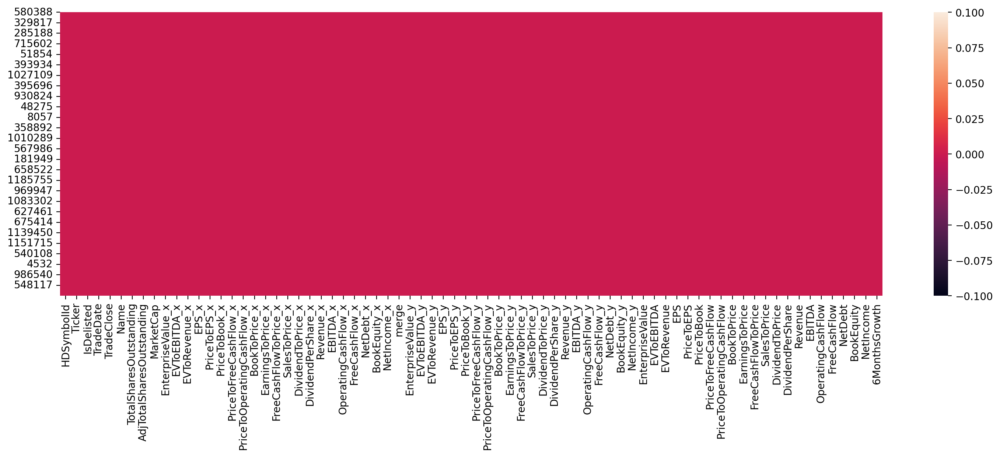

In [8]:
import seaborn as sns
data = s1.isna()
sns.heatmap(data);

In [9]:
from scipy.stats import norm

def calculate_outliers(data, column):
    q25 = data[column].quantile(0.25)
    q75 = data[column].quantile(0.75)
    iqr = q75 - q25
    boundaries = (q25 - 1.5 * iqr, q75 + 1.5 * iqr)
    return boundaries
    
def calculate_outliers_norm(data, column):    

    dmin = data[column].mean() - 3 * data[column].std()
    dmax = data[column].mean() + 3 * data[column].std()
    boundaries = (dmin, dmax)
    
    return boundaries

In [10]:
s1_clean = s1.copy()
out = calculate_outliers_norm(s1, 'MarketCap')
s1_clean = s1_clean[(s1_clean['MarketCap'] <= out[1]) & (s1_clean['MarketCap'] >= out[0])]
s1_clean

,HDSymbolId,Ticker,IsDelisted,TradeDate,TradeClose,Name,TotalSharesOutstanding,AdjTotalSharesOutstanding,MarketCap,EnterpriseValue_x,...,DividendToPrice,DividendPerShare,Revenue,EBITDA,OperatingCashFlow,FreeCashFlow,NetDebt,BookEquity,NetIncome,6MonthsGrowth
580388,21550,PSA,0,2016-06-14,238.12,QTR,173.00,173.00,41194.00,31000194.00,...,21434.37,5103951.00,2381696000.00,1737862000.00,1732569000.00,1667007000.00,259655000.00,9170641000.00,1311244000.00,0.00
555125,21550,PSA,0,2016-06-22,240.13,QTR,173.00,173.00,41542.00,31000542.00,...,21254.81,5103918.00,2381696000.00,1737862000.00,1732580000.00,1667007000.00,259655000.00,9170641000.00,1311244000.00,0.00
580573,21550,PSA,0,2016-06-13,240.35,QTR,173.00,173.00,41580.00,31000580.00,...,21235.38,5103925.00,2381696000.00,1737862000.00,1732578000.00,1667007000.00,259655000.00,9170641000.00,1311244000.00,0.00
579742,21550,PSA,0,2016-06-20,240.95,QTR,173.00,173.00,41684.00,31000684.00,...,21182.40,5103900.00,2381696000.00,1737862000.00,1732586000.00,1667007000.00,259655000.00,9170641000.00,1311244000.00,0.00
553402,21550,PSA,0,2016-06-23,241.00,QTR,173.00,173.00,41693.00,31000693.00,...,21177.83,5103857.00,2381696000.00,1737862000.00,1732601000.00,1667007000.00,259655000.00,9170641000.00,1311244000.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1211661,19486,CCL,0,2021-02-25,25.47,QTR,932485510000.00,932485510000.00,23750405783552.00,23767848783552.00,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1219890,19486,CCL,0,2021-02-22,25.97,QTR,932485510000.00,932485510000.00,24216648810496.00,24234091810496.00,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1222900,19486,CCL,0,2021-02-23,26.46,QTR,932485510000.00,932485510000.00,24673565802496.00,24691008802496.00,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1209866,19486,CCL,0,2021-02-26,26.75,QTR,932485510000.00,932485510000.00,24943987261440.00,24961430261440.00,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00


In [4]:
s1.columns

Index(['HDSymbolId', 'Ticker', 'IsDelisted', 'TradeDate', 'TradeClose', 'Name',
       'TotalSharesOutstanding', 'AdjTotalSharesOutstanding', 'MarketCap',
       'EnterpriseValue', 'EVToEBITDA', 'EVToRevenue', 'EPS', 'PriceToEPS',
       'PriceToBook', 'PEG', 'PriceToFreeCashFlow', 'PriceToOperatingCashFlow',
       'BookToPrice', 'EarningsToPrice', 'FreeCashFlowToPrice', 'SalesToPrice',
       'DividendToPrice', 'DividendPerShare', 'Revenue', 'EBITDA',
       'OperatingCashFlow', 'FreeCashFlow', 'NetDebt', 'BookEquity',
       'NetIncome', 'merge', '6MonthsGrowth'],
      dtype='object')

In [11]:
s1_clean = s1_clean.drop(columns=['HDSymbolId', 'IsDelisted', 'Name',
       'TotalSharesOutstanding', 'merge'])
s1_clean

,Ticker,TradeDate,TradeClose,AdjTotalSharesOutstanding,MarketCap,EnterpriseValue_x,EVToEBITDA_x,EVToRevenue_x,EPS_x,PriceToEPS_x,...,DividendToPrice,DividendPerShare,Revenue,EBITDA,OperatingCashFlow,FreeCashFlow,NetDebt,BookEquity,NetIncome,6MonthsGrowth
580388,PSA,2016-06-14,238.12,173.00,41194.00,31000194.00,0.07,0.05,1.39,171.31,...,21434.37,5103951.00,2381696000.00,1737862000.00,1732569000.00,1667007000.00,259655000.00,9170641000.00,1311244000.00,0.00
555125,PSA,2016-06-22,240.13,173.00,41542.00,31000542.00,0.07,0.05,1.39,172.76,...,21254.81,5103918.00,2381696000.00,1737862000.00,1732580000.00,1667007000.00,259655000.00,9170641000.00,1311244000.00,0.00
580573,PSA,2016-06-13,240.35,173.00,41580.00,31000580.00,0.07,0.05,1.39,172.91,...,21235.38,5103925.00,2381696000.00,1737862000.00,1732578000.00,1667007000.00,259655000.00,9170641000.00,1311244000.00,0.00
579742,PSA,2016-06-20,240.95,173.00,41684.00,31000684.00,0.07,0.05,1.39,173.35,...,21182.40,5103900.00,2381696000.00,1737862000.00,1732586000.00,1667007000.00,259655000.00,9170641000.00,1311244000.00,0.00
553402,PSA,2016-06-23,241.00,173.00,41693.00,31000693.00,0.07,0.05,1.39,173.38,...,21177.83,5103857.00,2381696000.00,1737862000.00,1732601000.00,1667007000.00,259655000.00,9170641000.00,1311244000.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1211661,CCL,2021-02-25,25.47,932485510000.00,23750405783552.00,23767848783552.00,-17645.02,679081.40,-2.42,-10.54,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1219890,CCL,2021-02-22,25.97,932485510000.00,24216648810496.00,24234091810496.00,-17991.16,692402.60,-2.42,-10.74,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1222900,CCL,2021-02-23,26.46,932485510000.00,24673565802496.00,24691008802496.00,-18330.37,705457.40,-2.42,-10.95,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1209866,CCL,2021-02-26,26.75,932485510000.00,24943987261440.00,24961430261440.00,-18531.13,713183.70,-2.42,-11.07,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00


In [12]:
s1_clean = s1_clean[s1_clean.MarketCap > 1000000]
s1_clean

,Ticker,TradeDate,TradeClose,AdjTotalSharesOutstanding,MarketCap,EnterpriseValue_x,EVToEBITDA_x,EVToRevenue_x,EPS_x,PriceToEPS_x,...,DividendToPrice,DividendPerShare,Revenue,EBITDA,OperatingCashFlow,FreeCashFlow,NetDebt,BookEquity,NetIncome,6MonthsGrowth
1075096,NBR,2020-04-23,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,9.72,2.00,3043383000.00,469093000.00,684557600.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1075614,NBR,2020-04-22,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,9.72,2.00,3043383000.00,469093000.00,684557600.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1075755,NBR,2020-04-21,0.22,7299780.00,1606681.00,3209098681.00,-10.05,4.47,-56.73,-0.00,...,9.07,2.00,3043383000.00,469093000.00,684557700.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1083676,NBR,2020-04-17,0.27,7299780.00,1990650.00,3209482650.00,-10.05,4.47,-56.73,-0.00,...,7.32,2.00,3043383000.00,469093000.00,684558000.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1081817,NBR,2020-04-20,0.27,7299780.00,2003789.00,3209495789.00,-10.05,4.47,-56.73,-0.00,...,7.27,2.00,3043383000.00,469093000.00,684557800.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1211661,CCL,2021-02-25,25.47,932485510000.00,23750405783552.00,23767848783552.00,-17645.02,679081.40,-2.42,-10.54,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1219890,CCL,2021-02-22,25.97,932485510000.00,24216648810496.00,24234091810496.00,-17991.16,692402.60,-2.42,-10.74,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1222900,CCL,2021-02-23,26.46,932485510000.00,24673565802496.00,24691008802496.00,-18330.37,705457.40,-2.42,-10.95,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1209866,CCL,2021-02-26,26.75,932485510000.00,24943987261440.00,24961430261440.00,-18531.13,713183.70,-2.42,-11.07,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00


In [53]:
s1.TradeDate = s1.TradeDate.astype('datetime64[]')
s1.TradeDate = s1.TradeDate.dt.strftime("%m/%d/%Y")
s1

TypeError: Invalid datetime metadata string "[]"

In [13]:
s1_clean.rename(columns = {'TradeDate':'Date/Time'}, inplace = True )
s1_clean

,Ticker,Date/Time,TradeClose,AdjTotalSharesOutstanding,MarketCap,EnterpriseValue_x,EVToEBITDA_x,EVToRevenue_x,EPS_x,PriceToEPS_x,...,DividendToPrice,DividendPerShare,Revenue,EBITDA,OperatingCashFlow,FreeCashFlow,NetDebt,BookEquity,NetIncome,6MonthsGrowth
1075096,NBR,2020-04-23,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,9.72,2.00,3043383000.00,469093000.00,684557600.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1075614,NBR,2020-04-22,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,9.72,2.00,3043383000.00,469093000.00,684557600.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1075755,NBR,2020-04-21,0.22,7299780.00,1606681.00,3209098681.00,-10.05,4.47,-56.73,-0.00,...,9.07,2.00,3043383000.00,469093000.00,684557700.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1083676,NBR,2020-04-17,0.27,7299780.00,1990650.00,3209482650.00,-10.05,4.47,-56.73,-0.00,...,7.32,2.00,3043383000.00,469093000.00,684558000.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1081817,NBR,2020-04-20,0.27,7299780.00,2003789.00,3209495789.00,-10.05,4.47,-56.73,-0.00,...,7.27,2.00,3043383000.00,469093000.00,684557800.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1211661,CCL,2021-02-25,25.47,932485510000.00,23750405783552.00,23767848783552.00,-17645.02,679081.40,-2.42,-10.54,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1219890,CCL,2021-02-22,25.97,932485510000.00,24216648810496.00,24234091810496.00,-17991.16,692402.60,-2.42,-10.74,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1222900,CCL,2021-02-23,26.46,932485510000.00,24673565802496.00,24691008802496.00,-18330.37,705457.40,-2.42,-10.95,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1209866,CCL,2021-02-26,26.75,932485510000.00,24943987261440.00,24961430261440.00,-18531.13,713183.70,-2.42,-11.07,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00


In [7]:
null = pd.DataFrame(s1.isna().sum() * 100 / len(s1)).sort_values(by=[0], ascending=False)
null[null[0]>10].index

Index(['TradeCycleDaysAndTTM', 'InventoryTurnoverDaysAndTTM',
       'AccountsPayableTurnoverDaysAndTTM', 'DividendPercentTTM',
       'TrailingDividentYield', 'ForwardDividentYield',
       'ExpectedAnnualDividends', 'AltmanZscoreAndTTM',
       'LongTermDebtToLongTermCapitalAndFY',
       'ReturnOnInvestedCapitalPercentAndTTM', 'CashRatioAndFY',
       'QuickRatioAndFY', 'CurrentRatioAndFY',
       'ReceivablesCollectionPeriodDaysAndTTM', 'GrossMarginPercentAndTTM',
       'EnterpriseValueEBITDAndTTM', 'AdjustedEBITDAPercentGrowthAndTTM'],
      dtype='object')

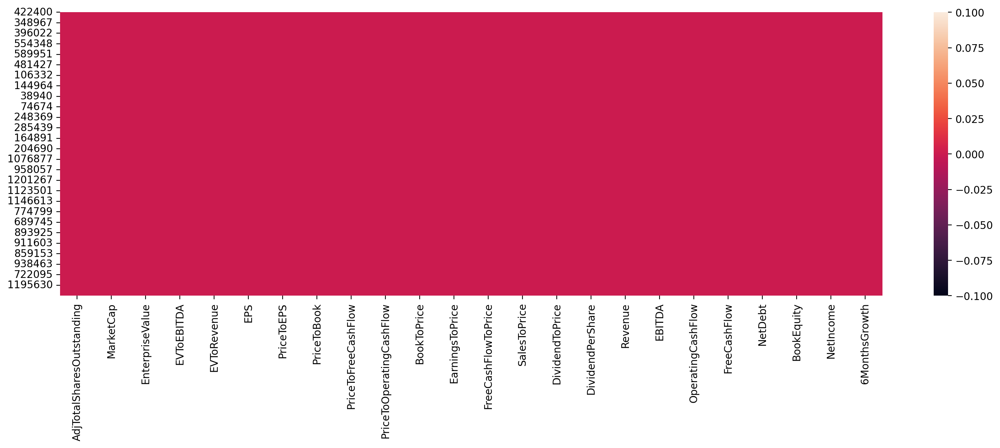

In [22]:
import seaborn as sns
data = s1.isna()
sns.heatmap(data);

In [14]:
s1_clean = s1_clean[s1_clean['Revenue'] > 0]
s1_clean

,Ticker,Date/Time,TradeClose,AdjTotalSharesOutstanding,MarketCap,EnterpriseValue_x,EVToEBITDA_x,EVToRevenue_x,EPS_x,PriceToEPS_x,...,DividendToPrice,DividendPerShare,Revenue,EBITDA,OperatingCashFlow,FreeCashFlow,NetDebt,BookEquity,NetIncome,6MonthsGrowth
1075096,NBR,2020-04-23,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,9.72,2.00,3043383000.00,469093000.00,684557600.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1075614,NBR,2020-04-22,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,9.72,2.00,3043383000.00,469093000.00,684557600.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1075755,NBR,2020-04-21,0.22,7299780.00,1606681.00,3209098681.00,-10.05,4.47,-56.73,-0.00,...,9.07,2.00,3043383000.00,469093000.00,684557700.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1083676,NBR,2020-04-17,0.27,7299780.00,1990650.00,3209482650.00,-10.05,4.47,-56.73,-0.00,...,7.32,2.00,3043383000.00,469093000.00,684558000.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1081817,NBR,2020-04-20,0.27,7299780.00,2003789.00,3209495789.00,-10.05,4.47,-56.73,-0.00,...,7.27,2.00,3043383000.00,469093000.00,684557800.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1211661,CCL,2021-02-25,25.47,932485510000.00,23750405783552.00,23767848783552.00,-17645.02,679081.40,-2.42,-10.54,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1219890,CCL,2021-02-22,25.97,932485510000.00,24216648810496.00,24234091810496.00,-17991.16,692402.60,-2.42,-10.74,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1222900,CCL,2021-02-23,26.46,932485510000.00,24673565802496.00,24691008802496.00,-18330.37,705457.40,-2.42,-10.95,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1209866,CCL,2021-02-26,26.75,932485510000.00,24943987261440.00,24961430261440.00,-18531.13,713183.70,-2.42,-11.07,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00


In [18]:
s1_clean = s1_clean[s1_clean['Revenue_x'] > 0]
s1_clean = s1_clean[s1_clean['Revenue_y'] > 0]
s1_clean

,Ticker,Date/Time,TradeClose,AdjTotalSharesOutstanding,MarketCap,EnterpriseValue_x,EVToEBITDA_x,EVToRevenue_x,EPS_x,PriceToEPS_x,...,DividendToPrice,DividendPerShare,Revenue,EBITDA,OperatingCashFlow,FreeCashFlow,NetDebt,BookEquity,NetIncome,6MonthsGrowth
1075096,NBR,2020-04-23,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,9.72,2.00,3043383000.00,469093000.00,684557600.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1075614,NBR,2020-04-22,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,9.72,2.00,3043383000.00,469093000.00,684557600.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1075755,NBR,2020-04-21,0.22,7299780.00,1606681.00,3209098681.00,-10.05,4.47,-56.73,-0.00,...,9.07,2.00,3043383000.00,469093000.00,684557700.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1083676,NBR,2020-04-17,0.27,7299780.00,1990650.00,3209482650.00,-10.05,4.47,-56.73,-0.00,...,7.32,2.00,3043383000.00,469093000.00,684558000.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1081817,NBR,2020-04-20,0.27,7299780.00,2003789.00,3209495789.00,-10.05,4.47,-56.73,-0.00,...,7.27,2.00,3043383000.00,469093000.00,684557800.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1211661,CCL,2021-02-25,25.47,932485510000.00,23750405783552.00,23767848783552.00,-17645.02,679081.40,-2.42,-10.54,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1219890,CCL,2021-02-22,25.97,932485510000.00,24216648810496.00,24234091810496.00,-17991.16,692402.60,-2.42,-10.74,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1222900,CCL,2021-02-23,26.46,932485510000.00,24673565802496.00,24691008802496.00,-18330.37,705457.40,-2.42,-10.95,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1209866,CCL,2021-02-26,26.75,932485510000.00,24943987261440.00,24961430261440.00,-18531.13,713183.70,-2.42,-11.07,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00


In [15]:

out = calculate_outliers_norm(s1, 'DividendToPrice')
s1_clean = s1_clean[(s1_clean['DividendToPrice'] <= out[1]) & (s1_clean['DividendToPrice'] >= out[0])]
s1_clean

,Ticker,Date/Time,TradeClose,AdjTotalSharesOutstanding,MarketCap,EnterpriseValue_x,EVToEBITDA_x,EVToRevenue_x,EPS_x,PriceToEPS_x,...,DividendToPrice,DividendPerShare,Revenue,EBITDA,OperatingCashFlow,FreeCashFlow,NetDebt,BookEquity,NetIncome,6MonthsGrowth
1075096,NBR,2020-04-23,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,9.72,2.00,3043383000.00,469093000.00,684557600.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1075614,NBR,2020-04-22,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,9.72,2.00,3043383000.00,469093000.00,684557600.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1075755,NBR,2020-04-21,0.22,7299780.00,1606681.00,3209098681.00,-10.05,4.47,-56.73,-0.00,...,9.07,2.00,3043383000.00,469093000.00,684557700.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1083676,NBR,2020-04-17,0.27,7299780.00,1990650.00,3209482650.00,-10.05,4.47,-56.73,-0.00,...,7.32,2.00,3043383000.00,469093000.00,684558000.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1081817,NBR,2020-04-20,0.27,7299780.00,2003789.00,3209495789.00,-10.05,4.47,-56.73,-0.00,...,7.27,2.00,3043383000.00,469093000.00,684557800.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1211661,CCL,2021-02-25,25.47,932485510000.00,23750405783552.00,23767848783552.00,-17645.02,679081.40,-2.42,-10.54,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1219890,CCL,2021-02-22,25.97,932485510000.00,24216648810496.00,24234091810496.00,-17991.16,692402.60,-2.42,-10.74,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1222900,CCL,2021-02-23,26.46,932485510000.00,24673565802496.00,24691008802496.00,-18330.37,705457.40,-2.42,-10.95,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1209866,CCL,2021-02-26,26.75,932485510000.00,24943987261440.00,24961430261440.00,-18531.13,713183.70,-2.42,-11.07,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00


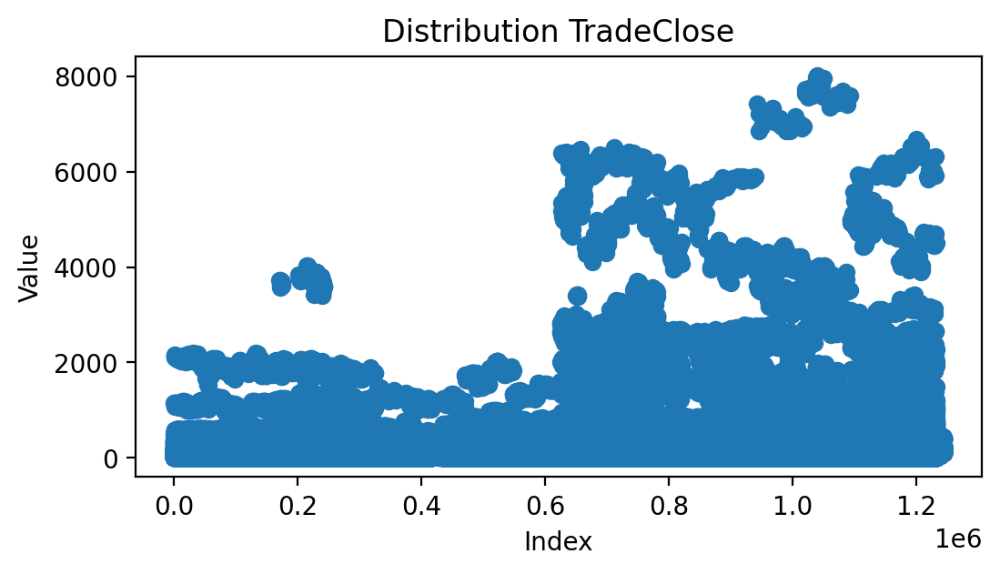

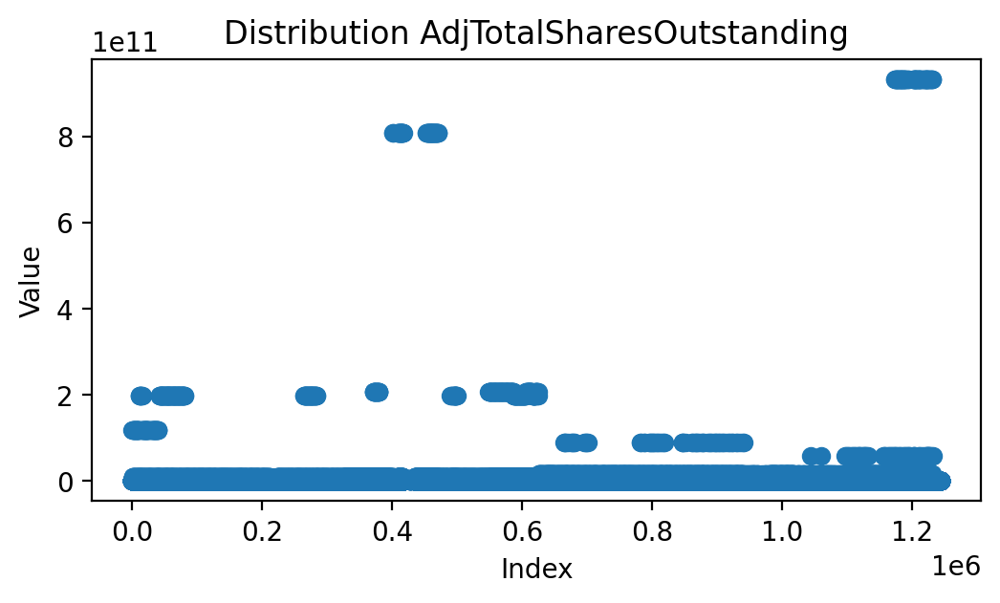

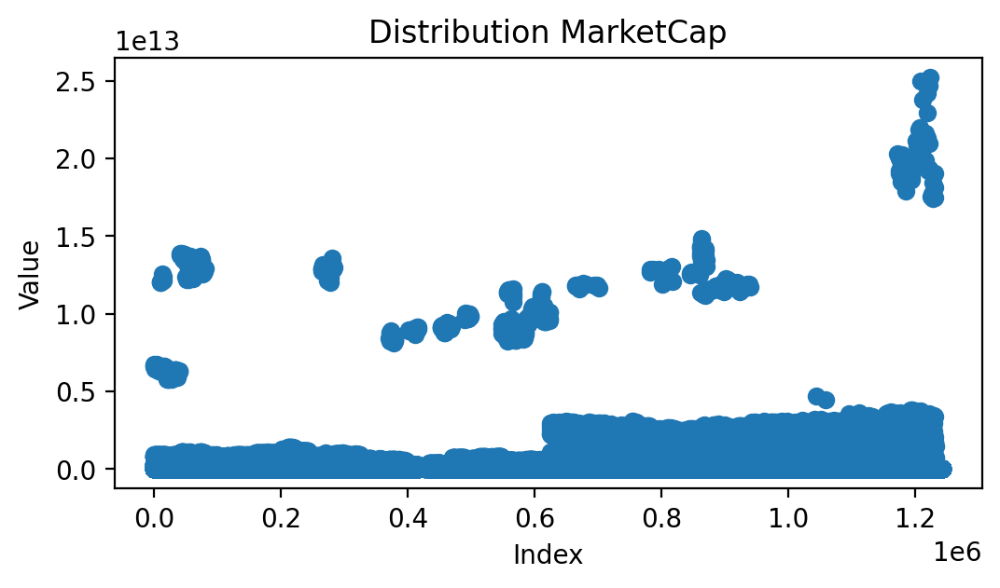

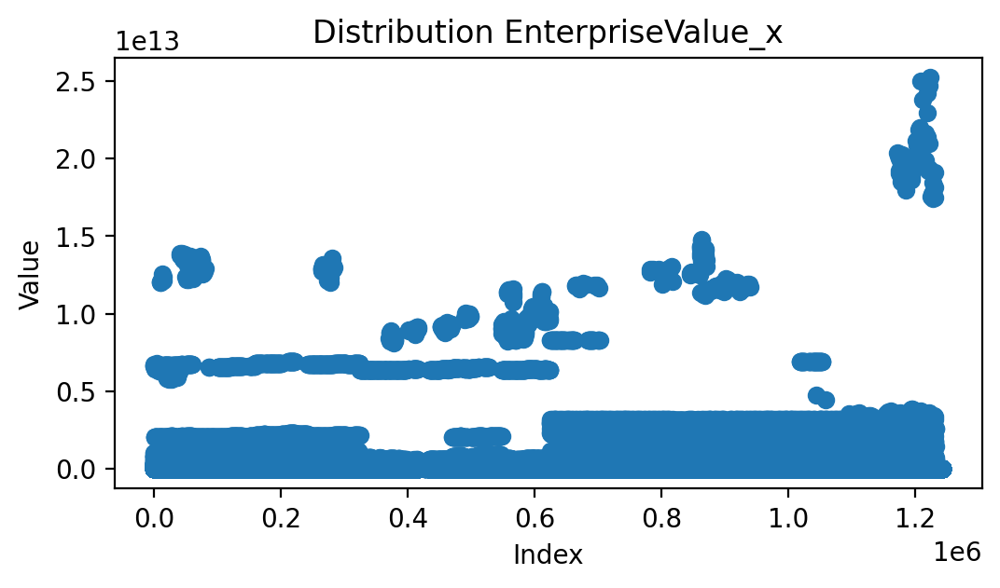

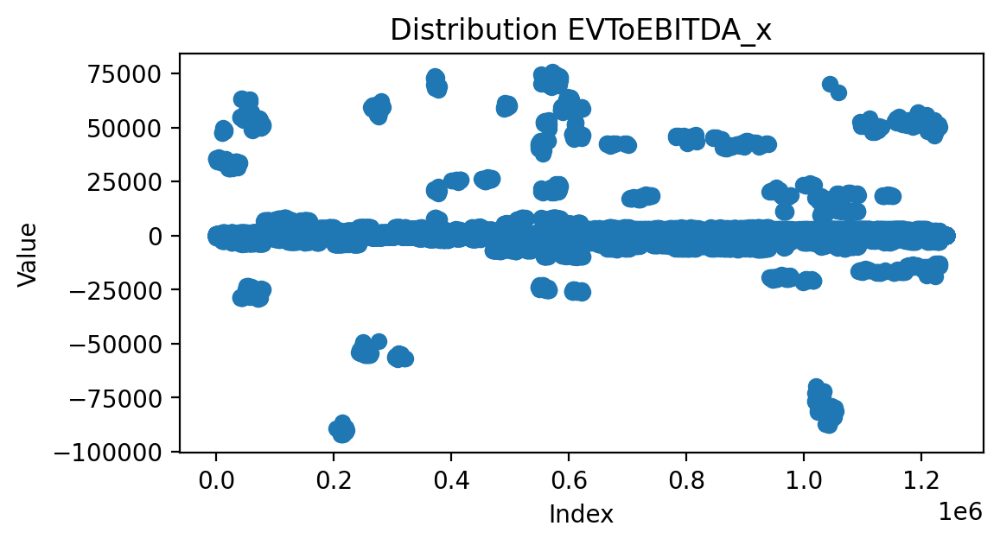

...

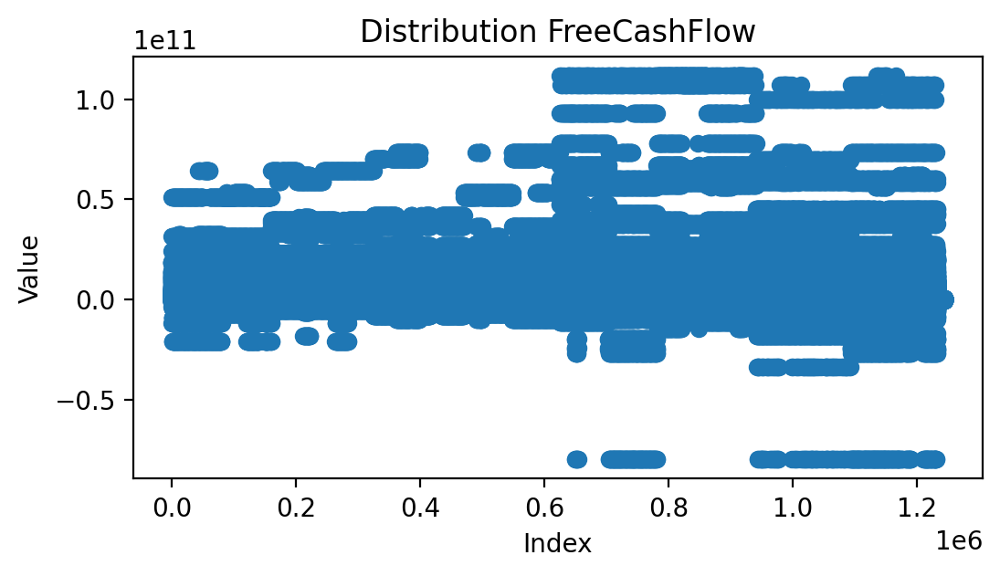

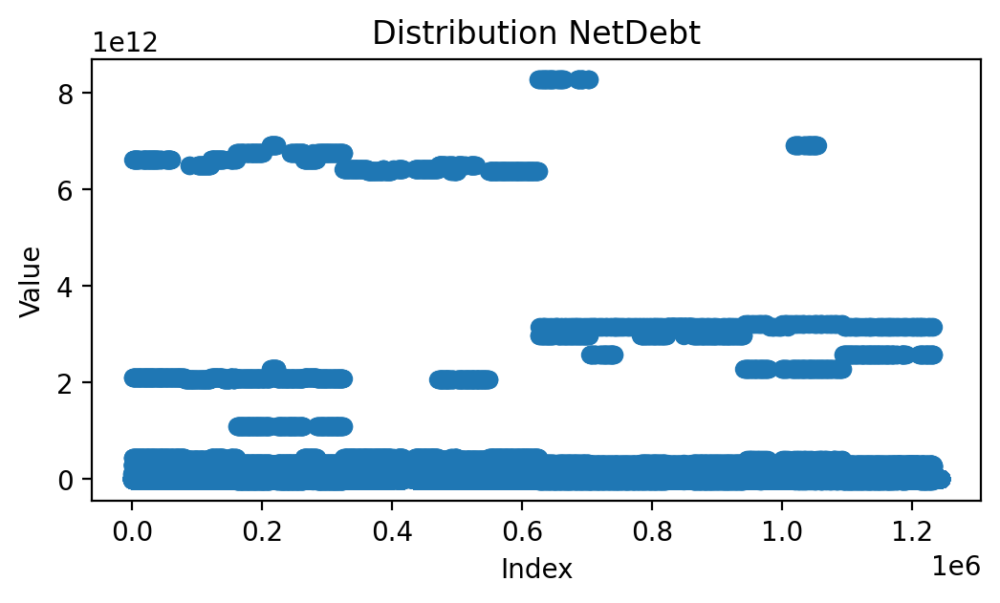

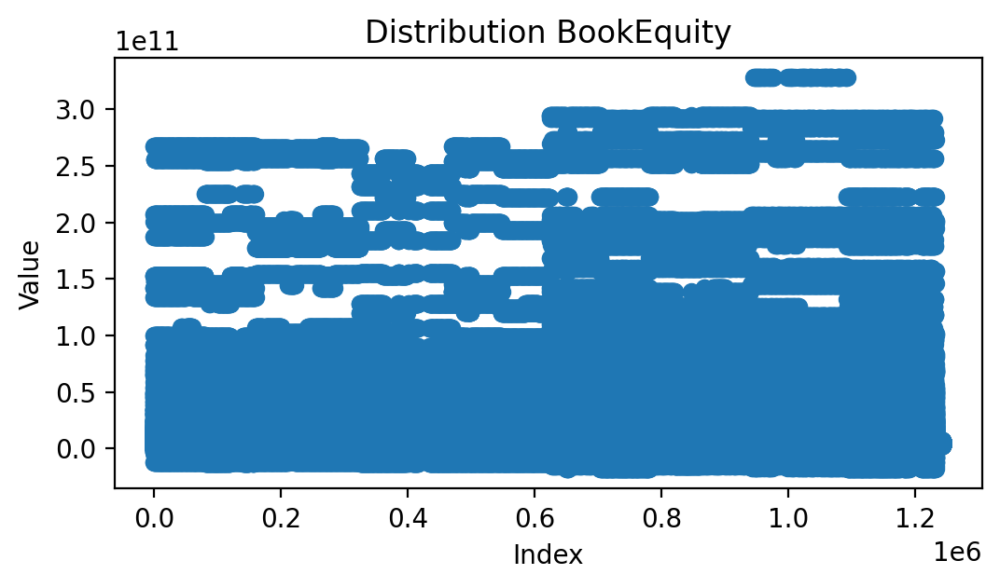

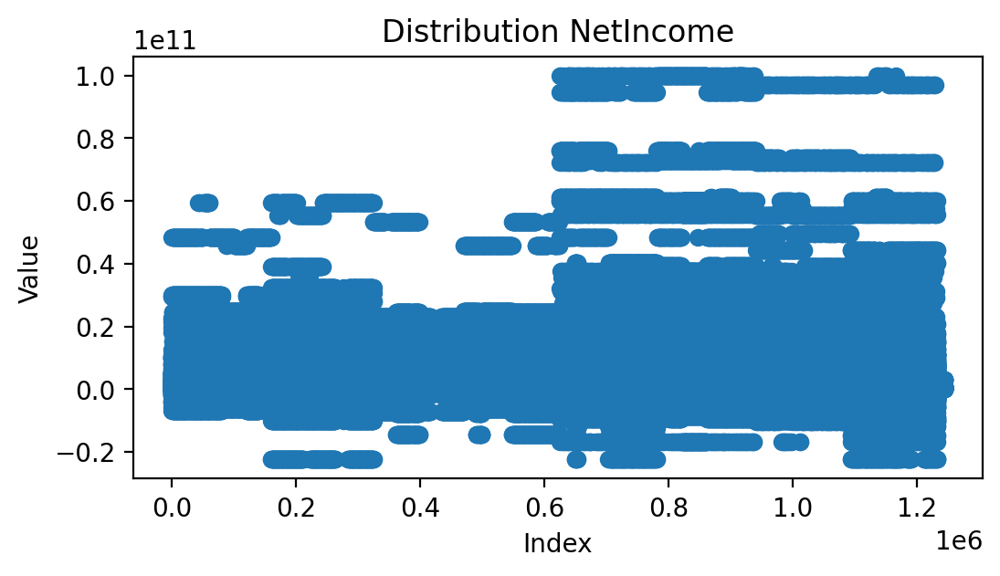

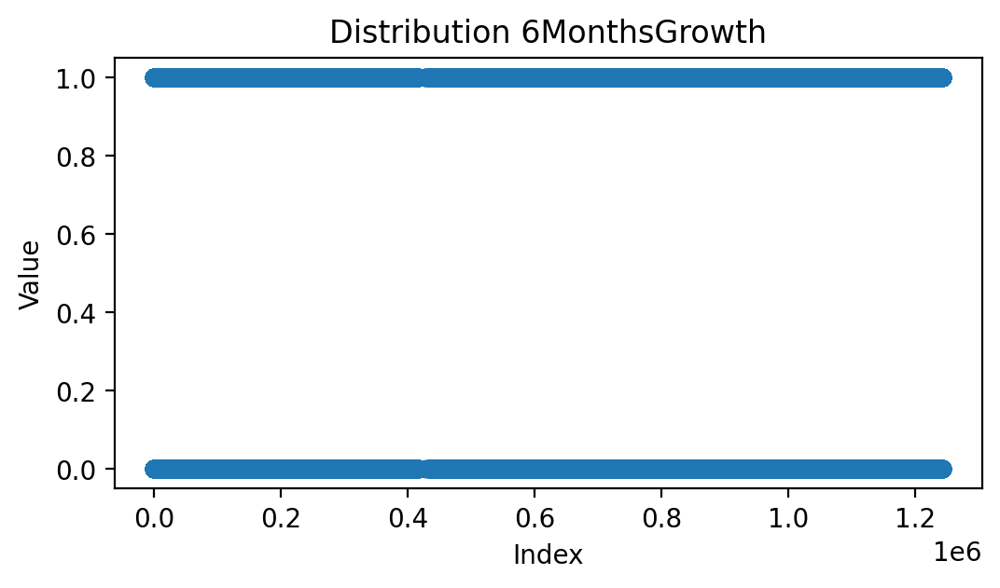

In [17]:
for i in s1_clean.drop(columns=['Ticker', 'Date/Time']).columns:
    plt.figure(figsize=(6, 3))
    plt.scatter( s1_clean.index, s1_clean[i])
    plt.xlabel('Index')
    plt.ylabel('Value')

    plt.title(f'Distribution {i}');
    plt.show()

In [71]:
s1_clean.to_csv('D:\\Michael\\Data\\ML new\\Fundamental SP500 QTR clean.csv', index=False)
s1_clean

,Ticker,TradeDate,TradeClose,AdjTotalSharesOutstanding,MarketCap,EnterpriseValue,EVToEBITDA,EVToRevenue,EPS,PriceToEPS,...,DividendToPrice,DividendPerShare,Revenue,EBITDA,OperatingCashFlow,FreeCashFlow,NetDebt,BookEquity,NetIncome,6MonthsGrowth
1075096,NBR,2020-04-23,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,2.45,0.50,718364000.00,-319412000.00,59161960.00,-268000.00,3207492000.00,1555921000.00,-391827000.00,1.00
1075614,NBR,2020-04-22,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,2.45,0.50,718364000.00,-319412000.00,59161960.00,-268000.00,3207492000.00,1555921000.00,-391827000.00,1.00
1075755,NBR,2020-04-21,0.22,7299780.00,1606681.00,3209098681.00,-10.05,4.47,-56.73,-0.00,...,2.29,0.50,718364000.00,-319412000.00,59161980.00,-268000.00,3207492000.00,1555921000.00,-391827000.00,1.00
1083676,NBR,2020-04-17,0.27,7299780.00,1990650.00,3209482650.00,-10.05,4.47,-56.73,-0.00,...,1.84,0.50,718364000.00,-319412000.00,59162000.00,-268000.00,3207492000.00,1555921000.00,-391827000.00,1.00
1081817,NBR,2020-04-20,0.27,7299780.00,2003789.00,3209495789.00,-10.05,4.47,-56.73,-0.00,...,1.83,0.50,718364000.00,-319412000.00,59161980.00,-268000.00,3207492000.00,1555921000.00,-391827000.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1211661,CCL,2021-02-25,25.47,932485510000.00,23750405783552.00,23767848783552.00,-17645.02,679081.40,-2.42,-10.54,...,0.00,0.00,35000000.00,-1347000000.00,-1652000000.00,-3373000000.00,17443000000.00,20555000000.00,-2223000000.00,0.00
1219890,CCL,2021-02-22,25.97,932485510000.00,24216648810496.00,24234091810496.00,-17991.16,692402.60,-2.42,-10.74,...,0.00,0.00,35000000.00,-1347000000.00,-1652000000.00,-3373000000.00,17443000000.00,20555000000.00,-2223000000.00,0.00
1222900,CCL,2021-02-23,26.46,932485510000.00,24673565802496.00,24691008802496.00,-18330.37,705457.40,-2.42,-10.95,...,0.00,0.00,35000000.00,-1347000000.00,-1652000000.00,-3373000000.00,17443000000.00,20555000000.00,-2223000000.00,0.00
1209866,CCL,2021-02-26,26.75,932485510000.00,24943987261440.00,24961430261440.00,-18531.13,713183.70,-2.42,-11.07,...,0.00,0.00,35000000.00,-1347000000.00,-1652000000.00,-3373000000.00,17443000000.00,20555000000.00,-2223000000.00,0.00


In [77]:
s1_clean['TradeDate'] = s1_clean['TradeDate'].astype('datetime64[ns]')
s1_clean['TradeDate']  = s1_clean['TradeDate'].dt.strftime("%m/%d/%Y")
s1_clean

,Ticker,TradeDate,TradeClose,AdjTotalSharesOutstanding,MarketCap,EnterpriseValue,EVToEBITDA,EVToRevenue,EPS,PriceToEPS,...,DividendToPrice,DividendPerShare,Revenue,EBITDA,OperatingCashFlow,FreeCashFlow,NetDebt,BookEquity,NetIncome,6MonthsGrowth
1075096,NBR,04/23/2020,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,2.45,0.50,718364000.00,-319412000.00,59161960.00,-268000.00,3207492000.00,1555921000.00,-391827000.00,1.00
1075614,NBR,04/22/2020,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,2.45,0.50,718364000.00,-319412000.00,59161960.00,-268000.00,3207492000.00,1555921000.00,-391827000.00,1.00
1075755,NBR,04/21/2020,0.22,7299780.00,1606681.00,3209098681.00,-10.05,4.47,-56.73,-0.00,...,2.29,0.50,718364000.00,-319412000.00,59161980.00,-268000.00,3207492000.00,1555921000.00,-391827000.00,1.00
1083676,NBR,04/17/2020,0.27,7299780.00,1990650.00,3209482650.00,-10.05,4.47,-56.73,-0.00,...,1.84,0.50,718364000.00,-319412000.00,59162000.00,-268000.00,3207492000.00,1555921000.00,-391827000.00,1.00
1081817,NBR,04/20/2020,0.27,7299780.00,2003789.00,3209495789.00,-10.05,4.47,-56.73,-0.00,...,1.83,0.50,718364000.00,-319412000.00,59161980.00,-268000.00,3207492000.00,1555921000.00,-391827000.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1211661,CCL,02/25/2021,25.47,932485510000.00,23750405783552.00,23767848783552.00,-17645.02,679081.40,-2.42,-10.54,...,0.00,0.00,35000000.00,-1347000000.00,-1652000000.00,-3373000000.00,17443000000.00,20555000000.00,-2223000000.00,0.00
1219890,CCL,02/22/2021,25.97,932485510000.00,24216648810496.00,24234091810496.00,-17991.16,692402.60,-2.42,-10.74,...,0.00,0.00,35000000.00,-1347000000.00,-1652000000.00,-3373000000.00,17443000000.00,20555000000.00,-2223000000.00,0.00
1222900,CCL,02/23/2021,26.46,932485510000.00,24673565802496.00,24691008802496.00,-18330.37,705457.40,-2.42,-10.95,...,0.00,0.00,35000000.00,-1347000000.00,-1652000000.00,-3373000000.00,17443000000.00,20555000000.00,-2223000000.00,0.00
1209866,CCL,02/26/2021,26.75,932485510000.00,24943987261440.00,24961430261440.00,-18531.13,713183.70,-2.42,-11.07,...,0.00,0.00,35000000.00,-1347000000.00,-1652000000.00,-3373000000.00,17443000000.00,20555000000.00,-2223000000.00,0.00


In [32]:
df_merged = s1_clean.copy()

In [33]:
df_merged['Date/Time'] = df_merged['Date/Time'].astype('datetime64[ns]')
df_merged['Date/Time']  = df_merged['Date/Time'].dt.strftime("%m/%d/%Y")
df_merged['Date/Time'] = df_merged['Date/Time'].astype('datetime64[ns]')
df_merged

,Ticker,Date/Time,TradeClose,AdjTotalSharesOutstanding,MarketCap,EnterpriseValue_x,EVToEBITDA_x,EVToRevenue_x,EPS_x,PriceToEPS_x,...,DividendToPrice,DividendPerShare,Revenue,EBITDA,OperatingCashFlow,FreeCashFlow,NetDebt,BookEquity,NetIncome,6MonthsGrowth
1075096,NBR,2020-04-23,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,9.72,2.00,3043383000.00,469093000.00,684557600.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1075614,NBR,2020-04-22,0.21,7299780.00,1499374.00,3208991374.00,-10.05,4.47,-56.73,-0.00,...,9.72,2.00,3043383000.00,469093000.00,684557600.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1075755,NBR,2020-04-21,0.22,7299780.00,1606681.00,3209098681.00,-10.05,4.47,-56.73,-0.00,...,9.07,2.00,3043383000.00,469093000.00,684557700.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1083676,NBR,2020-04-17,0.27,7299780.00,1990650.00,3209482650.00,-10.05,4.47,-56.73,-0.00,...,7.32,2.00,3043383000.00,469093000.00,684558000.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
1081817,NBR,2020-04-20,0.27,7299780.00,2003789.00,3209495789.00,-10.05,4.47,-56.73,-0.00,...,7.27,2.00,3043383000.00,469093000.00,684557800.00,256817000.00,2897791000.00,1982811000.00,-702885000.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1211661,CCL,2021-02-25,25.47,932485510000.00,23750405783552.00,23767848783552.00,-17645.02,679081.40,-2.42,-10.54,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1219890,CCL,2021-02-22,25.97,932485510000.00,24216648810496.00,24234091810496.00,-17991.16,692402.60,-2.42,-10.74,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1222900,CCL,2021-02-23,26.46,932485510000.00,24673565802496.00,24691008802496.00,-18330.37,705457.40,-2.42,-10.95,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00
1209866,CCL,2021-02-26,26.75,932485510000.00,24943987261440.00,24961430261440.00,-18531.13,713183.70,-2.42,-11.07,...,0.00,0.00,5595000000.00,-7117000000.00,-6301000000.00,-9921000000.00,17443000000.00,20555000000.00,-10236000000.00,0.00


2016
roc_auc = 0.57
Time to train = 41.38 seconds
max precision 0.8271204754186926


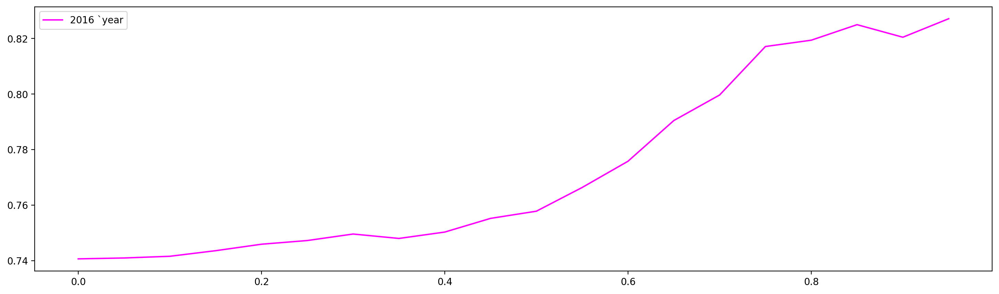

2017
roc_auc = 0.59
Time to train = 112.05 seconds
max precision 0.9310122501611864


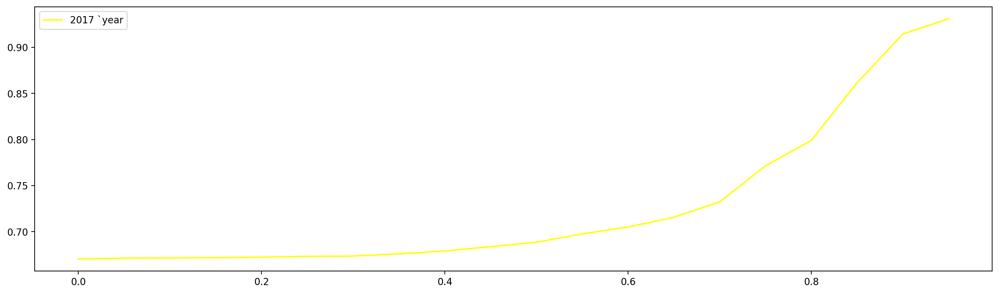

2018
roc_auc = 0.57
Time to train = 193.45 seconds
max precision 0.9481382978723404


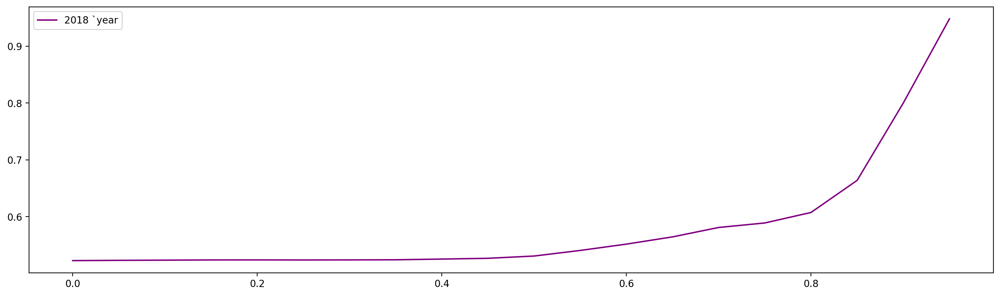

2019
roc_auc = 0.61
Time to train = 286.18 seconds
max precision 0.9871897518014412


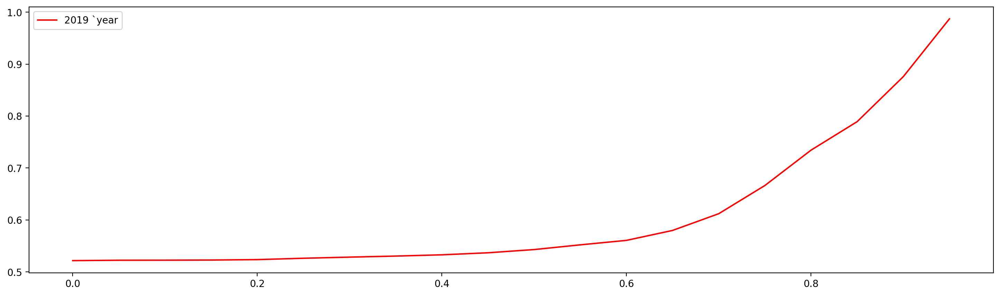

2020
roc_auc = 0.74
Time to train = 394.95 seconds
max precision 1.0


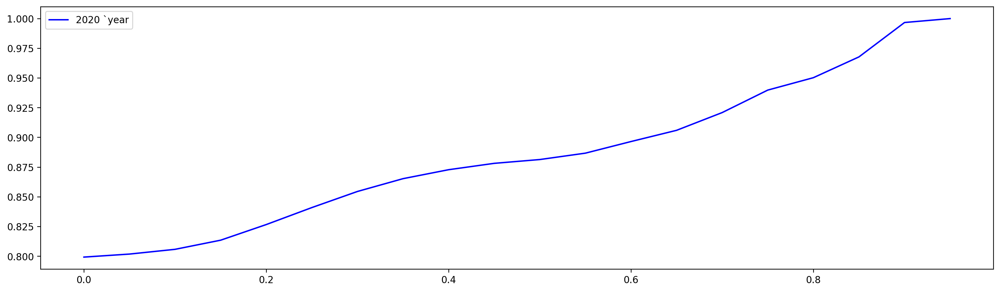

2021
roc_auc = 0.64
Time to train = 488.79 seconds
max precision 0.9417360285374554


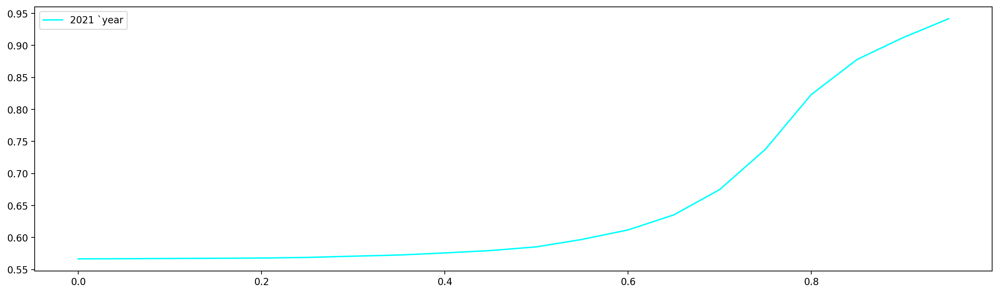

2022
roc_auc = 0.63
Time to train = 651.72 seconds
max precision 0.7961783439490446


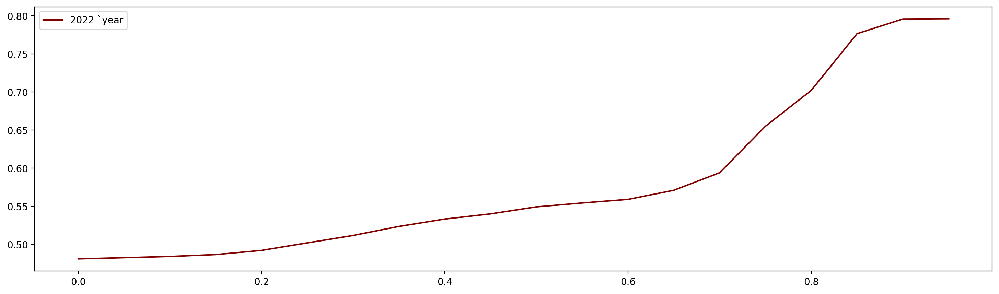

2023
roc_auc = 0.57
Time to train = 791.00 seconds
max precision 0.9869494290375204


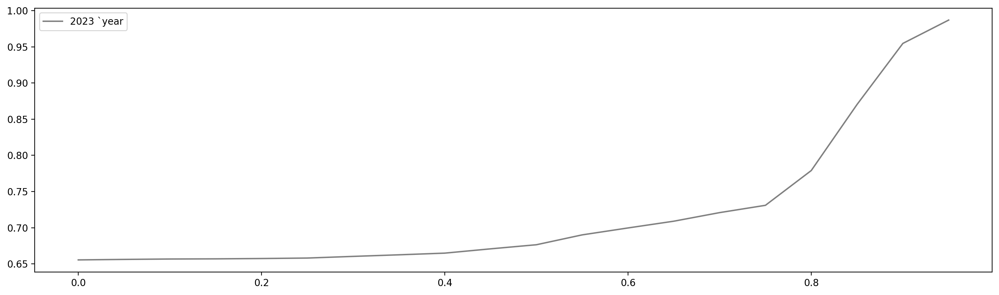

AttributeError: 'DataFrame' object has no attribute 'append'

In [34]:
colors = {2014: 'green', 2015: 'olive', 2016: 'magenta', 2017: 'yellow', 2018: 'purple',
         2019: 'red', 2020: 'blue', 2021: 'cyan', 2022: 'maroon', 2023: 'grey'}

percent_profit = pd.DataFrame(columns=['Ticker', 'Date/Time', 'prediction'])
for i in range (2015, 2023):
    train = df_merged[(df_merged['Date/Time'].dt.year <= i)]
    test = df_merged[df_merged['Date/Time'].dt.year == i+1]
    ticker_date = test[['Ticker', 'Date/Time']]
    train = train.drop(columns=['Ticker', 'Date/Time'])
    test = test.drop(columns=['Ticker', 'Date/Time'])
    X_train = train.drop(columns=['6MonthsGrowth'])
    X_test = test.drop(columns=['6MonthsGrowth'])
    y_train = train['6MonthsGrowth']
    y_test = test['6MonthsGrowth']

    std_scaler = MinMaxScaler()
    std_scaler.fit(X_train)
    std_scaled = std_scaler.transform(X_train)
    std_scaled_test = std_scaler.transform(X_test)
    X_train[X_train.columns] = std_scaled
    X_test[X_test.columns] = std_scaled_test


    t0 = time.time()
    lr_model = RandomForestClassifier(random_state=200, class_weight='balanced_subsample')
    lr_model.fit(X_train, y_train)


    lr_y = y_test.values

    lr_y_pred = lr_model.predict_proba(X_test)
    tF = time.time()


    lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
    
    print(str(i+1))
    print('roc_auc = %.2f' % lr_rocauc)
    print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
    probs_val = lr_y_pred[:,1]
    ticker_date['Ticker'] = ticker_date.Ticker + "_VALUERANK-ALL"
    ticker_date['prediction'] = np.round(probs_val * 100, 2)

    percent_profit = pd.concat([percent_profit, ticker_date], ignore_index=True)
    precision = []
    max_prec = 0
    for j in np.arange(0,1,0.05):

        cl = (probs_val > j).astype(int)
        precision.append(precision_score(y_test, cl))

        if (precision_score(y_test, cl) > max_prec):
            max_prec = precision_score(y_test, cl)
    print(f'max precision {max_prec}')
    color = colors[i+1]
    plt.plot(np.arange(0,1,0.05), precision, color=color, label=f'{i+1} `year')
    plt.legend()
    plt.show()
result = pd.DataFrame(columns=['Ticker', 'Date/Time', 'prediction', 'rank'])
percent_profit['Date/Time'] = pd.to_datetime(percent_profit['Date/Time'], format='%Y-%m-%d')
percent_profit = percent_profit.sort_values(by=['Date/Time', 'prediction'], ascending = False)
dates = percent_profit['Date/Time'].unique()
n = 0
for k in dates:
    n += 1
    
    dat = percent_profit[percent_profit['Date/Time'] == k]
    dat['rank'] = np.arange(1, len(dat)+1)

    result = pd.concat([result, dat], ignore_index=True)
result.to_csv('D:\\Michael\\Data\\ML new\\ValueRank Base ALL' + '.csv', index=False)

In [35]:
for k in dates:
    n += 1
    
    dat = percent_profit[percent_profit['Date/Time'] == k]
    dat['rank'] = np.arange(1, len(dat)+1)

    result = pd.concat([result, dat], ignore_index=True)
result.to_csv('D:\\Michael\\Data\\ML new\\ValueRank Base ALL' + '.csv', index=False)

In [1]:
features = X_train.columns
importances = lr_model.feature_importances_
indices = np.argsort(importances)[112:]
plt.figure(figsize=(15, 15))
plt.title('Feature Importances Forest')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

NameError: name 'X_train' is not defined

In [22]:
S['Date/Time'] = S['Date/Time'].astype('datetime64')
train = S[(S['Date/Time'].dt.year <= 2020)]
test = S[S['Date/Time'].dt.year == 2021]
train = train.drop(columns=['Ticker', 'Date/Time'])
test = test.drop(columns=['Ticker', 'Date/Time'])
X_train = train.drop(columns=['value'])
y_train = train['value']
X_test = test.drop(columns=['value'])
y_test = test['value']
X_test

,PricePercentChange1Day,PricePercentChange1Week,PricePercentChange4Week,PricePercentChange26Week,PricePercentChange52Week,PricePercentChangeYTD,Beta1Year,Beta3Year,Beta5Year,PriceEarningsAndTTM,...,OperatingCashFlowPercentGrowthAndTTM,PricePercentChange13Week,Month,MC,Business_Quality,Day_of_week,SMA,VQ,SmithRank,Trend
16181,0.08,0.05,0.12,1.57,1.20,0.60,1.90,1.59,3.32,-3.54,...,-0.28,0.39,5.00,5.00,-0.32,5.00,118.00,47.53,110.48,1.00
16183,-0.01,0.10,0.19,1.30,1.09,0.65,1.89,1.60,3.32,-13.14,...,-0.28,0.39,5.00,5.00,-0.32,2.00,118.00,47.71,112.48,1.00
16184,-0.01,0.10,0.19,1.19,1.08,0.63,1.89,1.60,3.32,-13.00,...,-0.28,0.36,5.00,5.00,-0.32,3.00,118.00,47.71,113.48,1.00
16185,-0.01,0.01,0.14,1.19,1.22,0.62,1.87,1.59,3.32,-12.92,...,-0.28,0.30,5.00,5.00,-0.32,4.00,118.00,47.71,114.48,1.00
16186,-0.03,-0.02,0.11,1.21,1.12,0.57,1.87,1.59,3.32,-12.50,...,-0.28,0.28,5.00,5.00,-0.32,5.00,118.00,47.71,115.48,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1184562,0.01,0.00,0.07,0.20,0.17,0.14,0.37,0.61,0.44,29.07,...,0.02,0.11,12.00,6.00,0.63,4.00,167.00,15.01,440.15,1.00
1184564,0.01,0.03,0.09,0.20,0.17,0.16,0.38,0.61,0.44,29.56,...,0.02,0.14,12.00,6.00,0.63,2.00,167.00,14.97,442.15,1.00
1184565,0.01,0.03,0.13,0.21,0.18,0.17,0.37,0.61,0.44,29.72,...,0.02,0.16,12.00,6.00,0.63,3.00,167.00,14.97,443.15,1.00
1184566,0.01,0.03,0.12,0.22,0.19,0.18,0.38,0.61,0.44,29.96,...,0.02,0.16,12.00,6.00,0.63,4.00,167.00,14.97,444.15,1.00


In [23]:
std_scaler = MinMaxScaler()
std_scaler.fit(X_train)
std_scaled = std_scaler.transform(X_train)
std_scaled_test = std_scaler.transform(X_test)
X_train[X_train.columns] = std_scaled
X_test[X_test.columns] = std_scaled_test
X_train

,PricePercentChange1Day,PricePercentChange1Week,PricePercentChange4Week,PricePercentChange26Week,PricePercentChange52Week,PricePercentChangeYTD,Beta1Year,Beta3Year,Beta5Year,PriceEarningsAndTTM,...,OperatingCashFlowPercentGrowthAndTTM,PricePercentChange13Week,Month,MC,Business_Quality,Day_of_week,SMA,VQ,SmithRank,Trend
566,0.54,0.39,0.31,0.19,0.17,0.35,0.35,0.34,0.22,0.52,...,0.21,0.36,0.25,0.67,0.58,0.40,0.65,0.14,0.29,0.00
567,0.54,0.41,0.30,0.18,0.17,0.35,0.35,0.33,0.22,0.52,...,0.21,0.37,0.25,0.67,0.58,0.60,0.65,0.14,0.29,0.00
568,0.54,0.41,0.30,0.18,0.17,0.35,0.35,0.33,0.21,0.52,...,0.21,0.38,0.25,0.67,0.58,0.80,0.65,0.14,0.29,0.00
569,0.54,0.41,0.33,0.23,0.16,0.38,0.39,0.35,0.20,0.51,...,0.21,0.60,0.75,0.83,0.64,0.60,0.82,0.12,0.34,0.00
570,0.53,0.39,0.32,0.23,0.16,0.38,0.38,0.35,0.20,0.51,...,0.21,0.57,0.75,0.83,0.64,0.80,0.82,0.12,0.34,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1184305,0.53,0.40,0.32,0.24,0.18,0.42,0.29,0.33,0.15,0.50,...,0.21,0.47,1.00,1.00,0.68,0.60,0.34,0.09,0.07,1.00
1184306,0.54,0.40,0.31,0.25,0.18,0.42,0.29,0.33,0.15,0.50,...,0.21,0.48,1.00,1.00,0.68,0.80,0.34,0.09,0.07,0.67
1184308,0.55,0.41,0.32,0.25,0.18,0.43,0.29,0.33,0.15,0.50,...,0.21,0.48,1.00,1.00,0.68,0.40,0.39,0.09,0.07,1.00
1184309,0.54,0.41,0.32,0.24,0.18,0.43,0.29,0.33,0.15,0.50,...,0.21,0.49,1.00,1.00,0.68,0.60,0.39,0.09,0.07,1.00


In [26]:
from scipy import *
import scipy.special as sps
from scipy import *

from scipy.stats import kurtosis
from scipy.stats import skew
from scipy import stats
import statsmodels.api as sm
import seaborn as sns

X_train_corr = X_train.corr(method='pearson')
X_train_corr

,PricePercentChange1Day,PricePercentChange1Week,PricePercentChange4Week,PricePercentChange26Week,PricePercentChange52Week,PricePercentChangeYTD,Beta1Year,Beta3Year,Beta5Year,PriceEarningsAndTTM,...,OperatingCashFlowPercentGrowthAndTTM,PricePercentChange13Week,Month,MC,Business_Quality,Day_of_week,SMA,VQ,SmithRank,Trend
PricePercentChange1Day,1.00,0.44,0.19,0.08,0.06,0.07,0.00,-0.00,-0.00,0.01,...,0.00,0.11,-0.01,0.01,0.01,0.01,-0.00,0.01,-0.00,0.01
PricePercentChange1Week,0.44,1.00,0.47,0.16,0.11,0.16,0.01,0.00,0.00,0.01,...,0.00,0.23,0.00,0.02,0.01,0.00,-0.00,0.02,-0.01,0.02
PricePercentChange4Week,0.19,0.47,1.00,0.32,0.23,0.31,0.02,0.00,0.00,0.03,...,0.02,0.49,0.00,0.04,0.03,0.00,-0.00,0.05,-0.03,0.12
PricePercentChange26Week,0.08,0.16,0.32,1.00,0.69,0.67,0.01,-0.03,-0.03,0.08,...,0.05,0.64,0.03,0.10,0.13,-0.00,-0.00,0.01,-0.16,0.60
PricePercentChange52Week,0.06,0.11,0.23,0.69,1.00,0.67,0.07,-0.01,-0.02,0.11,...,0.06,0.48,-0.03,0.11,0.16,-0.01,-0.02,-0.01,-0.12,0.59
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Day_of_week,0.01,0.00,0.00,-0.00,-0.01,-0.01,0.01,0.00,0.00,0.00,...,0.00,0.00,0.01,0.02,0.01,1.00,0.01,0.03,-0.03,-0.01
SMA,-0.00,-0.00,-0.00,-0.00,-0.02,-0.03,-0.04,-0.02,-0.01,-0.01,...,-0.00,-0.00,-0.01,-0.06,-0.05,0.01,1.00,-0.01,0.06,-0.06
VQ,0.01,0.02,0.05,0.01,-0.01,-0.10,0.58,0.61,0.51,-0.04,...,0.04,0.02,0.03,-0.16,-0.18,0.03,-0.01,1.00,-0.09,-0.10
SmithRank,-0.00,-0.01,-0.03,-0.16,-0.12,-0.13,-0.00,0.00,-0.01,-0.03,...,-0.00,-0.11,-0.01,0.01,0.06,-0.03,0.06,-0.09,1.00,-0.20


In [37]:
X_train_corr.to_csv('D:\\Michael\\Data\\Trinity\\Corr.csv')

<AxesSubplot:>

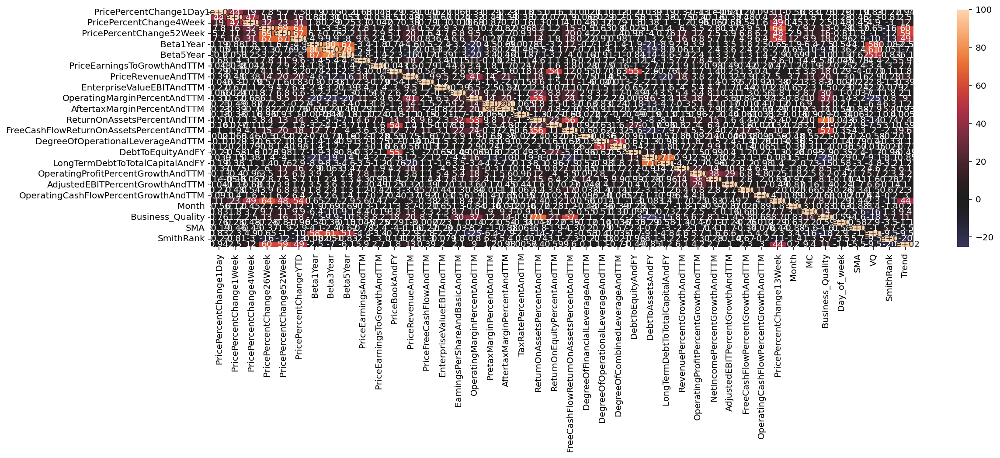

In [28]:

sns.heatmap(X_train_corr[], center=0, annot=True)

In [47]:
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier


from sklearn.neural_network import MLPClassifier


from sklearn.ensemble import BaggingClassifier








import time
t0 = time.time()
lr_model = RandomForestClassifier()
lr_model.fit(X_train, y_train)


lr_y = y_test.values

lr_y_pred = lr_model.predict_proba(X_test)
tF = time.time()


lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
print('roc_auc = %.2f' % lr_rocauc)
print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
## Time to train = 0.00 seconds

roc_auc = 0.59
Time to train = 181.46 seconds


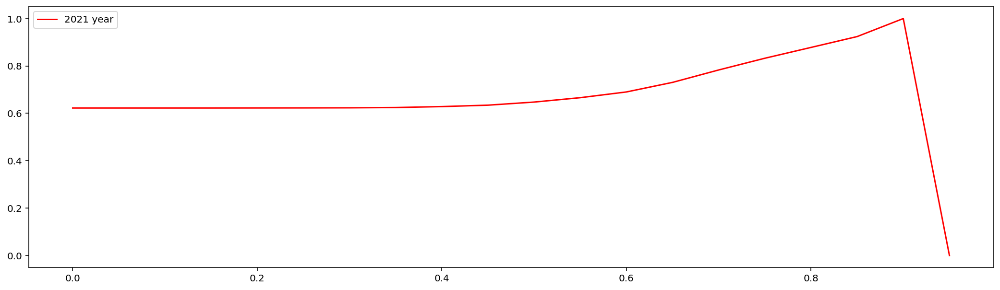

In [48]:

probs_val = lr_y_pred[:,1]
precision = []
for j in np.arange(0,1,0.05):

    cl = (probs_val > j).astype(int)
    precision.append(precision_score(y_test, cl))



plt.plot(np.arange(0,1,0.05), precision, color='red', label=f'{2020+1} year')
plt.legend()
plt.show()

In [31]:
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier


from sklearn.neural_network import MLPClassifier


from sklearn.ensemble import BaggingClassifier


from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.ensemble import GradientBoostingClassifier

from sklearn.naive_bayes import BernoulliNB







import time
t0 = time.time()
lr_model = BernoulliNB()
lr_model.fit(X_train, y_train)


lr_y = y_test.values

lr_y_pred = lr_model.predict_proba(X_test)
tF = time.time()


lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
print('roc_auc = %.2f' % lr_rocauc)
print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
## Time to train = 0.00 seconds

roc_auc = 0.52
Time to train = 0.35 seconds


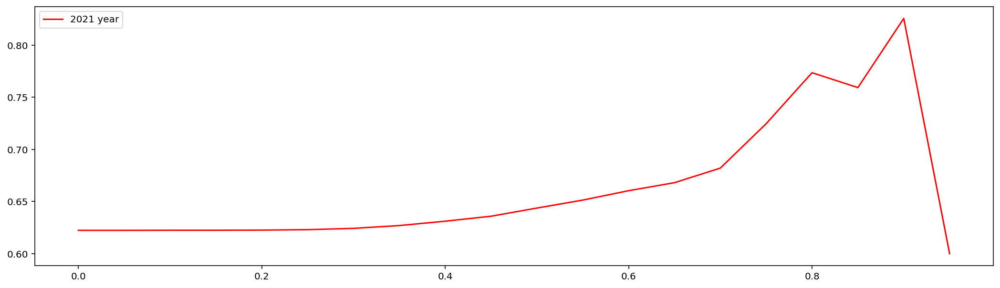

In [34]:

probs_val = lr_y_pred[:,1]
precision = []
for j in np.arange(0,1,0.05):

    cl = (probs_val > j).astype(int)
    precision.append(precision_score(y_test, cl))



plt.plot(np.arange(0,1,0.05), precision, color='red', label=f'{2020+1} year')
plt.legend()
plt.show()

probability: 95.0 %
precision: 0.6
recall: 0.00011927243812742272


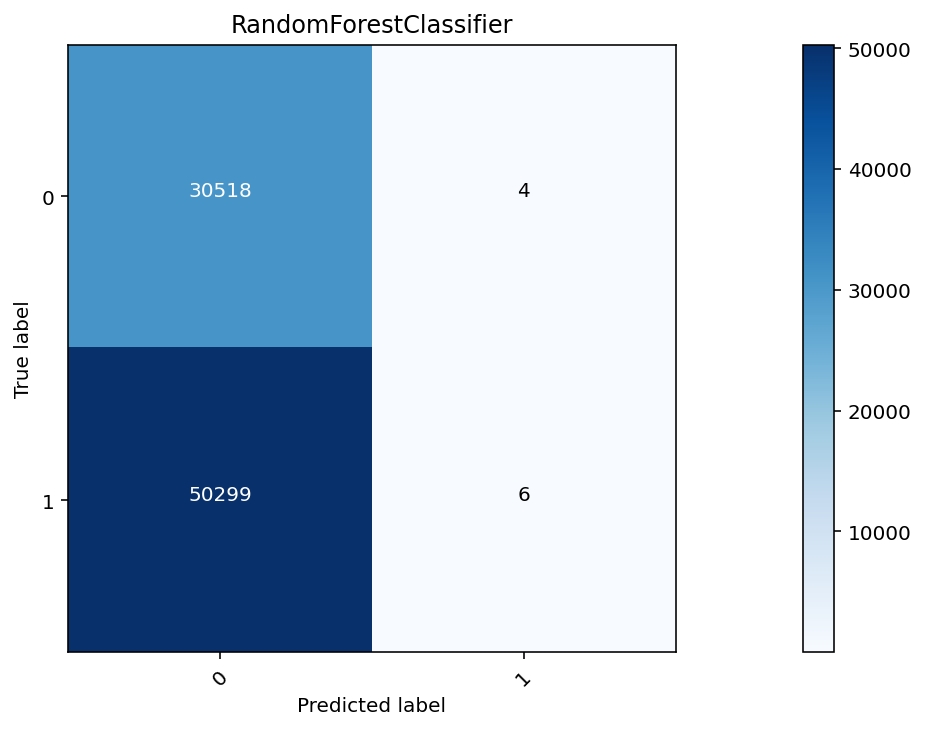

In [36]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
 
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
 
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
 
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
probs_val = lr_y_pred[:,1]
level = 0.95
cl = (probs_val > level).astype(int)
print('probability:', level*100, '%')
print('precision:', precision_score(y_test, cl))
print('recall:', recall_score(y_test, cl))
plot_confusion_matrix(confusion_matrix(y_test, cl), classes=['0','1'], title='RandomForestClassifier')

In [8]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
hgbc = MLPClassifier()
parametrs = { 'activation': ['tanh'],
             'solver' : ['adam'],
             'shuffle' : [True, None],
             'warm_start' : [True, None]
                         }
grid = GridSearchCV(hgbc, parametrs, cv=3, scoring = 'roc_auc')
grid.fit(X_train, y_train)
print(f'Лучшие параметры градиентонго спуска:\n {grid.best_params_}')
print(f'Значение roc_auc для градиентонго спуска: {grid.best_score_}')

Лучшие параметры градиентонго спуска:
 {'activation': 'tanh', 'shuffle': True, 'solver': 'adam', 'warm_start': True}
Значение roc_auc для градиентонго спуска: 0.9080600955382844


In [33]:
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier


from sklearn.neural_network import MLPClassifier


from sklearn.ensemble import BaggingClassifier




import time
t0 = time.time()
lr_model = RandomForestClassifier(max_features=None, n_estimators=100, oob_score=True, random_state=42)
lr_model.fit(X_train, y_train)


lr_y = y_test.values

lr_y_pred = lr_model.predict_proba(X_test)
tF = time.time()


lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
print('roc_auc = %.2f' % lr_rocauc)
print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84

roc_auc = 0.55
Time to train = 1266.41 seconds


In [72]:
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier


from sklearn.neural_network import MLPClassifier


from sklearn.ensemble import BaggingClassifier




import time
t0 = time.time()
lr_model = BaggingClassifier(random_state=42, n_estimators=100)
lr_model.fit(X_train, y_train)


lr_y = y_test.values

lr_y_pred = lr_model.predict_proba(X_test)
tF = time.time()


lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
print('roc_auc = %.2f' % lr_rocauc)
print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
## Time to train = 0.00 seconds

roc_auc = 0.91
Time to train = 132.06 seconds


In [9]:
from sklearn.metrics import roc_auc_score
from sklearn.ensemble import RandomForestClassifier


from sklearn.neural_network import MLPClassifier


from sklearn.ensemble import BaggingClassifier




import time
t0 = time.time()
lr_model = MLPClassifier(activation='tanh', random_state=42)
lr_model.fit(X_train, y_train)


lr_y = y_test.values

lr_y_pred = lr_model.predict_proba(X_test)
tF = time.time()


lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
print('roc_auc = %.2f' % lr_rocauc)
print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
## Time to train = 0.00 seconds

roc_auc = 0.92
Time to train = 266.88 seconds


In [81]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score
probs_val = lr_y_pred[:,1]
max_precision = 0
thr = 0
rec = 0
max_f1 = 0
for threshold in np.arange(0.01, 1.01, 0.01):
      
     
    classes = (probs_val > threshold).astype(int)
    precision = precision_score(y_test, classes)
    recall = recall_score(y_test, classes)
    f1 = 2*precision*recall/(precision+recall)
    if (precision > max_precision ):
        max_precision = precision
        thr = threshold
        rec = recall
        cl = classes
        max_f1 = f1




print('точность:', max_precision)
print('полнота:', rec)
print('Порог:', thr)
print('F-мера:', f1)

точность: 0.9860184302510328
полнота: 0.5038973692757389
Порог: 0.99
F-мера: nan


In [66]:
classes = (probs_val > 0.0).astype(int)
asa = (y_test==classes) & (y_test==1)
sum(asa)/len(asa)

0.8761643298362585

In [58]:
asa

array([1, 1, 1, ..., 1, 0, 1])

In [53]:
probs_val = lr_y_pred[:,1]
classes = (probs_val > 0.7).astype(int)
accuracy_score(y_test,classes)

0.8126286890871655

0 red
1 green


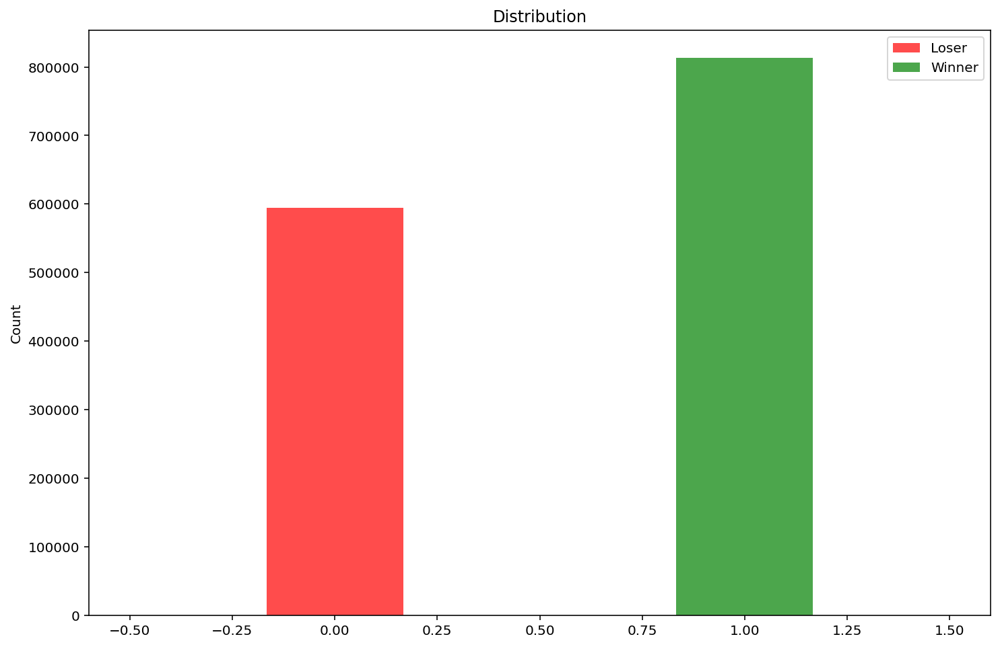

In [54]:
colors = {0: 'red', 1: 'green'}

fig, ax = plt.subplots(figsize=(12, 8))
for price_category in colors:
    
    color = colors[price_category]
    print(price_category, color)
    data = s[(s['value'] == price_category)]

    ax.hist(data['value'], bins=3, color=color, alpha=0.7)
    
plt.ylabel('Count')

plt.title('Distribution')
plt.legend(['Loser', 'Winner']);

In [68]:
# plt.scatter(s[s.Slope_of_trend<0.5], np.arange(1,len(s)))
s[s.Slope_of_trend < 3]

,Div,Month,MC,Nday,Business_Quality,Day_of_week,SMA,VQ,SmithRank,antismithRank,Slope_of_trend,value
Date/Time,,,,,,,,,,,,
2005-07-18,1,9,5,44,-0.04,1,312.00,20.12,469.20,1058.80,0.00,1
2005-06-24,1,9,5,59,-0.04,5,312.00,20.51,454.21,1043.79,0.00,1
2005-08-03,1,9,5,32,-0.05,3,312.00,17.98,481.18,1070.82,0.00,1
2005-06-23,1,9,5,60,-0.04,4,312.00,20.51,453.21,1042.79,0.00,1
2005-06-13,1,6,5,1,-0.04,1,312.00,20.50,445.20,1034.80,0.00,1
...,...,...,...,...,...,...,...,...,...,...,...,...
2009-06-26,0,8,4,30,-0.28,5,304.00,68.38,852.68,202.32,2.47,1
2009-07-20,0,8,4,15,-0.27,1,327.00,69.01,867.69,217.31,2.48,0
2009-08-04,0,9,4,37,-0.62,2,252.00,71.26,665.71,502.29,2.49,0


In [104]:
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score
import itertools
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
 
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
 
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
 
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    
    
    
cl = (probs_val == 1).astype(int)    
plot_confusion_matrix(confusion_matrix(y_test, cl), classes=['0','1'], title='HistGradientBoostingFinal')
print('точность:', precision_score(y_test, cl))
print('полнота:', recall_score(y_test, cl))

ValueError: Found input variables with inconsistent numbers of samples: [6841, 10199]

In [85]:
s.index.astype('datetime64')

TypeError: Cannot cast DatetimeIndex to dtype

2009
roc_auc = 0.73
Time to train = 0.42 seconds
точность: 0.949740034662045
полнота: 0.5930735930735931


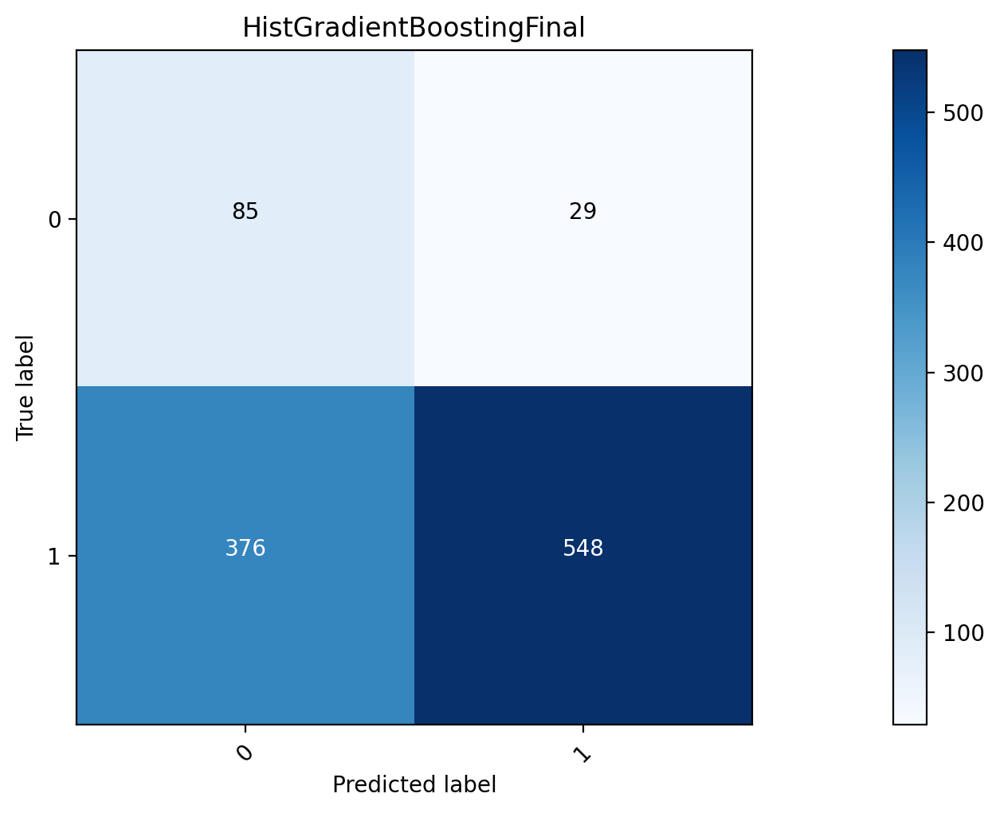

2010
roc_auc = 0.37
Time to train = 0.70 seconds
точность: 0.32917139614074914
полнота: 0.35802469135802467


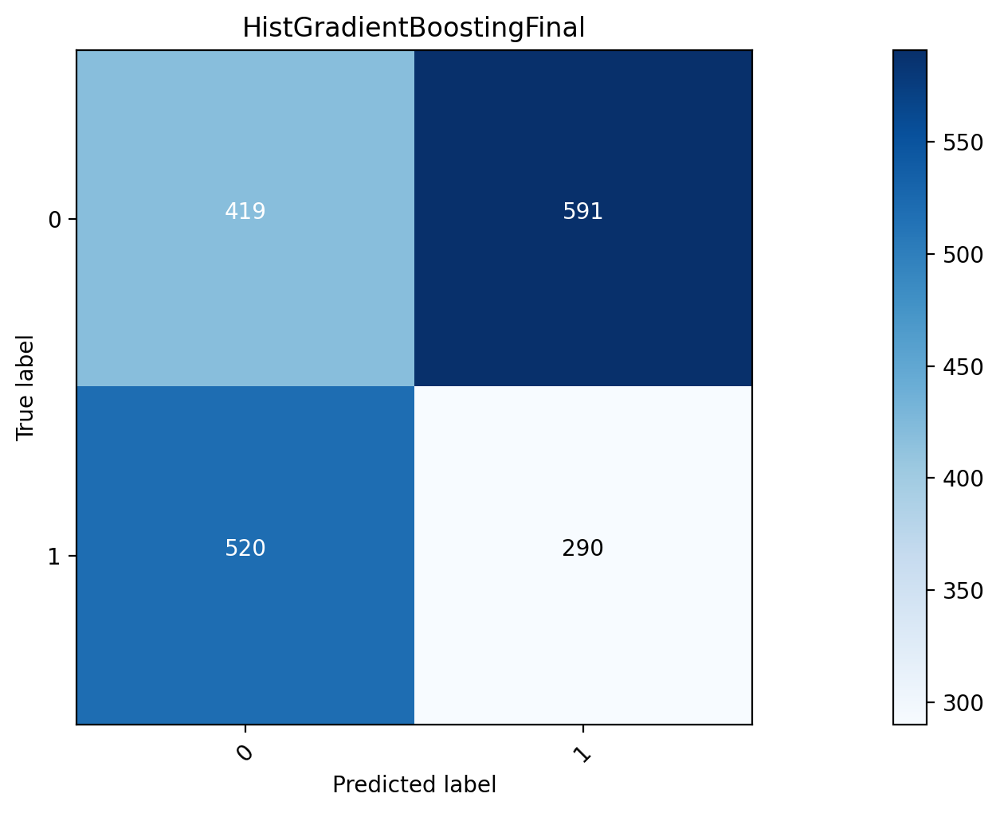

2011
roc_auc = 0.57
Time to train = 1.44 seconds
точность: 0.2676056338028169
полнота: 0.11435941530524506


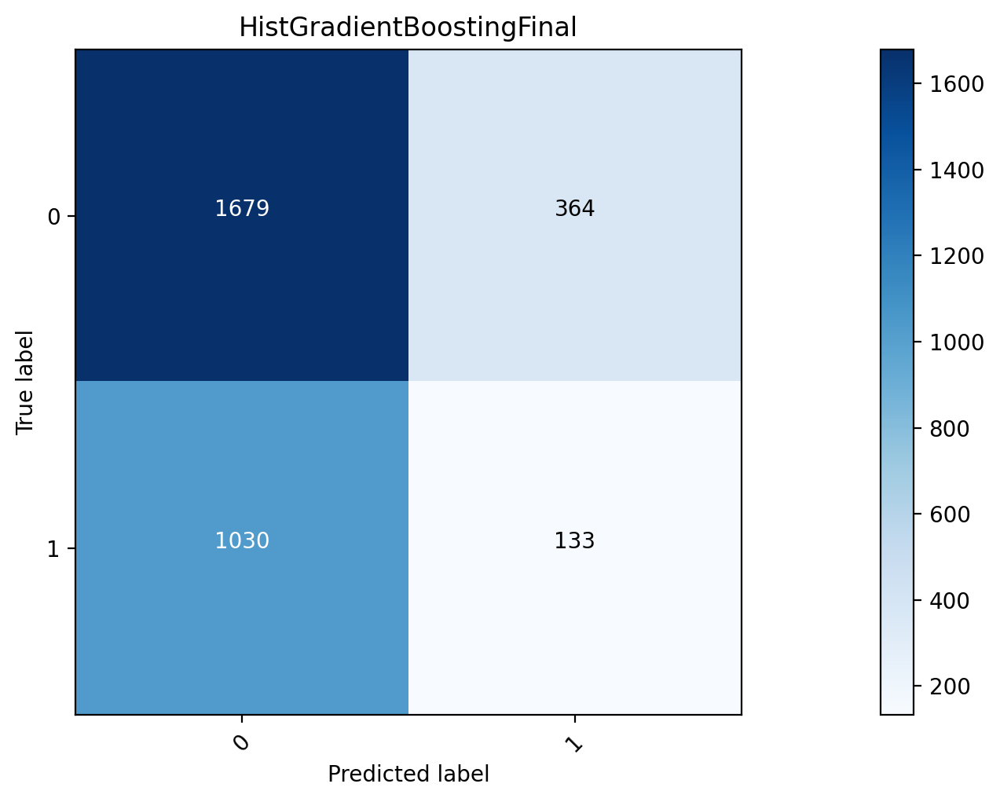

2012
roc_auc = 0.58
Time to train = 2.65 seconds
точность: 0.37791932059447986
полнота: 0.06573116691285082


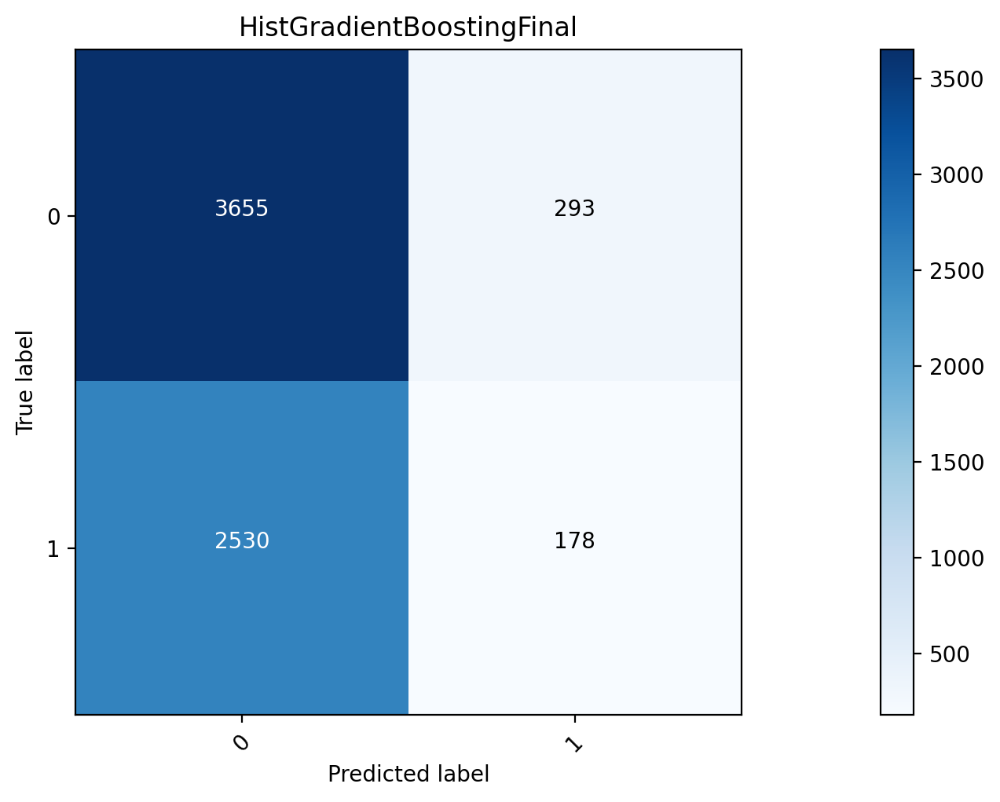

2013
roc_auc = 0.65
Time to train = 6.39 seconds
точность: 0.6897374701670644
полнота: 0.22111706197398623


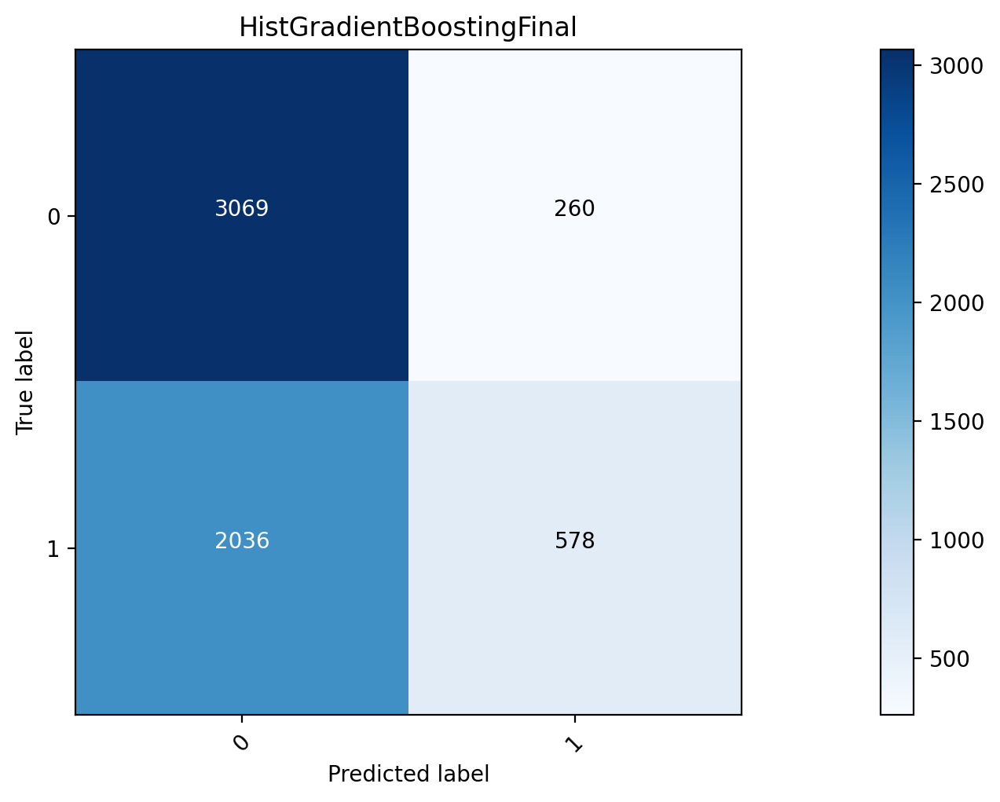

2014
roc_auc = 0.58
Time to train = 11.16 seconds
точность: 0.7652259332023575
полнота: 0.1462087087087087


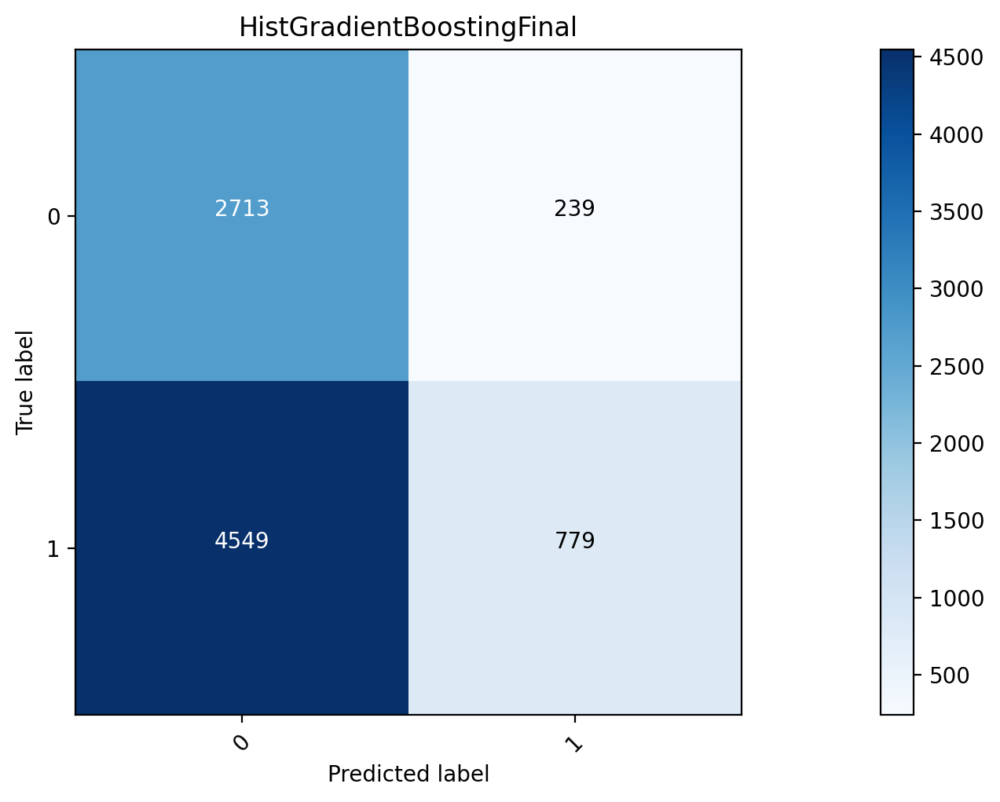

2015
roc_auc = 0.60
Time to train = 14.89 seconds
точность: 0.6093450785139793
полнота: 0.4367279714520999


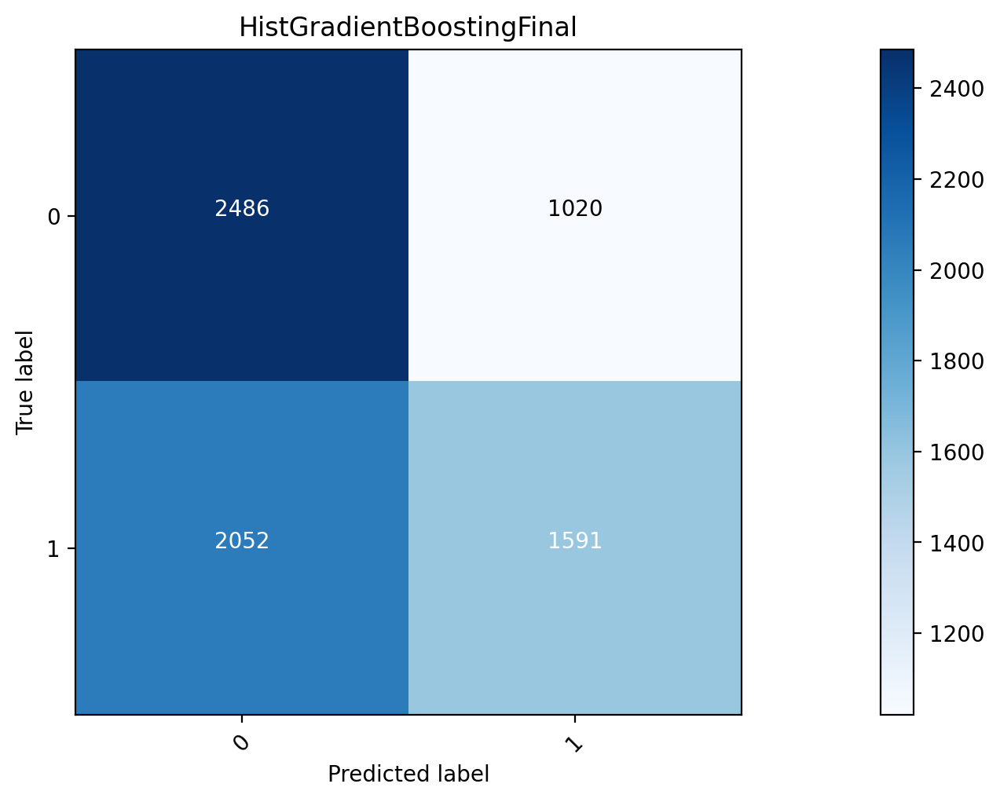

2016
roc_auc = 0.59
Time to train = 19.72 seconds
точность: 0.6993166287015945
полнота: 0.2988125364999027


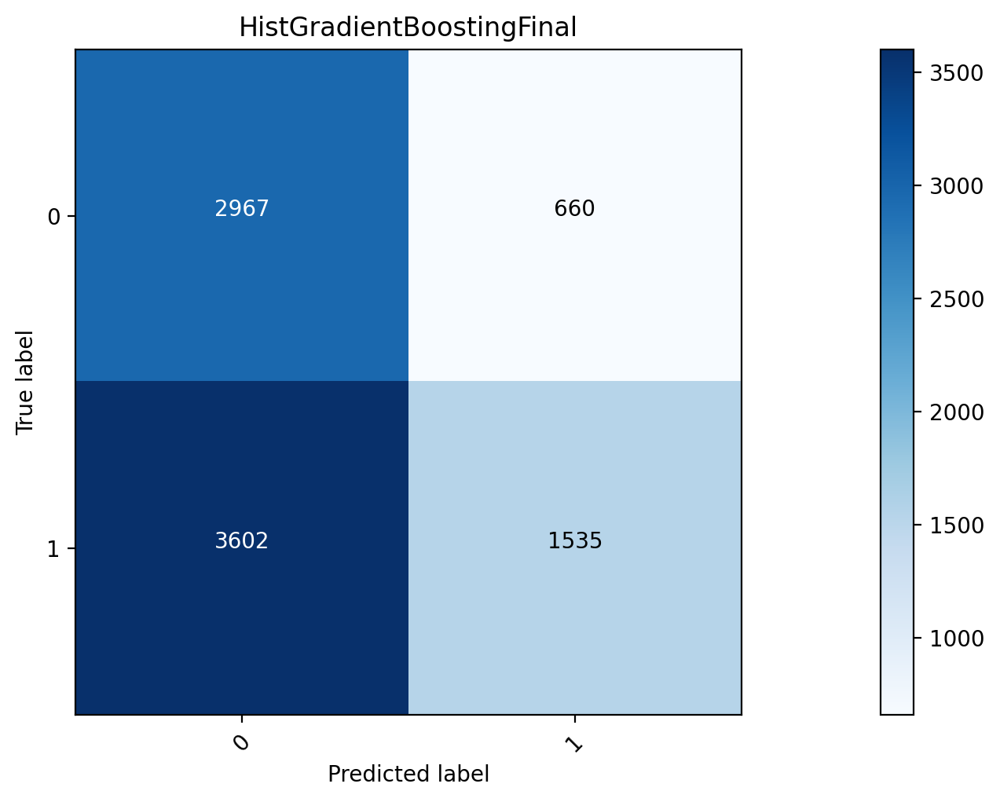

2017
roc_auc = 0.59
Time to train = 25.90 seconds
точность: 0.6841077704021866
полнота: 0.3098691192076406


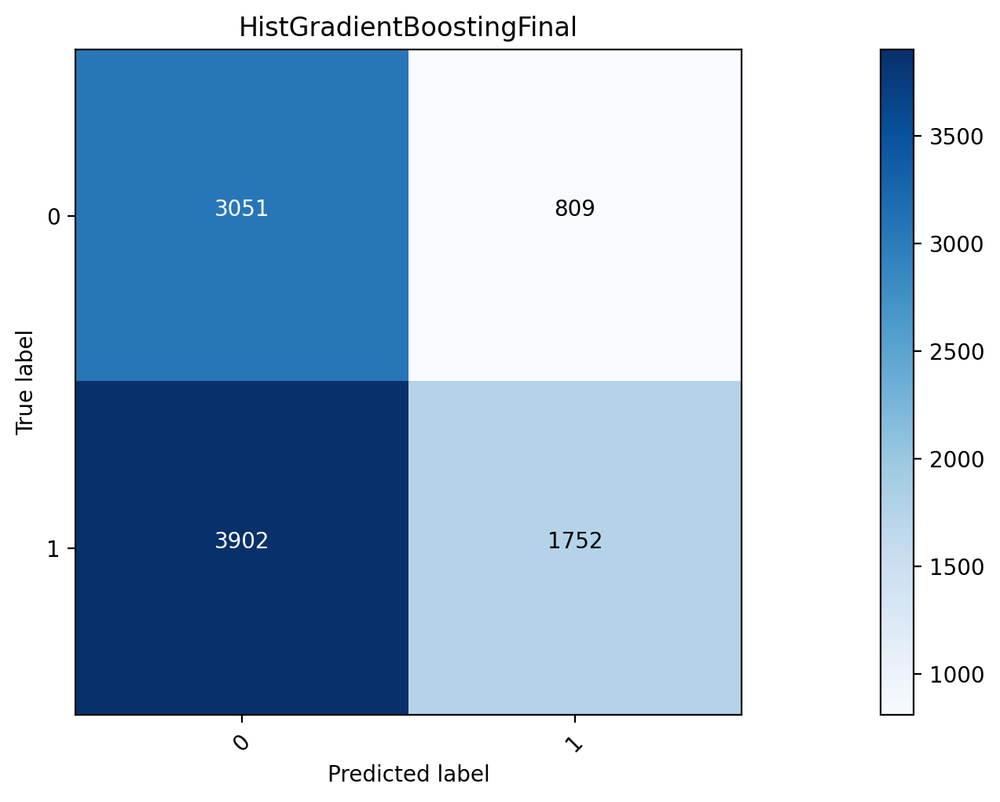

2018
roc_auc = 0.62
Time to train = 34.74 seconds
точность: 0.8157743235463443
полнота: 0.2360093271152565


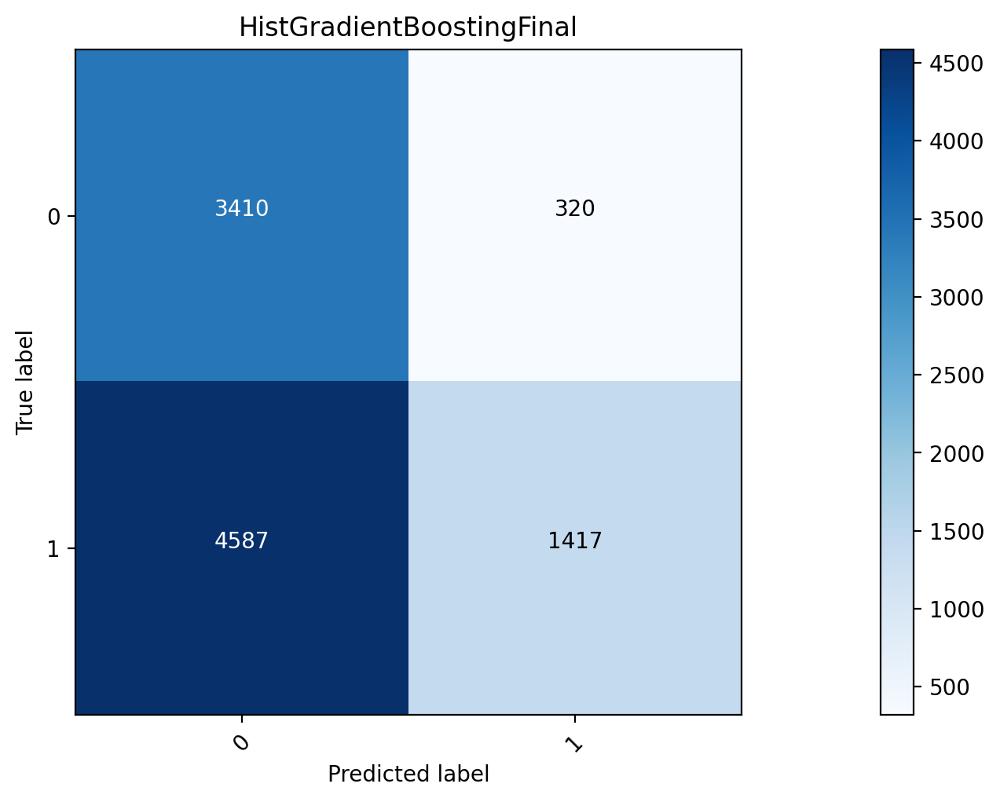

2019
roc_auc = 0.61
Time to train = 46.49 seconds
точность: 0.8356973995271868
полнота: 0.255050505050505


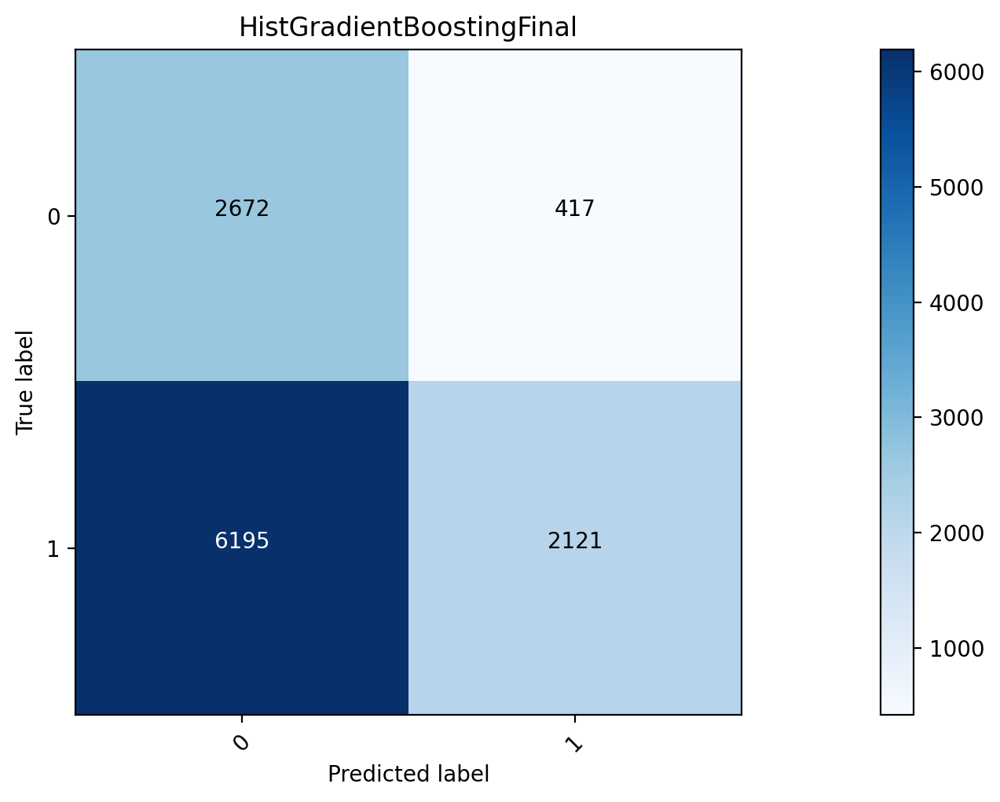

2020
roc_auc = 0.59
Time to train = 57.98 seconds
точность: 0.8711283185840708
полнота: 0.21118262268704746


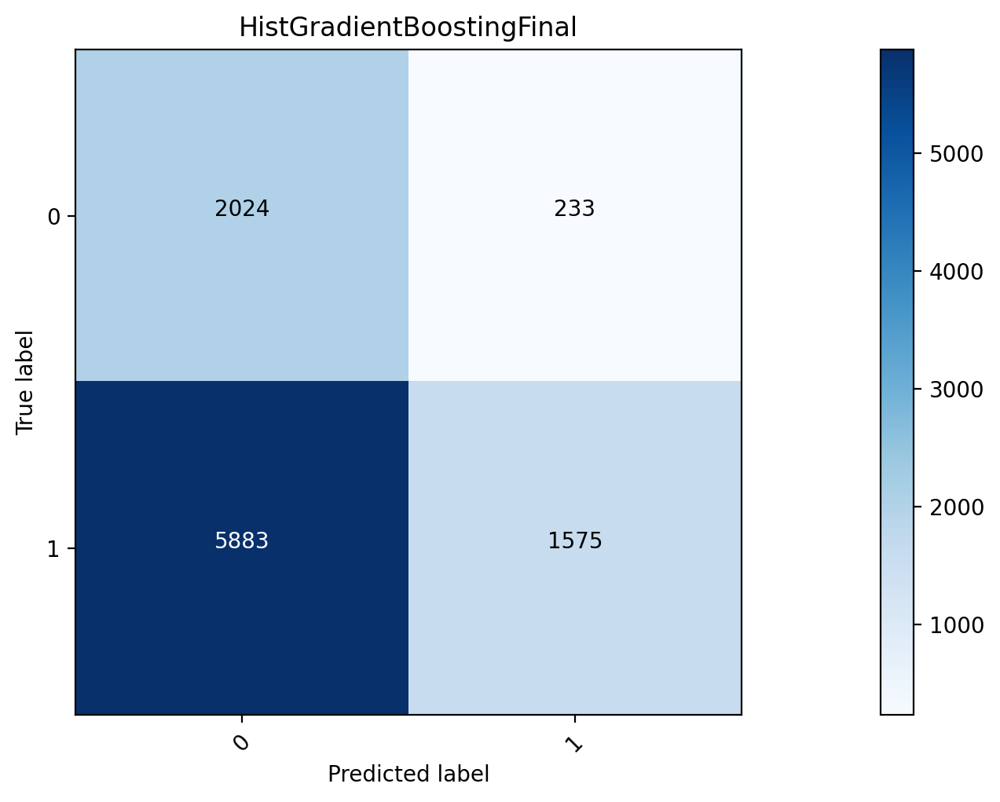

2021
roc_auc = 0.58
Time to train = 62.72 seconds
точность: 0.7405597512216793
полнота: 0.26451920025388764


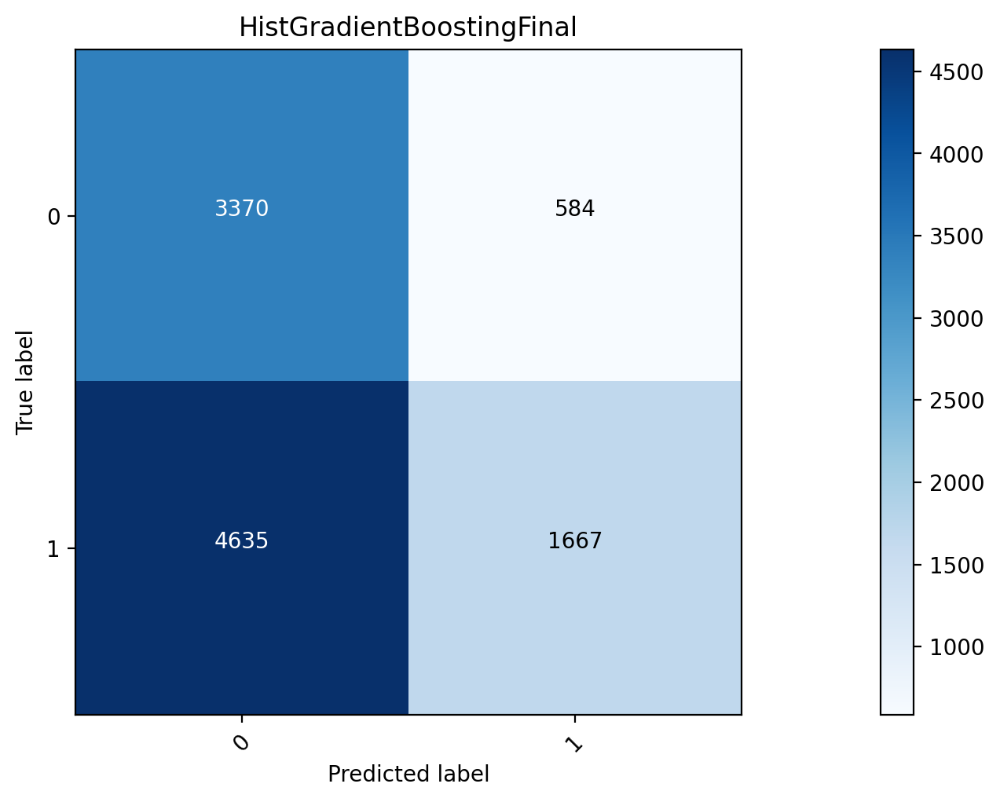

2022
roc_auc = 0.70
Time to train = 72.34 seconds
точность: 0.7821922667612629
полнота: 0.5228835665164809


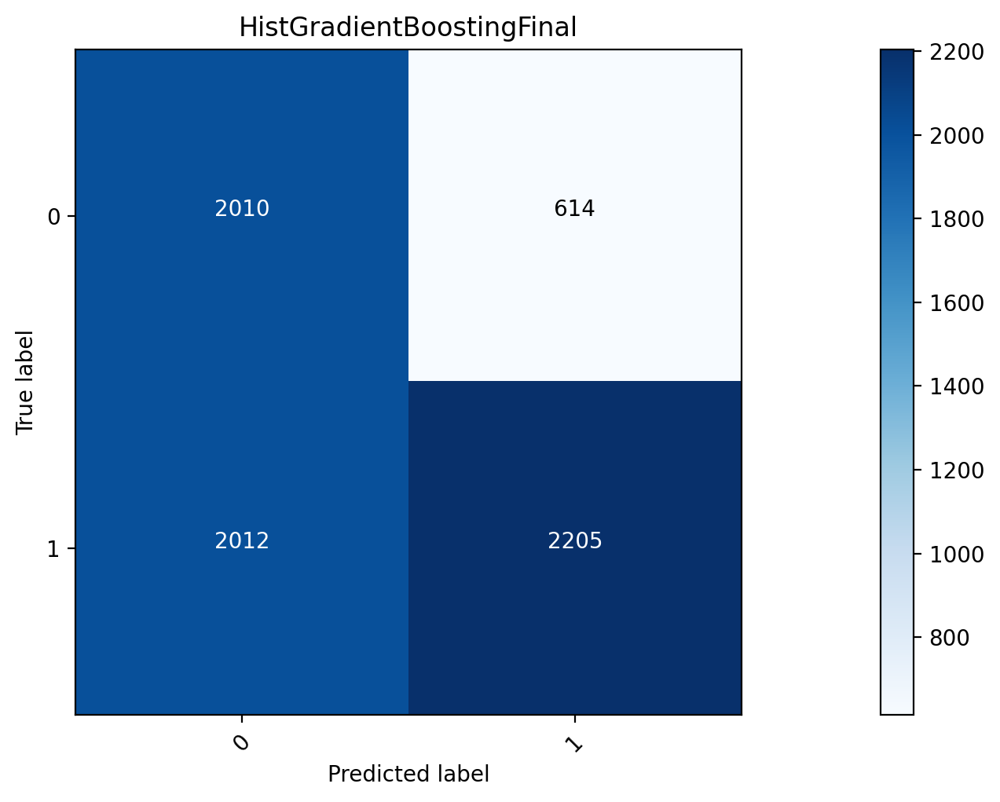

In [106]:
for i in range (2008, 2022):
    train = s[s.index.year <= i]
    test = s[s.index.year == i + 1]
    X_train = train.drop(columns=['value'])
    X_test = test.drop(columns=['value'])
    y_train = train['value']
    y_test = test['value']
    t0 = time.time()
    lr_model = RandomForestClassifier(max_features=None, n_estimators=100, oob_score=True, random_state=42)
    lr_model.fit(X_train, y_train)


    lr_y = y_test.values

    lr_y_pred = lr_model.predict_proba(X_test)
    tF = time.time()


    lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
    print(str(i+1))
    print('roc_auc = %.2f' % lr_rocauc)
    print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
    probs_val = lr_y_pred[:,1]
    cl = (probs_val == 1).astype(int)
    print('точность:', precision_score(y_test, cl))
    print('полнота:', recall_score(y_test, cl))
    plot_confusion_matrix(confusion_matrix(y_test, cl), classes=['0','1'], title='RandomForestClassifier')
    


2009
roc_auc = 0.68
Time to train = 3.86 seconds
точность: 0.9049773755656109
полнота: 0.6493506493506493


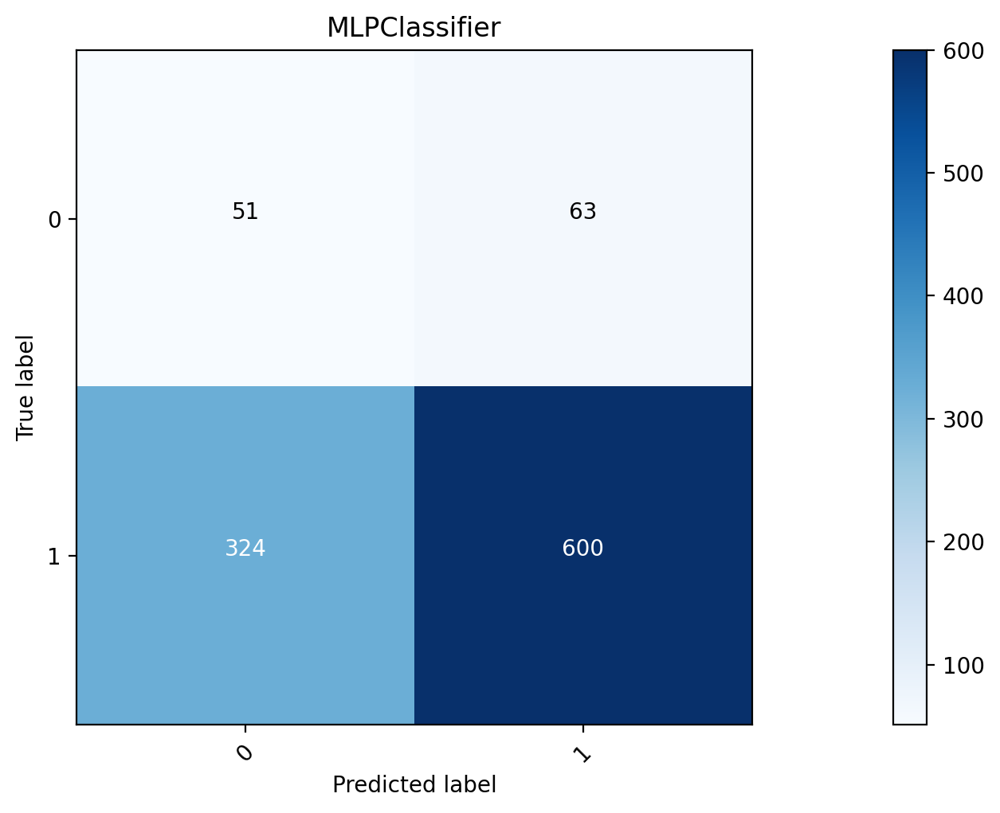

2010
roc_auc = 0.41
Time to train = 6.29 seconds
точность: 0.40224159402241594
полнота: 0.3987654320987654


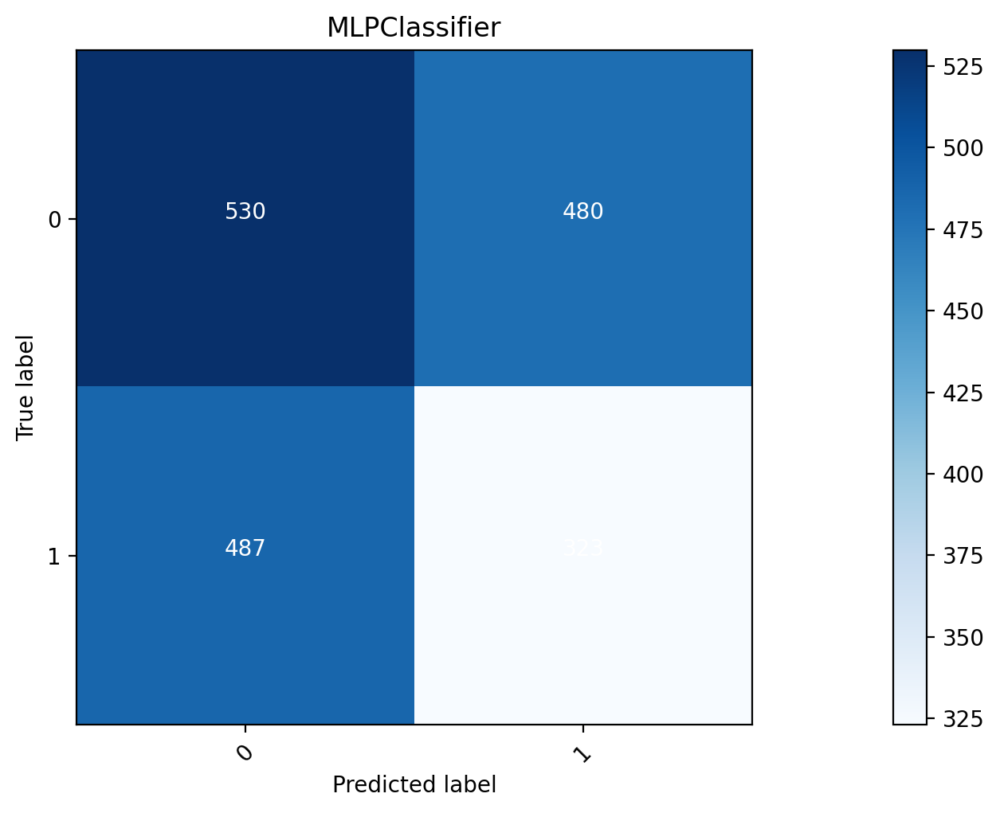

2011
roc_auc = 0.56
Time to train = 10.73 seconds
точность: 0.40298507462686567
полнота: 0.3250214961306965


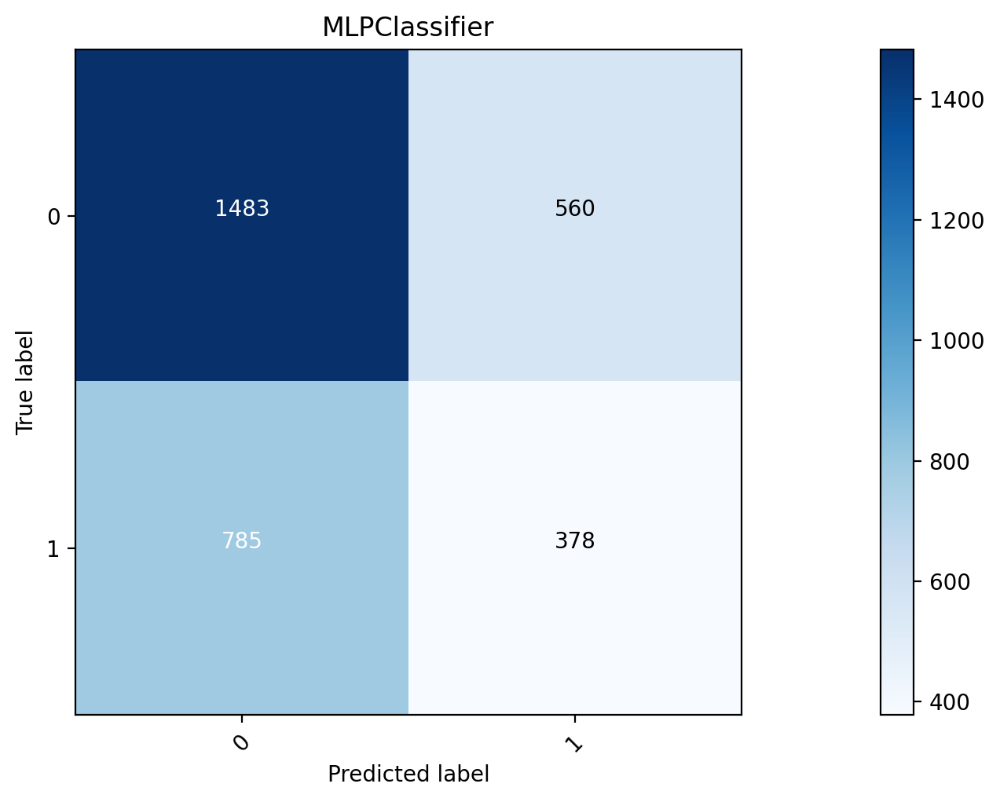

2012
roc_auc = 0.61
Time to train = 20.00 seconds
точность: 0.4885204081632653
полнота: 0.5657311669128509


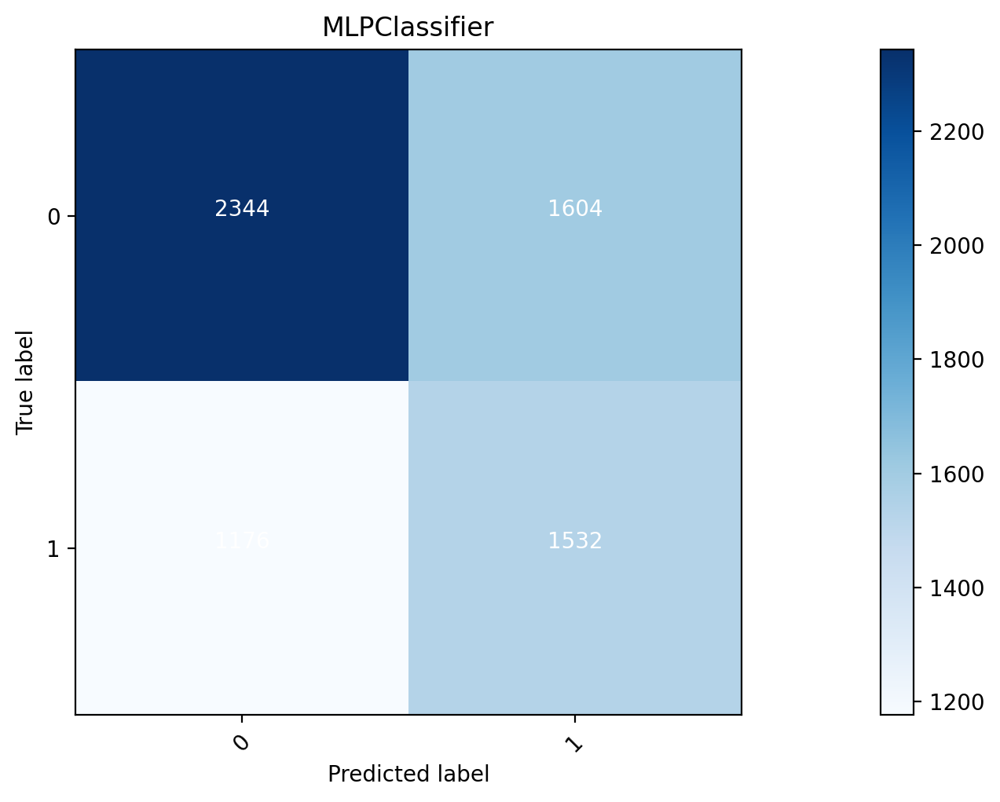

2013
roc_auc = 0.64
Time to train = 37.39 seconds
точность: 0.5651074589127687
полнота: 0.34200459066564654


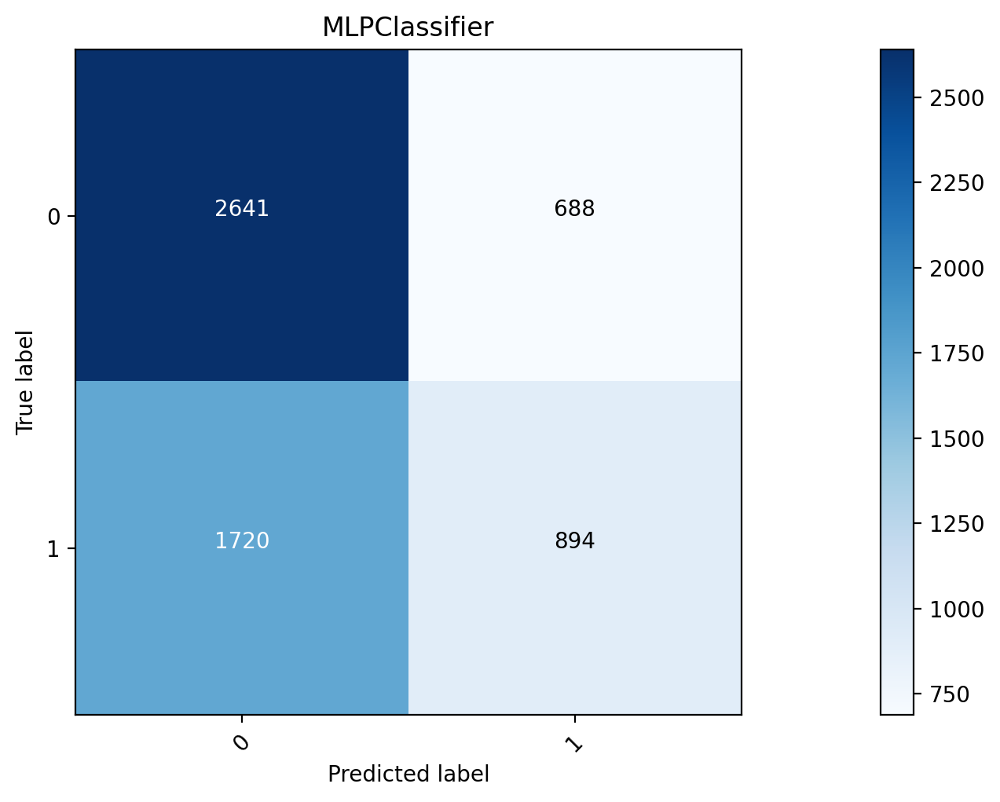

2014
roc_auc = 0.57
Time to train = 54.41 seconds
точность: 0.6910540915395285
полнота: 0.37406156156156156


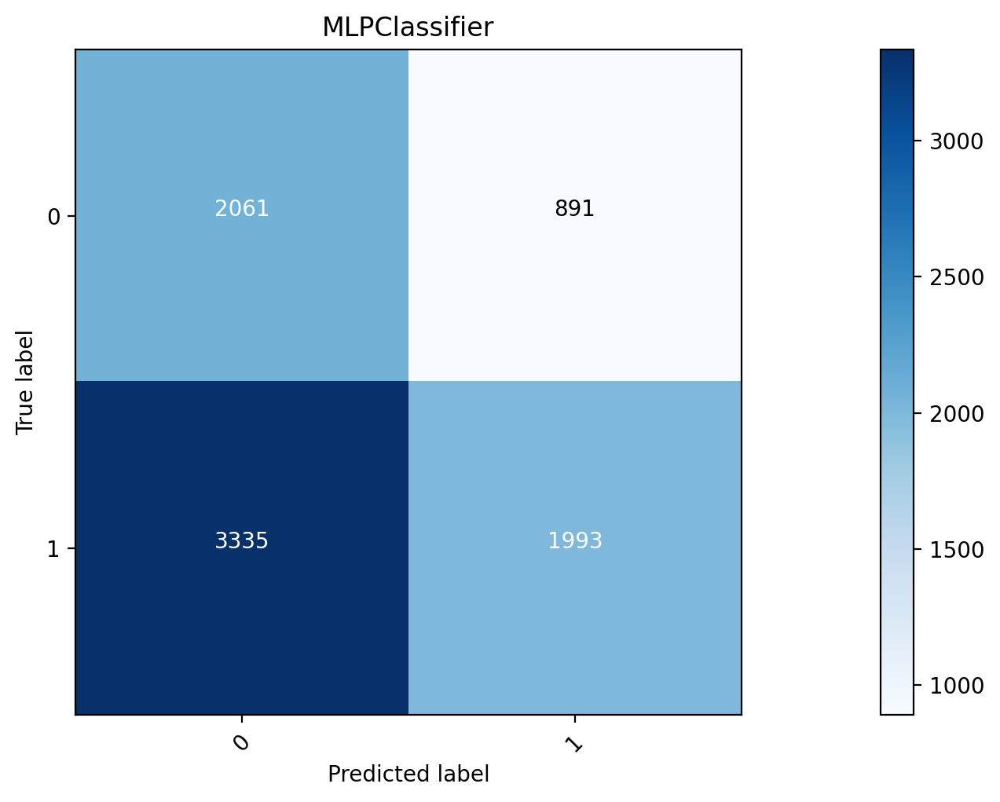

2015
roc_auc = 0.60
Time to train = 78.47 seconds
точность: 0.5709374283749713
полнота: 0.6837771067801263


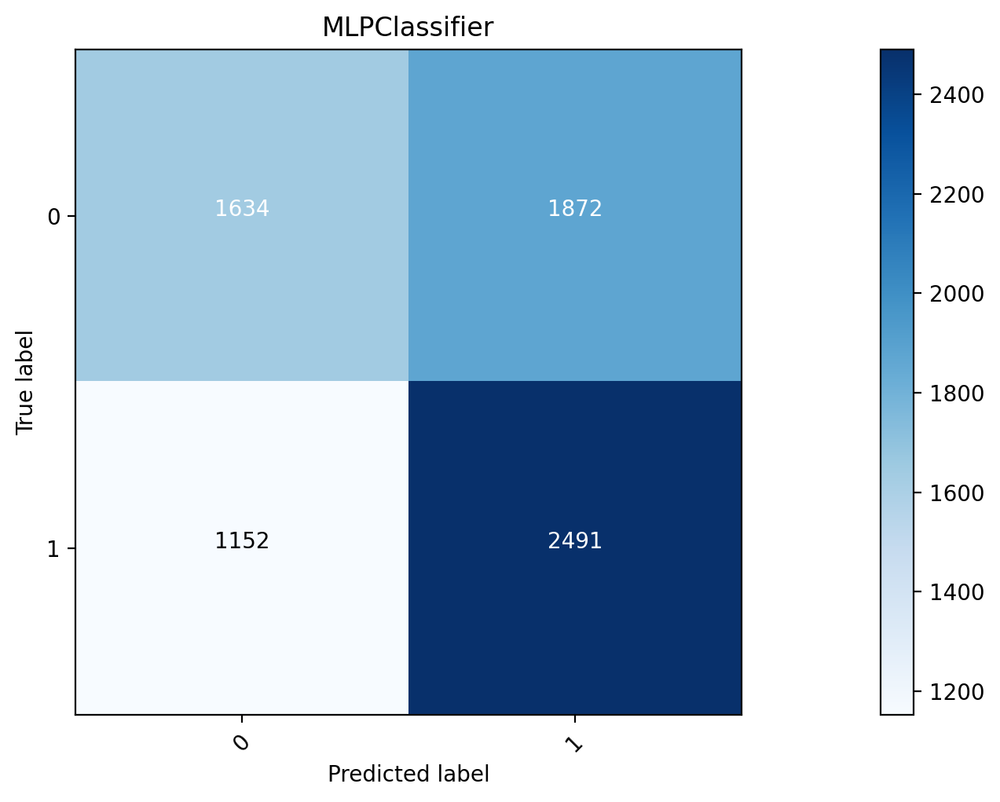

2016
roc_auc = 0.56
Time to train = 98.62 seconds
точность: 0.6292943361188487
полнота: 0.5277399260268639


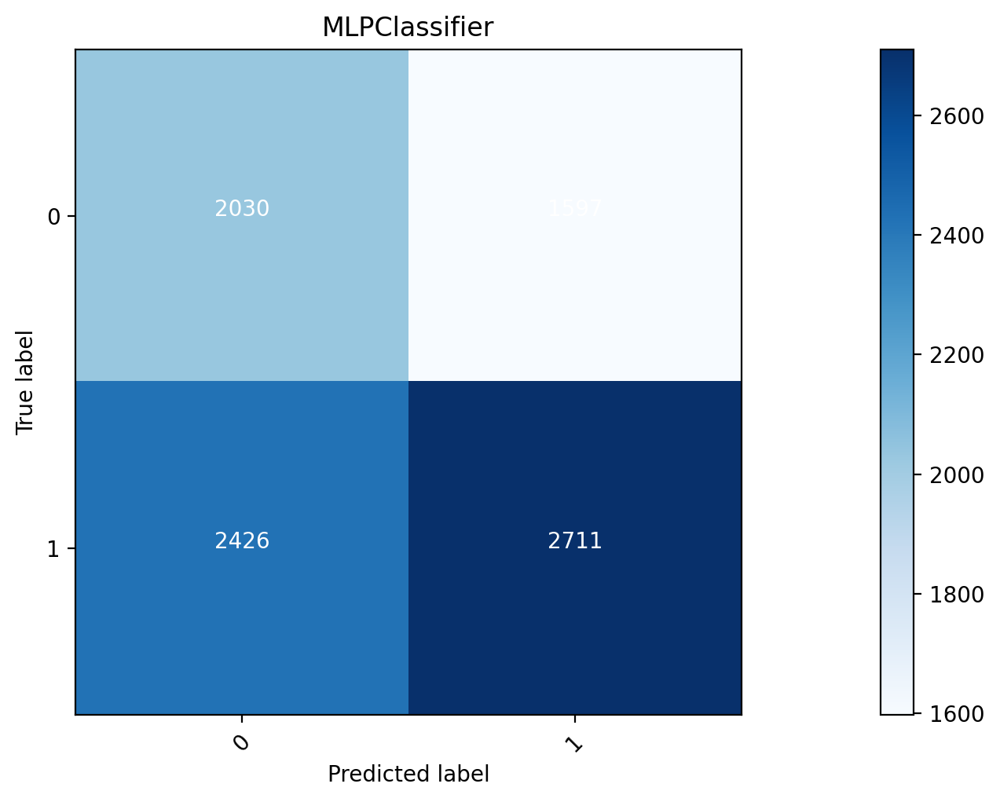

2017
roc_auc = 0.55
Time to train = 123.75 seconds
точность: 0.642283481658346
полнота: 0.5233463035019456


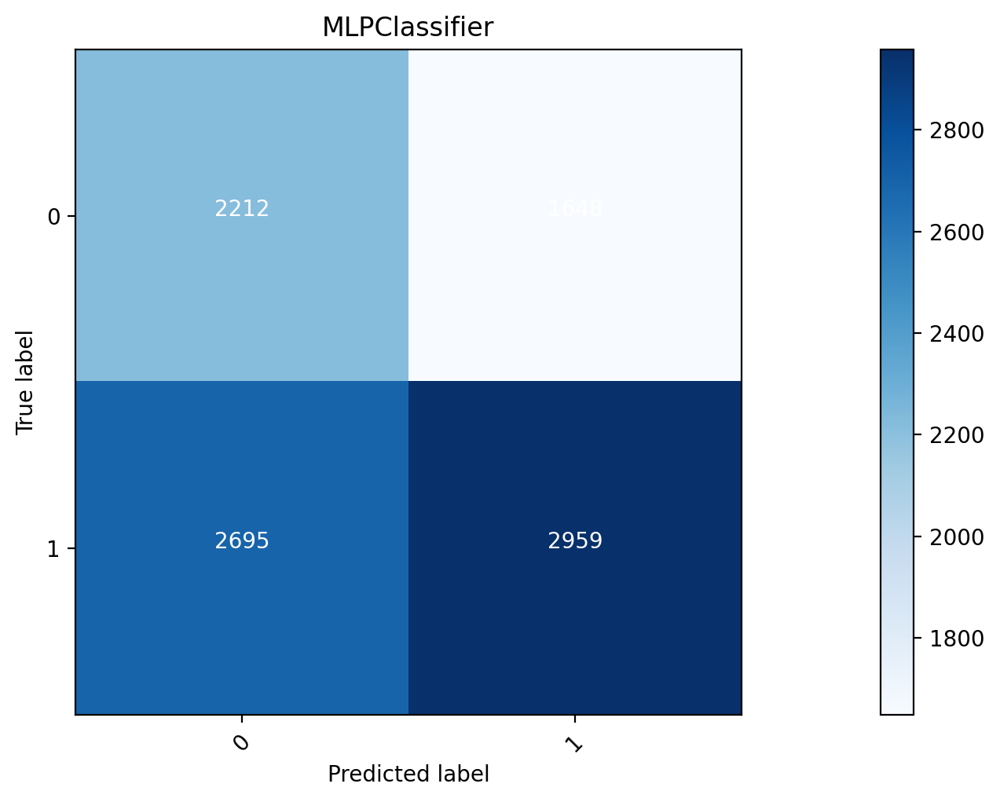

2018
roc_auc = 0.60
Time to train = 153.73 seconds
точность: 0.7107498180053385
полнота: 0.4878414390406396


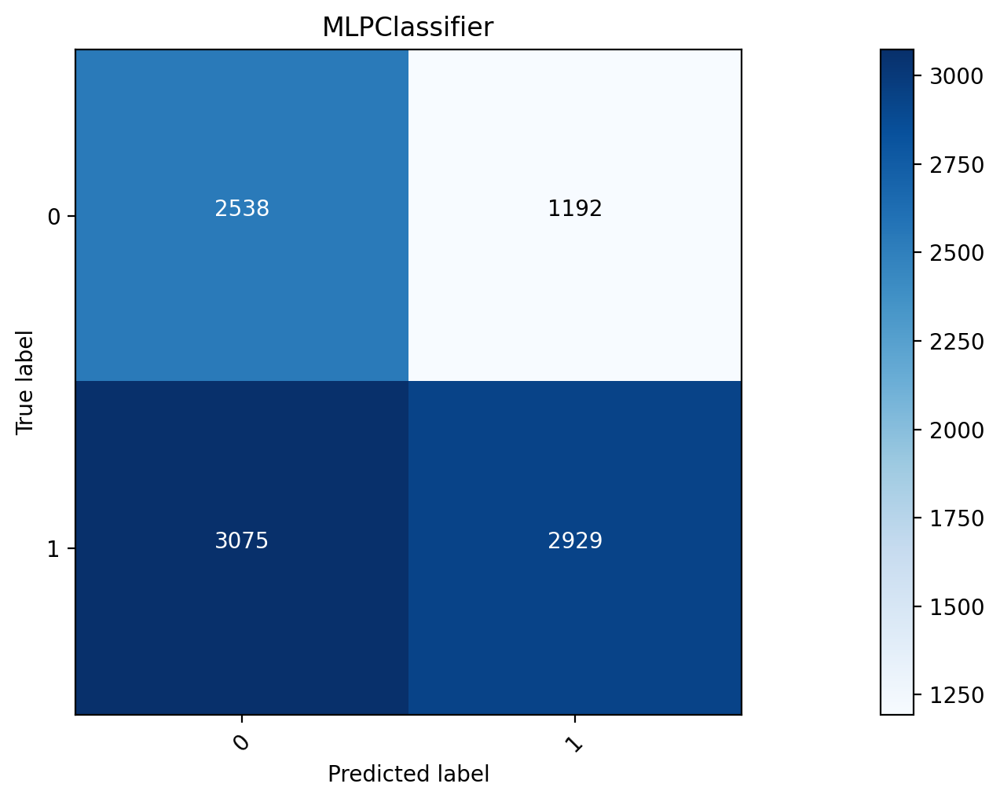

2019
roc_auc = 0.60
Time to train = 185.66 seconds
точность: 0.7759945364521086
полнота: 0.5465367965367965


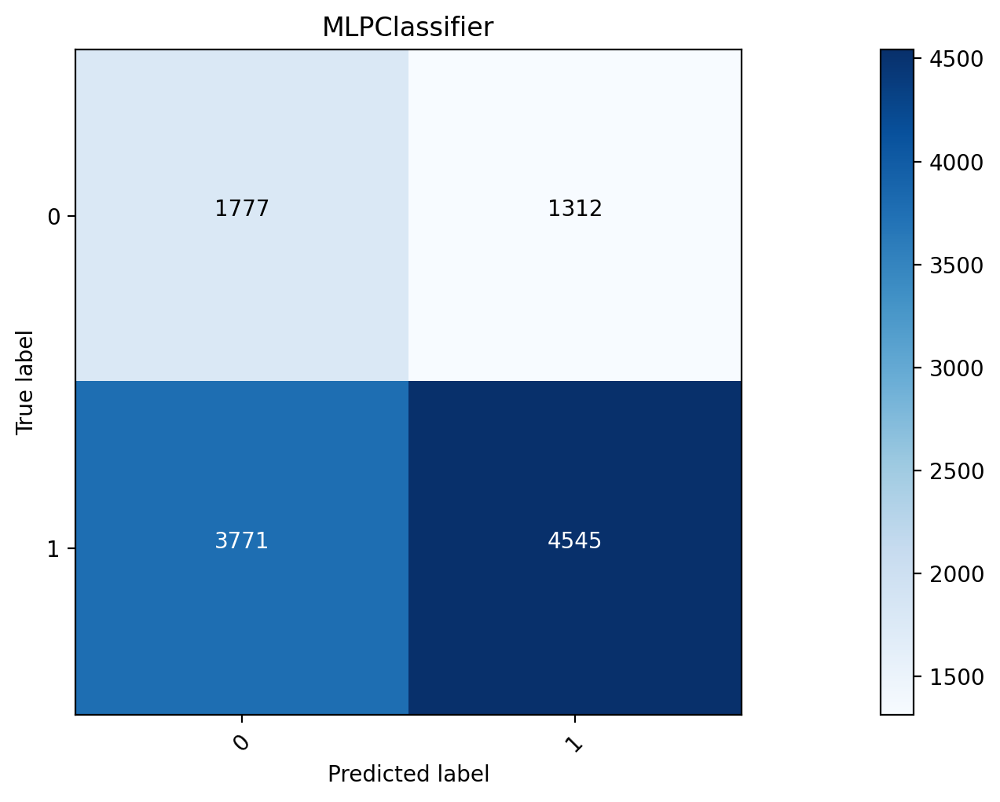

2020
roc_auc = 0.60
Time to train = 222.50 seconds
точность: 0.8162107396149949
полнота: 0.5400911772593189


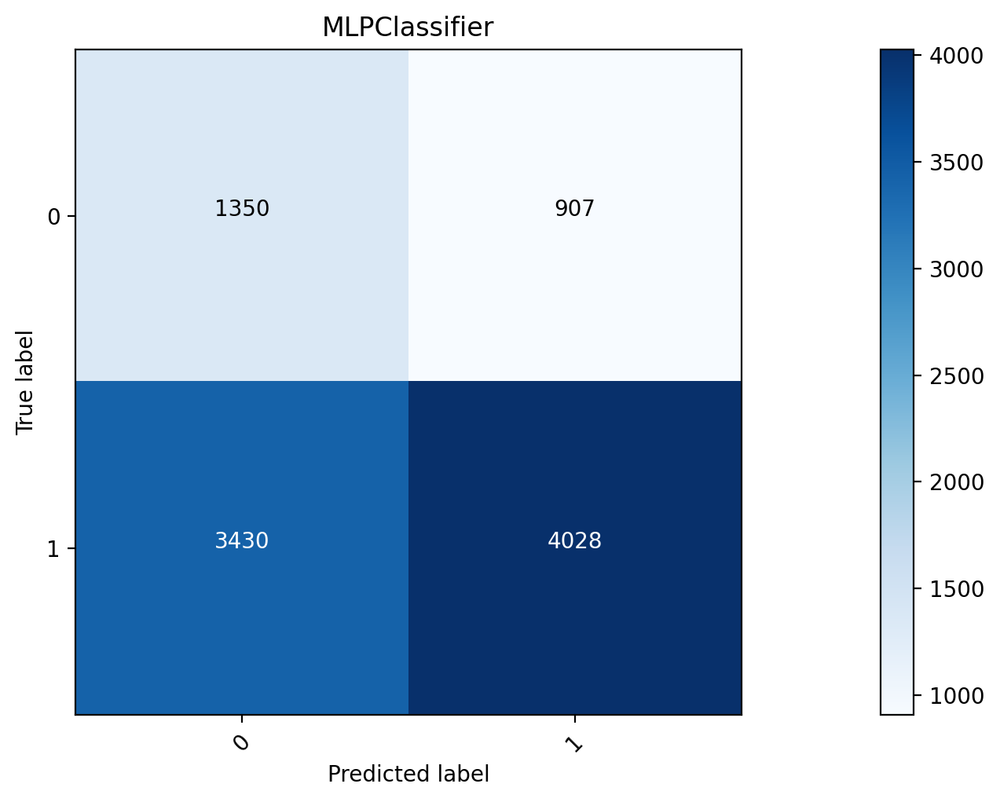

2021
roc_auc = 0.55
Time to train = 250.90 seconds
точность: 0.6417685794920037
полнота: 0.5412567438908283


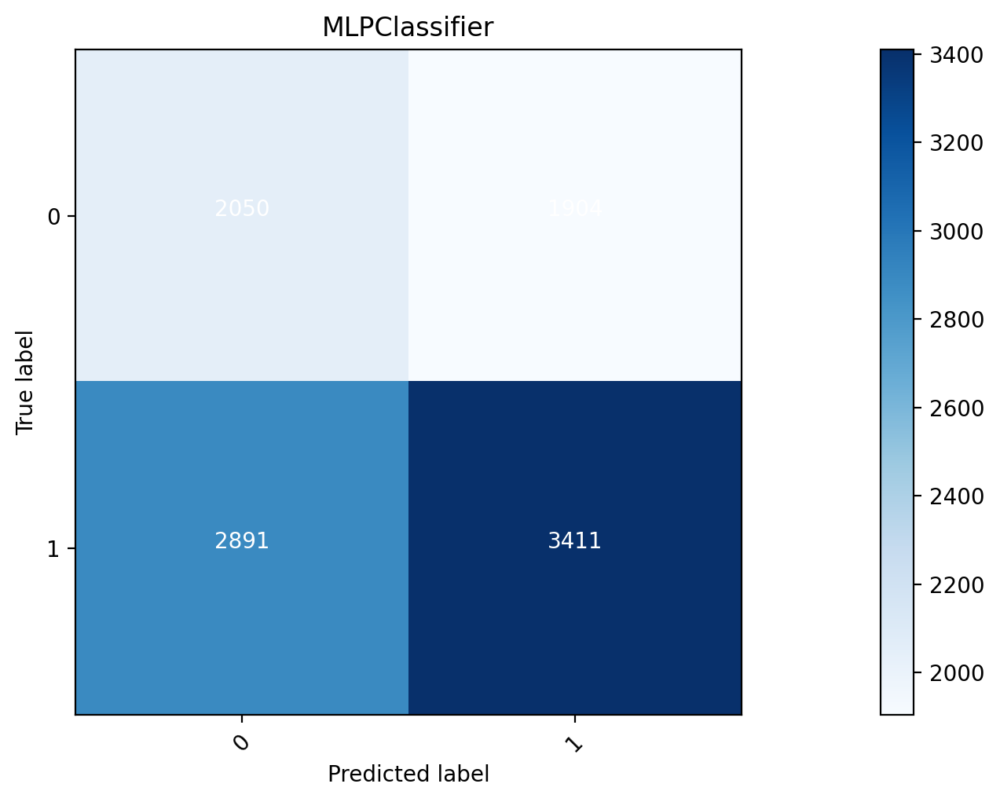

2022
roc_auc = 0.68
Time to train = 277.83 seconds
точность: 0.7114813969413376
полнота: 0.7391510552525492


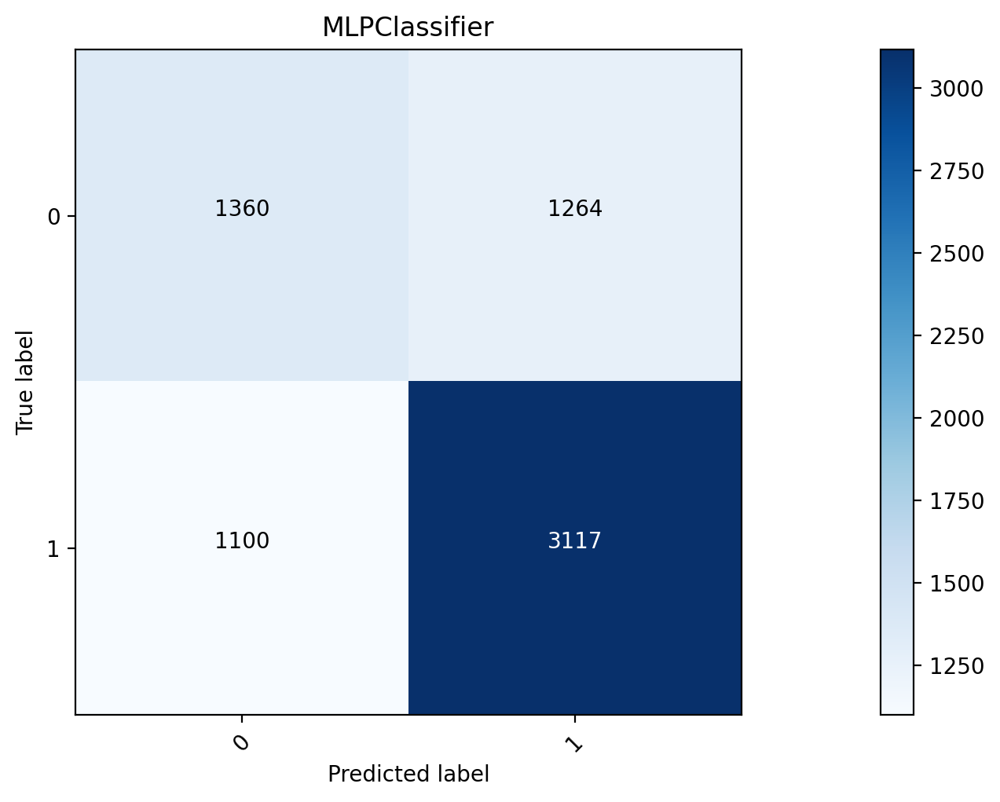

In [109]:
for i in range (2008, 2022):
    train = s[s.index.year <= i]
    test = s[s.index.year == i + 1]
    X_train = train.drop(columns=['value'])
    X_test = test.drop(columns=['value'])
    y_train = train['value']
    y_test = test['value']
    t0 = time.time()
    lr_model = MLPClassifier(activation='tanh', random_state=42)
    lr_model.fit(X_train, y_train)


    lr_y = y_test.values

    lr_y_pred = lr_model.predict_proba(X_test)
    tF = time.time()


    lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
    print(str(i+1))
    print('roc_auc = %.2f' % lr_rocauc)
    print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
    probs_val = lr_y_pred[:,1]
    cl = (probs_val > 0.8).astype(int)
    print('точность:', precision_score(y_test, cl))
    print('полнота:', recall_score(y_test, cl))
    plot_confusion_matrix(confusion_matrix(y_test, cl), classes=['0','1'], title='MLPClassifier')

2009
roc_auc = 0.72
Time to train = 0.61 seconds
точность: 0.9487632508833922
полнота: 0.5811688311688312


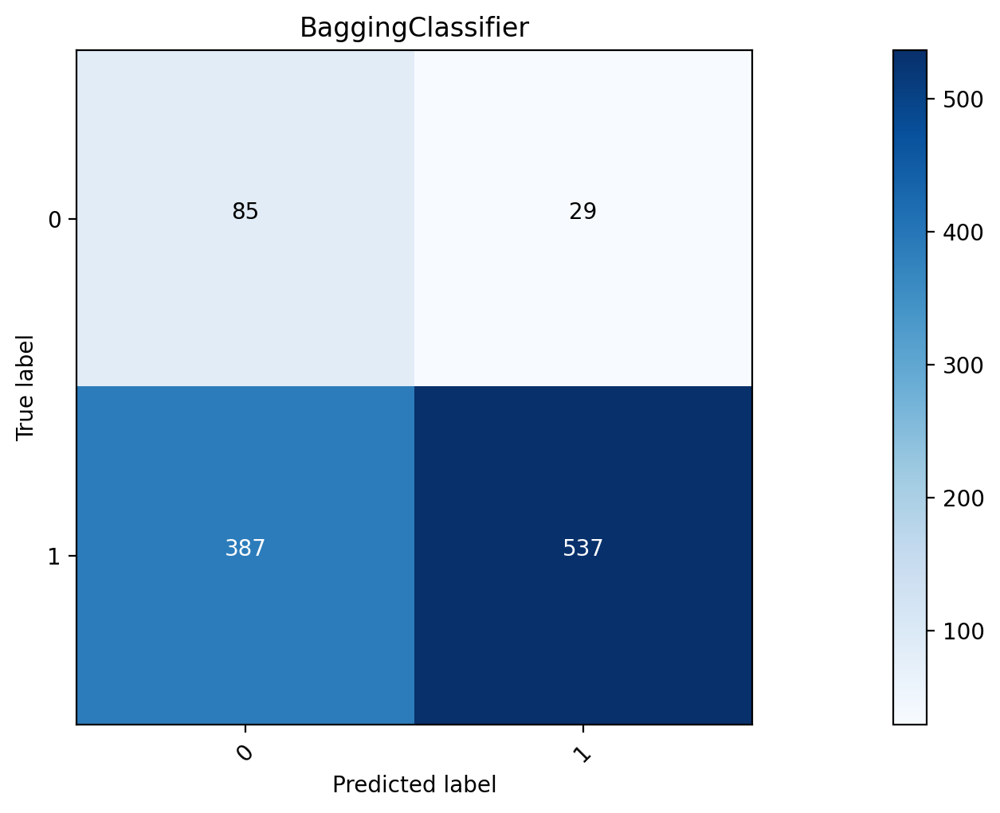

2010
roc_auc = 0.37
Time to train = 0.91 seconds
точность: 0.332579185520362
полнота: 0.362962962962963


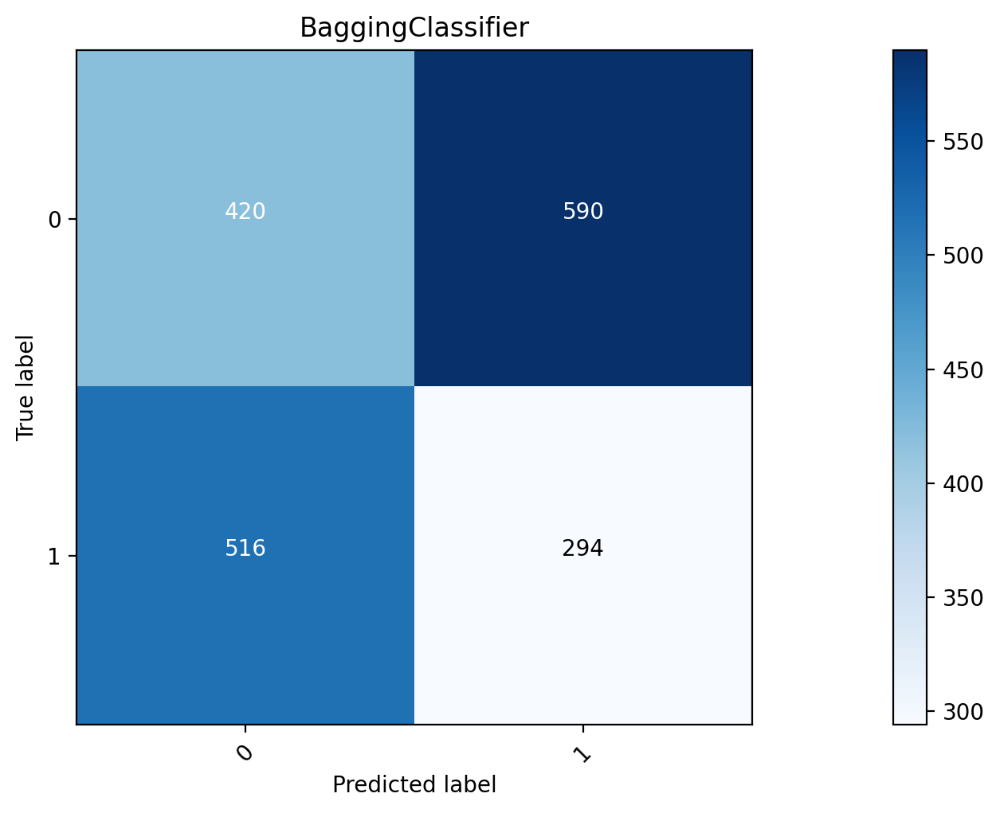

2011
roc_auc = 0.57
Time to train = 2.02 seconds
точность: 0.2729124236252546
полнота: 0.11521926053310404


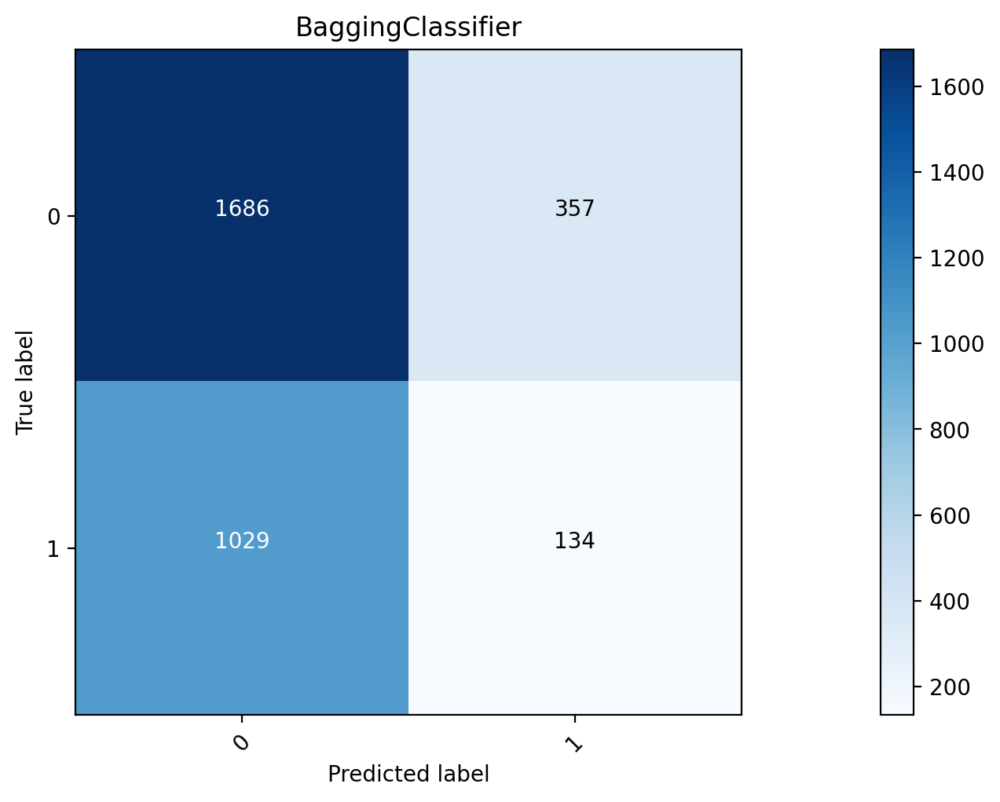

2012
roc_auc = 0.58
Time to train = 3.28 seconds
точность: 0.3691275167785235
полнота: 0.060930576070901035


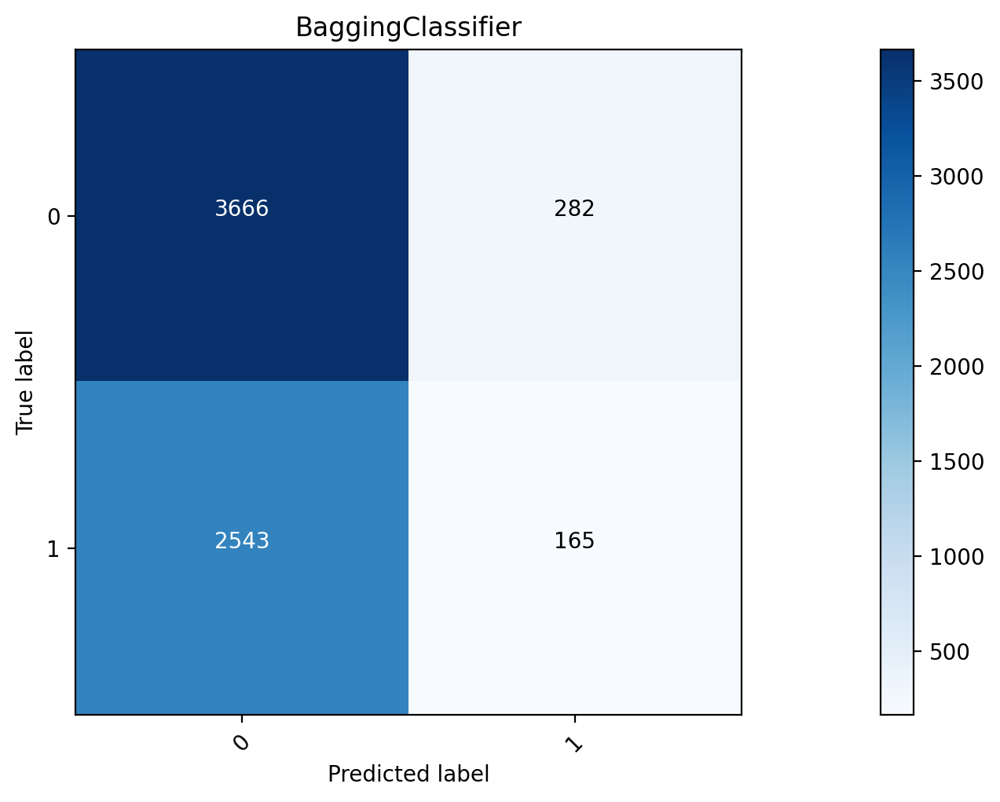

2013
roc_auc = 0.65
Time to train = 6.80 seconds
точность: 0.7053892215568862
полнота: 0.22532517214996176


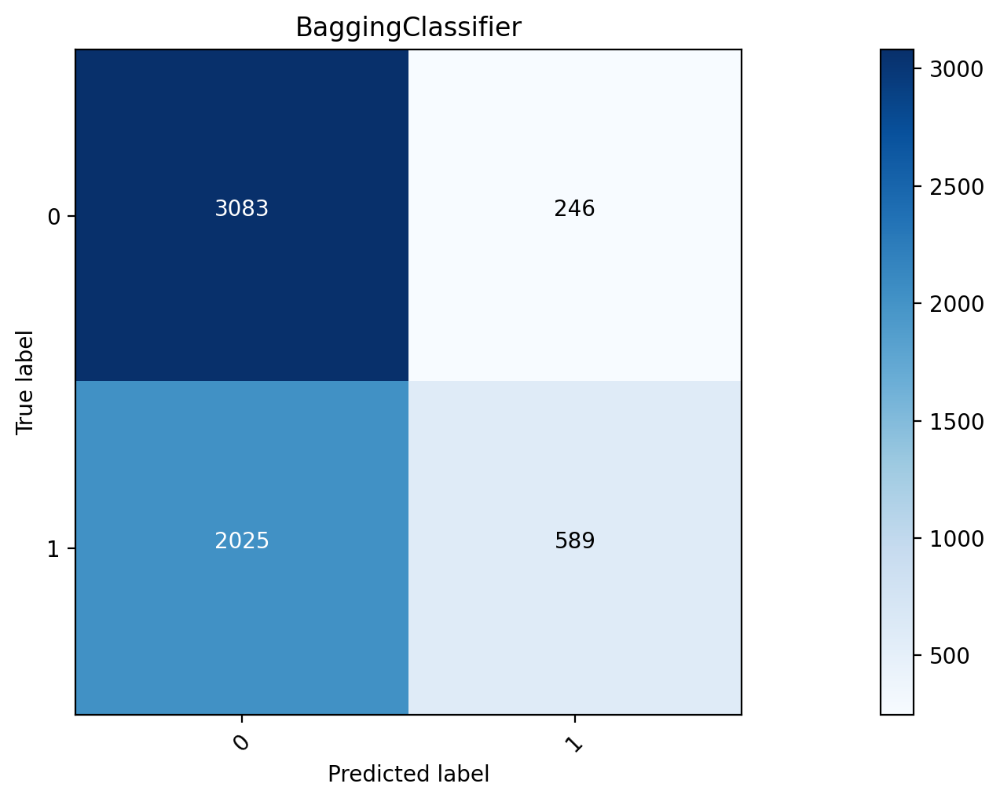

2014
roc_auc = 0.58
Time to train = 12.59 seconds
точность: 0.7589641434262948
полнота: 0.14301801801801803


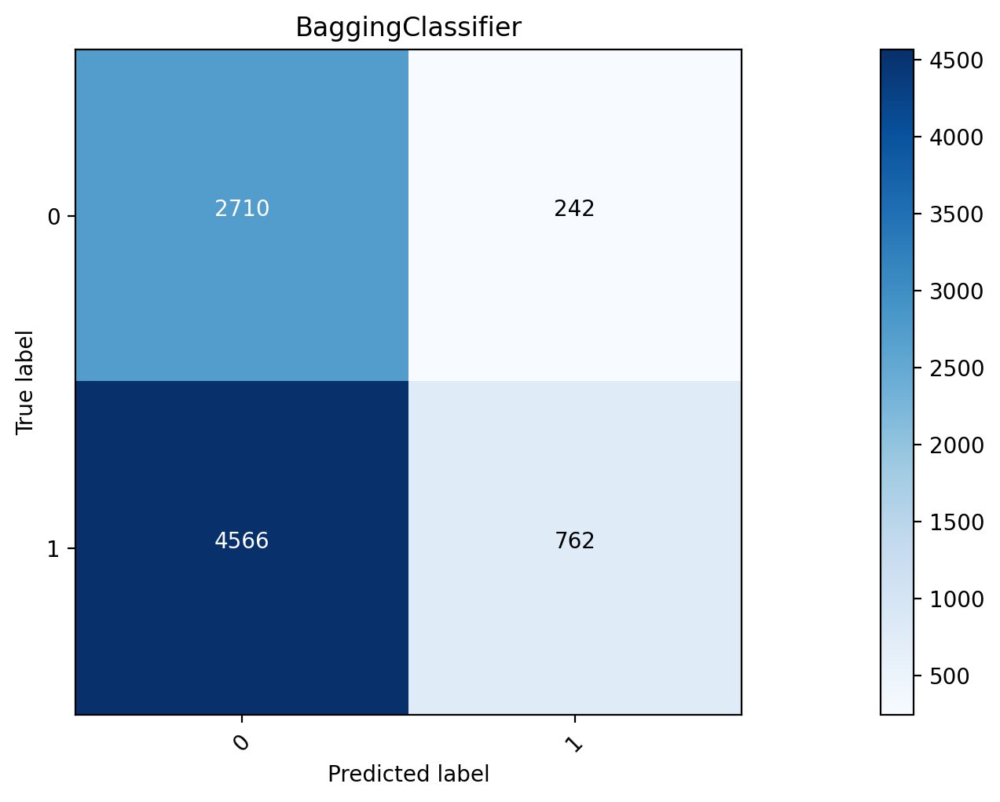

2015
roc_auc = 0.60
Time to train = 16.13 seconds
точность: 0.605223315669947
полнота: 0.4389239637661268


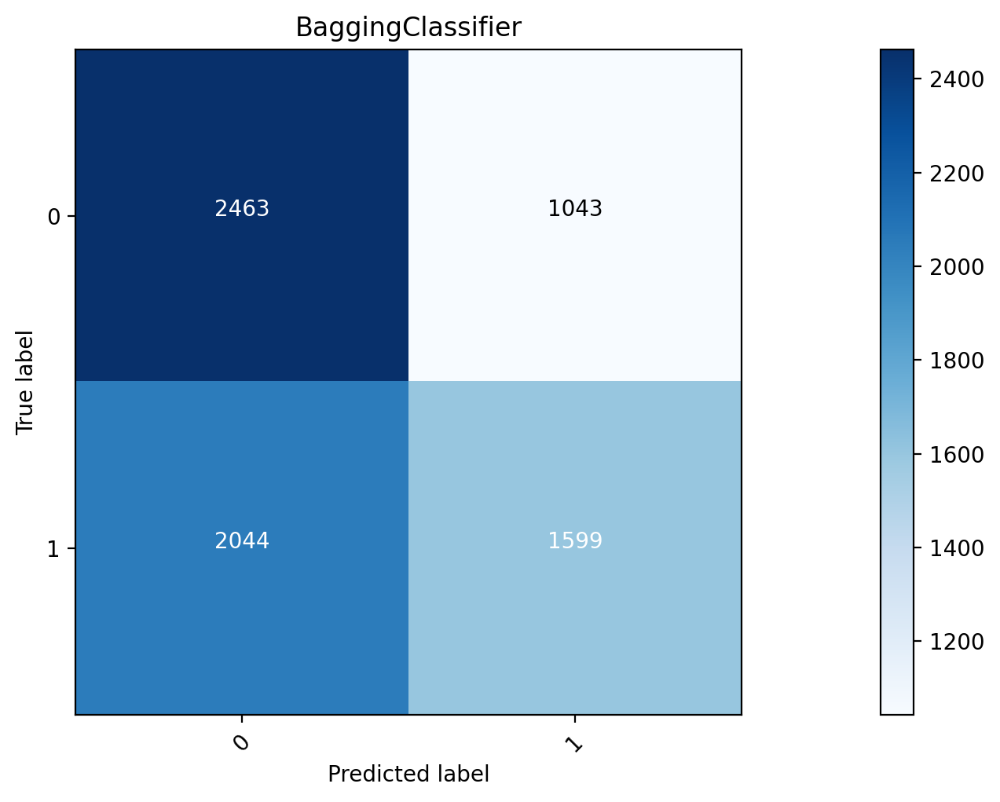

2016
roc_auc = 0.59
Time to train = 21.12 seconds
точность: 0.7030527289546716
полнота: 0.29589254428654854


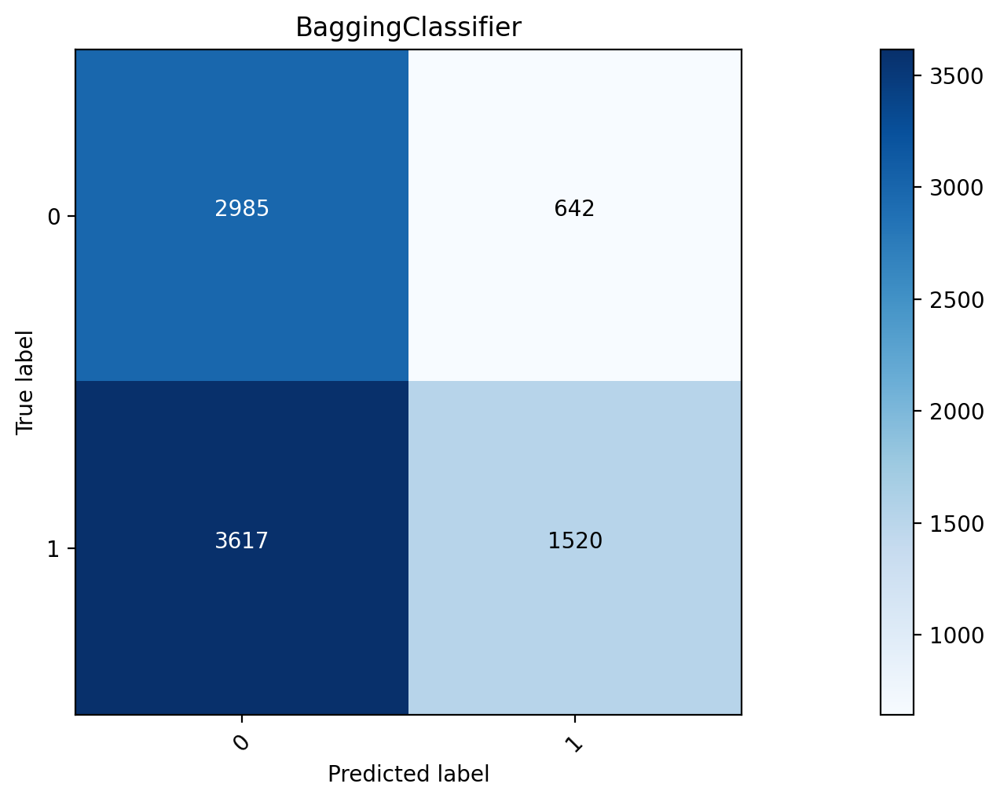

2017
roc_auc = 0.59
Time to train = 27.42 seconds
точность: 0.6794722545595654
полнота: 0.3096922532720198


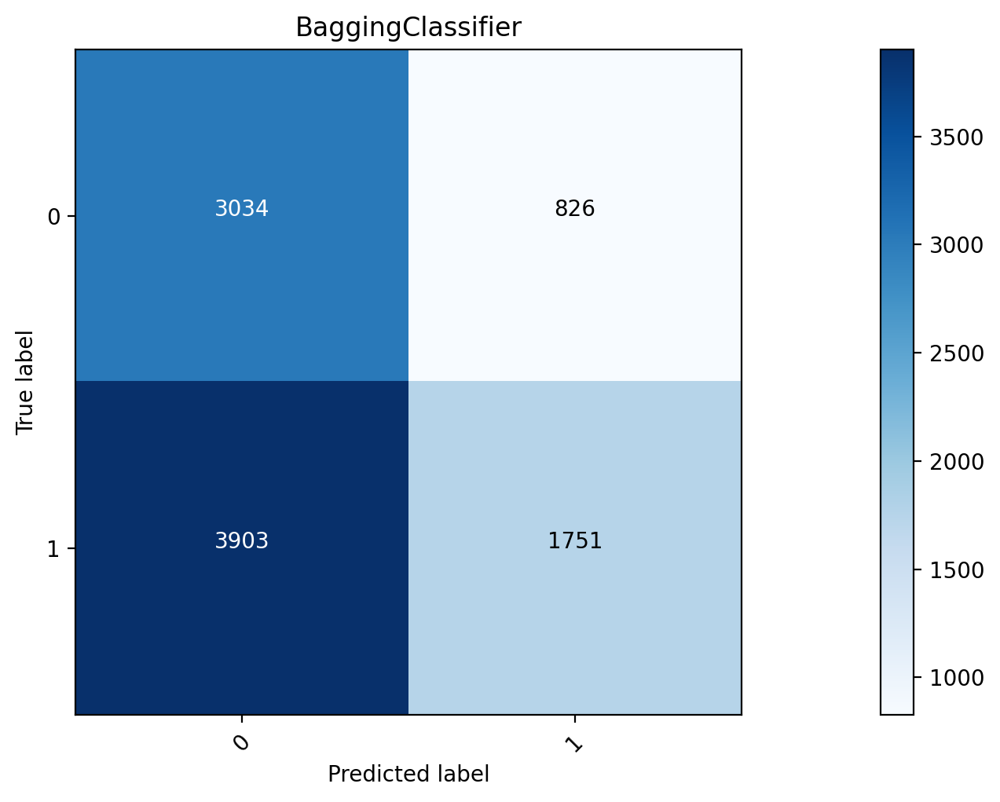

2018
roc_auc = 0.62
Time to train = 35.46 seconds
точность: 0.8157589803012746
полнота: 0.23451032644903397


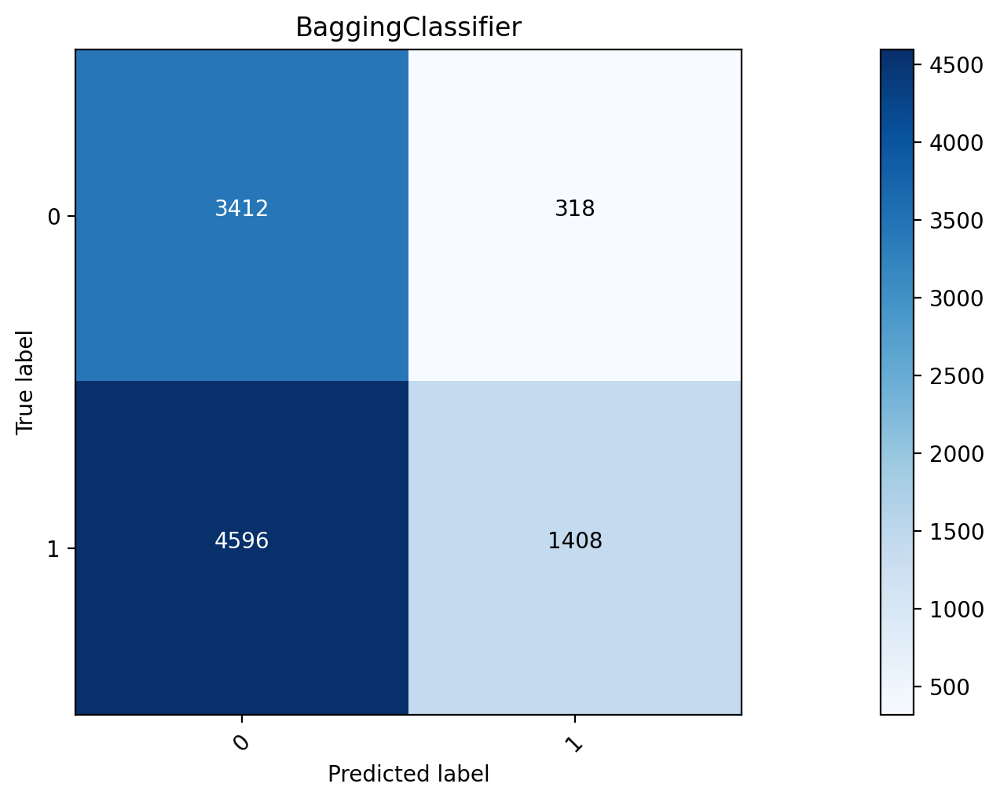

2019
roc_auc = 0.62
Time to train = 46.77 seconds
точность: 0.8450648839952811
полнота: 0.25841750841750843


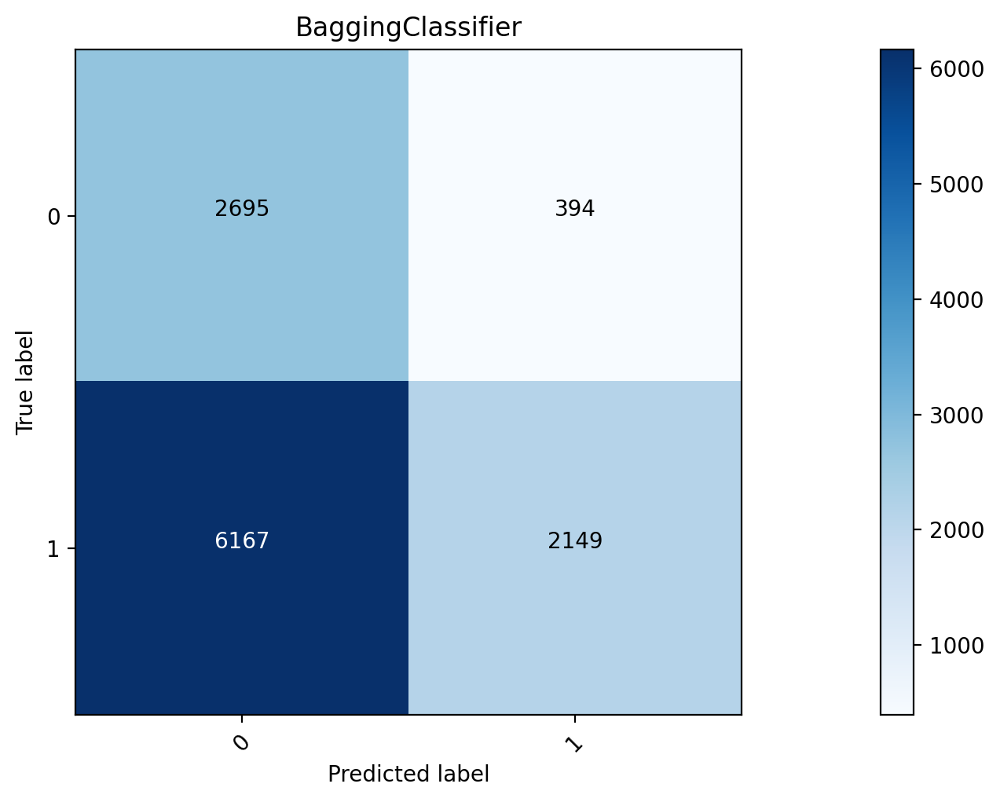

2020
roc_auc = 0.60
Time to train = 58.24 seconds
точность: 0.8769487750556793
полнота: 0.21118262268704746


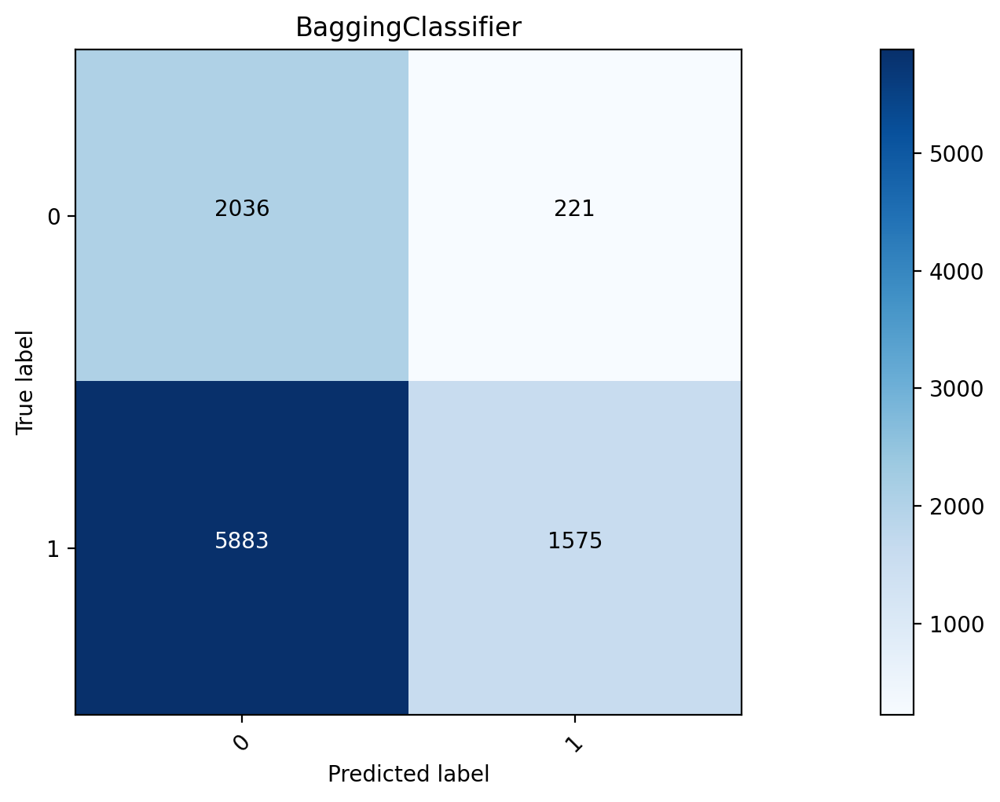

2021
roc_auc = 0.58
Time to train = 64.09 seconds
точность: 0.743907842268498
полнота: 0.2664233576642336


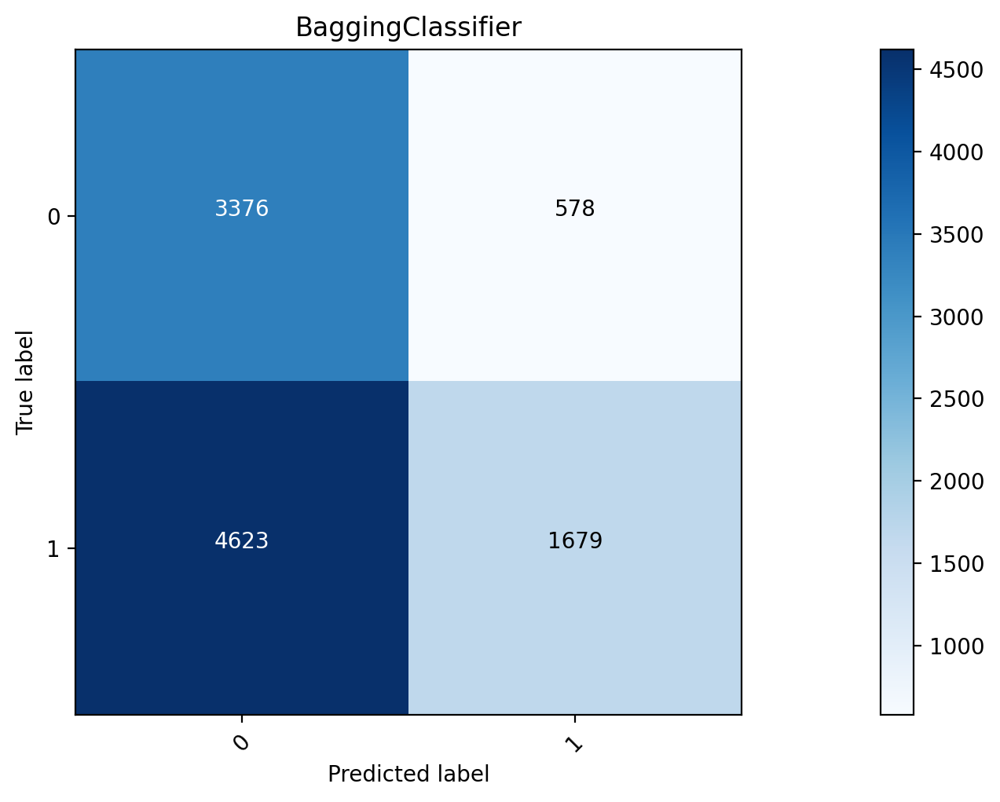

2022
roc_auc = 0.70
Time to train = 74.15 seconds
точность: 0.7842441447835344
полнота: 0.5240692435380603


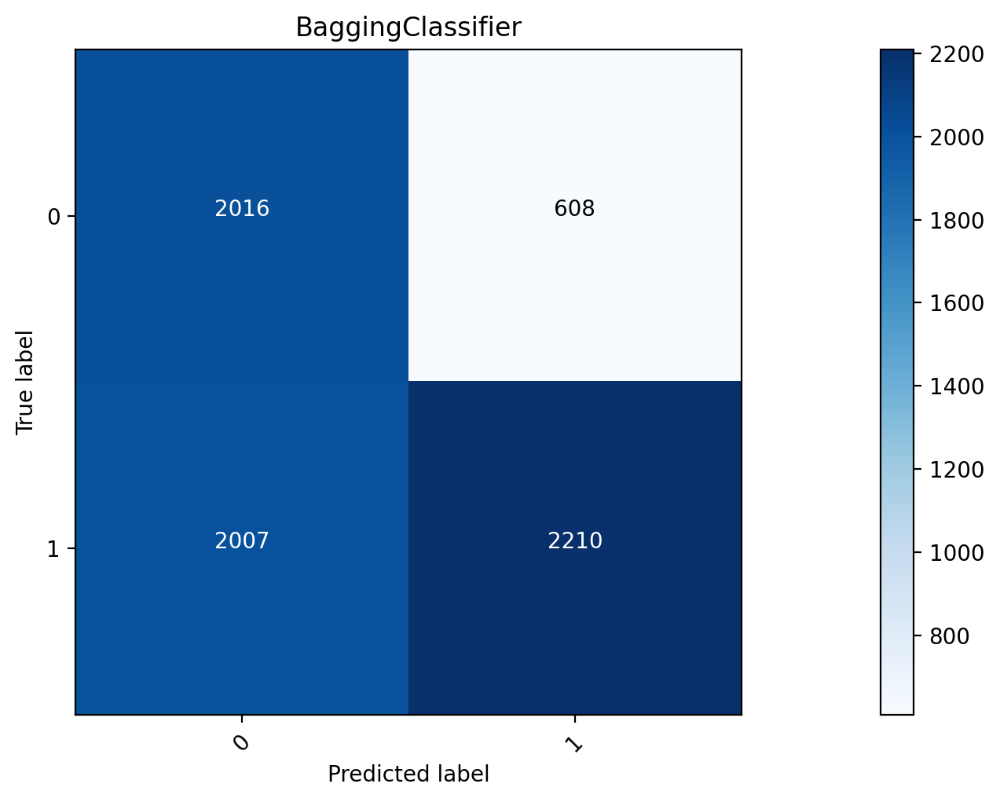

In [107]:
for i in range (2008, 2022):
    train = s[s.index.year <= i]
    test = s[s.index.year == i + 1]
    X_train = train.drop(columns=['value'])
    X_test = test.drop(columns=['value'])
    y_train = train['value']
    y_test = test['value']
    t0 = time.time()
    lr_model = BaggingClassifier(random_state=42, n_estimators=100)
    lr_model.fit(X_train, y_train)


    lr_y = y_test.values

    lr_y_pred = lr_model.predict_proba(X_test)
    tF = time.time()


    lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
    print(str(i+1))
    print('roc_auc = %.2f' % lr_rocauc)
    print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
    probs_val = lr_y_pred[:,1]
    cl = (probs_val == 1).astype(int)
    print('точность:', precision_score(y_test, cl))
    print('полнота:', recall_score(y_test, cl))
    plot_confusion_matrix(confusion_matrix(y_test, cl), classes=['0','1'], title='BaggingClassifier')

2009
roc_auc = 0.78
Time to train = 0.32 seconds
точность: 0.9693486590038314
полнота: 0.5476190476190477


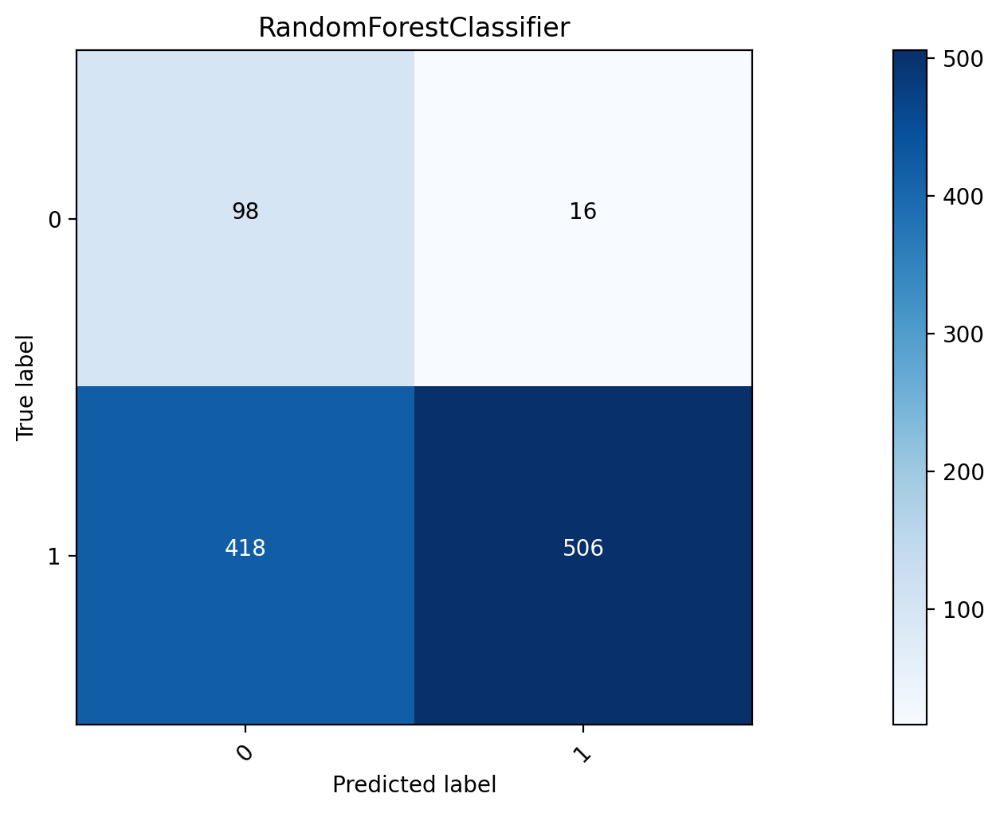

2010
roc_auc = 0.34
Time to train = 0.36 seconds
точность: 0.3044315992292871
полнота: 0.19506172839506172


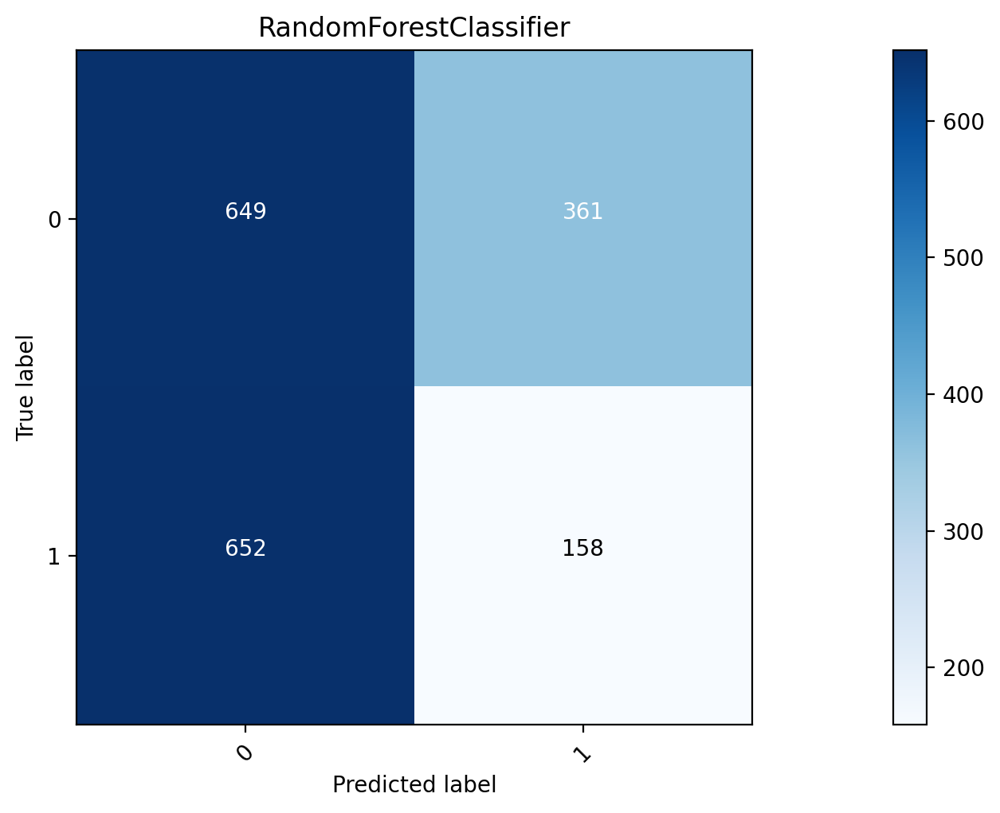

2011
roc_auc = 0.53
Time to train = 0.67 seconds
точность: 0.5023148148148148
полнота: 0.18658641444539983


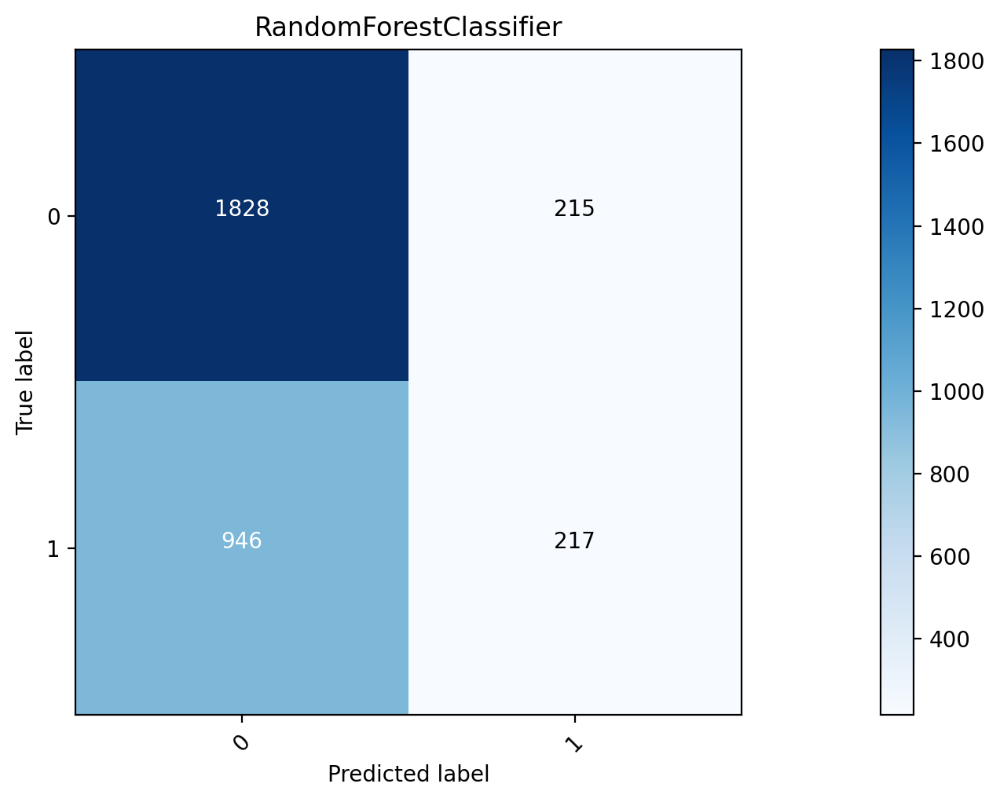

2012
roc_auc = 0.58
Time to train = 0.83 seconds
точность: 0.48826291079812206
полнота: 0.11521418020679468


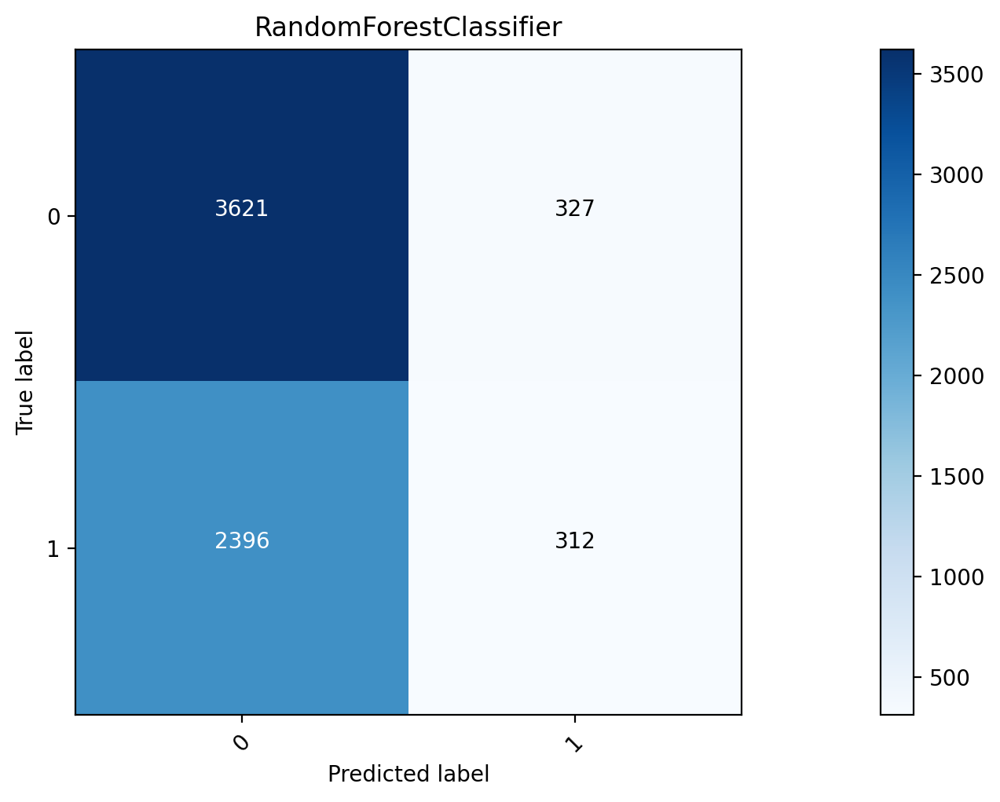

2013
roc_auc = 0.61
Time to train = 1.52 seconds
точность: 0.7042513863216266
полнота: 0.14575363427697016


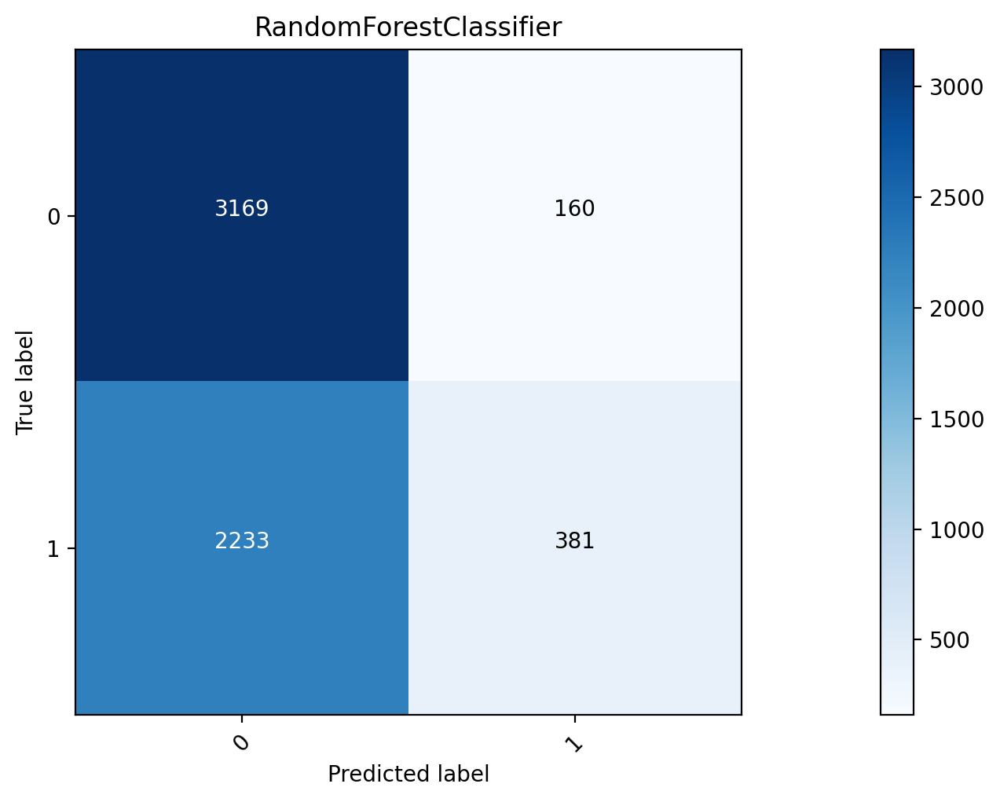

2014
roc_auc = 0.58
Time to train = 2.33 seconds
точность: 0.7627464309993202
полнота: 0.21058558558558557


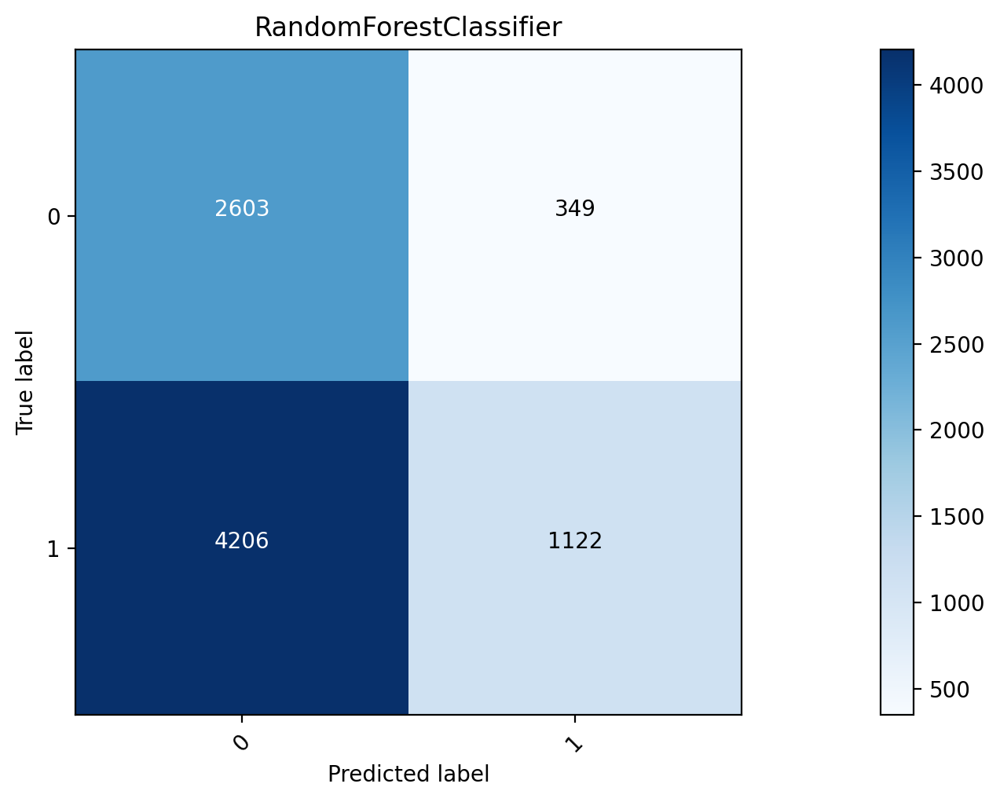

2015
roc_auc = 0.57
Time to train = 3.31 seconds
точность: 0.6088344864289515
полнота: 0.31402690090584684


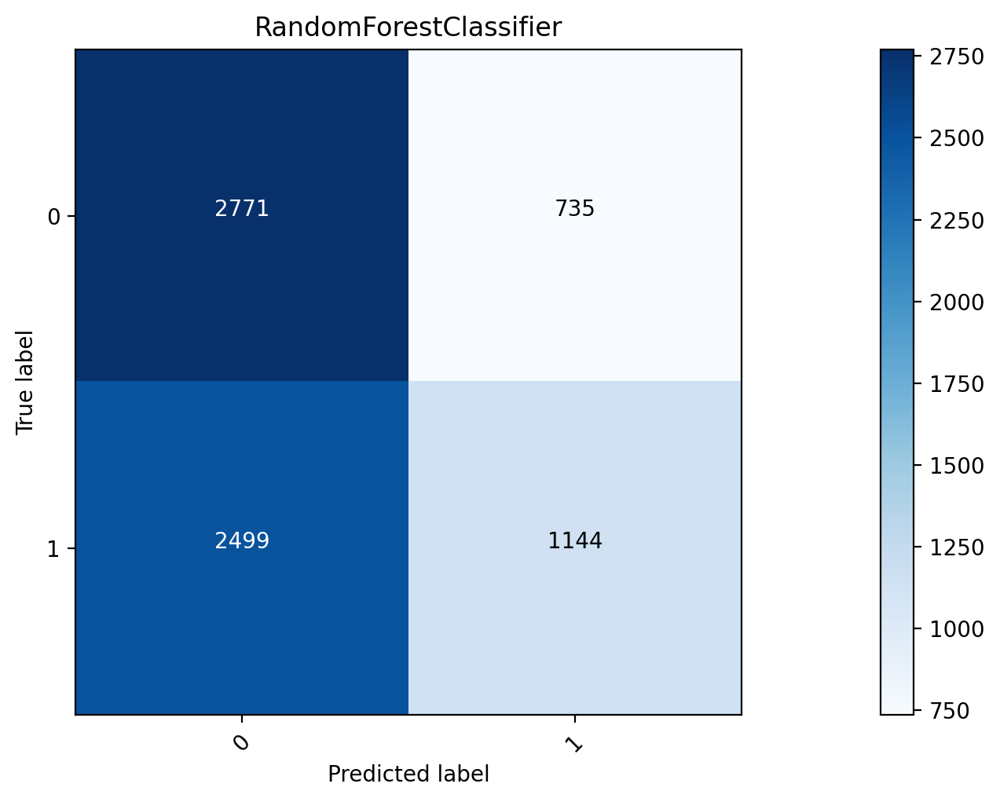

2016
roc_auc = 0.58
Time to train = 4.37 seconds
точность: 0.6884318766066838
полнота: 0.26065797157874243


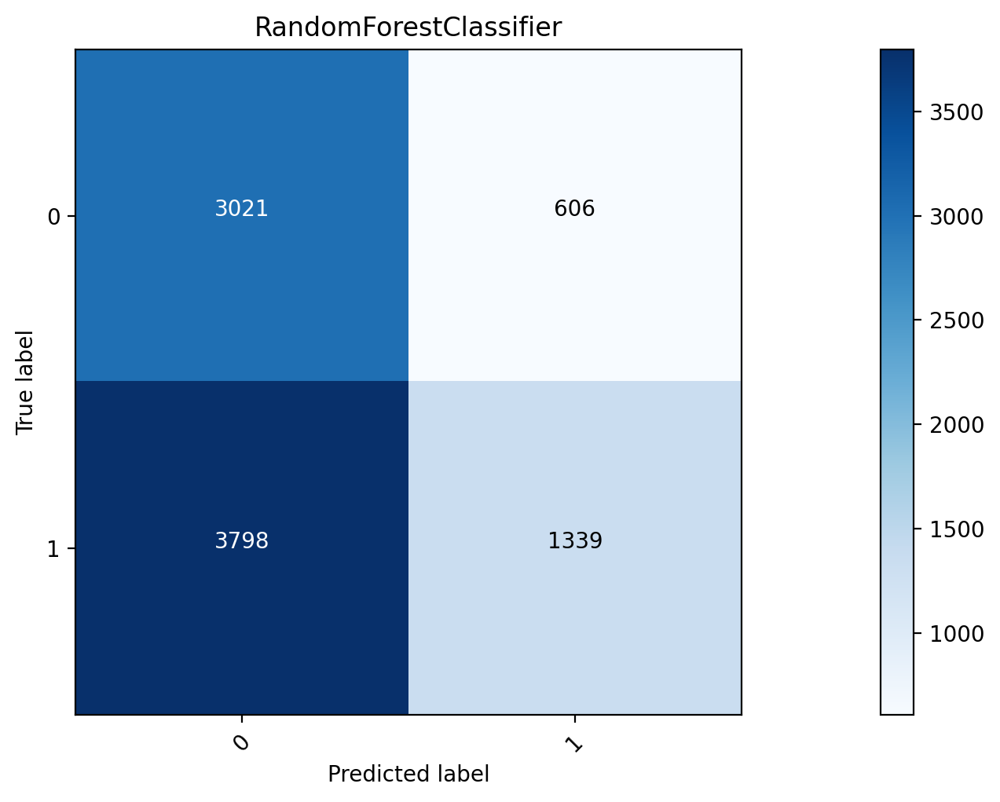

2017
roc_auc = 0.57
Time to train = 5.37 seconds
точность: 0.7036095577020844
полнота: 0.24478245489918643


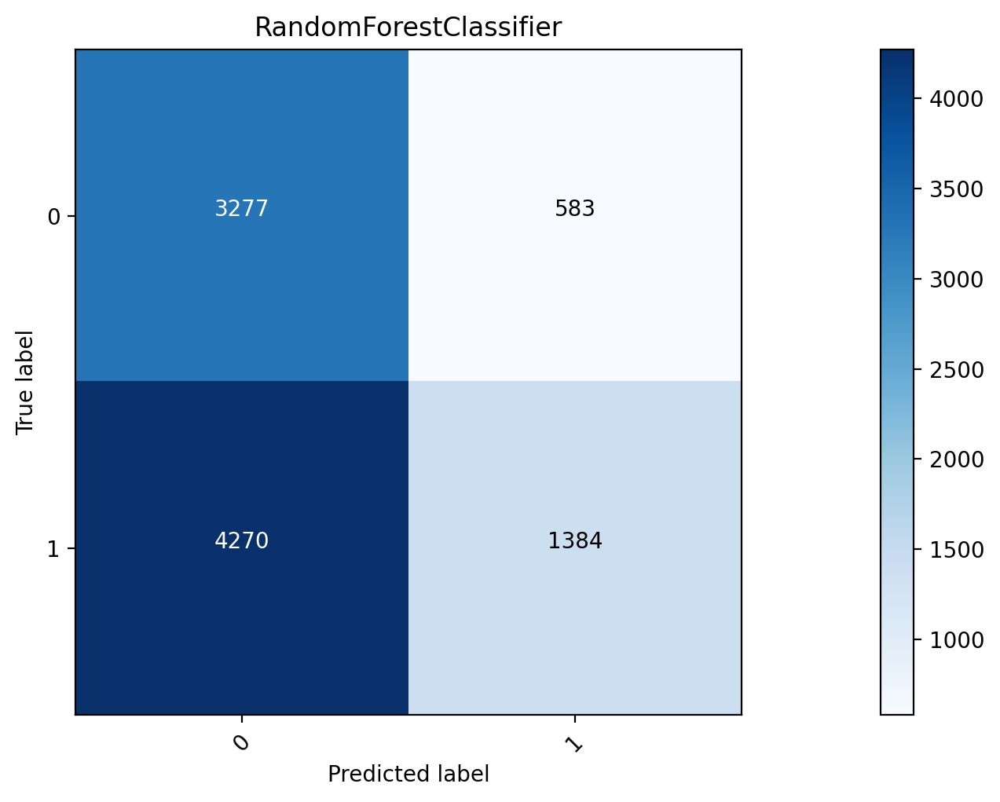

2018
roc_auc = 0.56
Time to train = 6.45 seconds
точность: 0.6683322923173017
полнота: 0.1782145236508994


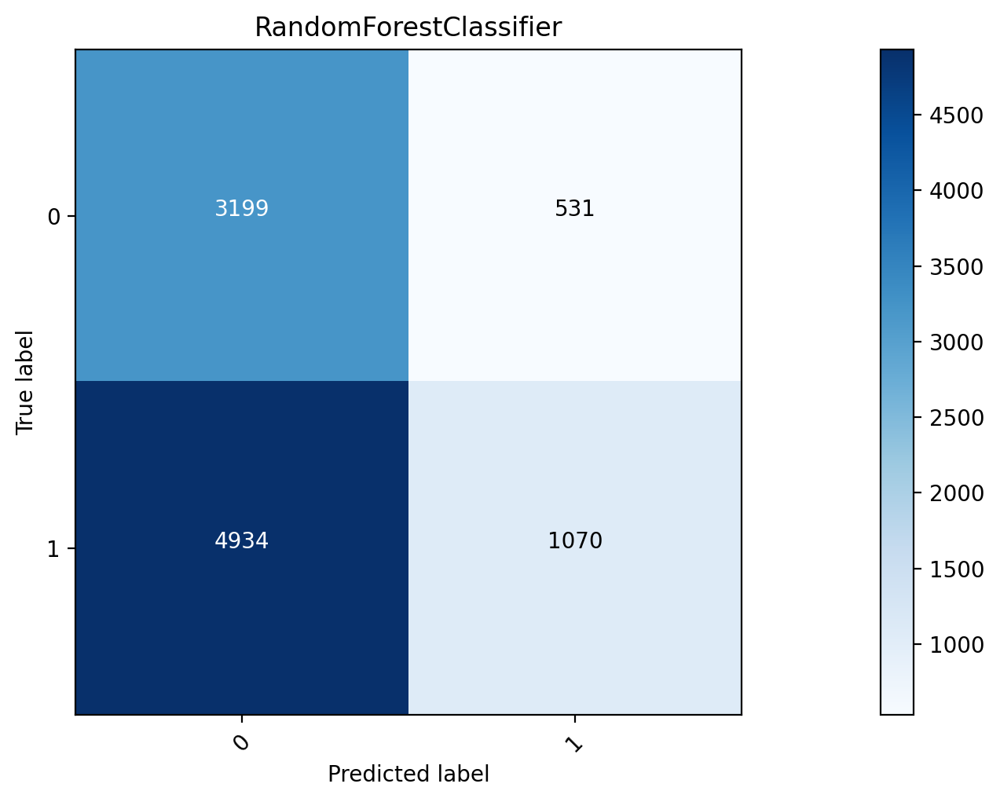

2019
roc_auc = 0.57
Time to train = 7.70 seconds
точность: 0.8479396401625072
полнота: 0.1756854256854257


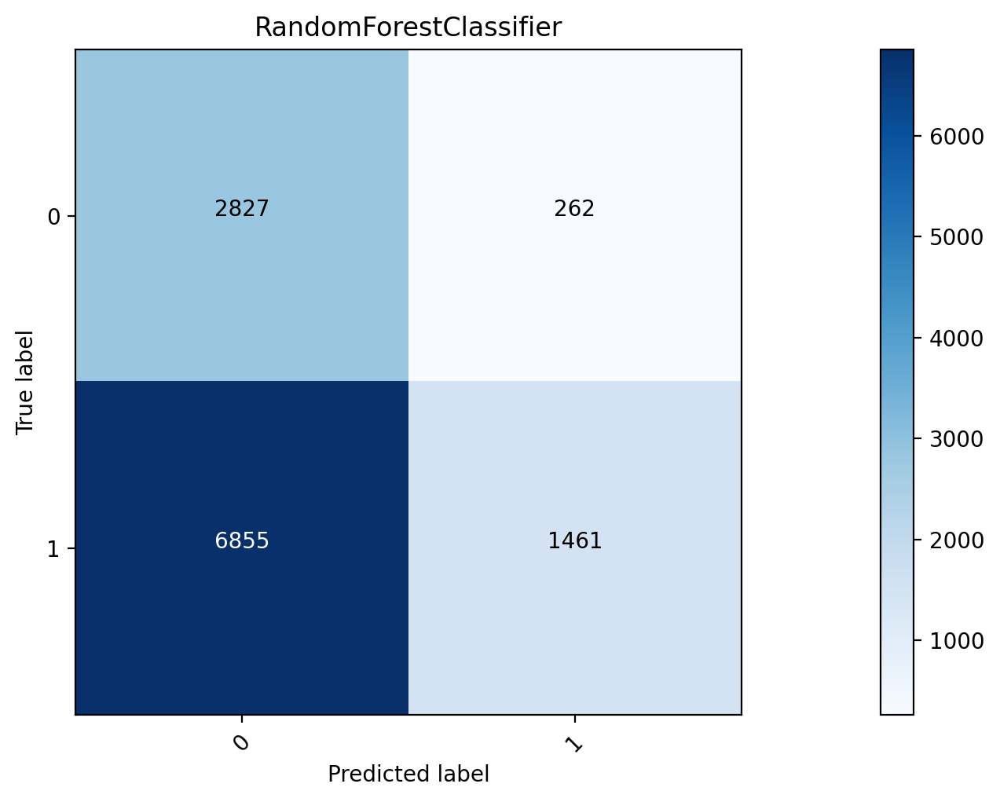

2020
roc_auc = 0.56
Time to train = 9.08 seconds
точность: 0.8429042904290429
полнота: 0.17122552963260929


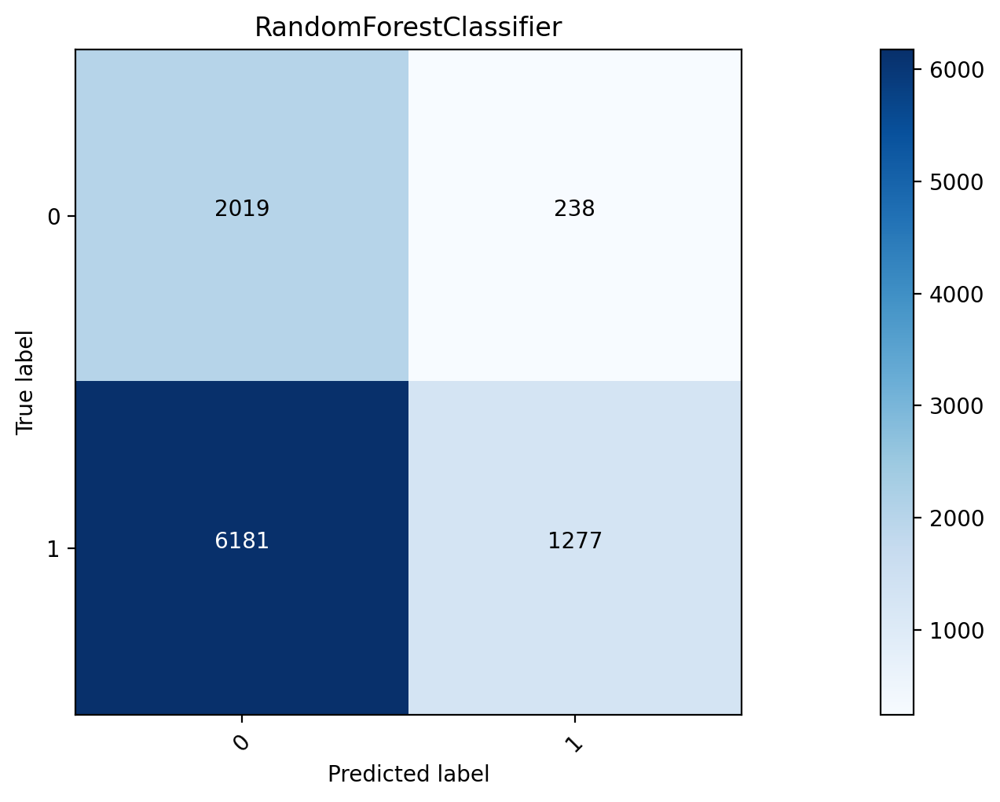

2021
roc_auc = 0.58
Time to train = 10.00 seconds
точность: 0.7972620599739244
полнота: 0.19406537607108854


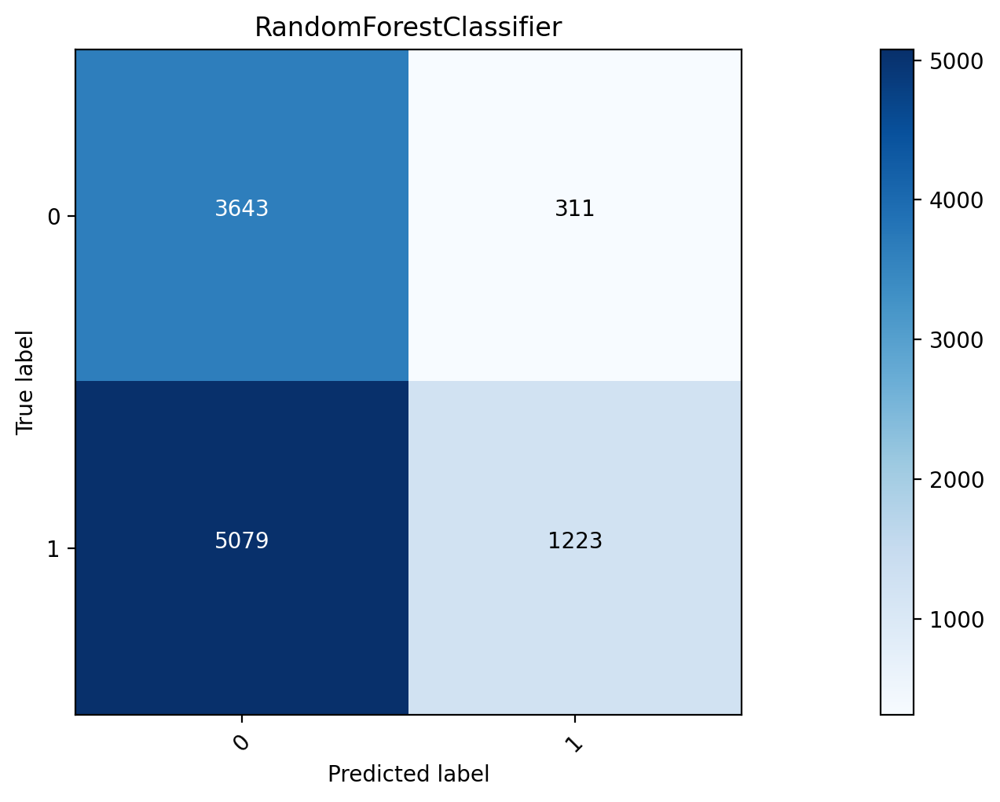

2022
roc_auc = 0.63
Time to train = 11.07 seconds
точность: 0.8242009132420092
полнота: 0.2568176428740811


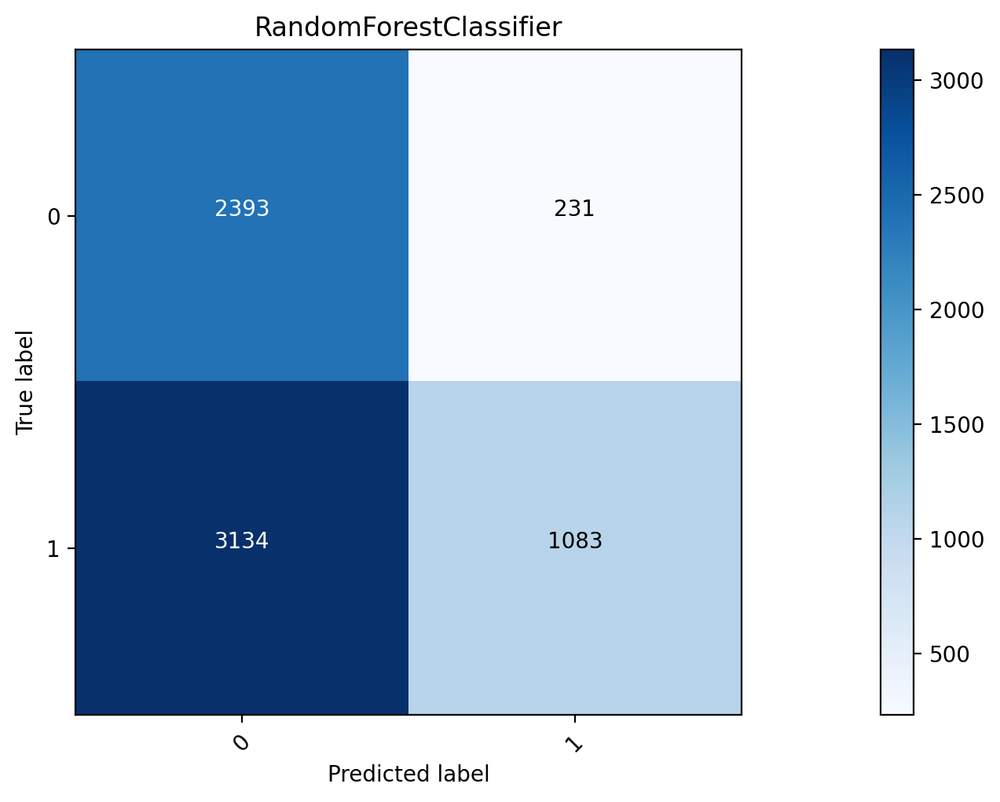

In [111]:
for i in range (2008, 2022):
    train = s[s.index.year <= i]
    test = s[s.index.year == i + 1]
    X_train = train.drop(columns=['value'])
    X_test = test.drop(columns=['value'])
    y_train = train['value']
    y_test = test['value']
    t0 = time.time()
    lr_model = RandomForestClassifier(max_features=None, n_estimators=100, oob_score=True, random_state=42)
    lr_model.fit(X_train, y_train)


    lr_y = y_test.values

    lr_y_pred = lr_model.predict_proba(X_test)
    tF = time.time()


    lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
    print(str(i+1))
    print('roc_auc = %.2f' % lr_rocauc)
    print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
    probs_val = lr_y_pred[:,1]
    cl = (probs_val == 1).astype(int)
    print('точность:', precision_score(y_test, cl))
    print('полнота:', recall_score(y_test, cl))
    plot_confusion_matrix(confusion_matrix(y_test, cl), classes=['0','1'], title='RandomForestClassifier')
    




2009
roc_auc = 0.69
Time to train = 1.59 seconds
точность: 0.9932432432432432
полнота: 0.1590909090909091


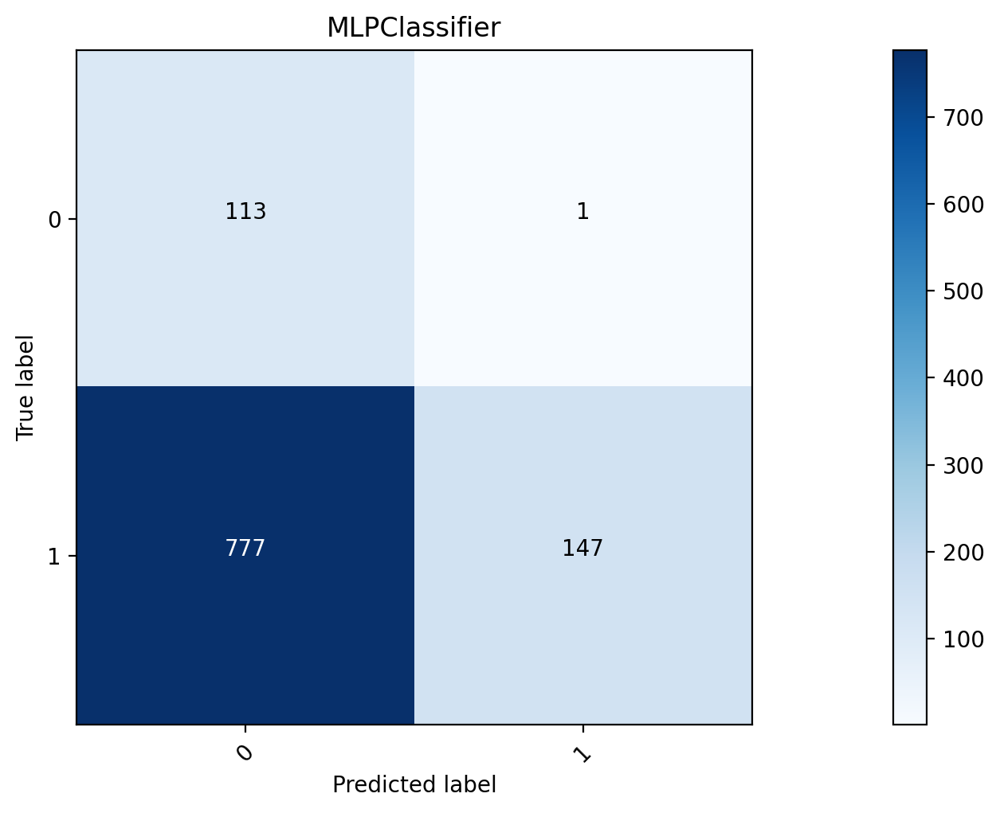

2010
roc_auc = 0.39
Time to train = 2.43 seconds
точность: 0.44144144144144143
полнота: 0.30246913580246915


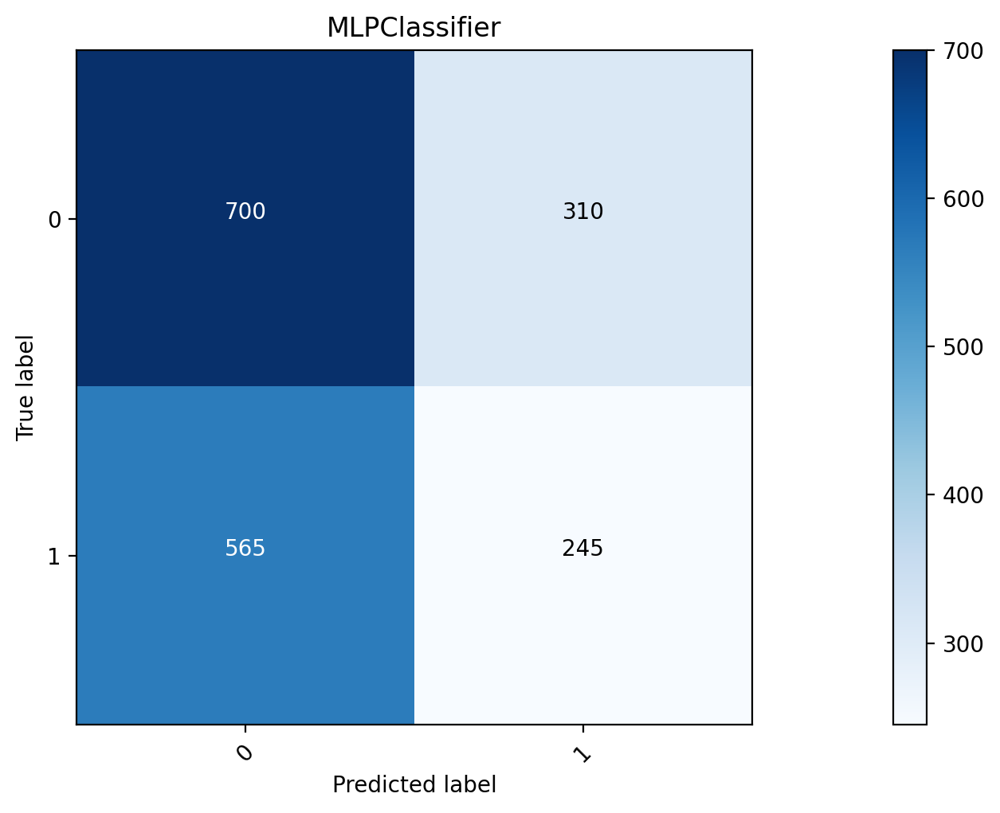

2011
roc_auc = 0.47
Time to train = 4.09 seconds
точность: 0.5925
полнота: 0.20378331900257954


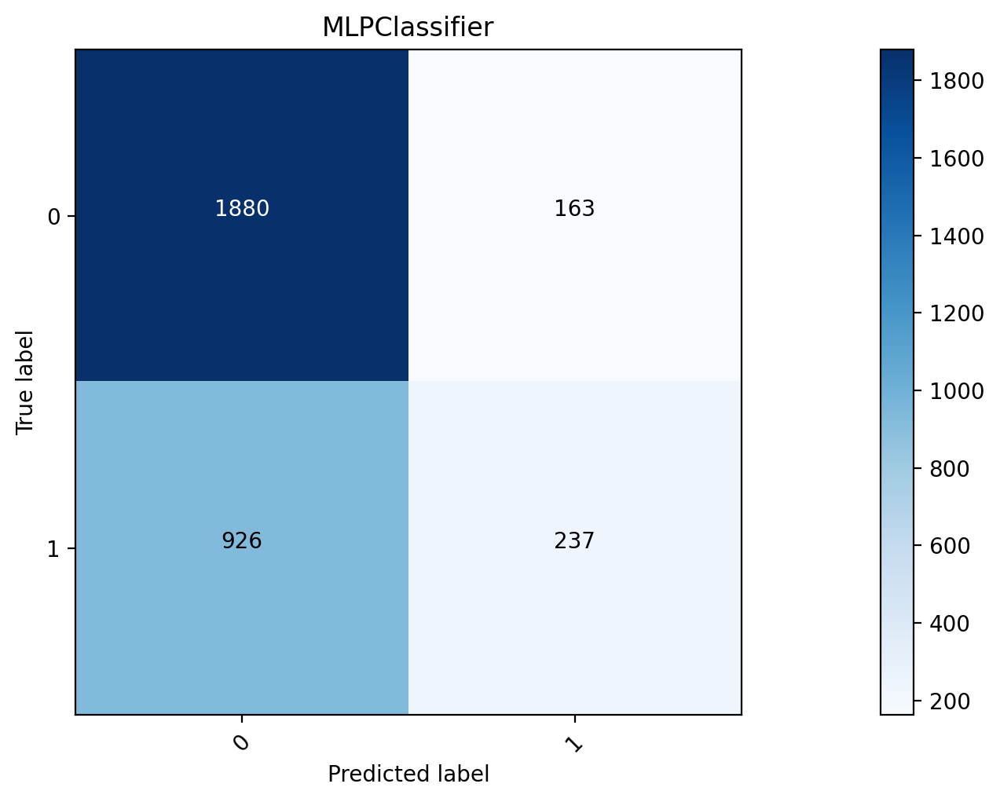

2012
roc_auc = 0.59
Time to train = 7.40 seconds
точность: 0.5482625482625483
полнота: 0.2621861152141802


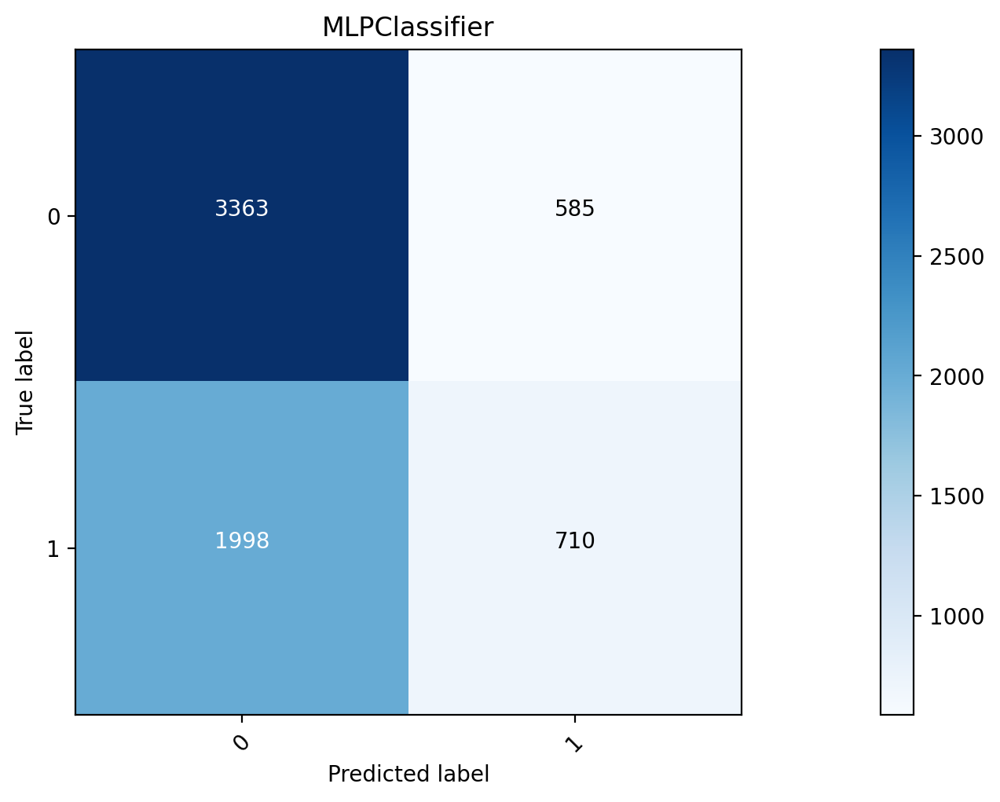

2013
roc_auc = 0.63
Time to train = 13.15 seconds
точность: 0.6549893842887473
полнота: 0.23603672532517214


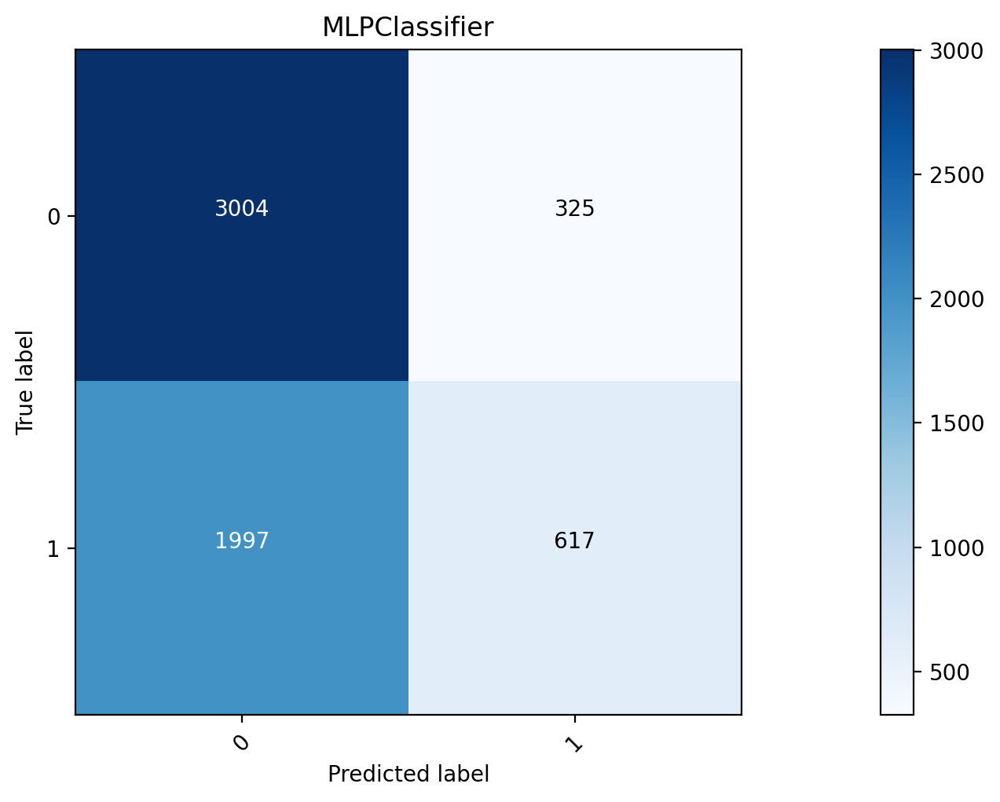

2014
roc_auc = 0.49
Time to train = 18.43 seconds
точность: 0.7417417417417418
полнота: 0.09271771771771772


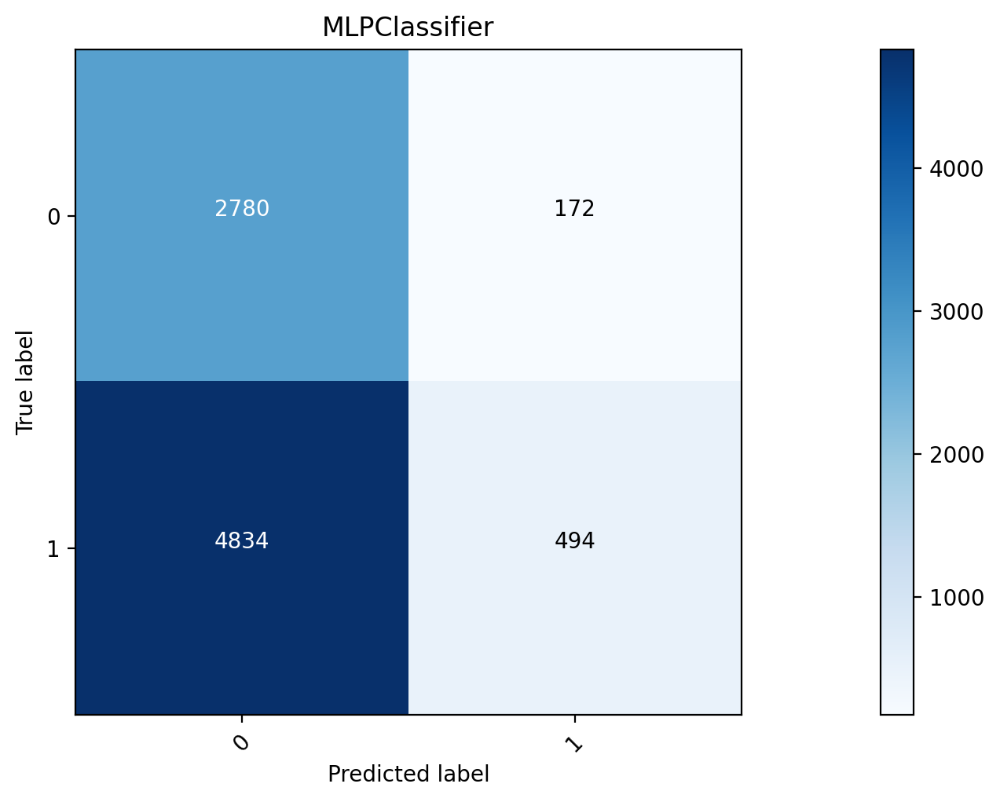

2015
roc_auc = 0.58
Time to train = 26.00 seconds
точность: 0.6092530657748049
полнота: 0.3000274499039253


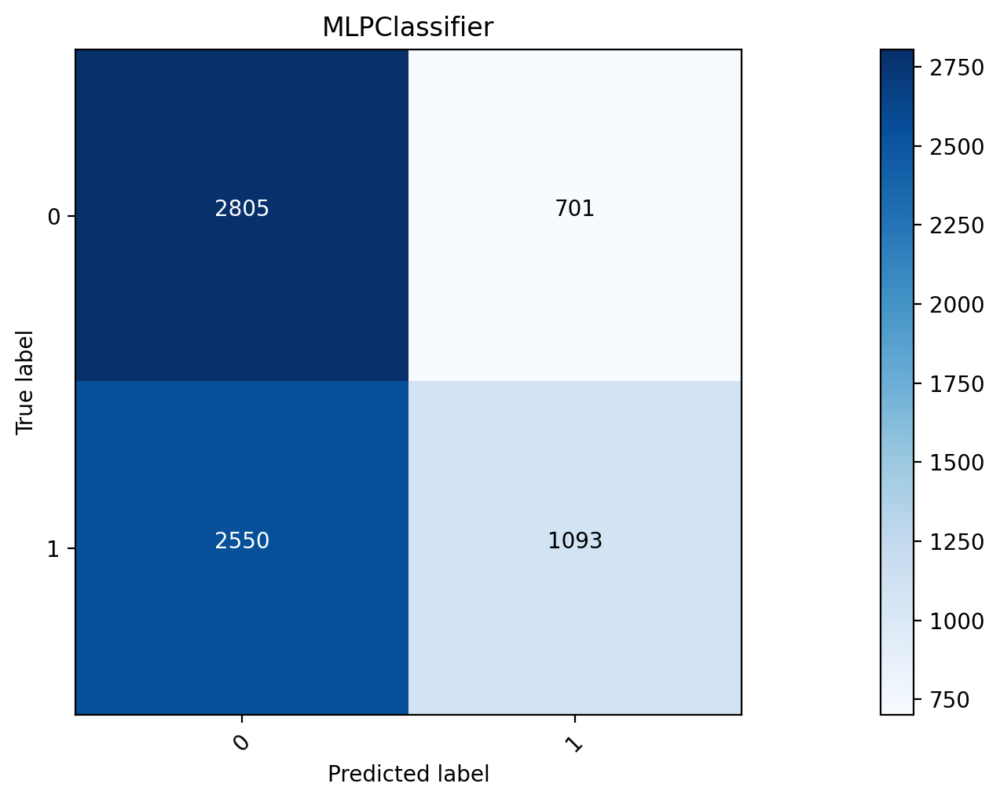

2016
roc_auc = 0.56
Time to train = 31.21 seconds
точность: 0.6060606060606061
полнота: 0.17909285575238465


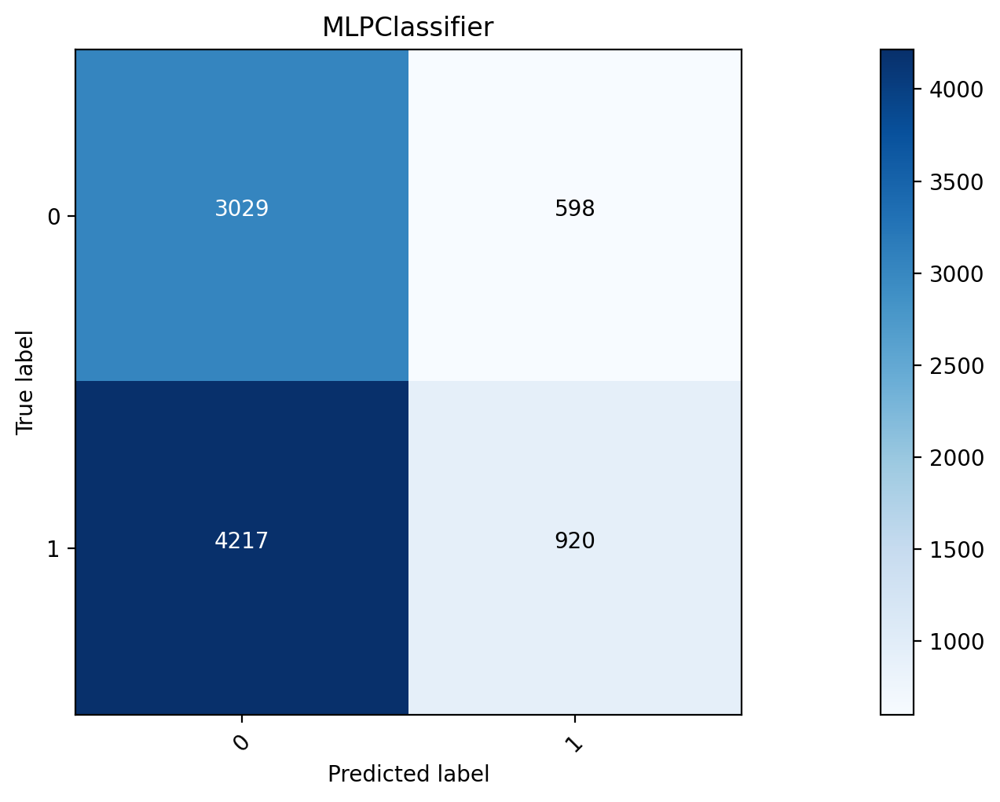

2017
roc_auc = 0.67
Time to train = 41.61 seconds
точность: 0.8156521739130435
полнота: 0.08295012380615494


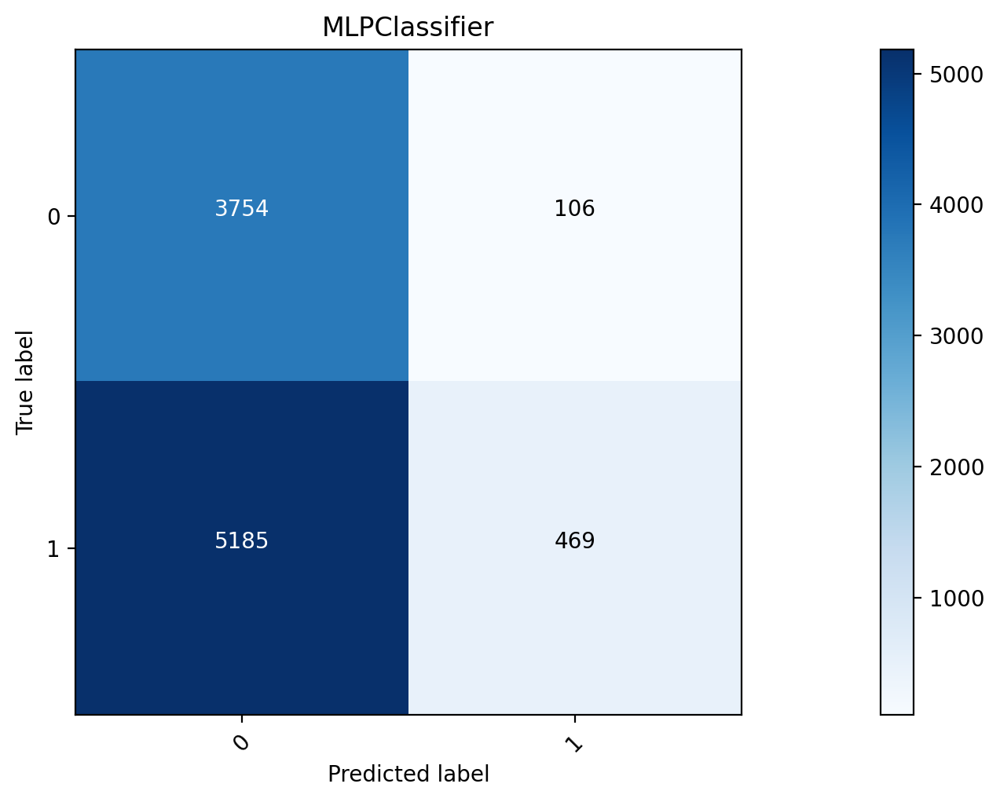

2018
roc_auc = 0.64
Time to train = 32.96 seconds
точность: 0.8152827918170878
полнота: 0.22568287808127915


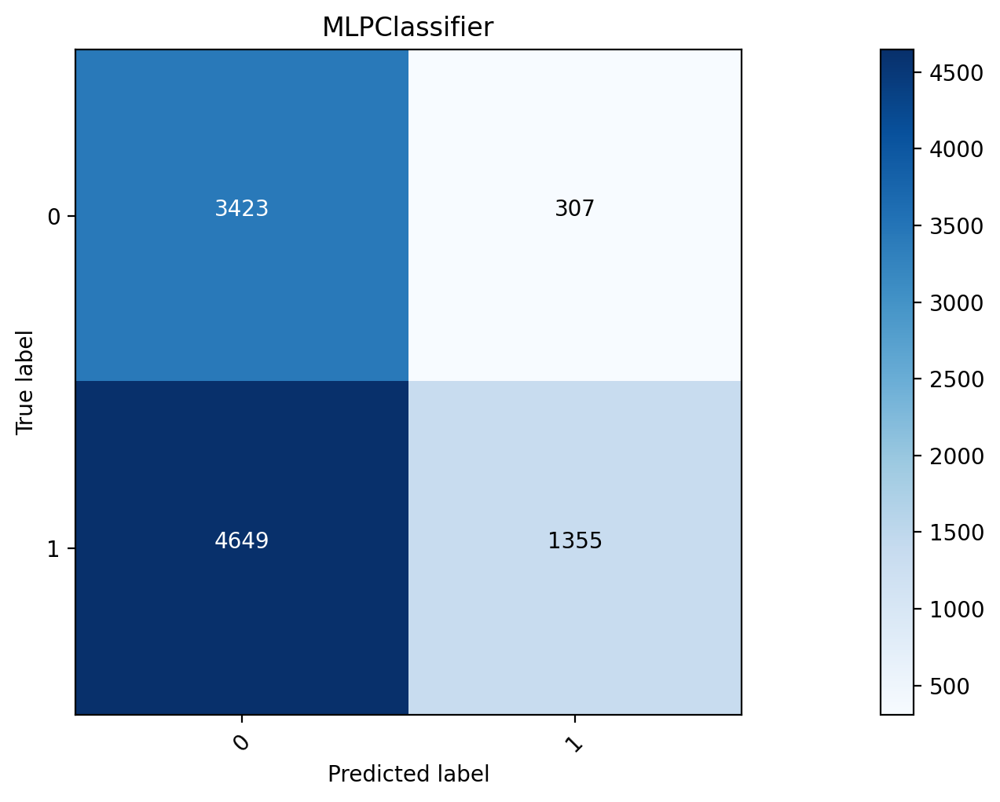

2019
roc_auc = 0.66
Time to train = 58.04 seconds
точность: 0.8816568047337278
полнота: 0.25084175084175087


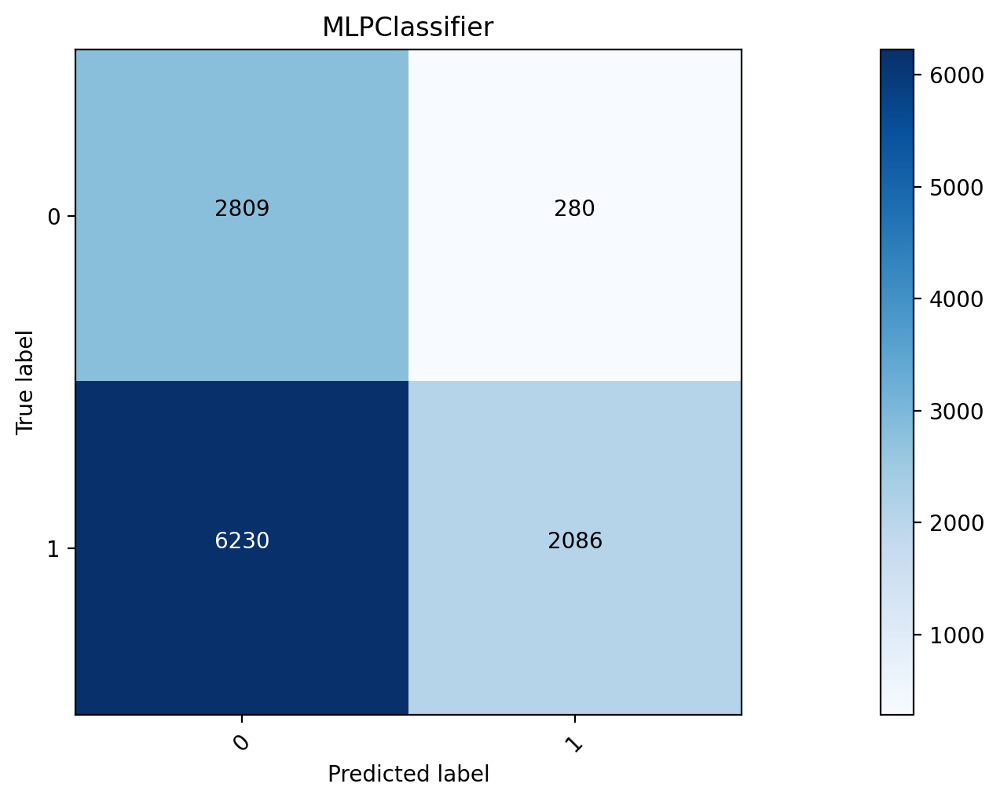

2020
roc_auc = 0.59
Time to train = 69.77 seconds
точность: 0.8781478472786353
полнота: 0.14494502547599894


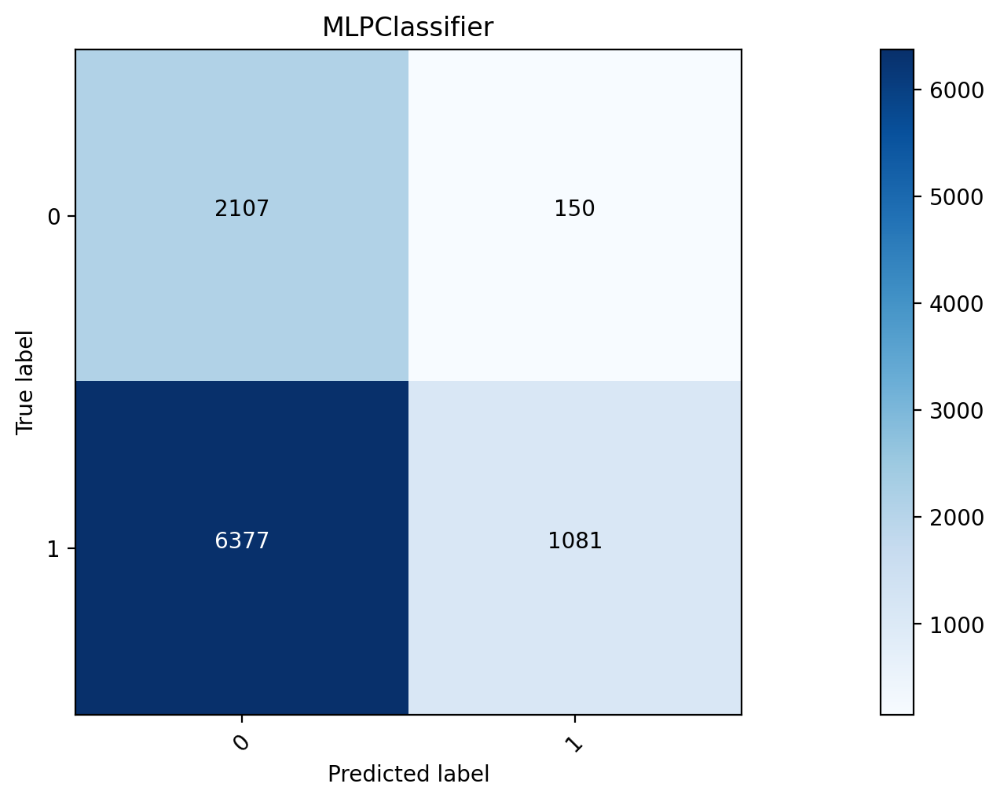

2021
roc_auc = 0.60
Time to train = 78.87 seconds
точность: 0.7812911725955204
полнота: 0.18819422405585529


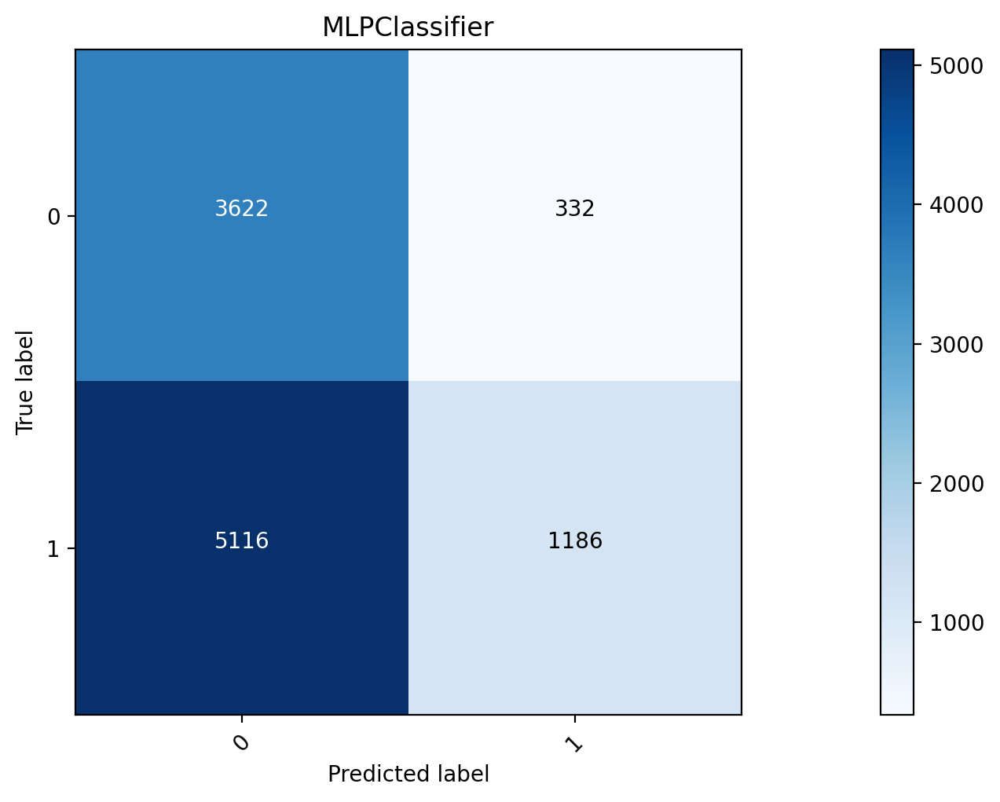

2022
roc_auc = 0.73
Time to train = 69.60 seconds
точность: 0.8353182751540041
полнота: 0.4823334123784681


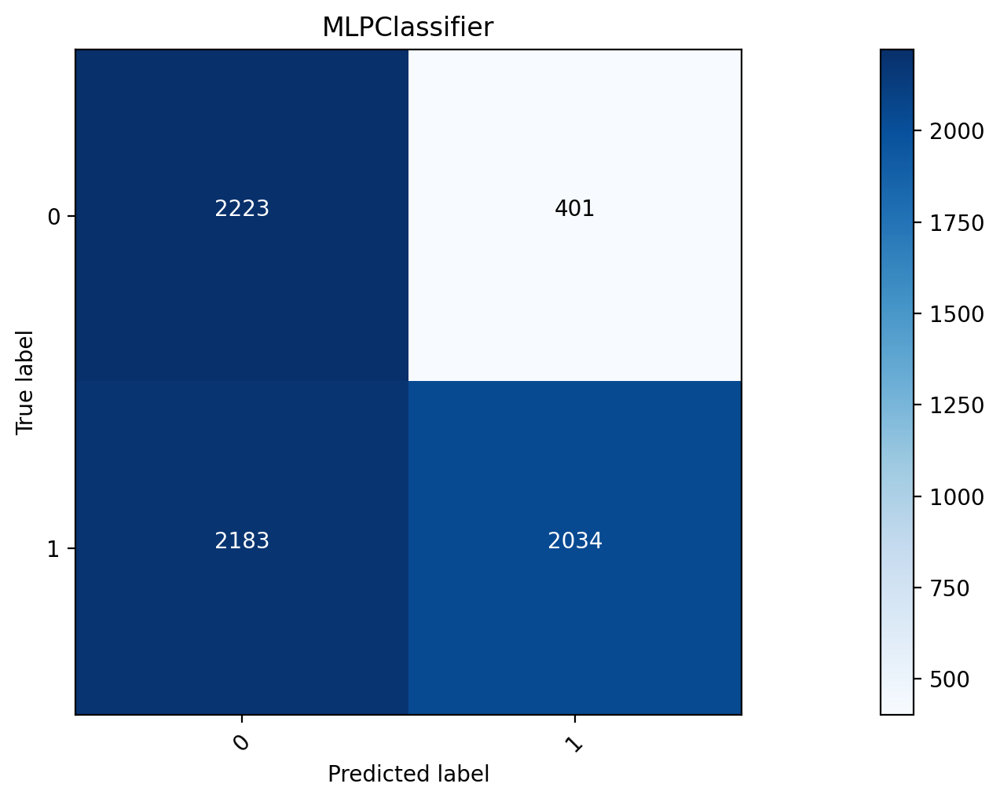

In [112]:
for i in range (2008, 2022):
    train = s[s.index.year <= i]
    test = s[s.index.year == i + 1]
    X_train = train.drop(columns=['value'])
    X_test = test.drop(columns=['value'])
    y_train = train['value']
    y_test = test['value']
    t0 = time.time()
    lr_model = MLPClassifier(activation='tanh', random_state=42)
    lr_model.fit(X_train, y_train)


    lr_y = y_test.values

    lr_y_pred = lr_model.predict_proba(X_test)
    tF = time.time()


    lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
    print(str(i+1))
    print('roc_auc = %.2f' % lr_rocauc)
    print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
    probs_val = lr_y_pred[:,1]
    cl = (probs_val > 0.8).astype(int)
    print('точность:', precision_score(y_test, cl))
    print('полнота:', recall_score(y_test, cl))
    plot_confusion_matrix(confusion_matrix(y_test, cl), classes=['0','1'], title='MLPClassifier')



2009
roc_auc = 0.78
Time to train = 0.29 seconds
точность: 0.9683426443202979
полнота: 0.5627705627705628


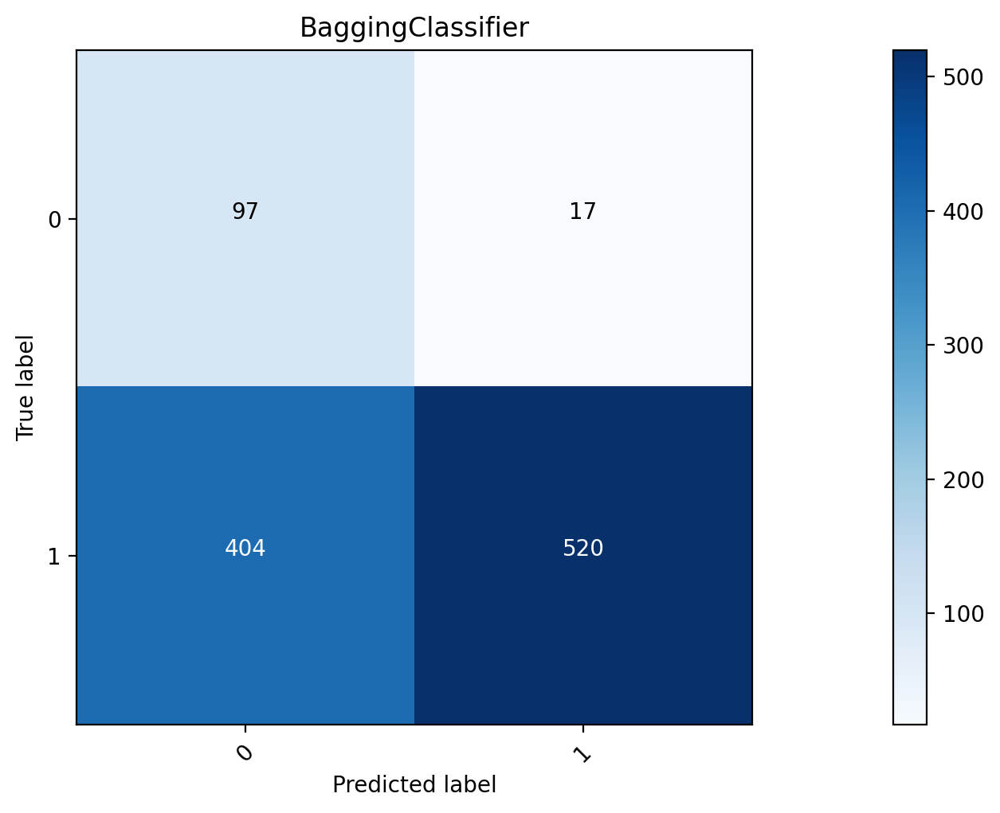

2010
roc_auc = 0.34
Time to train = 0.33 seconds
точность: 0.3030888030888031
полнота: 0.19382716049382717


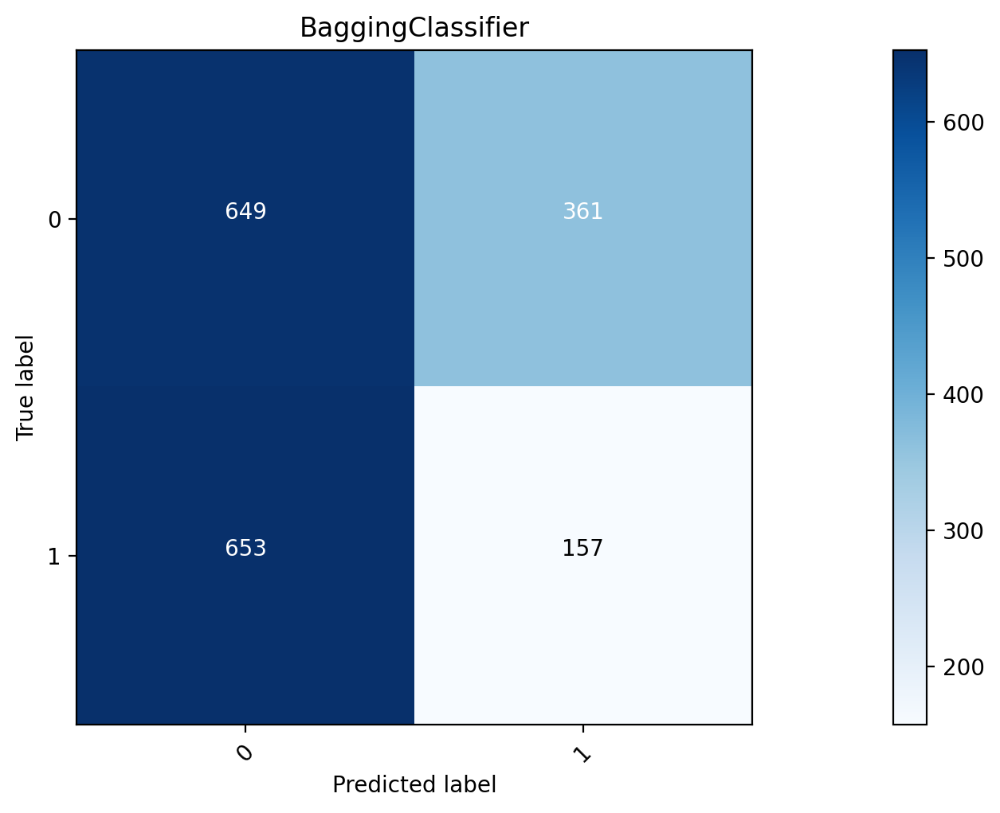

2011
roc_auc = 0.53
Time to train = 0.53 seconds
точность: 0.5023364485981309
полнота: 0.18486672398968185


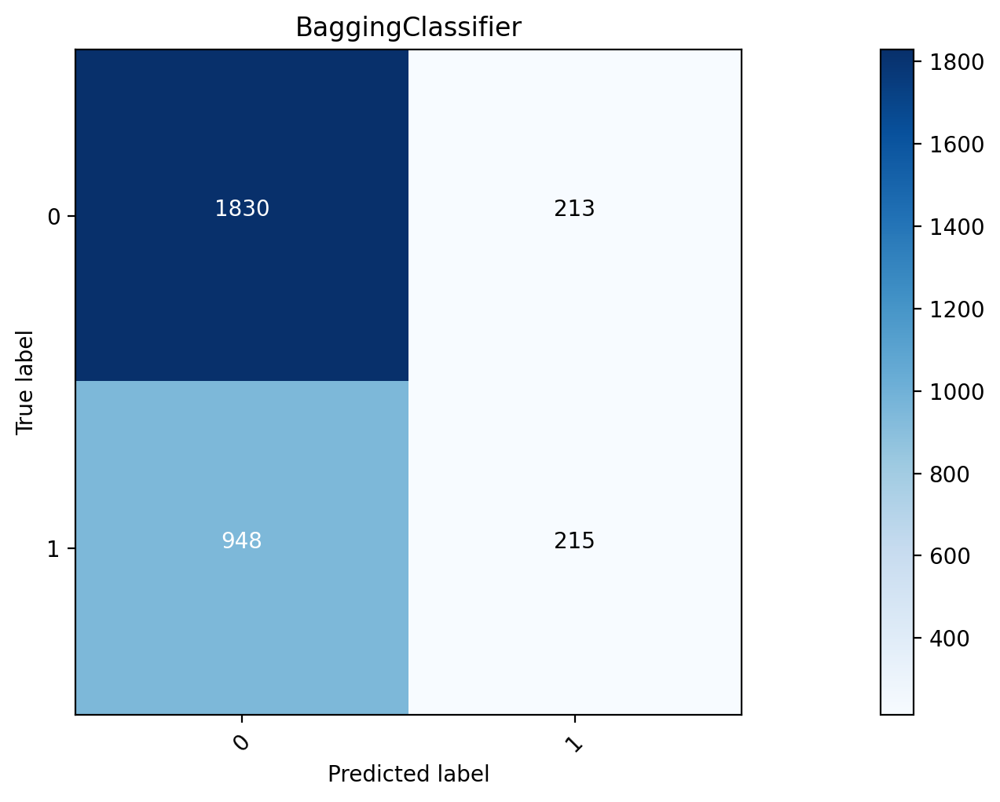

2012
roc_auc = 0.58
Time to train = 0.77 seconds
точность: 0.48826291079812206
полнота: 0.11521418020679468


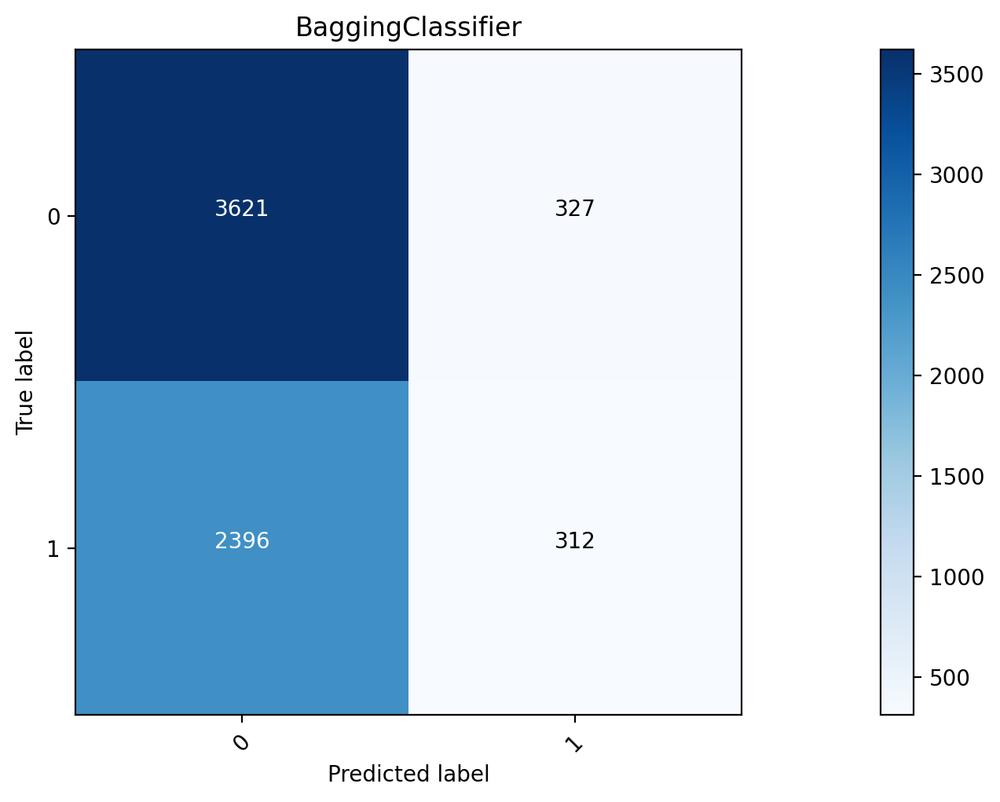

2013
roc_auc = 0.61
Time to train = 1.57 seconds
точность: 0.7051282051282052
полнота: 0.14728385615914308


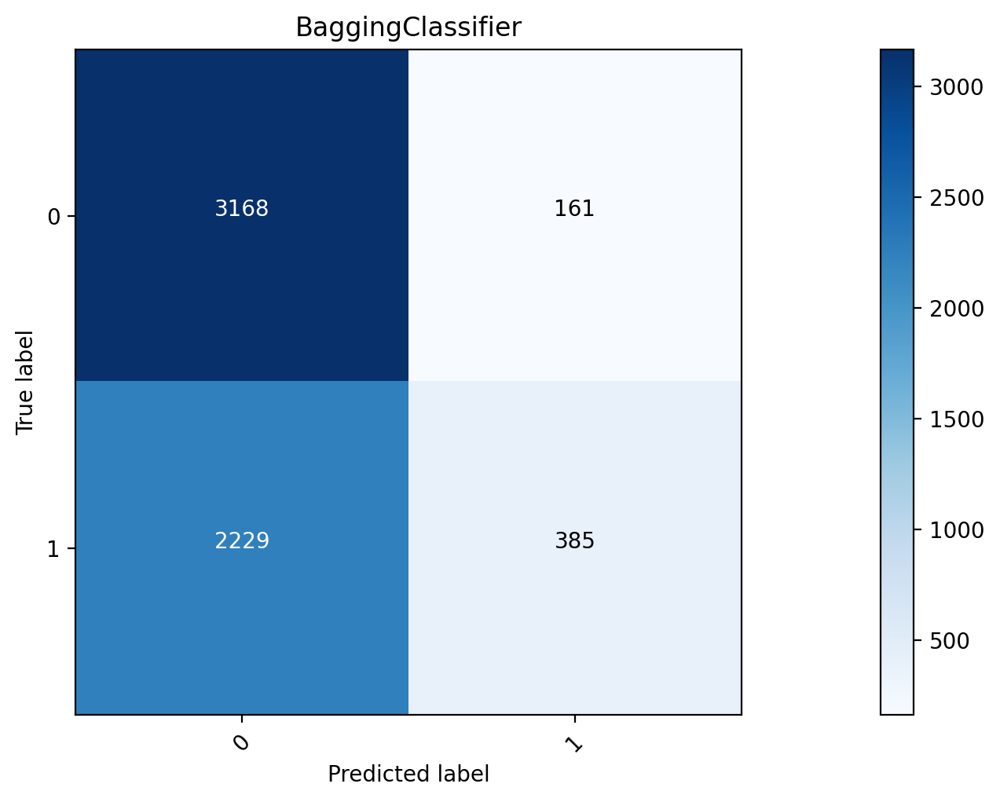

2014
roc_auc = 0.58
Time to train = 2.34 seconds
точность: 0.7613803230543319
полнота: 0.19463213213213212


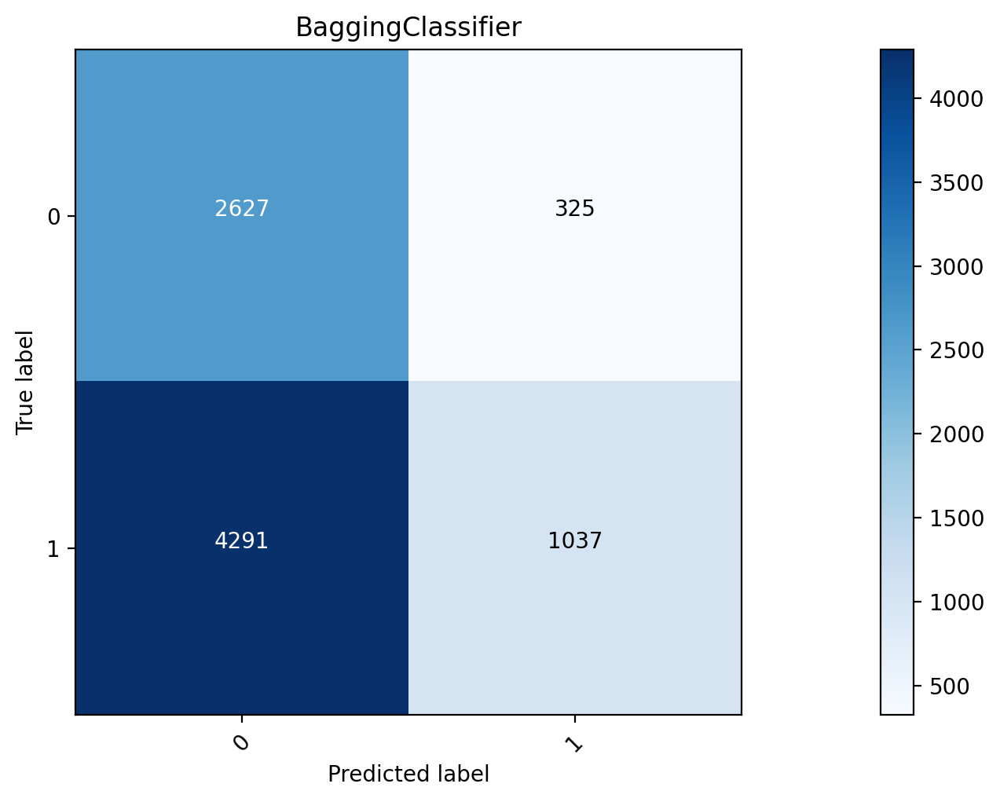

2015
roc_auc = 0.57
Time to train = 3.09 seconds
точность: 0.606687898089172
полнота: 0.3137524018665935


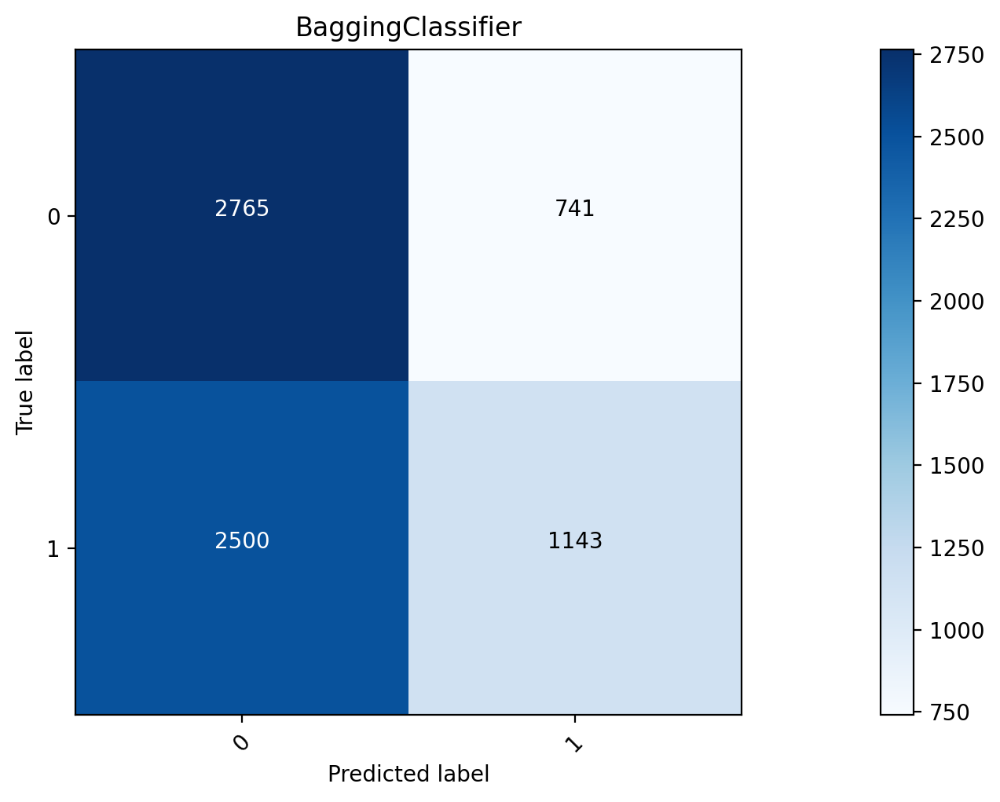

2016
roc_auc = 0.58
Time to train = 3.89 seconds
точность: 0.6857727737973388
полнота: 0.2608526377262994


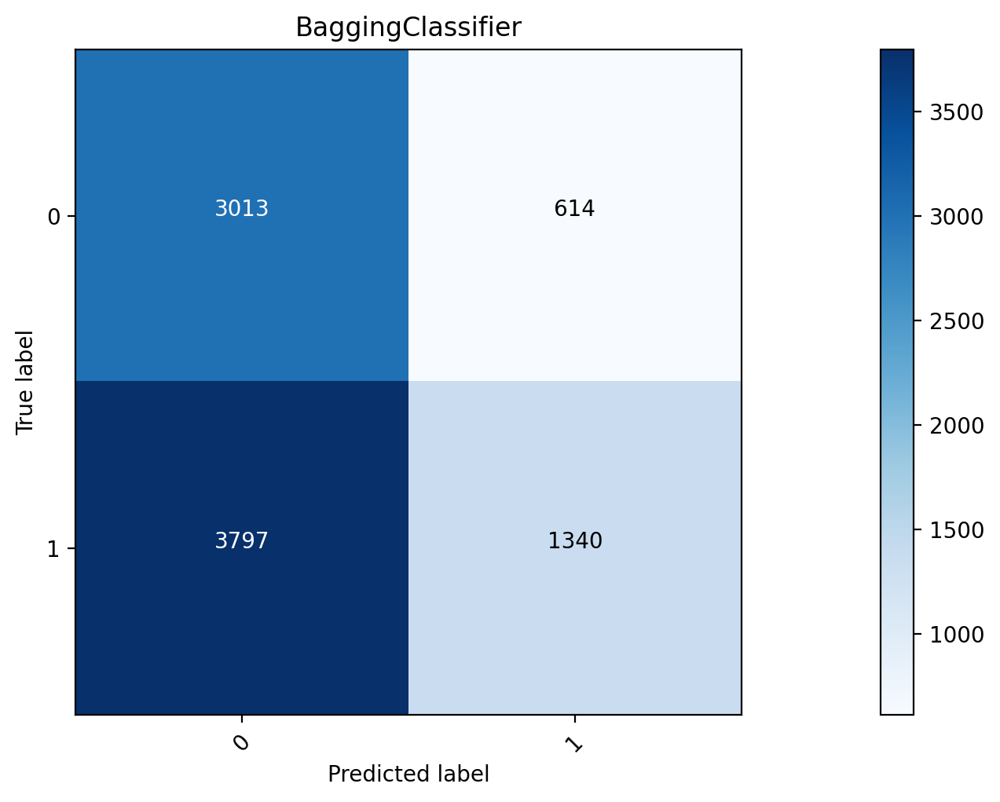

2017
roc_auc = 0.57
Time to train = 4.68 seconds
точность: 0.702661207778915
полнота: 0.24283692960735762


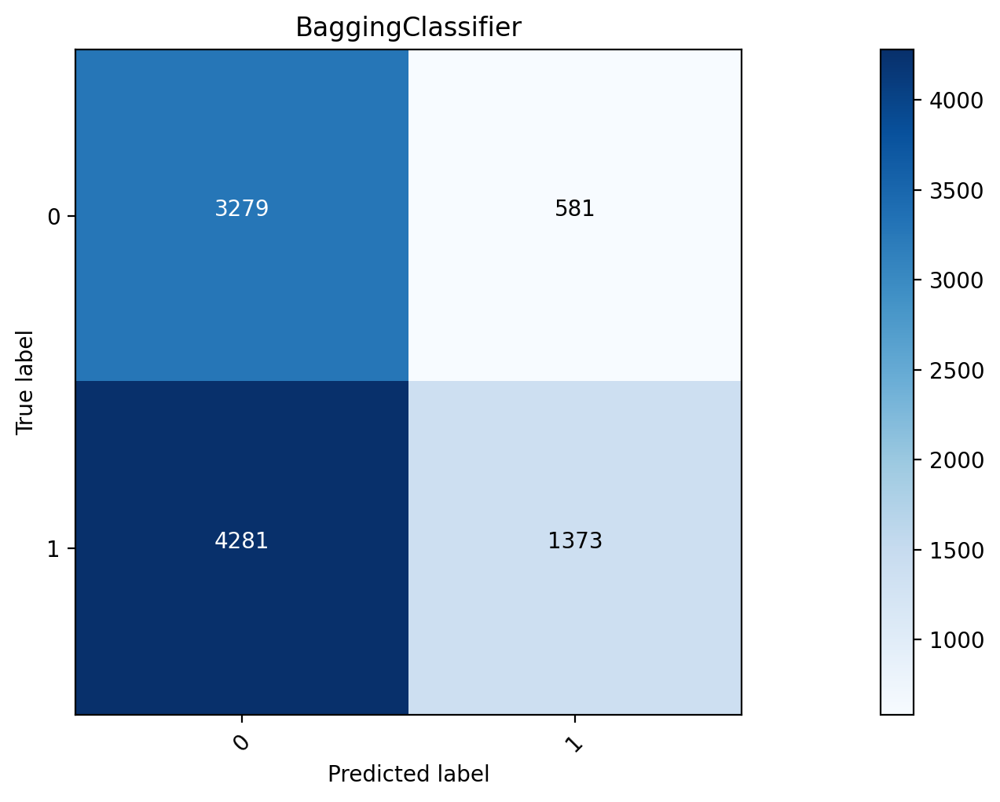

2018
roc_auc = 0.56
Time to train = 6.42 seconds
точность: 0.67595396729255
полнота: 0.18587608261159227


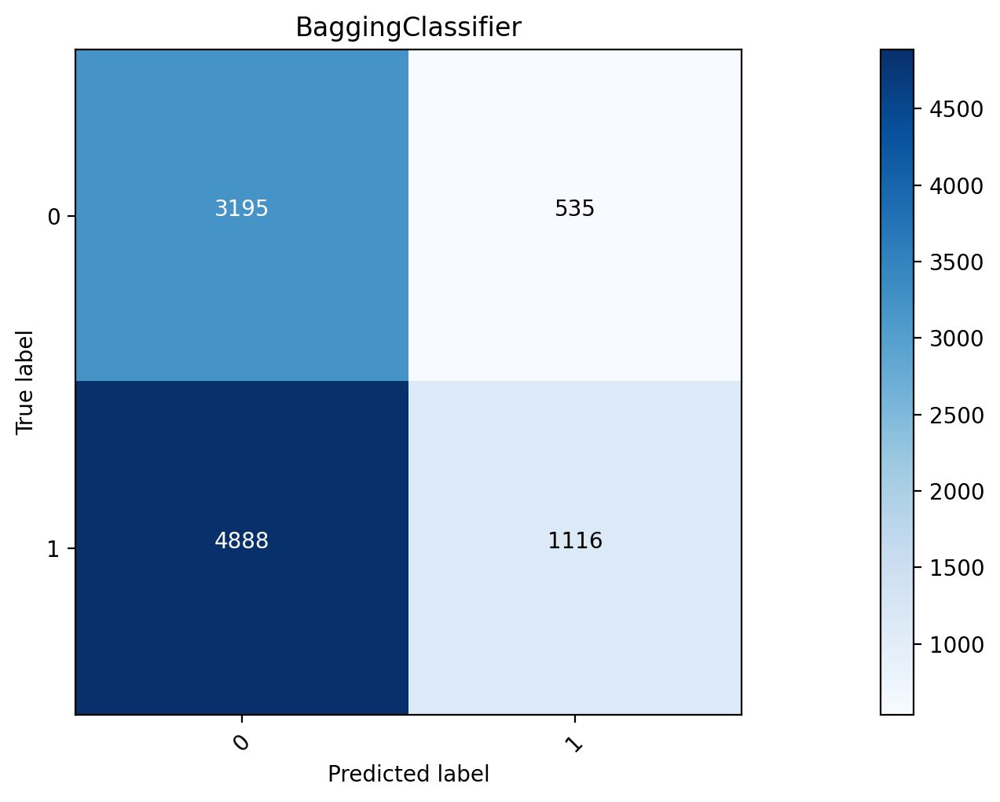

2019
roc_auc = 0.57
Time to train = 7.10 seconds
точность: 0.8495934959349594
полнота: 0.17592592592592593


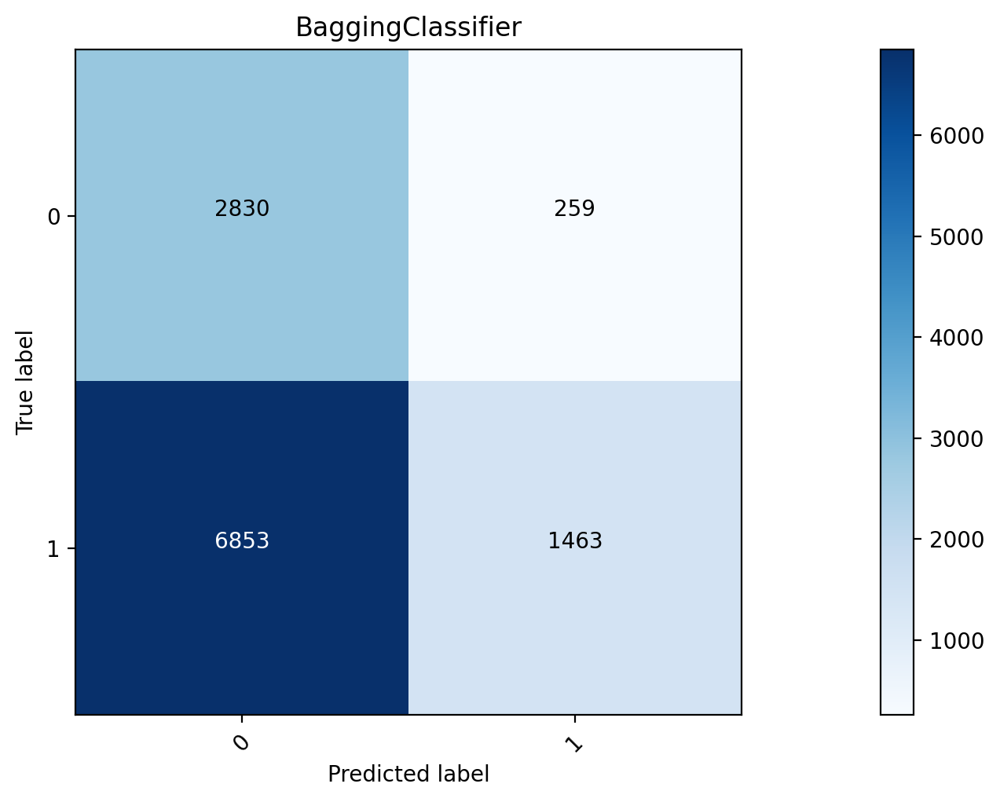

2020
roc_auc = 0.56
Time to train = 8.64 seconds
точность: 0.8430728824688115
полнота: 0.17216411906677392


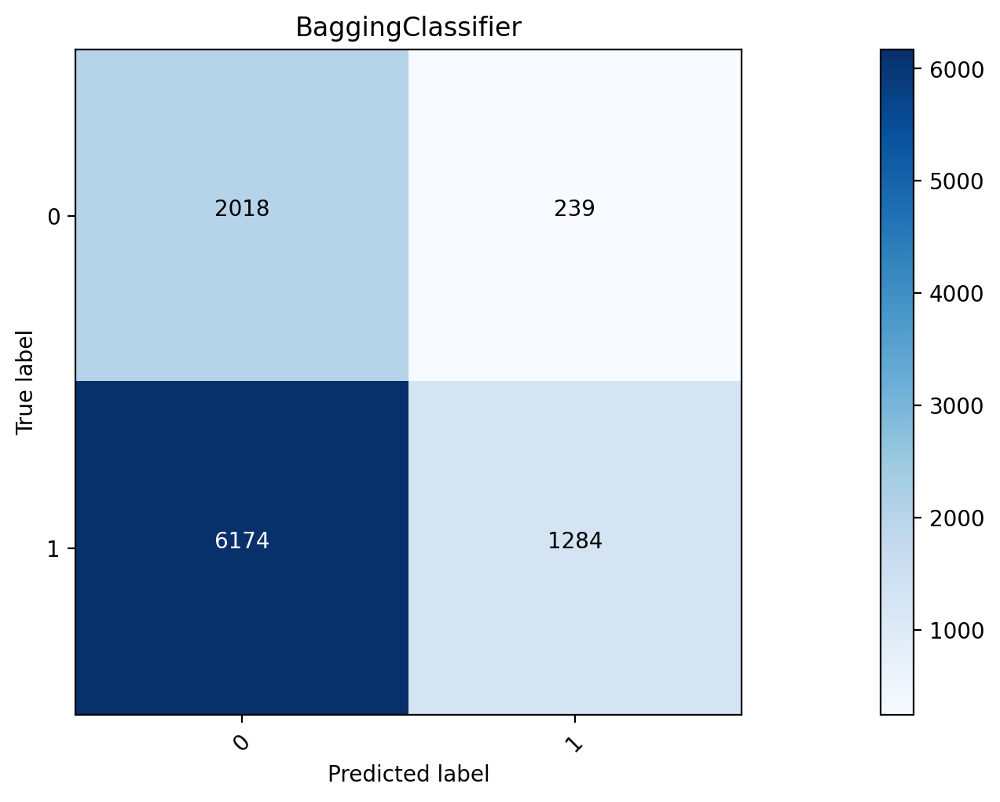

2021
roc_auc = 0.58
Time to train = 8.98 seconds
точность: 0.7951030927835051
полнота: 0.19581085369723897


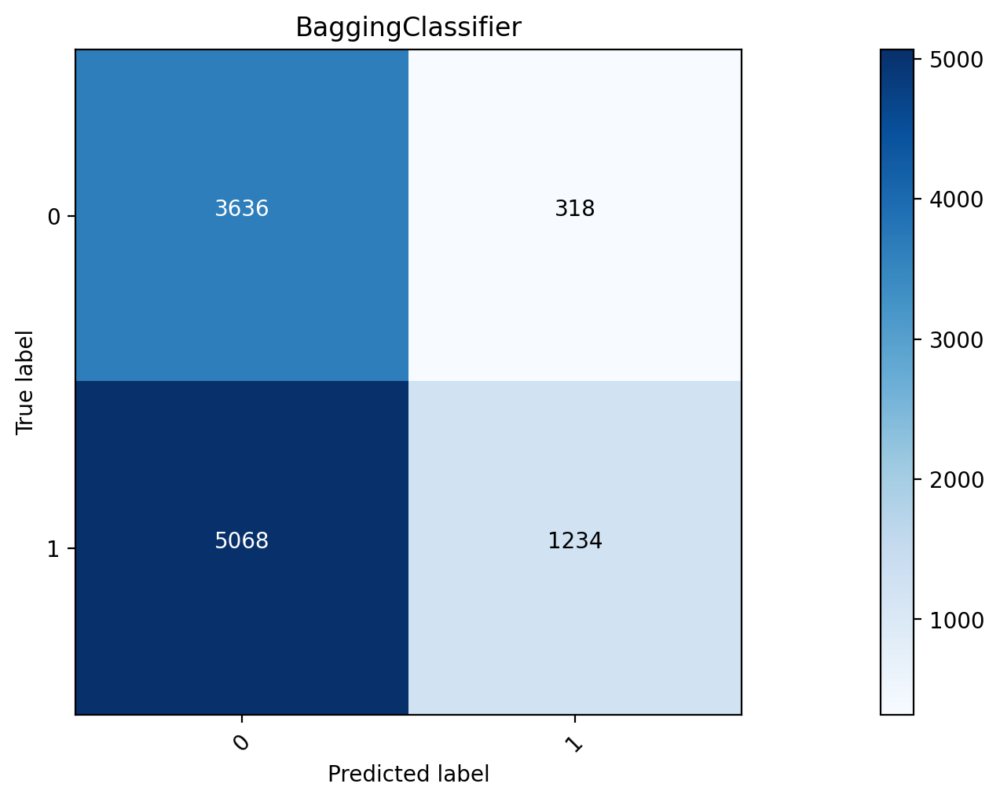

2022
roc_auc = 0.64
Time to train = 10.35 seconds
точность: 0.824124513618677
полнота: 0.25112639317050034


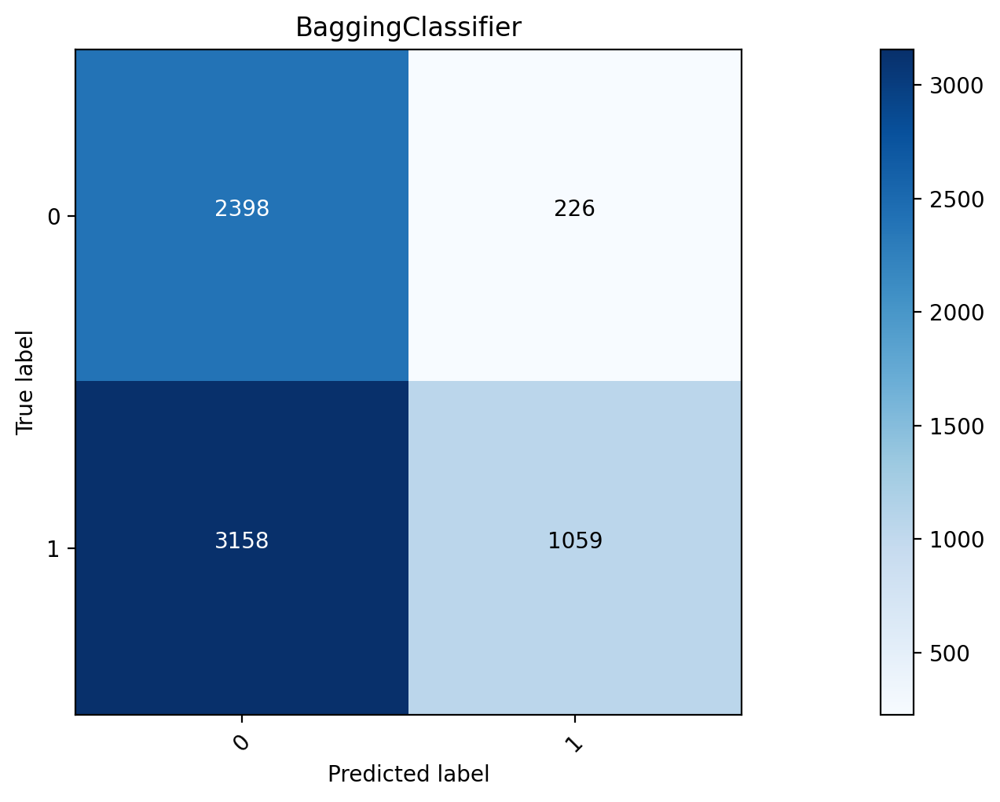

In [113]:
for i in range (2008, 2022):
    train = s[s.index.year <= i]
    test = s[s.index.year == i + 1]
    X_train = train.drop(columns=['value'])
    X_test = test.drop(columns=['value'])
    y_train = train['value']
    y_test = test['value']
    t0 = time.time()
    lr_model = BaggingClassifier(random_state=42, n_estimators=100)
    lr_model.fit(X_train, y_train)


    lr_y = y_test.values

    lr_y_pred = lr_model.predict_proba(X_test)
    tF = time.time()


    lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
    print(str(i+1))
    print('roc_auc = %.2f' % lr_rocauc)
    print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
    probs_val = lr_y_pred[:,1]
    cl = (probs_val == 1).astype(int)
    print('точность:', precision_score(y_test, cl))
    print('полнота:', recall_score(y_test, cl))
    plot_confusion_matrix(confusion_matrix(y_test, cl), classes=['0','1'], title='BaggingClassifier')

2009
roc_auc = 0.69
Time to train = 1.70 seconds
точность: 0.472
полнота: 0.5175438596491229


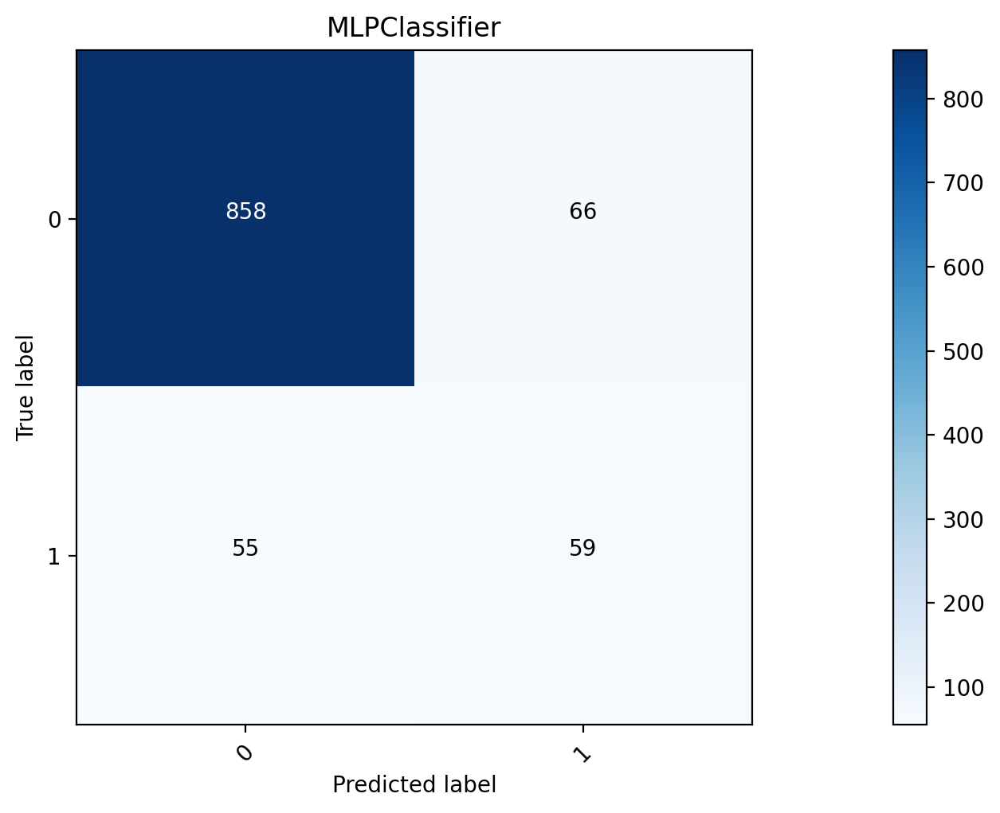

2010
roc_auc = 0.39
Time to train = 2.68 seconds
точность: 0.11570247933884298
полнота: 0.013861386138613862


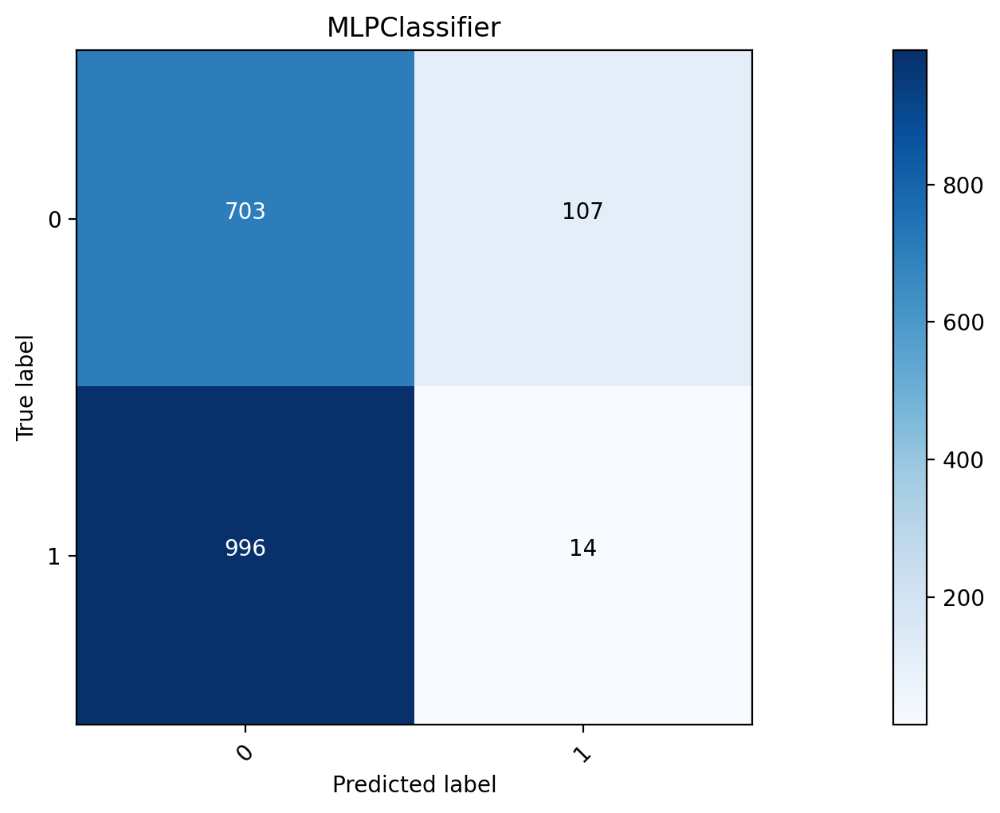

2011
roc_auc = 0.47
Time to train = 4.06 seconds
точность: 0.12345679012345678
полнота: 0.00978952520802741


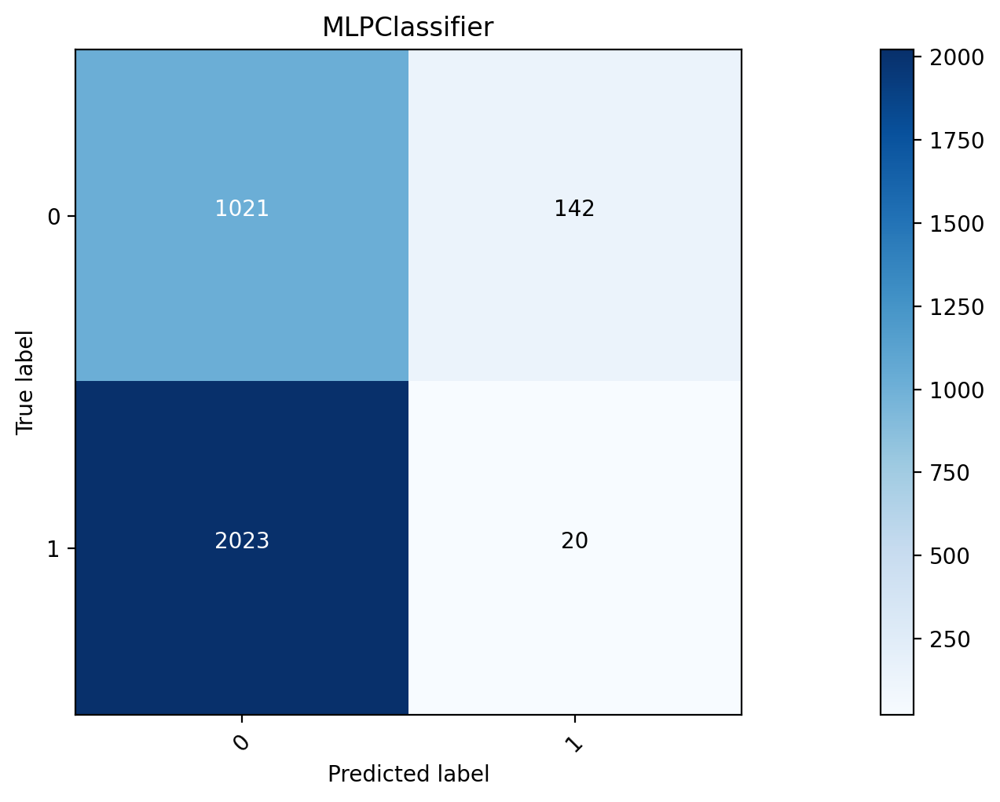

2012
roc_auc = 0.59
Time to train = 7.02 seconds
точность: 0.6274285714285714
полнота: 0.13905775075987842


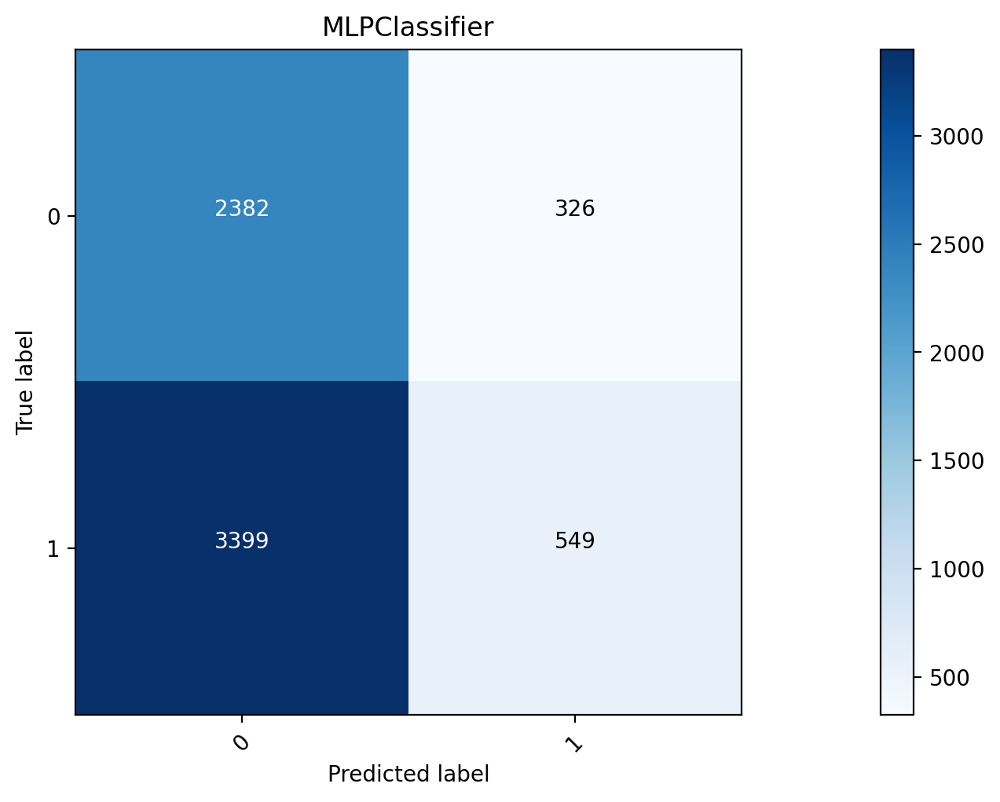

2013
roc_auc = 0.63
Time to train = 13.26 seconds
точность: 0.6318306010928961
полнота: 0.2778612195854611


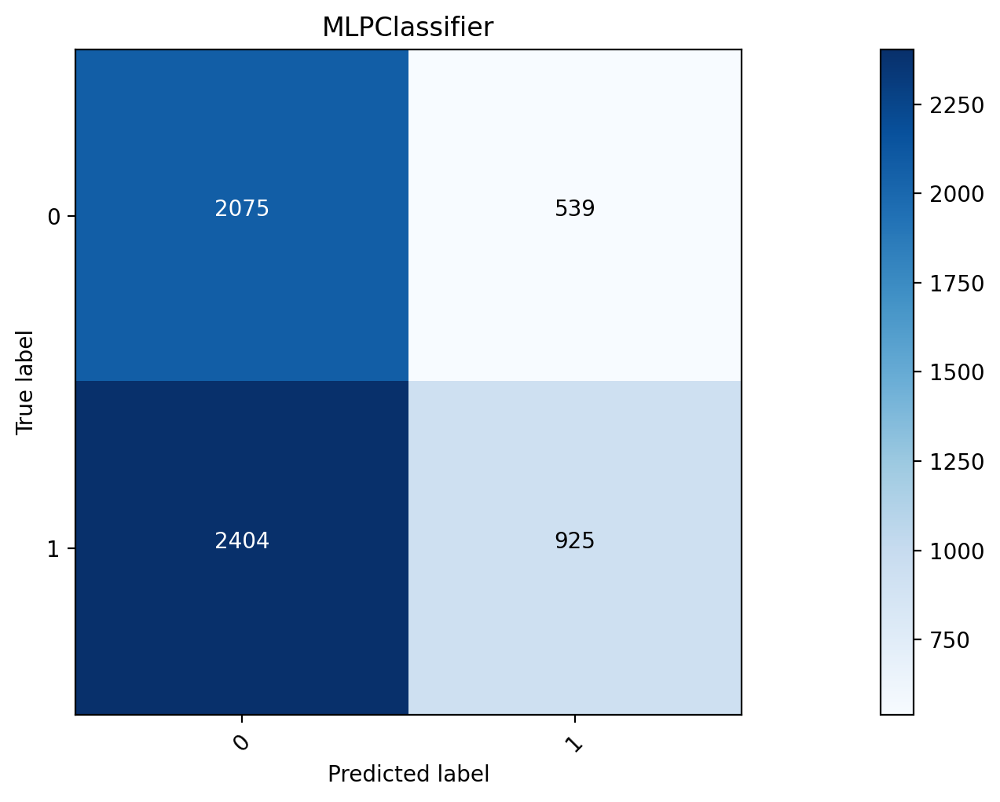

2014
roc_auc = 0.49
Time to train = 18.74 seconds
точность: 0.21285714285714286
полнота: 0.10094850948509485


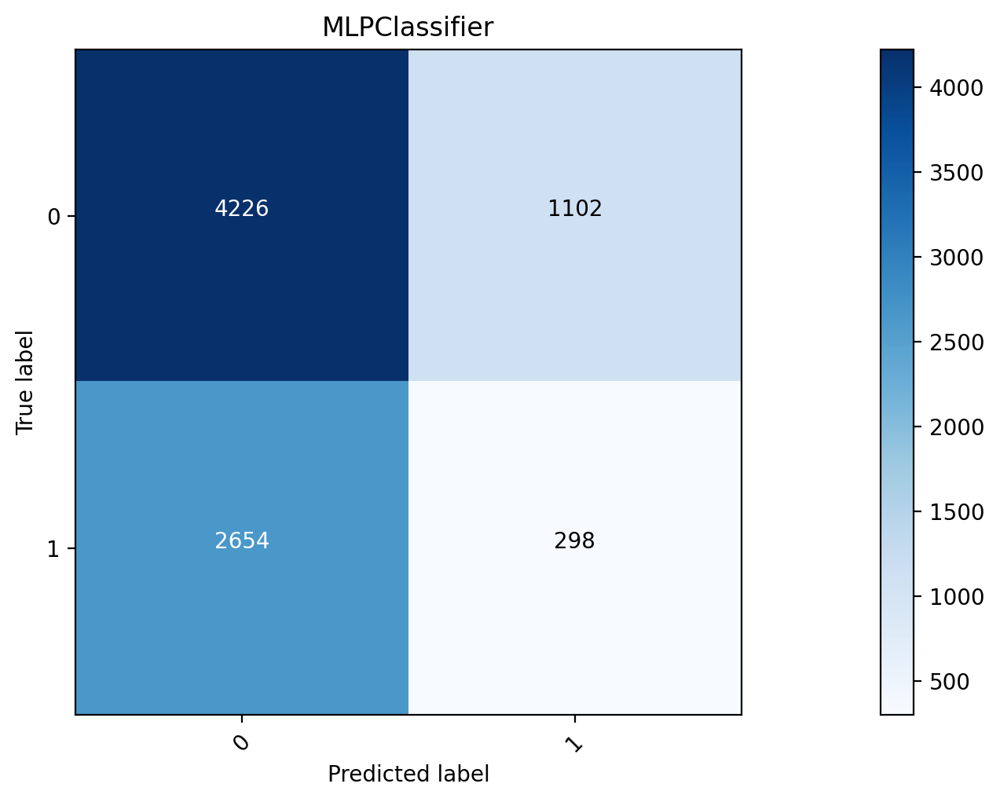

2015
roc_auc = 0.58
Time to train = 26.39 seconds
точность: 0.5531914893617021
полнота: 0.014831717056474614


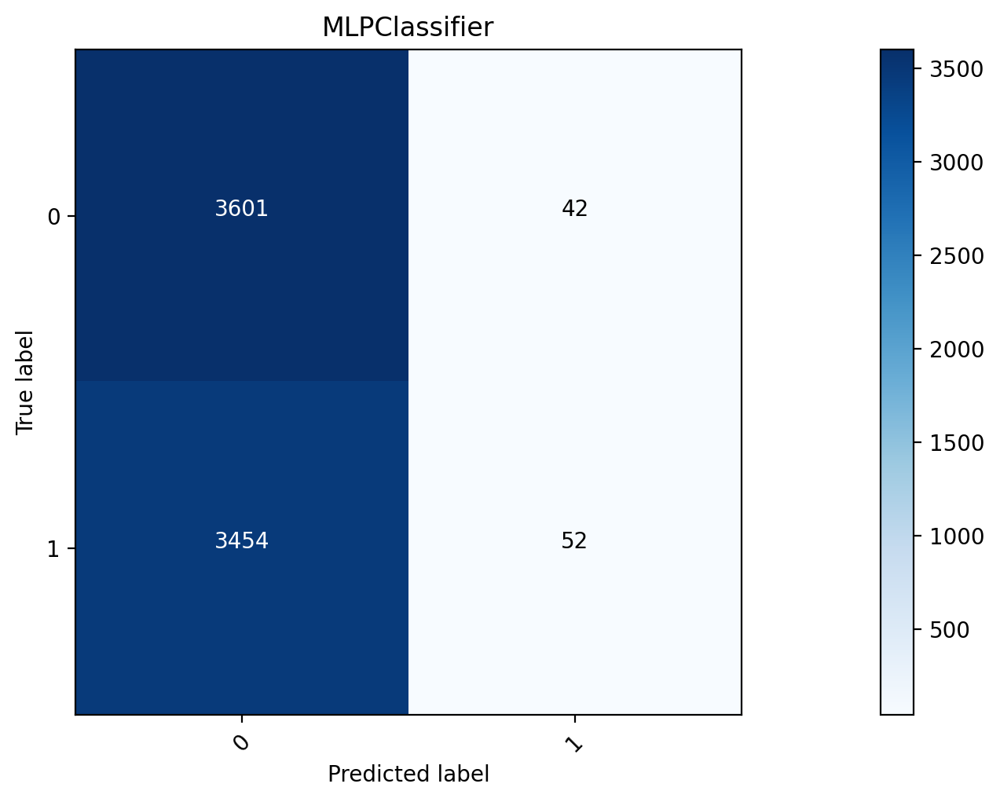

2016
roc_auc = 0.56
Time to train = 29.99 seconds
точность: 0.6190476190476191
полнота: 0.017921146953405017


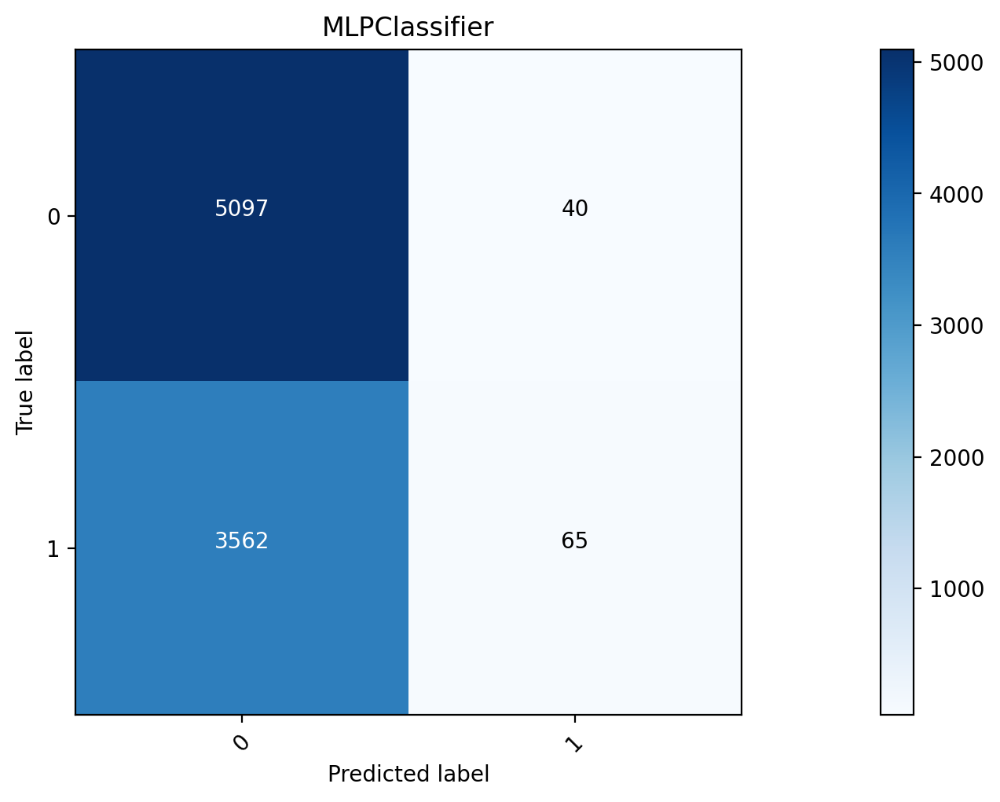

2017
roc_auc = 0.67
Time to train = 41.63 seconds
точность: 0.6265060240963856
полнота: 0.013471502590673576


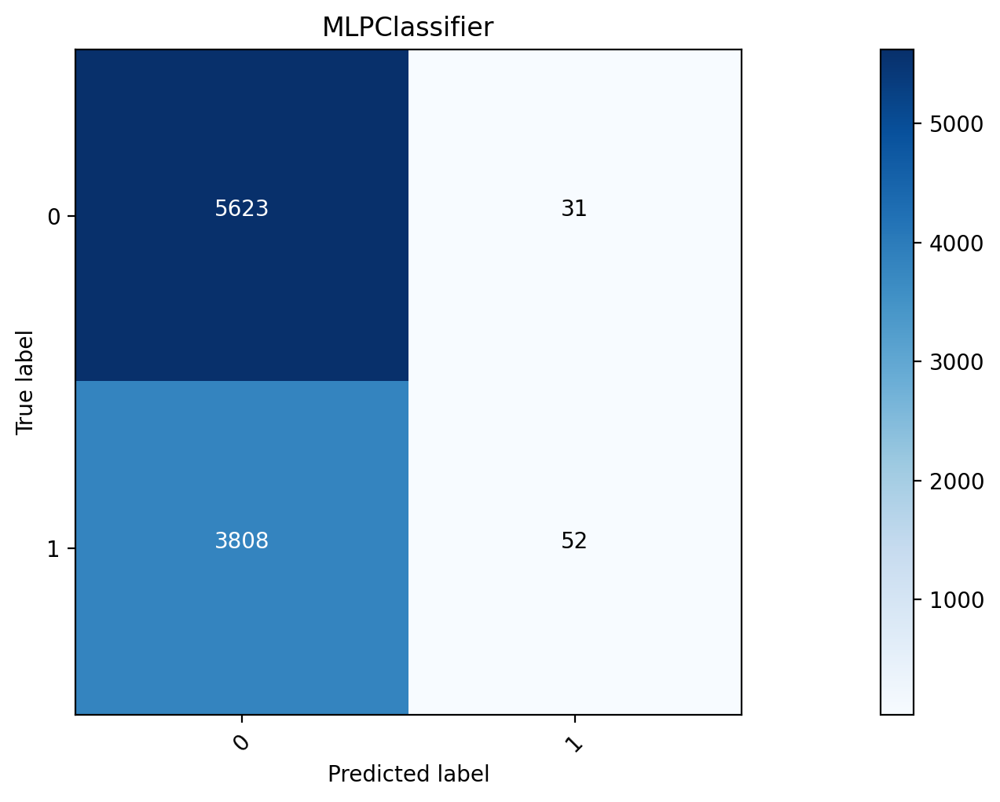

2018
roc_auc = 0.64
Time to train = 30.92 seconds
точность: 0.0
полнота: 0.0


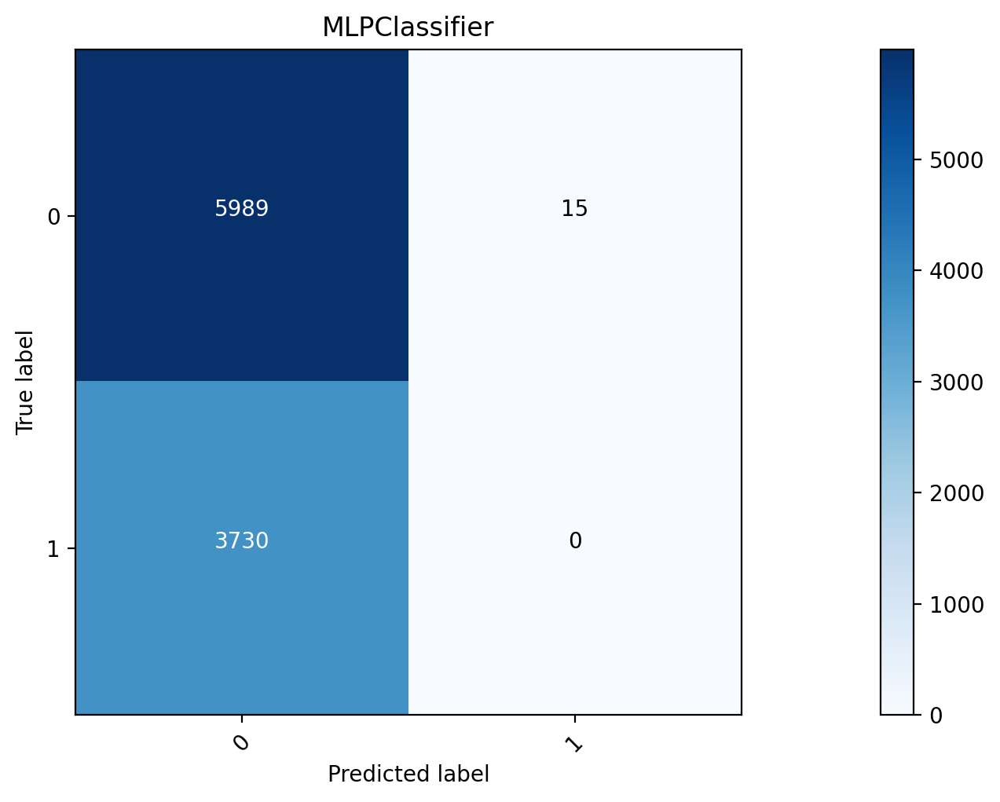

2019
roc_auc = 0.66
Time to train = 57.97 seconds
точность: 0.5729166666666666
полнота: 0.0178051149239236


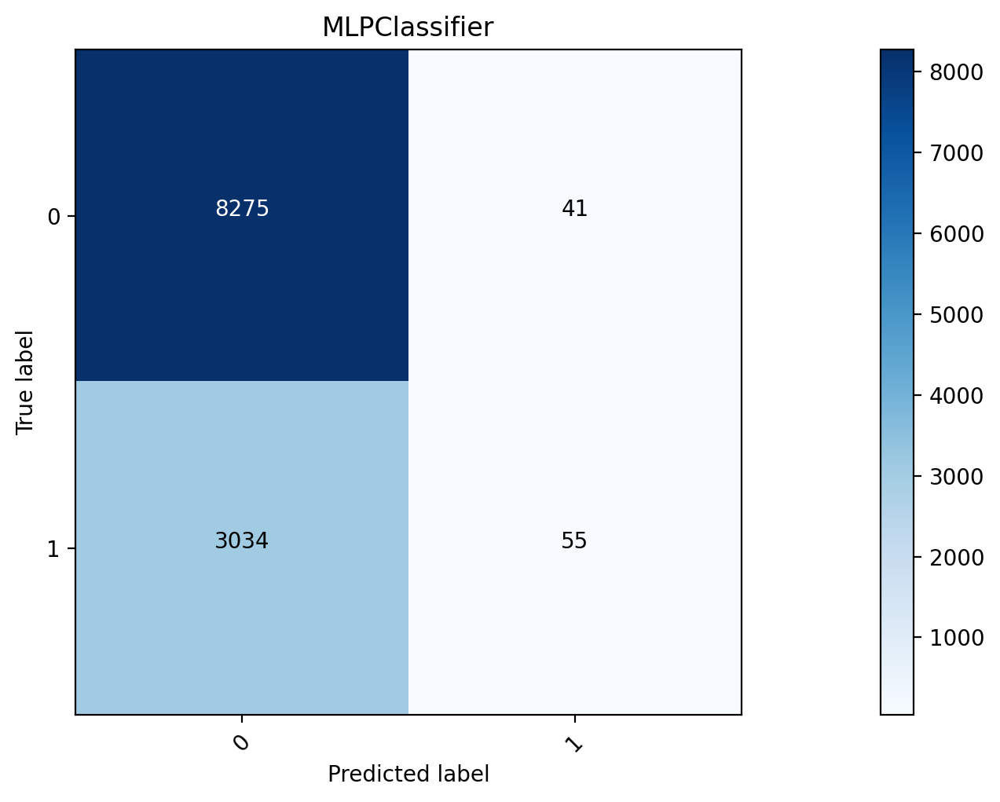

2020
roc_auc = 0.59
Time to train = 68.59 seconds
точность: 0.6125
полнота: 0.021710234824988923


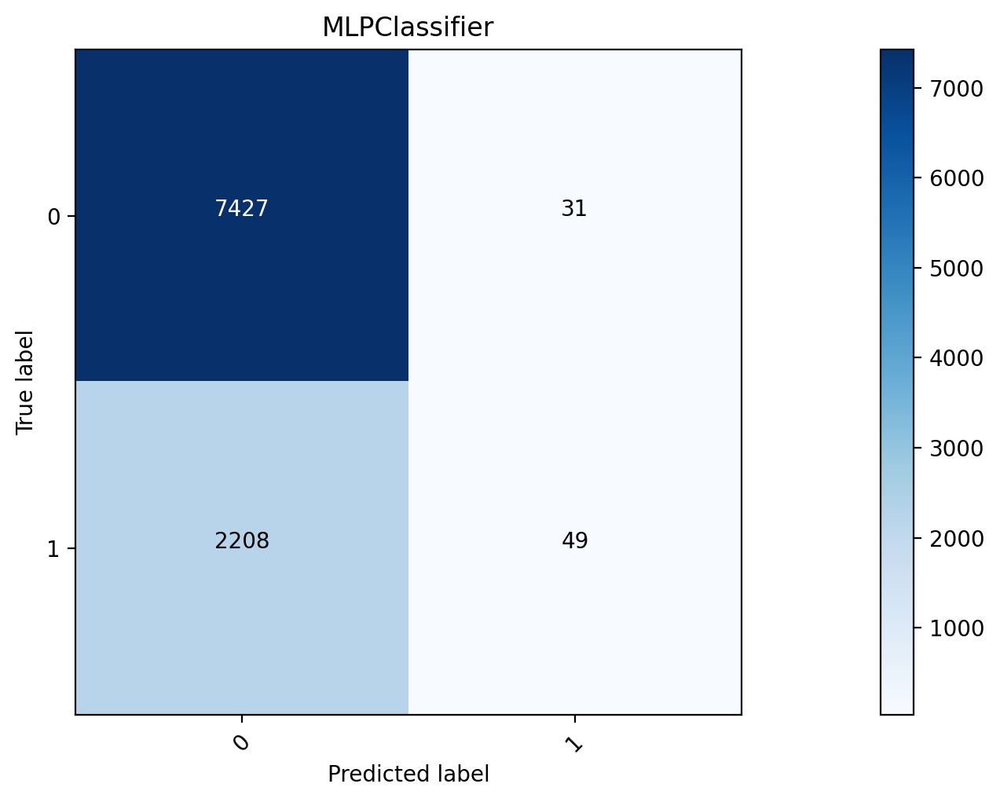

2021
roc_auc = 0.60
Time to train = 78.61 seconds
точность: 0.2413793103448276
полнота: 0.005311077389984826


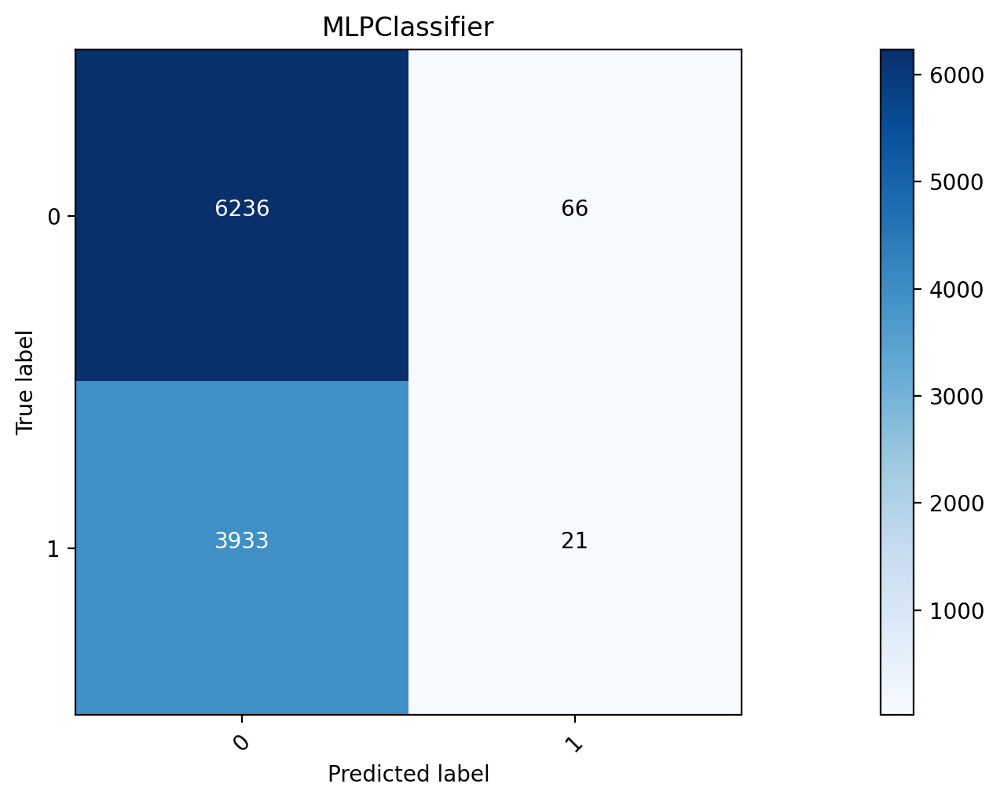

2022
roc_auc = 0.73
Time to train = 69.17 seconds
точность: 0.8571428571428571
полнота: 0.004573170731707317


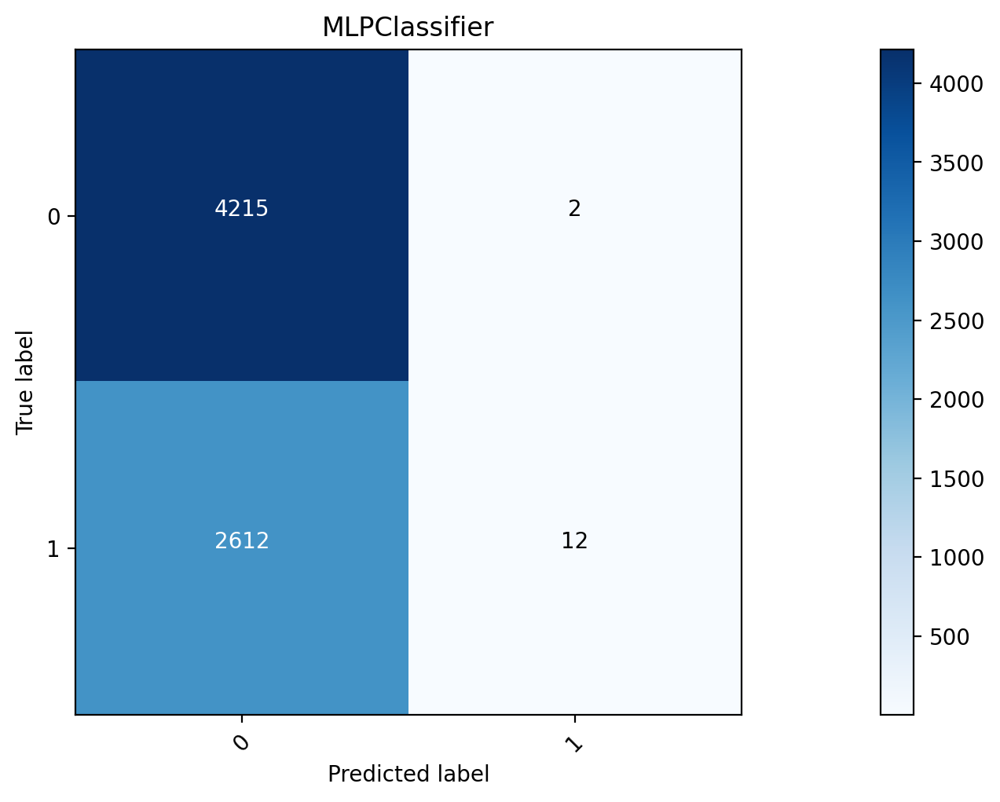

In [114]:
for i in range (2008, 2022):
    train = s[s.index.year <= i]
    test = s[s.index.year == i + 1]
    X_train = train.drop(columns=['value'])
    X_test = test.drop(columns=['value'])
    y_train = train['value']
    y_test = test['value']
    t0 = time.time()
    lr_model = MLPClassifier(activation='tanh', random_state=42)
    lr_model.fit(X_train, y_train)


    lr_y = y_test.values

    lr_y_pred = lr_model.predict_proba(X_test)
    tF = time.time()


    lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
    print(str(i+1))
    print('roc_auc = %.2f' % lr_rocauc)
    print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
    probs_val = lr_y_pred[:,1]
    cl = (probs_val < 0.2).astype(int)
    print('точность:', precision_score(1 - y_test, cl))
    print('полнота:', recall_score(1 - y_test, cl))
    plot_confusion_matrix(confusion_matrix(1 - y_test, cl), classes=['0','1'], title='MLPClassifier')

0.9
roc_auc = 0.73
Time to train = 68.80 seconds
от 0.0 до 1.0
точность: 0.0
полнота: 0.0


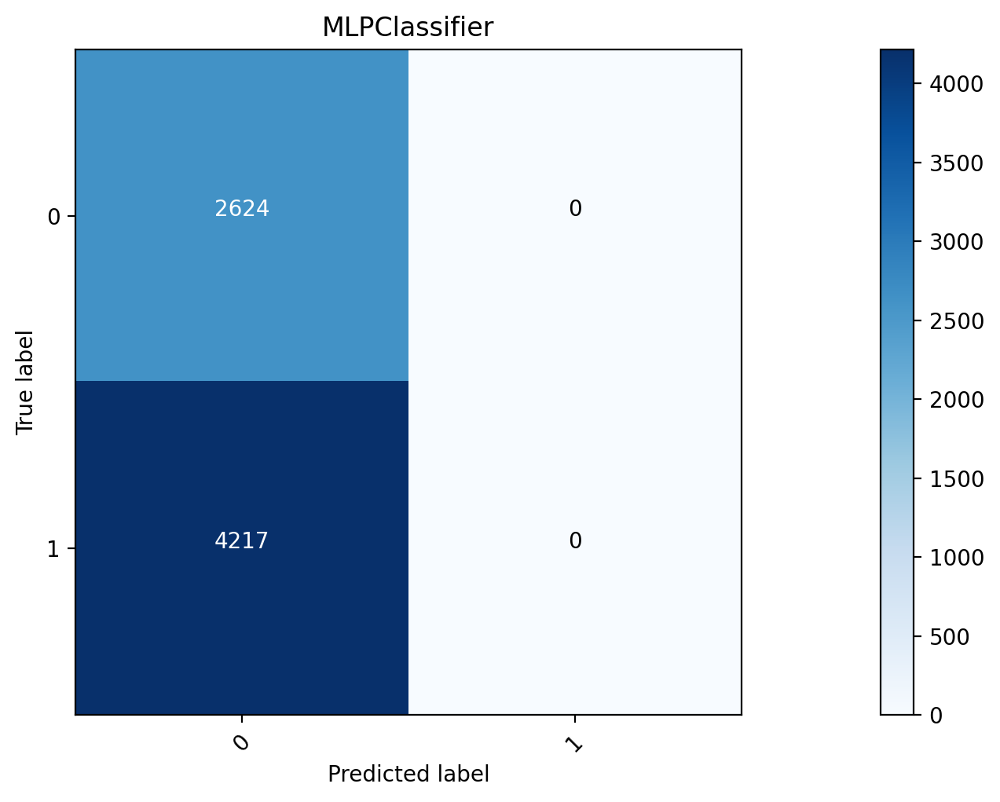

от 0.1 до 1.1
точность: 0.14285714285714285
полнота: 0.00047427080863172874


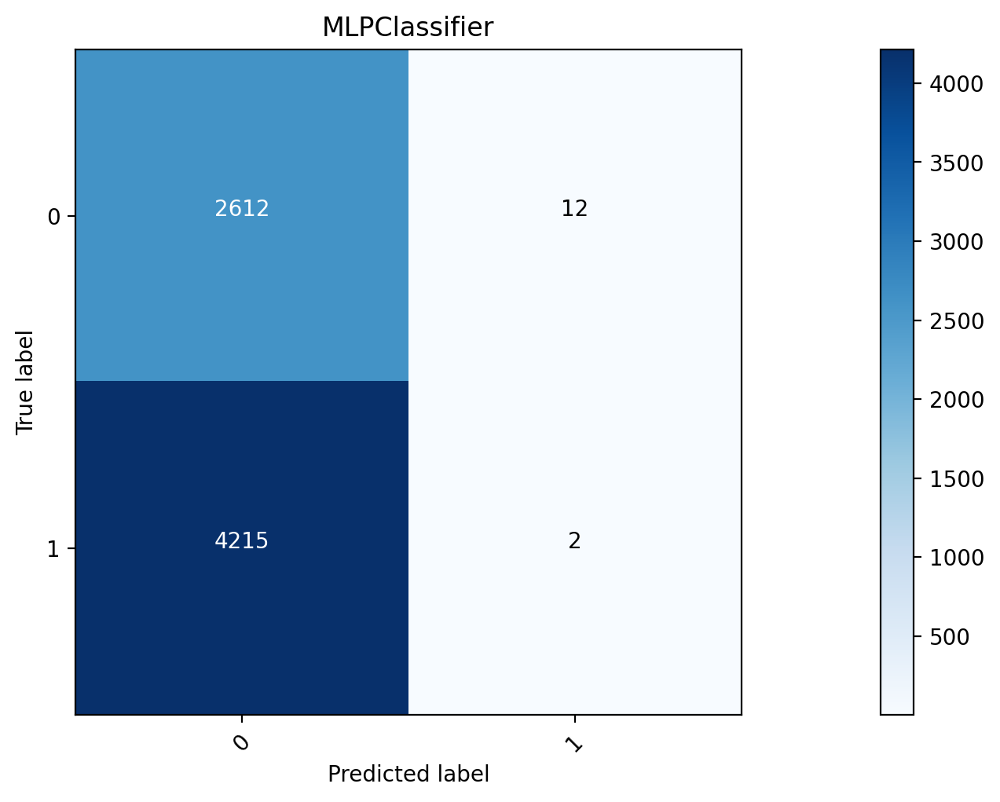

от 0.2 до 1.2
точность: 0.2891566265060241
полнота: 0.005691249703580745


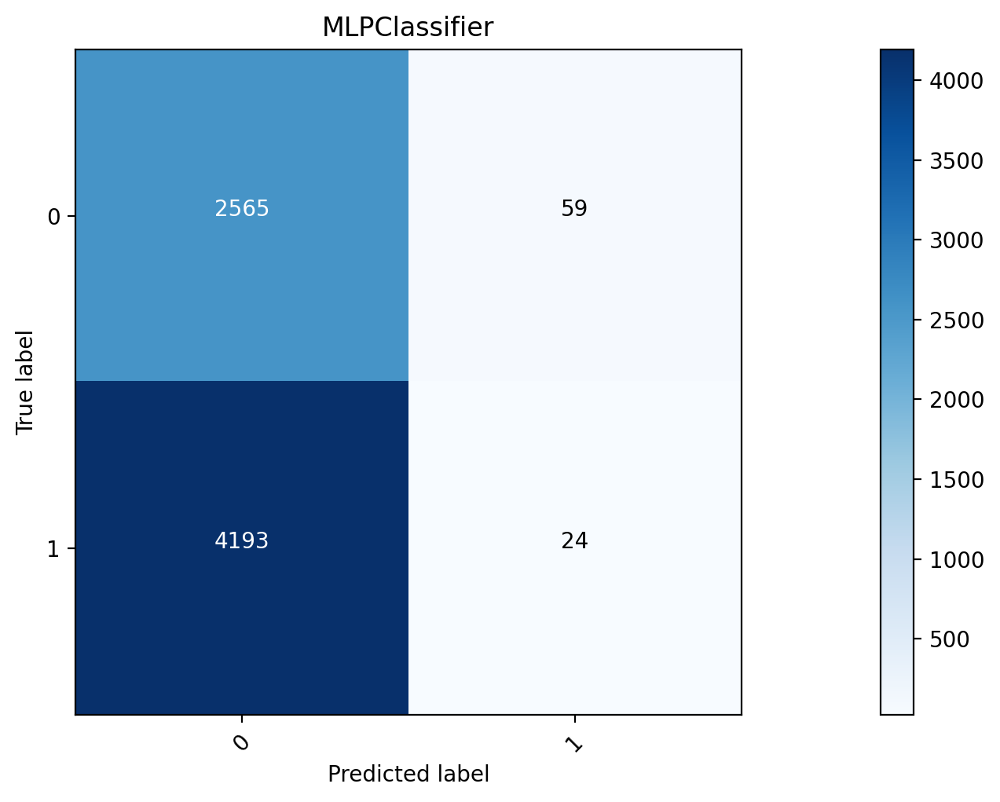

от 0.30000000000000004 до 1.3
точность: 0.34527687296416937
полнота: 0.02513635285748162


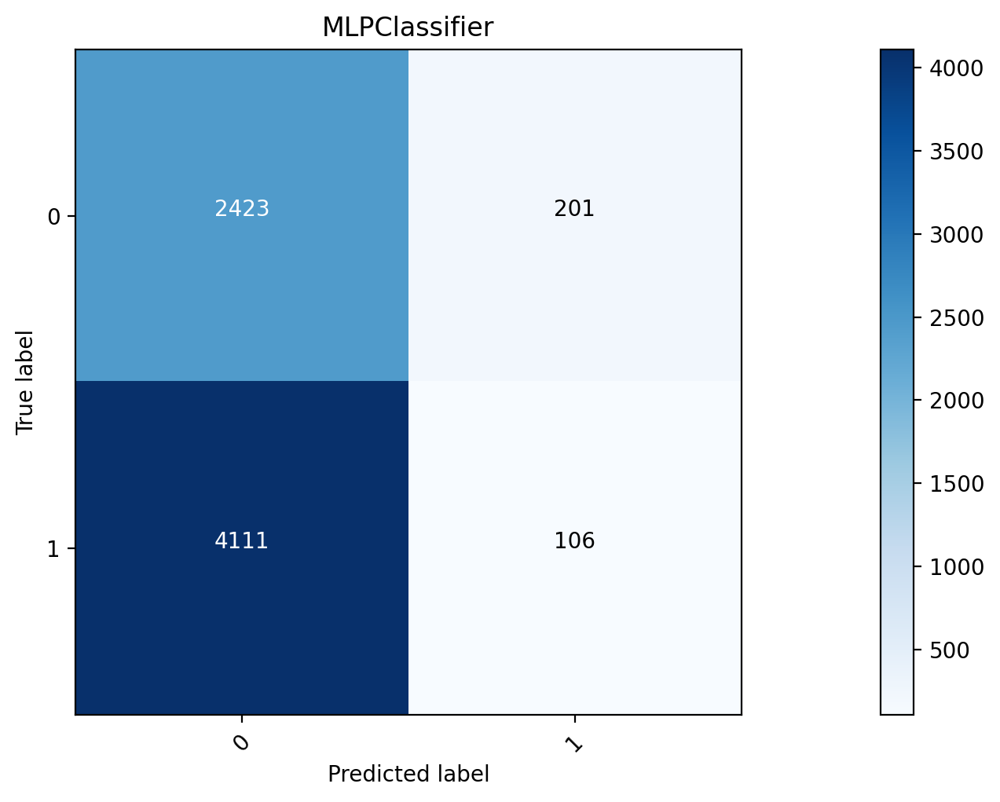

от 0.4 до 1.4
точность: 0.3022875816993464
полнота: 0.04387004979843491


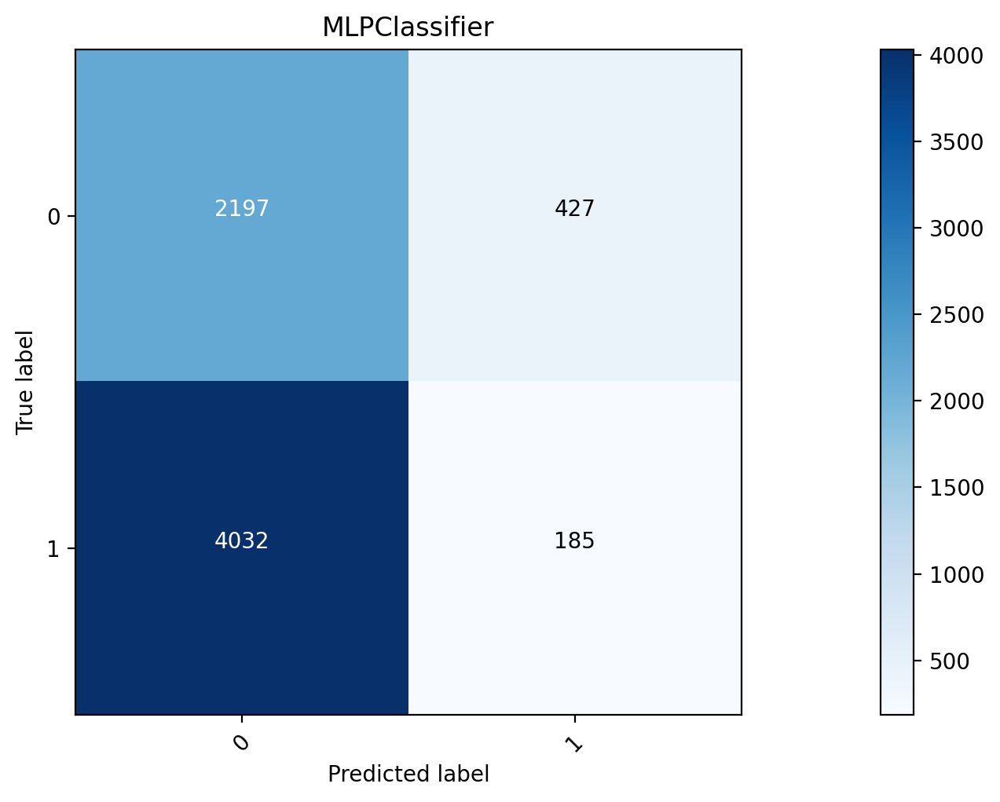

от 0.5 до 1.5
точность: 0.5281899109792285
полнота: 0.08442020393644771


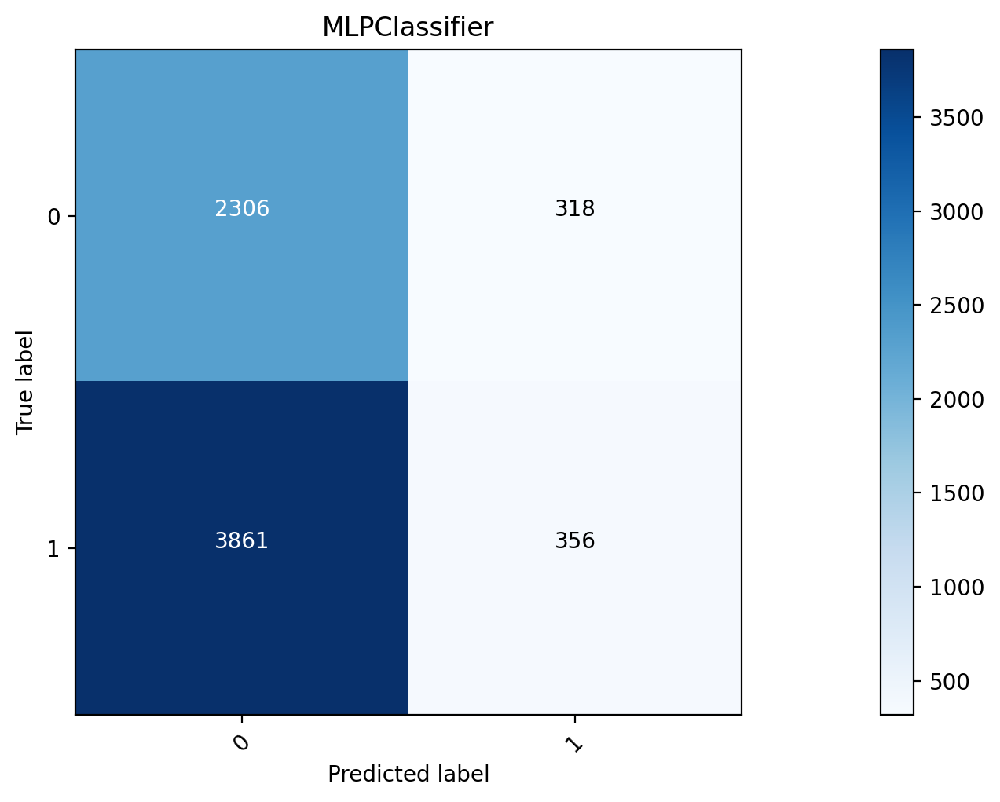

от 0.6000000000000001 до 1.6
точность: 0.5123309466984884
полнота: 0.15271520037941666


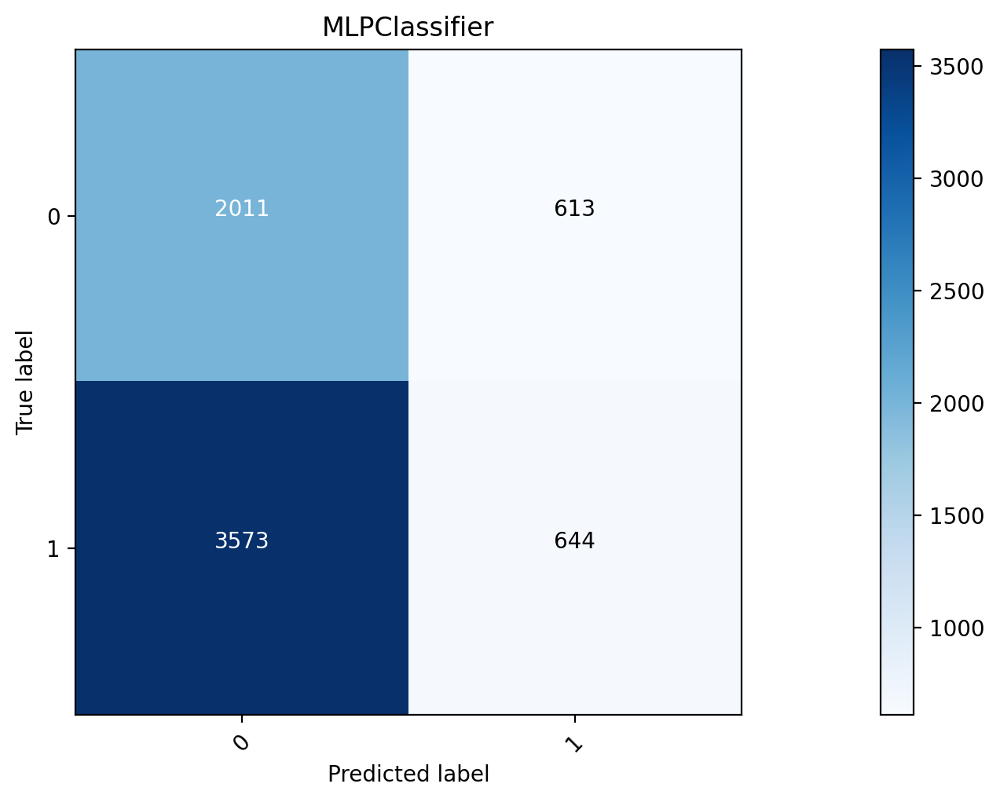

от 0.7000000000000001 до 1.7000000000000002
точность: 0.5935572309801234
полнота: 0.20535926013753852


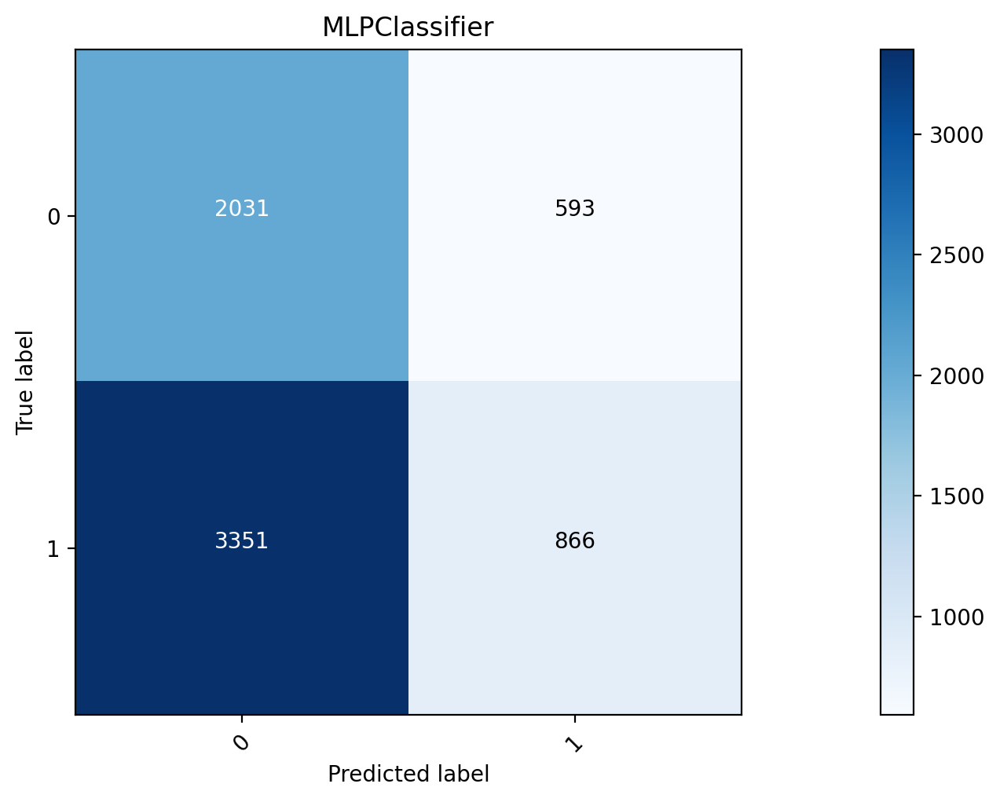

от 0.8 до 1.8
точность: 0.7817610062893082
полнота: 0.2947593075646194


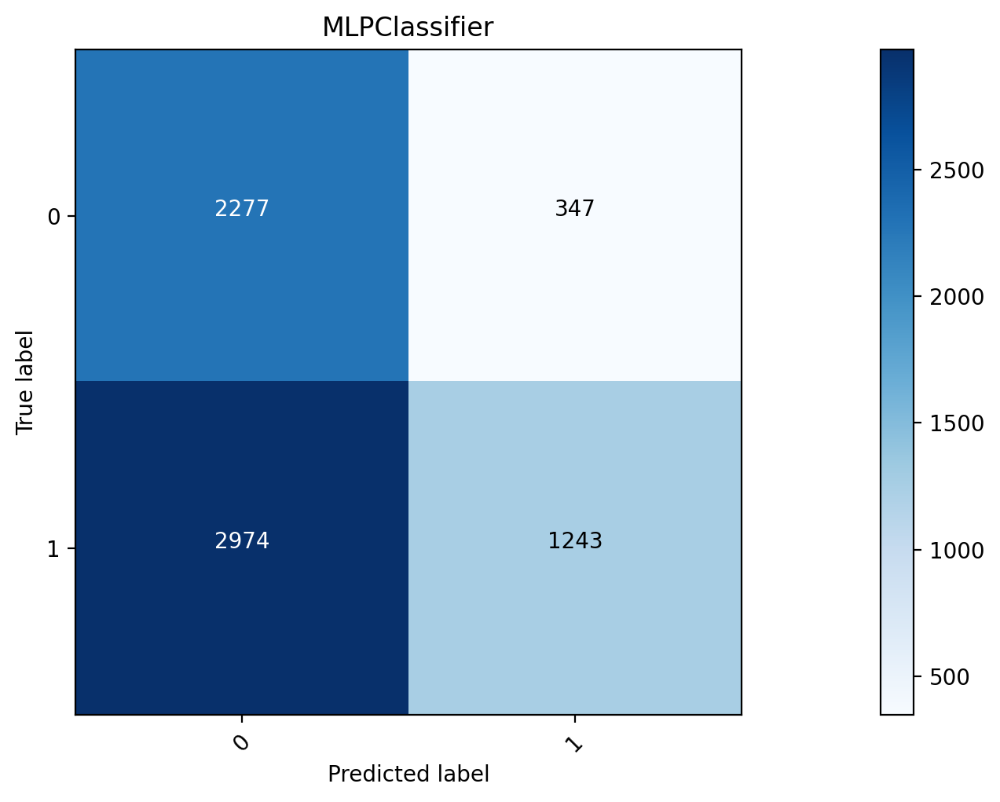

от 0.9 до 1.9
точность: 0.936094674556213
полнота: 0.1875741048138487


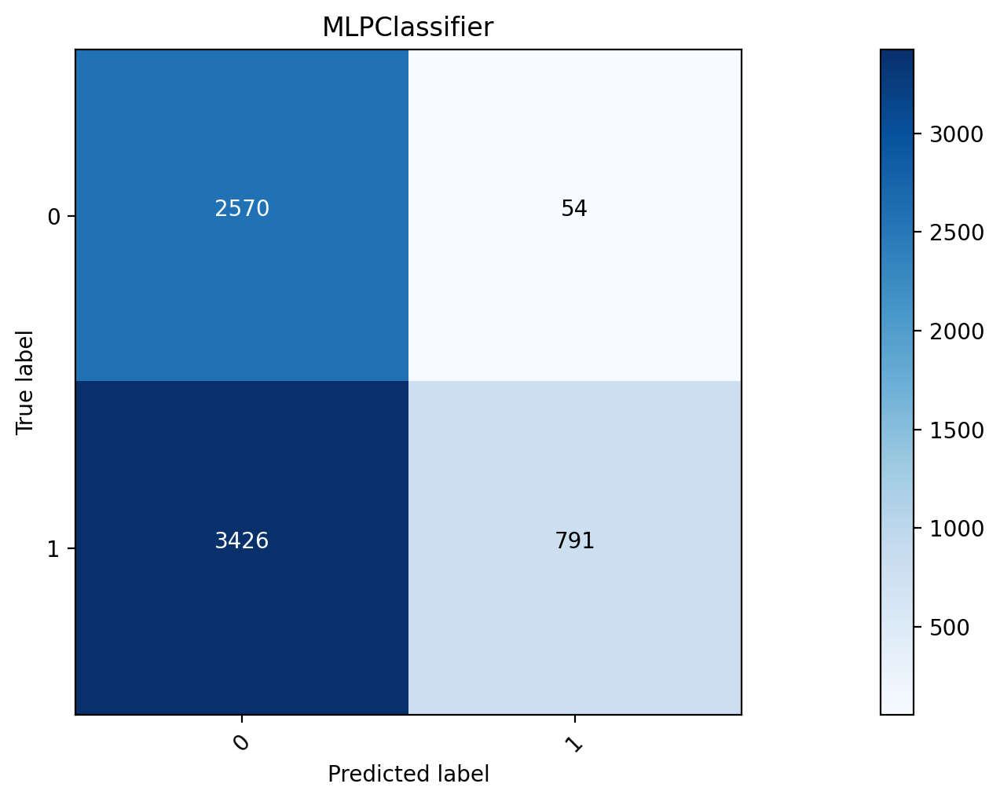

In [117]:
train = s[s.index.year <= 2021]
test = s[s.index.year == 2022]
X_train = train.drop(columns=['value'])
X_test = test.drop(columns=['value'])
y_train = train['value']
y_test = test['value']
t0 = time.time()
lr_model = MLPClassifier(activation='tanh', random_state=42)
lr_model.fit(X_train, y_train)


lr_y = y_test.values

lr_y_pred = lr_model.predict_proba(X_test)
tF = time.time()


lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
print(i)
print('roc_auc = %.2f' % lr_rocauc)
print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
probs_val = lr_y_pred[:,1]
for i in np.arange(0,1,0.1):
    print(f'от {i} до {i+0.1}')
    cl = ((probs_val > i) & ((probs_val <= i+0.1))).astype(int)
    print('точность:', precision_score(y_test, cl))
    print('полнота:', recall_score(y_test, cl))
    plot_confusion_matrix(confusion_matrix(y_test, cl), classes=['0','1'], title='MLPClassifier')

In [19]:
precision = []
probs_val = lr_y_pred[:,1]
for i in np.arange(0,1,0.05):
    print(f'от {i} до {i+0.05}')
    cl = (probs_val > i).astype(int)
    
    precision.append(precision_score(y_test, cl))
    
    

от 0.0 до 0.05
от 0.05 до 0.1
от 0.1 до 0.15000000000000002
от 0.15000000000000002 до 0.2
от 0.2 до 0.25
от 0.25 до 0.3
от 0.30000000000000004 до 0.35000000000000003
от 0.35000000000000003 до 0.4
от 0.4 до 0.45
от 0.45 до 0.5
от 0.5 до 0.55
от 0.55 до 0.6000000000000001
от 0.6000000000000001 до 0.6500000000000001
от 0.65 до 0.7000000000000001
от 0.7000000000000001 до 0.7500000000000001
от 0.75 до 0.8
от 0.8 до 0.8500000000000001
от 0.8500000000000001 до 0.9000000000000001
от 0.9 до 0.9500000000000001
от 0.9500000000000001 до 1.0


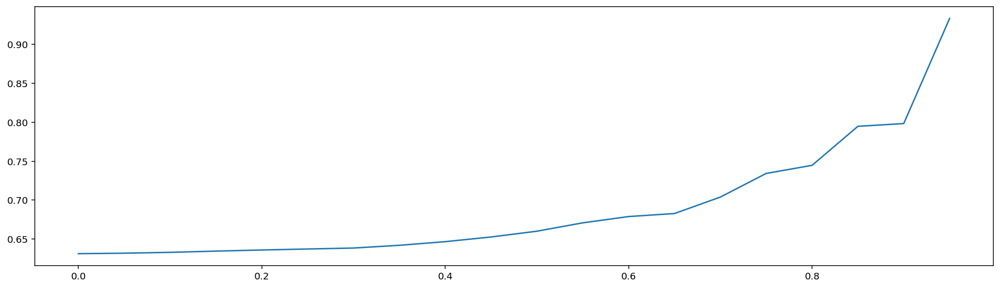

In [20]:
plt.plot(np.arange(0,1,0.05), precision)

In [ ]:
s = s1_clean.copy()

2015
roc_auc = 0.58
Time to train = 26.67 seconds


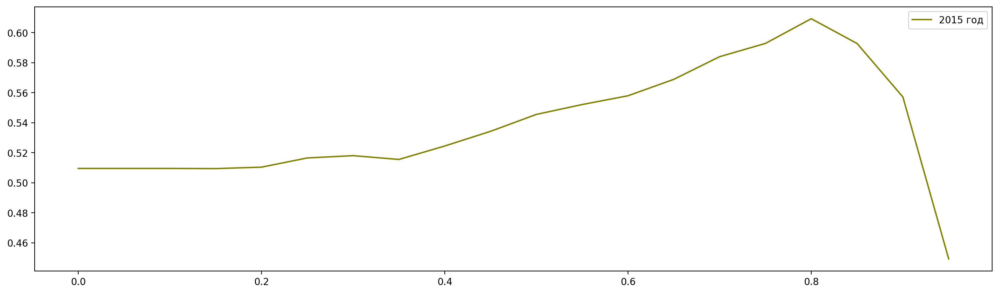

2016
roc_auc = 0.56
Time to train = 30.85 seconds


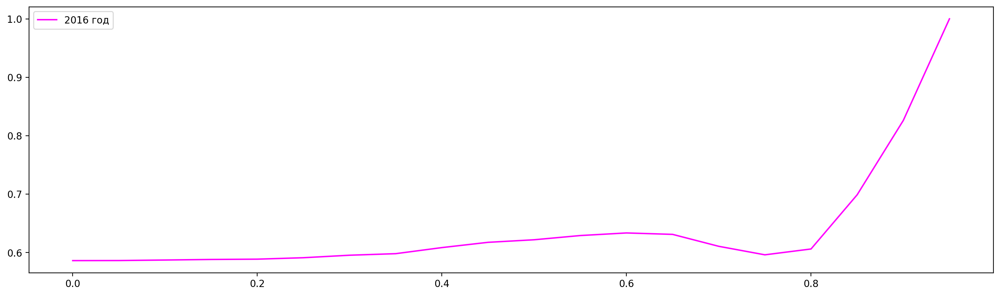

2017
roc_auc = 0.67
Time to train = 41.36 seconds


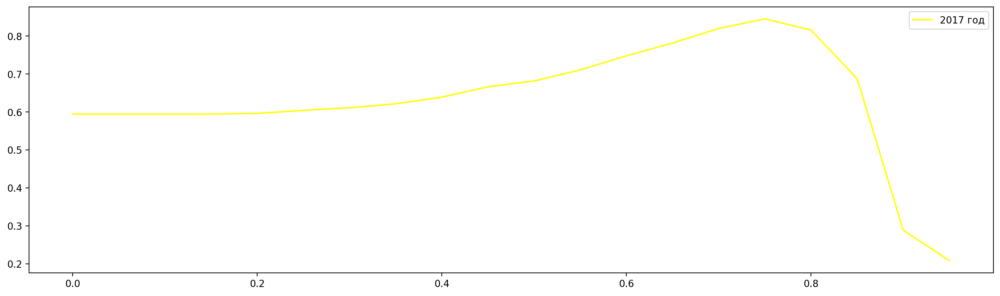

2018
roc_auc = 0.64
Time to train = 32.22 seconds


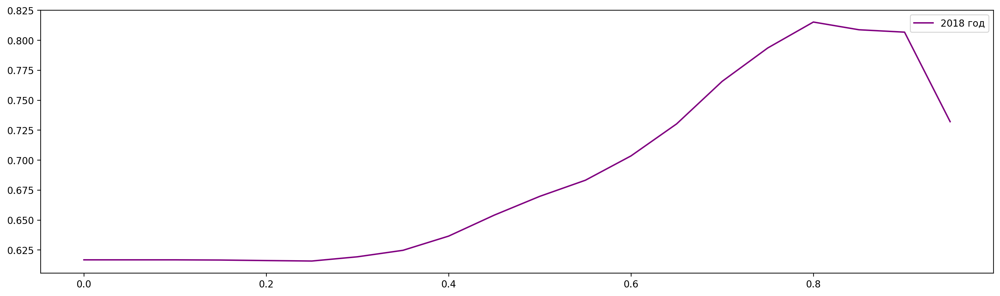

2019
roc_auc = 0.66
Time to train = 60.29 seconds


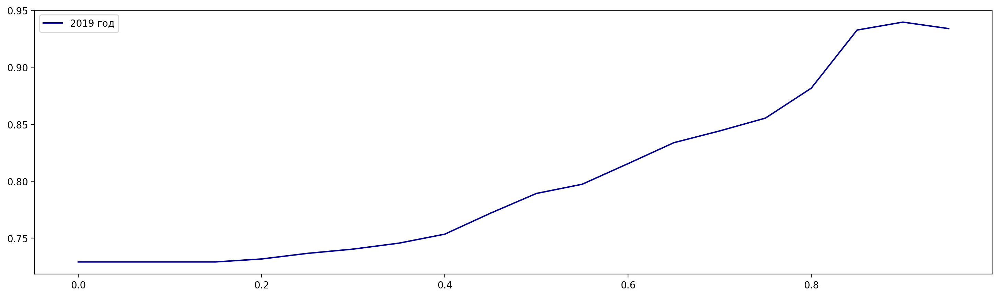

2020
roc_auc = 0.59
Time to train = 70.18 seconds


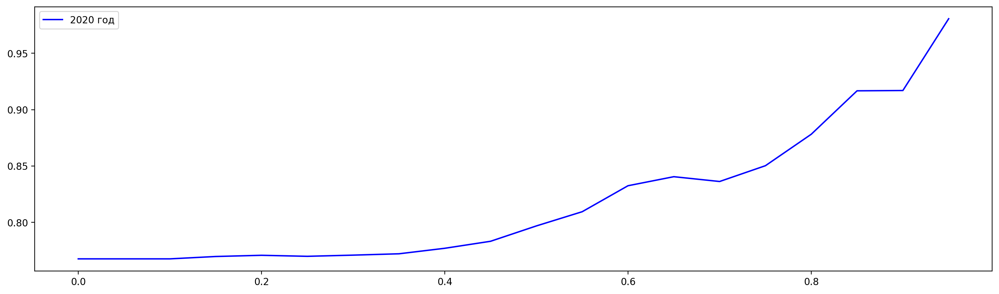

2021
roc_auc = 0.60
Time to train = 81.12 seconds


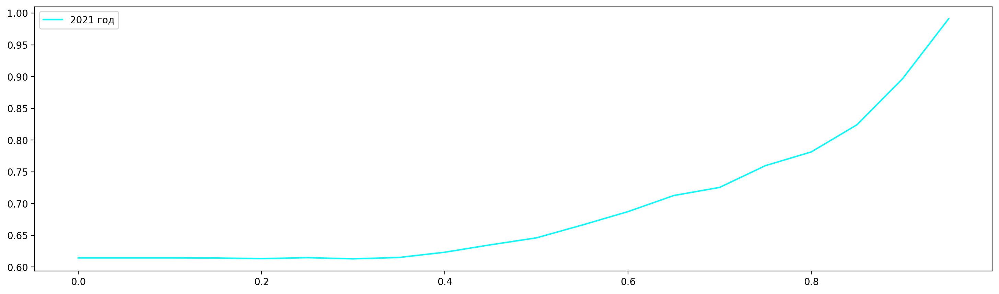

2022
roc_auc = 0.73
Time to train = 69.86 seconds


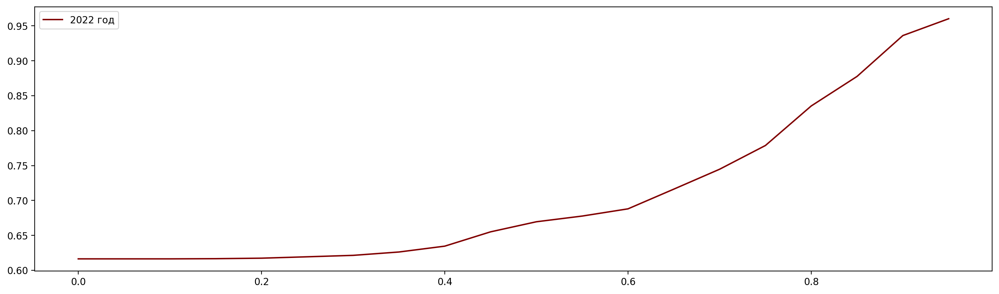

In [141]:
colors = {2009: "black", 2010: "grey", 2011: "brown", 2012: 'red', 2013: 'orange', 
         2014: 'green', 2015: 'olive', 2016: 'magenta', 2017: 'yellow', 2018: 'purple',
         2019: 'darkblue', 2020: 'blue', 2021: 'cyan', 2022: 'maroon'}
for i in range (2014, 2022):
    train = s[s.index.year <= i]
    test = s[s.index.year == i + 1]
    X_train = train.drop(columns=['value'])
    X_test = test.drop(columns=['value'])
    y_train = train['value']
    y_test = test['value']
    t0 = time.time()
    lr_model = MLPClassifier(activation='tanh', random_state=42)
    lr_model.fit(X_train, y_train)


    lr_y = y_test.values

    lr_y_pred = lr_model.predict_proba(X_test)
    tF = time.time()


    lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
    print(str(i+1))
    print('roc_auc = %.2f' % lr_rocauc)
    print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
    probs_val = lr_y_pred[:,1]
    precision = []
    for j in np.arange(0,1,0.05):
        
        cl = (probs_val > j).astype(int)
        precision.append(precision_score(y_test, cl))
        
        
    color = colors[i+1]
    plt.plot(np.arange(0,1,0.05), precision, color=color, label=f'{i+1} год')
    plt.legend()
    plt.show()
      

2015
roc_auc = 0.58
Time to train = 24.93 seconds


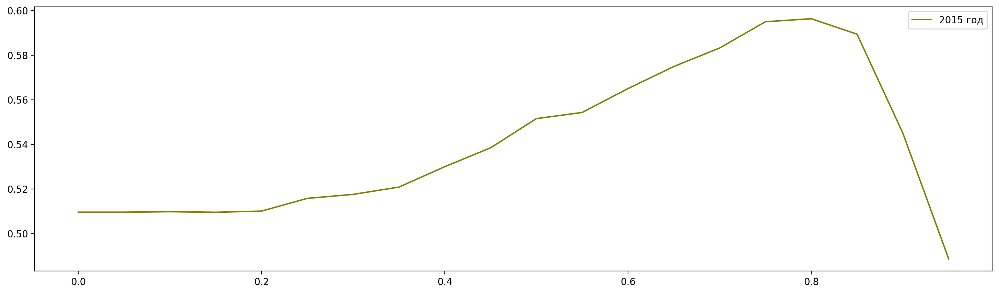

2016
roc_auc = 0.56
Time to train = 32.67 seconds


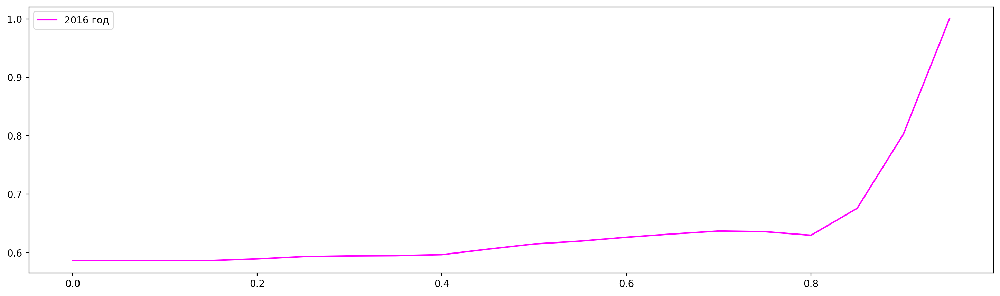

2017
roc_auc = 0.66
Time to train = 42.47 seconds


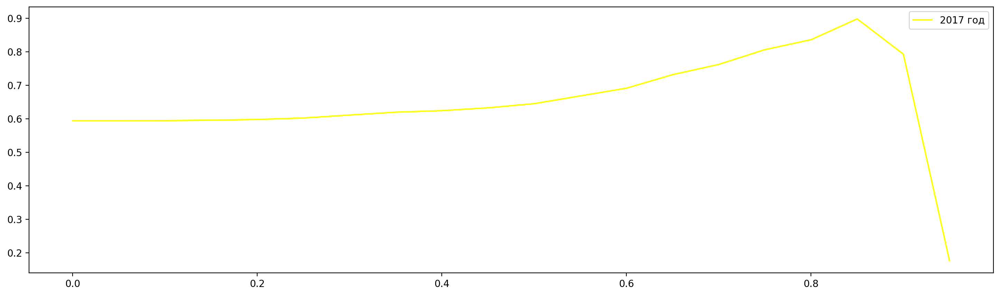

2018
roc_auc = 0.64
Time to train = 51.47 seconds


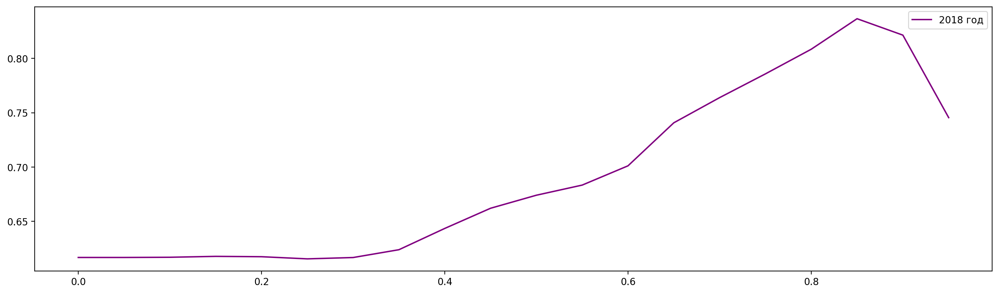

2019
roc_auc = 0.68
Time to train = 61.65 seconds


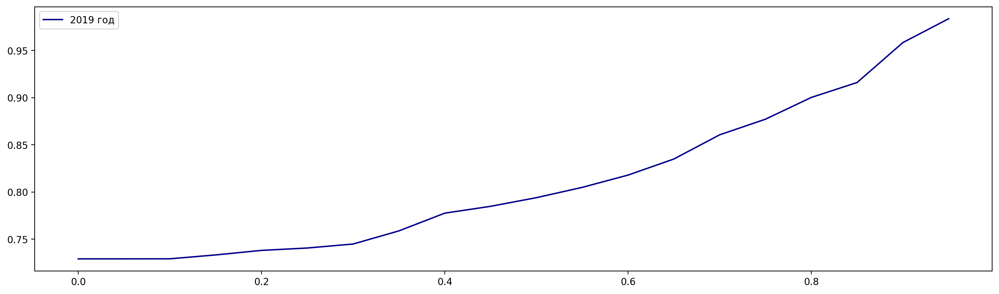

2020
roc_auc = 0.59
Time to train = 71.07 seconds


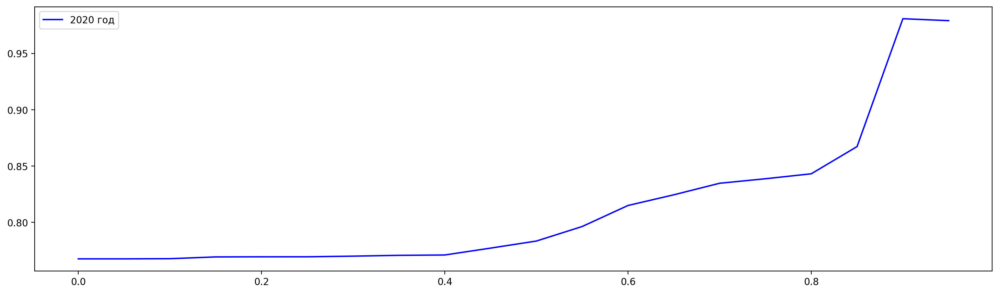

2021
roc_auc = 0.61
Time to train = 78.91 seconds


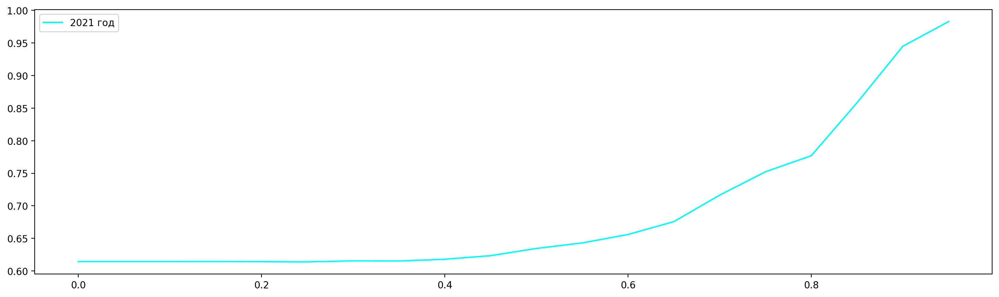

2022
roc_auc = 0.70
Time to train = 88.48 seconds


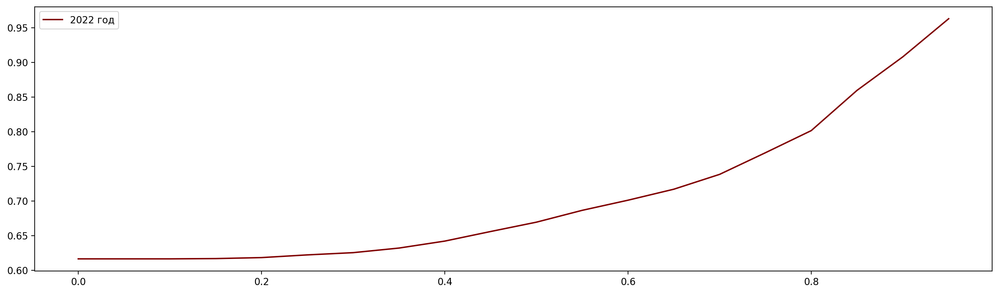

In [145]:
colors = {2009: "black", 2010: "grey", 2011: "brown", 2012: 'red', 2013: 'orange', 
         2014: 'green', 2015: 'olive', 2016: 'magenta', 2017: 'yellow', 2018: 'purple',
         2019: 'darkblue', 2020: 'blue', 2021: 'cyan', 2022: 'maroon'}
for i in range (2014, 2022):
    train = s[s.index.year <= i]
    test = s[s.index.year == i + 1]
    X_train = train.drop(columns=['value'])
    X_test = test.drop(columns=['value'])
    y_train = train['value']
    y_test = test['value']
    t0 = time.time()
    lr_model = MLPClassifier(activation='tanh', random_state=42)
    lr_model.fit(X_train, y_train)


    lr_y = y_test.values

    lr_y_pred = lr_model.predict_proba(X_test)
    tF = time.time()


    lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
    print(str(i+1))
    print('roc_auc = %.2f' % lr_rocauc)
    print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
    probs_val = lr_y_pred[:,1]
    precision = []
    for j in np.arange(0,1,0.05):
        
        cl = (probs_val > j).astype(int)
        precision.append(precision_score(y_test, cl))
    color = colors[i+1]
    plt.plot(np.arange(0,1,0.05), precision, color=color, label=f'{i+1} год')
    plt.legend()
    plt.show()
    

In [156]:
from sklearn.preprocessing import StandardScaler
for_std = s.columns[3:-1]

data1 = s[for_std]
std_scaler = StandardScaler()
std_scaler.fit(data1)
std_scaled = std_scaler.transform(data1)
counts_new = [f'{el}_std' for el in for_std]
s[counts_new] = std_scaled
s.drop(columns=for_std)
s.head()

,Div,Month,MC,volumeRatio 2.000,volumeRatio 3.000,volumeRatio 4.000,volumeRatio 5.000,volumeRatio 6.000,volumeRatio 7.000,volumeRatio 8.000,...,deltaClose 12.000_std,deltaClose 13.000_std,deltaClose 14.000_std,deltaClose 15.000_std,deltaClose 16.000_std,deltaClose 17.000_std,deltaClose 18.000_std,deltaClose 19.000_std,deltaClose 20.000_std,deltaClose 21.000_std
Date/Time,,,,,,,,,,,,,,,,,,,,,
2013-02-01,0,4,3,75.68,112.08,93.53,315.65,101.13,121.57,306.18,...,-0.05,-0.02,0.03,0.08,0.09,0.11,0.04,-0.01,0.18,0.21
2013-02-04,0,4,3,58.43,75.68,112.08,93.53,315.65,101.13,121.57,...,-0.13,-0.04,-0.02,0.03,0.08,0.09,0.11,0.04,-0.01,0.17
2013-02-05,0,4,3,59.60,58.43,75.68,112.08,93.53,315.65,101.13,...,-0.21,-0.16,-0.08,-0.05,-0.00,0.05,0.06,0.07,0.01,-0.03
2013-02-06,0,4,3,94.38,59.60,58.43,75.68,112.08,93.53,315.65,...,-0.06,-0.21,-0.17,-0.08,-0.06,-0.01,0.04,0.05,0.06,0.00
2013-02-07,0,4,3,60.87,94.38,59.60,58.43,75.68,112.08,93.53,...,0.07,-0.08,-0.23,-0.18,-0.11,-0.08,-0.04,0.01,0.02,0.04


2022
roc_auc = 0.73
Time to train = 106.25 seconds
максимальная точность 0.9604743083003953


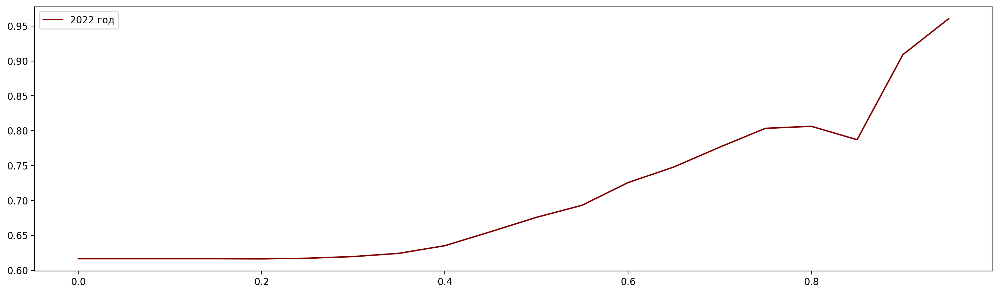

In [33]:
# загрузим данные

s = pd.read_csv(
    'div_abs1.csv', 
    index_col=1, 
    parse_dates=True, 
    squeeze=True)
s.fillna(0, inplace=True)
s.drop(columns=['Ticker', 'MC'], inplace=True)
# s = s[s['MC'] > 0]
for_std = ['Div', 'Nday', 'Month']

data1 = s[for_std]
std_scaler = MinMaxScaler()
std_scaler.fit(data1)
std_scaled = std_scaler.transform(data1)
counts_new = [f'{el}_std' for el in for_std]
s[counts_new] = std_scaled
s.drop(columns=for_std, inplace=True)




colors = {2009: "black", 2010: "grey", 2011: "brown", 2012: 'red', 2013: 'orange', 
         2014: 'green', 2015: 'olive', 2016: 'magenta', 2017: 'yellow', 2018: 'purple',
         2019: 'darkblue', 2020: 'blue', 2021: 'cyan', 2022: 'maroon'}
for i in range (2021, 2022):
    train = s[(s.index.year <= i) ]
    test = s[s.index.year == i + 1]
    X_train = train.drop(columns=['value'])
    X_test = test.drop(columns=['value'])
    y_train = train['value']
    y_test = test['value']
    t0 = time.time()
    lr_model = MLPClassifier(activation='tanh', random_state=42, hidden_layer_sizes=140)
    lr_model.fit(X_train, y_train)


    lr_y = y_test.values

    lr_y_pred = lr_model.predict_proba(X_test)
    tF = time.time()


    lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
    print(str(i+1))
    print('roc_auc = %.2f' % lr_rocauc)
    print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
    probs_val = lr_y_pred[:,1]
    precision = []
    max_prec = 0
    for j in np.arange(0,1,0.05):
        
        cl = (probs_val > j).astype(int)
        precision.append(precision_score(y_test, cl))
        
        if (precision_score(y_test, cl) > max_prec):
            max_prec = precision_score(y_test, cl)
    print(f'максимальная точность {max_prec}')
    color = colors[i+1]
    plt.plot(np.arange(0,1,0.05), precision, color=color, label=f'{i+1} год')
    plt.legend()
    plt.show()

2013
roc_auc = 0.68
Time to train = 7.29 seconds
максимальная точность 1.0


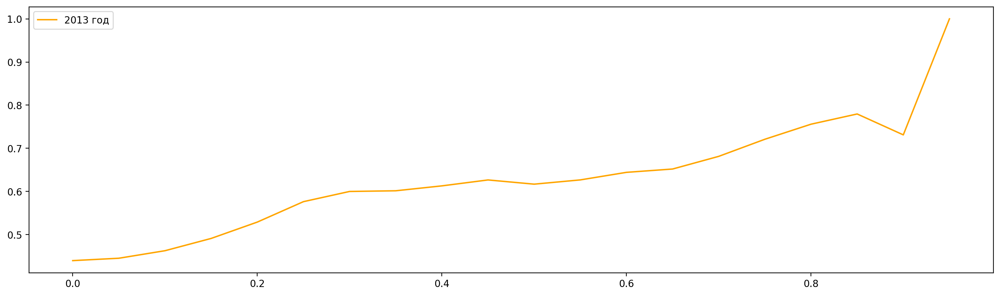

2014
roc_auc = 0.45
Time to train = 13.85 seconds
максимальная точность 0.684964200477327


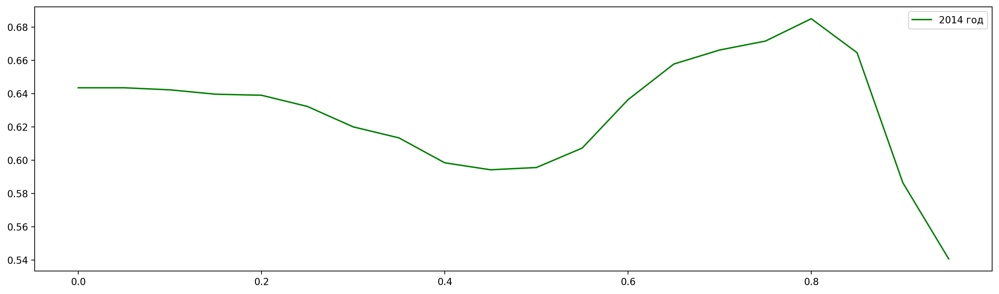

2015
roc_auc = 0.58
Time to train = 20.04 seconds
максимальная точность 0.78125


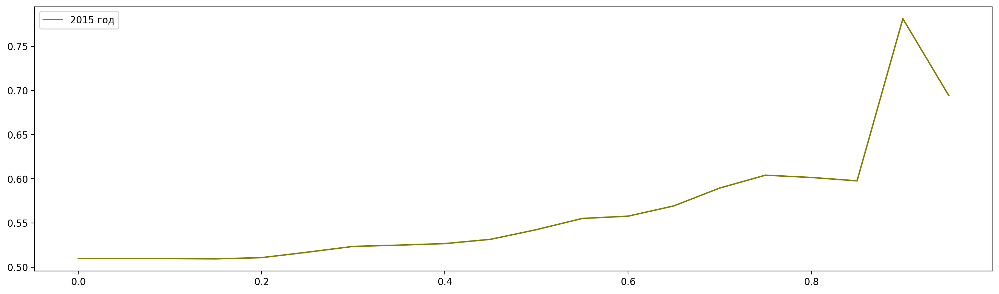

2016
roc_auc = 0.61
Time to train = 14.31 seconds
максимальная точность 0.8181818181818182


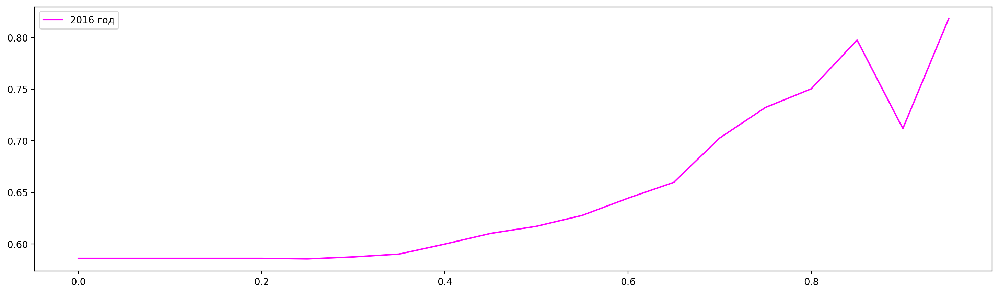

2017
roc_auc = 0.70
Time to train = 28.64 seconds
максимальная точность 0.9459459459459459


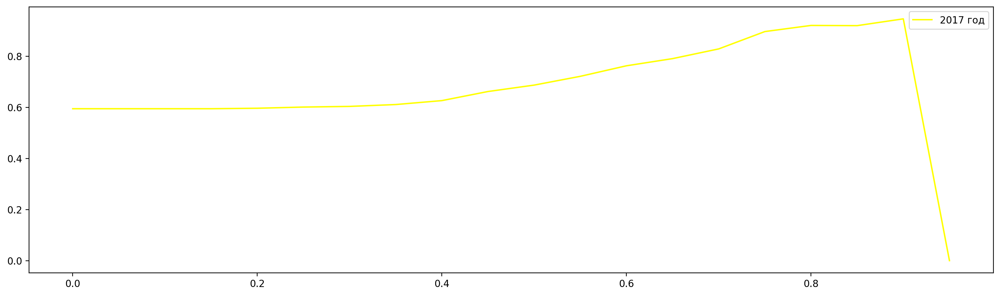

2018
roc_auc = 0.64
Time to train = 21.43 seconds
максимальная точность 0.8316831683168316


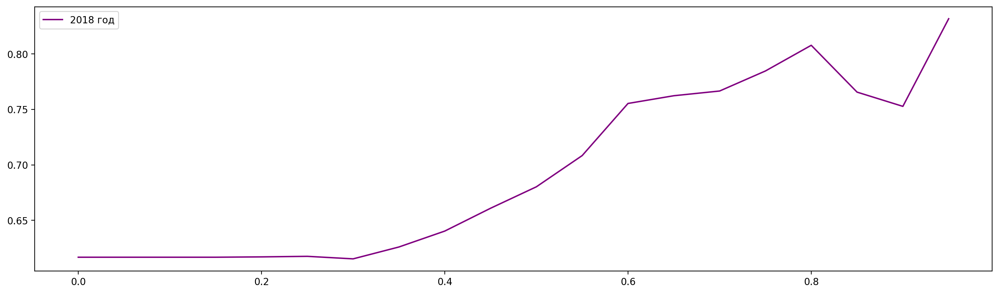

2019
roc_auc = 0.64
Time to train = 32.48 seconds
максимальная точность 0.9806451612903225


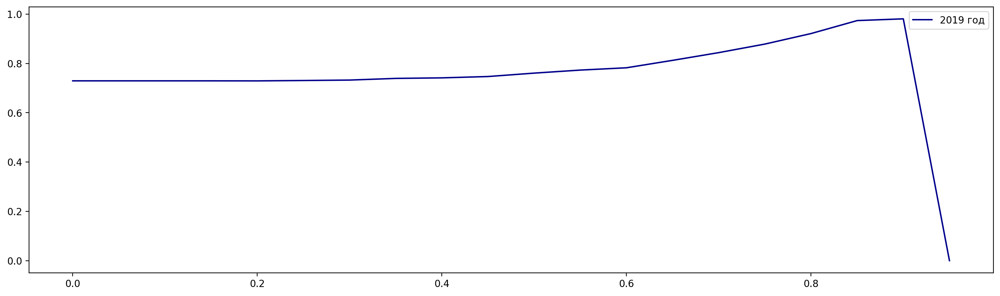

2020
roc_auc = 0.63
Time to train = 14.89 seconds
максимальная точность 1.0


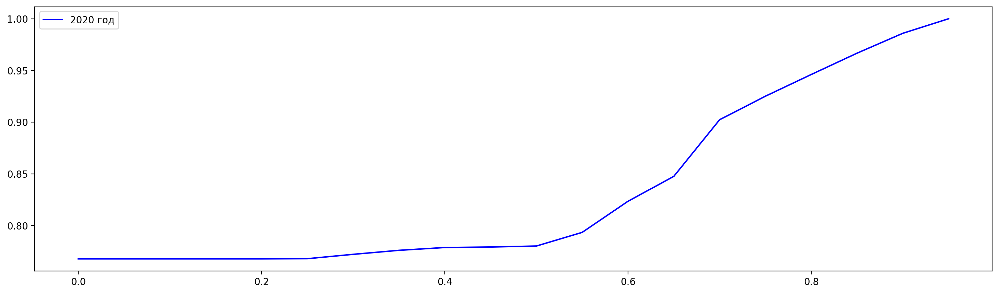

2021
roc_auc = 0.56
Time to train = 32.83 seconds
максимальная точность 0.9910714285714286


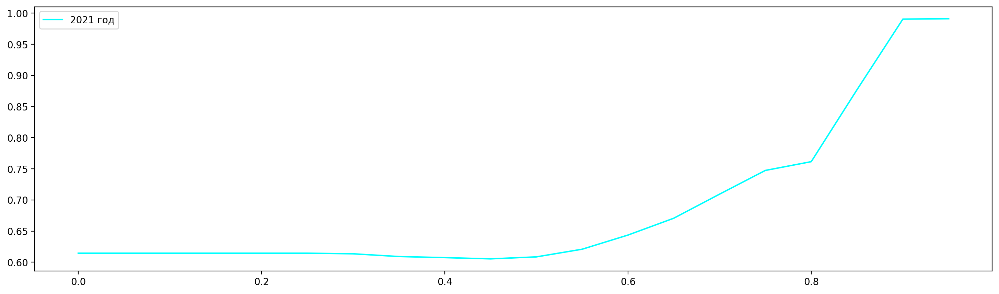

2022
roc_auc = 0.76
Time to train = 27.03 seconds
максимальная точность 0.989041095890411


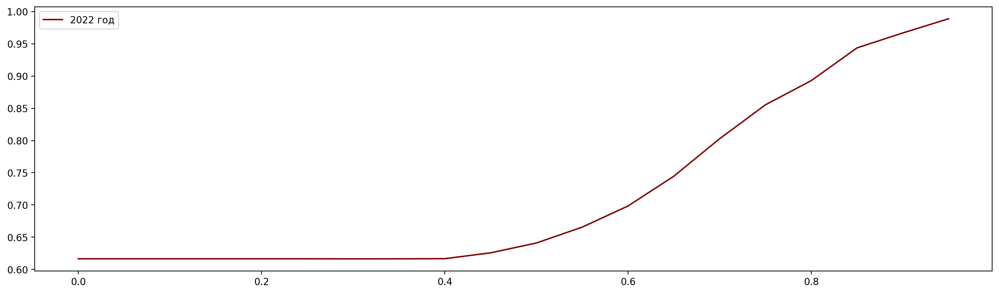

In [19]:
s = pd.read_csv(
    'div3.csv', 
    index_col=1, 
    parse_dates=True, 
    squeeze=True)
s.fillna(0, inplace=True)
s.drop(columns=['Ticker', 'MC'], inplace=True)




colors = {2009: "black", 2010: "grey", 2011: "brown", 2012: 'red', 2013: 'orange', 
         2014: 'green', 2015: 'olive', 2016: 'magenta', 2017: 'yellow', 2018: 'purple',
         2019: 'darkblue', 2020: 'blue', 2021: 'cyan', 2022: 'maroon'}
for i in range (2012, 2022):
    train = s[(s.index.year <= i) & (s.index.year >= 2012)]
    test = s[s.index.year == i + 1]
    X_train = train.drop(columns=['value'])
    X_test = test.drop(columns=['value'])
    y_train = train['value']
    y_test = test['value']
    t0 = time.time()
    lr_model = MLPClassifier(activation='tanh', random_state=42, hidden_layer_sizes=140)
    lr_model.fit(X_train, y_train)


    lr_y = y_test.values

    lr_y_pred = lr_model.predict_proba(X_test)
    tF = time.time()


    lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
    print(str(i+1))
    print('roc_auc = %.2f' % lr_rocauc)
    print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
    probs_val = lr_y_pred[:,1]
    precision = []
    max_prec = 0
    for j in np.arange(0,1,0.05):
        
        cl = (probs_val > j).astype(int)
        precision.append(precision_score(y_test, cl))
        
        if (precision_score(y_test, cl) > max_prec):
            max_prec = precision_score(y_test, cl)
    print(f'максимальная точность {max_prec}')
    color = colors[i+1]
    plt.plot(np.arange(0,1,0.05), precision, color=color, label=f'{i+1} год')
    plt.legend()
    plt.show()

2020
roc_auc = 0.45
Time to train = 164.73 seconds
максимальная точность 0.7777777777777778


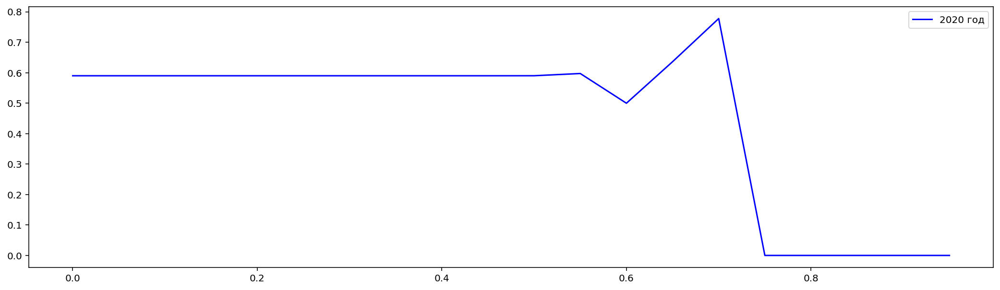

In [5]:
s = pd.read_csv(
    'div3.csv', 
    index_col=1, 
    parse_dates=True, 
    squeeze=True)
s.fillna(0, inplace=True)
s.drop(columns=['Ticker'], inplace=True)

for_std = ['Div', 'Nday', 'Month']

data1 = s[for_std]
std_scaler = MinMaxScaler()
std_scaler.fit(data1)
std_scaled = std_scaler.transform(data1)
counts_new = [f'{el}_std' for el in for_std]
s[counts_new] = std_scaled
s.drop(columns=for_std, inplace=True)


colors = {2009: "black", 2010: "grey", 2011: "brown", 2012: 'red', 2013: 'orange', 
         2014: 'green', 2015: 'olive', 2016: 'magenta', 2017: 'yellow', 2018: 'purple',
         2019: 'darkblue', 2020: 'blue', 2021: 'cyan', 2022: 'maroon'}
for i in range (2019, 2020):
    train = s[(s.index.year <= i) & (s.index.year >= 2012)]
    test = s[s.index.year == i + 1]
    X_train = train.drop(columns=['value'])
    X_test = test.drop(columns=['value'])
    y_train = train['value']
    y_test = test['value']
    t0 = time.time()
    lr_model = MLPClassifier(activation='tanh', random_state=42, hidden_layer_sizes=140)
    lr_model.fit(X_train, y_train)


    lr_y = y_test.values

    lr_y_pred = lr_model.predict_proba(X_test)
    tF = time.time()


    lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
    print(str(i+1))
    print('roc_auc = %.2f' % lr_rocauc)
    print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
    probs_val = lr_y_pred[:,1]
    precision = []
    max_prec = 0
    for j in np.arange(0,1,0.05):
        
        cl = (probs_val > j).astype(int)
        precision.append(precision_score(y_test, cl))
        
        if (precision_score(y_test, cl) > max_prec):
            max_prec = precision_score(y_test, cl)
    print(f'максимальная точность {max_prec}')
    color = colors[i+1]
    plt.plot(np.arange(0,1,0.05), precision, color=color, label=f'{i+1} год')
    plt.legend()
    plt.show()

In [52]:
s

,value,Div_std,Nday_std,Month_std,MC_std
Date/Time,,,,,
2013-02-01,1,0.00,1.00,0.27,0.50
2013-02-04,1,0.00,0.98,0.27,0.50
2013-02-05,1,0.00,0.97,0.27,0.50
2013-02-06,1,0.00,0.95,0.27,0.50
2013-02-07,1,0.00,0.93,0.27,0.50
...,...,...,...,...,...
2021-04-15,1,0.00,0.07,0.27,0.83
2021-04-16,1,0.00,0.05,0.27,0.83
2021-04-19,1,0.00,0.03,0.27,0.83


In [372]:
features = X_train.columns
importances = lr_model.feature_importances_
indices = np.argsort(importances)

plt.title('Feature Importances Forest')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

AttributeError: 'BaggingClassifier' object has no attribute 'feature_importances_'

In [349]:
s

,Div,Month,MC,MA30,RSI5,RSI30,value
Date/Time,,,,,,,
2013-02-01,0,4,3,3.03,59.05,63.06,1
2013-02-04,0,4,3,2.56,52.88,62.31,1
2013-02-05,0,4,3,2.33,52.53,62.27,1
2013-02-06,0,4,3,1.91,47.17,61.72,1
2013-02-07,0,4,3,2.35,63.93,62.96,1
...,...,...,...,...,...,...,...
2016-06-23,10,6,1,-2.18,41.66783,48.78,0
2016-06-24,10,6,1,-3.22,31.20416,44.67,0
2016-06-27,10,6,1,3.55,75.87820,63.46,0


In [43]:
# загрузим данные
s = pd.read_csv(
    'div3.csv', 
    index_col=1, 
    parse_dates=True, 
    squeeze=True)
s.fillna(0, inplace=True)
s.drop(columns=['Ticker'], inplace=True)

for_std = ['Div', 'Month', 'MC', 'Nday']

data1 = s[for_std]
std_scaler = MinMaxScaler()
std_scaler.fit(data1)
std_scaled = std_scaler.transform(data1)

s.drop(columns=for_std, inplace=True)
s[for_std] = std_scaled




train = s[(s.index.year <= 2022)]

X_train = train.drop(columns=['value'])
X_test = test_.drop(columns=['Ticker'])
y_train = train['value']


lr_model = MLPClassifier(activation='tanh', random_state=42, hidden_layer_sizes=140)
lr_model.fit(X_train, y_train)


lr_y = y_test.values

lr_y_pred = lr_model.predict_proba(X_test)





In [39]:
test = pd.read_csv('D:\\Мои документы\\Дивиденд\\1.csv')
test

,Ticker,Div,Month,MC
0,PHOR,6.52,4,5
1,NKNCP,14.59,4,3
2,NKNC,10.98,4,5
3,TTLK,7.61,4,3
4,KAZTP,5.35,5,2
...,...,...,...,...
97,RASP,13.57,10,5
98,TATNP,7.43,10,4
99,TATN,6.40,10,5
100,GAZP,6.80,10,6


In [40]:
test_ = test.copy()
nday = np.arange(1,61)
n = 0
while n < 59:
    n += 1
    test_ = test_.append(test, ignore_index = True )
    
k = 0
while k < 101:
    k += 1
    
    nday = np.append(nday,np.arange(1,61))
    

test_['Nday'] = np.sort(nday)
test_

,Ticker,Div,Month,MC,Nday
0,PHOR,6.52,4,5,1
1,NKNCP,14.59,4,3,1
2,NKNC,10.98,4,5,1
3,TTLK,7.61,4,3,1
4,KAZTP,5.35,5,2,1
...,...,...,...,...,...
6115,RASP,13.57,10,5,60
6116,TATNP,7.43,10,4,60
6117,TATN,6.40,10,5,60
6118,GAZP,6.80,10,6,60


In [401]:
test_.drop(columns=['Ticker'], inplace=True)
test_

,Div,Month,MC,Nday
0,6.52,4,5,1
1,14.59,4,3,1
2,10.98,4,5,1
3,7.61,4,3,1
4,5.35,5,2,1
...,...,...,...,...
6115,13.57,10,5,60
6116,7.43,10,4,60
6117,6.40,10,5,60
6118,6.80,10,6,60


In [44]:
probs_val = lr_y_pred[:,1]
result = test_.copy()
result['predict'] = probs_val
result

,Ticker,Div,Month,MC,Nday,predict
0,PHOR,6.52,4,5,1,0.14
1,NKNCP,14.59,4,3,1,0.79
2,NKNC,10.98,4,5,1,0.53
3,TTLK,7.61,4,3,1,0.65
4,KAZTP,5.35,5,2,1,0.58
...,...,...,...,...,...,...
6115,RASP,13.57,10,5,60,0.40
6116,TATNP,7.43,10,4,60,0.20
6117,TATN,6.40,10,5,60,0.20
6118,GAZP,6.80,10,6,60,0.20


In [45]:
result.to_csv('predict_div_ml_3.csv')

In [444]:
test_new = test_.drop(columns=['Ticker', 'MC'])
test_new

,Div,Month,Nday
0,6.52,4,1
1,14.59,4,1
2,10.98,4,1
3,7.61,4,1
4,5.35,5,1
...,...,...,...
6115,13.57,10,60
6116,7.43,10,60
6117,6.40,10,60
6118,6.80,10,60


In [15]:
df = pd.read_csv('D:\\Michael\\Data\\Include valuation in Ratings\\all_data_gv.csv')
df

,symbol_id,update_date,market_cap_type,growth_value_type,growth_value_rank,growth_rank_to_value_rank_ratio
0,8168337,2022-01-27,1,1,1,0.00
1,14952,2022-01-27,1,1,2,0.01
2,7372689,2022-01-27,1,1,3,0.02
3,24960118,2022-01-27,1,1,4,0.02
4,5412535,2022-01-27,1,1,5,0.03
...,...,...,...,...,...,...
5515444,22090,2023-03-10,3,2,639,53.67
5515445,19951,2023-03-10,3,2,640,70.33
5515446,16582045,2023-03-10,3,2,641,127.50
5515447,4653911,2023-03-10,3,2,642,181.50


In [11]:
df_s = pd.read_csv('D:\\Michael\\Data\\Include valuation in Ratings\\Symbols.csv')
df_s

,symbol_id,Ticker
0,32688420,ADV
1,21211294,REVG
2,20149727,YUMC
3,7372689,HMST
4,43133416,FPAC
...,...,...
2446,13140,GAIN
2447,2696,DXR
2448,9697557,MIXT
2449,17658,SRDX


In [16]:
df = df.merge(df_s, how='left')
df

,symbol_id,update_date,market_cap_type,growth_value_type,growth_value_rank,growth_rank_to_value_rank_ratio,Ticker
0,8168337,2022-01-27,1,1,1,0.00,FRG
1,14952,2022-01-27,1,1,2,0.01,CASH
2,7372689,2022-01-27,1,1,3,0.02,HMST
3,24960118,2022-01-27,1,1,4,0.02,VCTR
4,5412535,2022-01-27,1,1,5,0.03,AOSL
...,...,...,...,...,...,...,...
5515444,22090,2023-03-10,3,2,639,53.67,TSN
5515445,19951,2023-03-10,3,2,640,70.33,ET
5515446,16582045,2023-03-10,3,2,641,127.50,HPE
5515447,4653911,2023-03-10,3,2,642,181.50,GM


In [17]:
df['Ticker'] = df['Ticker'] + '_GV'
df

,symbol_id,update_date,market_cap_type,growth_value_type,growth_value_rank,growth_rank_to_value_rank_ratio,Ticker
0,8168337,2022-01-27,1,1,1,0.00,FRG_GV
1,14952,2022-01-27,1,1,2,0.01,CASH_GV
2,7372689,2022-01-27,1,1,3,0.02,HMST_GV
3,24960118,2022-01-27,1,1,4,0.02,VCTR_GV
4,5412535,2022-01-27,1,1,5,0.03,AOSL_GV
...,...,...,...,...,...,...,...
5515444,22090,2023-03-10,3,2,639,53.67,TSN_GV
5515445,19951,2023-03-10,3,2,640,70.33,ET_GV
5515446,16582045,2023-03-10,3,2,641,127.50,HPE_GV
5515447,4653911,2023-03-10,3,2,642,181.50,GM_GV


In [18]:
df.to_csv('D:\\Michael\\Data\\Include valuation in Ratings\\GV.csv', index=False)

In [19]:
df_sr = pd.read_csv('D:\\Michael\\Data\\Include valuation in Ratings\\SmithRank.csv')
df_sr

,Ticker,Date/Time,SmithRank
0,A,11/18/1999,NaN
1,A,11/19/1999,NaN
2,A,11/22/1999,NaN
3,A,11/23/1999,NaN
4,A,11/24/1999,NaN
...,...,...,...
11848462,ZWS,3/2/2023,585.34
11848463,ZWS,3/3/2023,586.34
11848464,ZWS,3/6/2023,587.34
11848465,ZWS,3/7/2023,588.34


In [20]:
df_sr['Ticker'] = df_sr['Ticker'] + '_SR'
df_sr

,Ticker,Date/Time,SmithRank
0,A_SR,11/18/1999,NaN
1,A_SR,11/19/1999,NaN
2,A_SR,11/22/1999,NaN
3,A_SR,11/23/1999,NaN
4,A_SR,11/24/1999,NaN
...,...,...,...
11848462,ZWS_SR,3/2/2023,585.34
11848463,ZWS_SR,3/3/2023,586.34
11848464,ZWS_SR,3/6/2023,587.34
11848465,ZWS_SR,3/7/2023,588.34


In [21]:
df_sr.to_csv('D:\\Michael\\Data\\Include valuation in Ratings\\SmithRank.csv', index=False)

In [76]:
S['Date/Time'] = S['Date/Time'].astype('datetime64')
S

,Ticker,Date/Time,PriceClose,PricePercentChange1Day,PricePercentChange1Week,PricePercentChange4Week,PricePercentChange26Week,PricePercentChange52Week,PricePercentChangeYTD,Beta1Year,...,Name_Specialized REITs,Name_Specialty Chemicals,Name_Specialty Mining & Metals,Name_Steel,Name_Tires & Rubber Products,Name_Tobacco,Name_Toys & Juvenile Products,Name_Water Utilities,Name_Wireless Telecommunications Services,value
566,HOLX,2016-03-29,34.50,-0.00,-0.01,-0.03,-0.09,0.04,-0.09,0.91,...,0,0,0,0,0,0,0,0,0,0.00
567,HOLX,2016-03-30,34.50,0.00,0.01,-0.04,-0.12,0.06,-0.09,0.91,...,0,0,0,0,0,0,0,0,0,1.00
568,HOLX,2016-03-31,34.50,0.00,0.00,-0.04,-0.12,0.05,-0.09,0.91,...,0,0,0,0,0,0,0,0,0,0.00
569,HOLX,2016-09-28,38.73,-0.00,0.01,0.01,0.12,-0.01,0.00,1.05,...,0,0,0,0,0,0,0,0,0,1.00
570,HOLX,2016-09-29,38.14,-0.02,-0.02,-0.01,0.11,-0.02,-0.01,1.02,...,0,0,0,0,0,0,0,0,0,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1173160,XEL,2022-11-17,68.32,0.01,0.04,0.12,-0.09,0.05,0.01,0.47,...,0,0,0,0,0,0,0,0,0,1.00
1173161,XEL,2022-11-18,67.14,-0.02,-0.03,0.12,-0.10,0.04,-0.01,0.47,...,0,0,0,0,0,0,0,0,0,0.00
1173163,XEL,2022-11-22,68.68,0.00,0.03,0.12,-0.08,0.04,0.01,0.48,...,0,0,0,0,0,0,0,0,0,0.00
1173164,XEL,2022-11-23,68.85,0.00,0.02,0.10,-0.10,0.05,0.02,0.48,...,0,0,0,0,0,0,0,0,0,0.00


2022
roc_auc = 0.62
Time to train = 193.76 seconds
max precision 0.9403669724770642


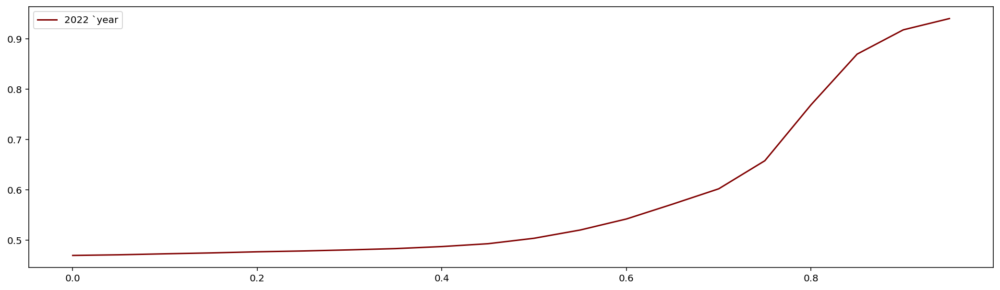

In [77]:





colors = {2014: 'green', 2015: 'olive', 2016: 'magenta', 2017: 'yellow', 2018: 'purple',
         2019: 'red', 2020: 'blue', 2021: 'cyan', 2022: 'maroon'}
for i in range (2021, 2022):
    train = S[(S['Date/Time'].dt.year <= i)]
    test = S[S['Date/Time'].dt.year == i+1]
    train = train.drop(columns=['Ticker', 'Date/Time'])
    test = test.drop(columns=['Ticker', 'Date/Time'])
    X_train = train.drop(columns=['value'])
    X_test = test.drop(columns=['value'])
    y_train = train['value']
    y_test = test['value']
    
    std_scaler = MinMaxScaler()
    std_scaler.fit(X_train)
    std_scaled = std_scaler.transform(X_train)
    std_scaled_test = std_scaler.transform(X_test)
    X_train[X_train.columns] = std_scaled
    X_test[X_test.columns] = std_scaled_test
    
    
    t0 = time.time()
    lr_model = RandomForestClassifier(random_state=42)
    lr_model.fit(X_train, y_train)


    lr_y = y_test.values

    lr_y_pred = lr_model.predict_proba(X_test)
    tF = time.time()


    lr_rocauc = roc_auc_score(y_test, lr_y_pred[:,1])
    print(str(i+1))
    print('roc_auc = %.2f' % lr_rocauc)
    print('Time to train = %.2f seconds' % (tF - t0))## RMSE = 3.84
    probs_val = lr_y_pred[:,1]
    precision = []
    max_prec = 0
    for j in np.arange(0,1,0.05):
        
        cl = (probs_val > j).astype(int)
        precision.append(precision_score(y_test, cl))
        
        if (precision_score(y_test, cl) > max_prec):
            max_prec = precision_score(y_test, cl)
    print(f'max precision {max_prec}')
    color = colors[i+1]
    plt.plot(np.arange(0,1,0.05), precision, color=color, label=f'{i+1} `year')
    plt.legend()
    plt.show()

In [72]:
S = S[['Ticker', 'Date/Time', 'PriceClose', 'value']]
S

,Ticker,Date/Time,PriceClose,value
566,HOLX,2016-03-29,34.50,0.00
567,HOLX,2016-03-30,34.50,1.00
568,HOLX,2016-03-31,34.50,0.00
569,HOLX,2016-09-28,38.73,1.00
570,HOLX,2016-09-29,38.14,1.00
...,...,...,...,...
1173160,XEL,2022-11-17,68.32,1.00
1173161,XEL,2022-11-18,67.14,0.00
1173163,XEL,2022-11-22,68.68,0.00
1173164,XEL,2022-11-23,68.85,0.00


In [26]:
S.columns

Index(['Ticker', 'Date/Time', 'PricePercentChange1Day',
       'PricePercentChange1Week', 'PricePercentChange4Week',
       'PricePercentChange26Week', 'PricePercentChange52Week',
       'PricePercentChangeYTD', 'Beta1Year', 'Beta3Year', 'Beta5Year',
       'PriceEarningsAndTTM', 'PriceEarningsToGrowthAndTTM', 'PriceBookAndFY',
       'PriceRevenueAndTTM', 'PriceFreeCashFlowAndTTM',
       'EnterpriseValueEBITAndTTM', 'EarningsPerShareAndBasicAndTTM',
       'OperatingMarginPercentAndTTM', 'PretaxMarginPercentAndTTM',
       'AftertaxMarginPercentAndTTM', 'TaxRatePercentAndTTM',
       'ReturnOnAssetsPercentAndTTM', 'ReturnOnEquityPercentAndTTM',
       'FreeCashFlowReturnOnAssetsPercentAndTTM',
       'DegreeOfFinancialLeverageAndTTM', 'DegreeOfOperationalLeverageAndTTM',
       'DegreeOfCombinedLeverageAndTTM', 'DebtToEquityAndFY',
       'DebtToAssetsAndFY', 'LongTermDebtToTotalCapitalAndFY',
       'RevenuePercentGrowthAndTTM', 'OperatingProfitPercentGrowthAndTTM',
       'NetIncom

In [30]:
# загрузим данные
import warnings
warnings.filterwarnings('ignore')
import time
import itertools
import datetime
from IPython.display import clear_output





percent_profit = pd.DataFrame(columns=['Ticker', 'Date/Time', 'PricePercentChange1Day',
       'PricePercentChange1Week', 'PricePercentChange4Week',
       'PricePercentChange26Week', 'PricePercentChange52Week',
       'PricePercentChangeYTD', 'Beta1Year', 'Beta3Year', 'Beta5Year',
       'PriceEarningsAndTTM', 'PriceEarningsToGrowthAndTTM', 'PriceBookAndFY',
       'PriceRevenueAndTTM', 'PriceFreeCashFlowAndTTM',
       'EnterpriseValueEBITAndTTM', 'EarningsPerShareAndBasicAndTTM',
       'OperatingMarginPercentAndTTM', 'PretaxMarginPercentAndTTM',
       'AftertaxMarginPercentAndTTM', 'TaxRatePercentAndTTM',
       'ReturnOnAssetsPercentAndTTM', 'ReturnOnEquityPercentAndTTM',
       'FreeCashFlowReturnOnAssetsPercentAndTTM',
       'DegreeOfFinancialLeverageAndTTM', 'DegreeOfOperationalLeverageAndTTM',
       'DegreeOfCombinedLeverageAndTTM', 'DebtToEquityAndFY',
       'DebtToAssetsAndFY', 'LongTermDebtToTotalCapitalAndFY',
       'RevenuePercentGrowthAndTTM', 'OperatingProfitPercentGrowthAndTTM',
       'NetIncomePercentGrowthAndTTM', 'AdjustedEBITPercentGrowthAndTTM',
       'FreeCashFlowPercentGrowthAndTTM',
       'OperatingCashFlowPercentGrowthAndTTM', 'PricePercentChange13Week',
       'Prediction'])
for j in range(2013,2022):
    clear_output(wait = True)
    print(f'{j+1} год')
    train = S[(S['Date/Time'].dt.year <= j)]
    test = S[S['Date/Time'].dt.year == j+1]
    X_test = test.drop(columns=['Ticker', 'value', 'Date/Time'])
    X_train = train.drop(columns=['value', 'Ticker', 'Date/Time'])
    y_train = train['value']



    std_scaler = MinMaxScaler()
    std_scaler.fit(X_train)
    X_train[X_train.columns] = std_scaler.transform(X_train)
    X_test[X_test.columns] = std_scaler.transform(X_test)




    lr_model = RandomForestClassifier(random_state=42)
    lr_model.fit(X_train, y_train)



    lr_y_pred = lr_model.predict_proba(X_test)
    probs_val = lr_y_pred[:,1]
    test['Ticker'] = test.Ticker + "_SP+F"
    test['Prediction'] = np.round(probs_val * 100, 4)
    test = test.drop(columns=['value'])
    percent_profit = percent_profit.append(test)

percent_profit.drop(columns=['PricePercentChange1Day',
       'PricePercentChange1Week', 'PricePercentChange4Week',
       'PricePercentChange26Week', 'PricePercentChange52Week',
       'PricePercentChangeYTD', 'Beta1Year', 'Beta3Year', 'Beta5Year',
       'PriceEarningsAndTTM', 'PriceEarningsToGrowthAndTTM', 'PriceBookAndFY',
       'PriceRevenueAndTTM', 'PriceFreeCashFlowAndTTM',
       'EnterpriseValueEBITAndTTM', 'EarningsPerShareAndBasicAndTTM',
       'OperatingMarginPercentAndTTM', 'PretaxMarginPercentAndTTM',
       'AftertaxMarginPercentAndTTM', 'TaxRatePercentAndTTM',
       'ReturnOnAssetsPercentAndTTM', 'ReturnOnEquityPercentAndTTM',
       'FreeCashFlowReturnOnAssetsPercentAndTTM',
       'DegreeOfFinancialLeverageAndTTM', 'DegreeOfOperationalLeverageAndTTM',
       'DegreeOfCombinedLeverageAndTTM', 'DebtToEquityAndFY',
       'DebtToAssetsAndFY', 'LongTermDebtToTotalCapitalAndFY',
       'RevenuePercentGrowthAndTTM', 'OperatingProfitPercentGrowthAndTTM',
       'NetIncomePercentGrowthAndTTM', 'AdjustedEBITPercentGrowthAndTTM',
       'FreeCashFlowPercentGrowthAndTTM',
       'OperatingCashFlowPercentGrowthAndTTM', 'PricePercentChange13Week'], inplace=True)
percent_profit.to_csv('D:\\Michael\\Data\\Trinity\\SPX_fundamental_probability.csv', index=False)
        
percent_profit
   

2022 год


KeyError: "['Month' 'MC' 'Business_Quality' 'Day_of_week' 'SMA' 'VQ' 'SmithRank'\n 'Trend'] not found in axis"

In [31]:
percent_profit.drop(columns=['PricePercentChange1Day',
       'PricePercentChange1Week', 'PricePercentChange4Week',
       'PricePercentChange26Week', 'PricePercentChange52Week',
       'PricePercentChangeYTD', 'Beta1Year', 'Beta3Year', 'Beta5Year',
       'PriceEarningsAndTTM', 'PriceEarningsToGrowthAndTTM', 'PriceBookAndFY',
       'PriceRevenueAndTTM', 'PriceFreeCashFlowAndTTM',
       'EnterpriseValueEBITAndTTM', 'EarningsPerShareAndBasicAndTTM',
       'OperatingMarginPercentAndTTM', 'PretaxMarginPercentAndTTM',
       'AftertaxMarginPercentAndTTM', 'TaxRatePercentAndTTM',
       'ReturnOnAssetsPercentAndTTM', 'ReturnOnEquityPercentAndTTM',
       'FreeCashFlowReturnOnAssetsPercentAndTTM',
       'DegreeOfFinancialLeverageAndTTM', 'DegreeOfOperationalLeverageAndTTM',
       'DegreeOfCombinedLeverageAndTTM', 'DebtToEquityAndFY',
       'DebtToAssetsAndFY', 'LongTermDebtToTotalCapitalAndFY',
       'RevenuePercentGrowthAndTTM', 'OperatingProfitPercentGrowthAndTTM',
       'NetIncomePercentGrowthAndTTM', 'AdjustedEBITPercentGrowthAndTTM',
       'FreeCashFlowPercentGrowthAndTTM',
       'OperatingCashFlowPercentGrowthAndTTM', 'PricePercentChange13Week'], inplace=True)
percent_profit.to_csv('D:\\Michael\\Data\\Trinity\\SPX_fundamental_probability.csv', index=False)
        
percent_profit

,Ticker,Date/Time,Prediction,Name_Advanced Medical Equipment & Technology,Name_Advertising & Marketing,Name_Aerospace & Defense,Name_Agricultural Chemicals,Name_Air Freight & Logistics,Name_Airlines,Name_Aluminum,...,Name_Software,Name_Specialized REITs,Name_Specialty Chemicals,Name_Specialty Mining & Metals,Name_Steel,Name_Tires & Rubber Products,Name_Tobacco,Name_Toys & Juvenile Products,Name_Water Utilities,Name_Wireless Telecommunications Services
603,DVN_SP+F,2014-01-02,92.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
604,DVN_SP+F,2014-01-03,94.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
605,DVN_SP+F,2014-01-06,90.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
606,DVN_SP+F,2014-01-07,86.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
607,DVN_SP+F,2014-01-08,90.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1184850,XEL_SP+F,2022-11-17,70.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1184851,XEL_SP+F,2022-11-18,69.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1184853,XEL_SP+F,2022-11-22,70.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
1184854,XEL_SP+F,2022-11-23,70.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [33]:
s1.columns

Index(['Ticker', 'Name', 'Date/Time', 'PricePercentChange1Day',
       'PricePercentChange1Week', 'PricePercentChange4Week',
       'PricePercentChange26Week', 'PricePercentChange52Week',
       'PricePercentChangeYTD', 'Beta1Year', 'Beta3Year', 'Beta5Year',
       'PriceEarningsAndTTM', 'PriceEarningsToGrowthAndTTM', 'PriceBookAndFY',
       'PriceRevenueAndTTM', 'PriceFreeCashFlowAndTTM',
       'EnterpriseValueEBITAndTTM', 'EarningsPerShareAndBasicAndTTM',
       'OperatingMarginPercentAndTTM', 'PretaxMarginPercentAndTTM',
       'AftertaxMarginPercentAndTTM', 'TaxRatePercentAndTTM',
       'ReturnOnAssetsPercentAndTTM', 'ReturnOnEquityPercentAndTTM',
       'FreeCashFlowReturnOnAssetsPercentAndTTM',
       'DegreeOfFinancialLeverageAndTTM', 'DegreeOfOperationalLeverageAndTTM',
       'DegreeOfCombinedLeverageAndTTM', 'DebtToEquityAndFY',
       'DebtToAssetsAndFY', 'LongTermDebtToTotalCapitalAndFY',
       'RevenuePercentGrowthAndTTM', 'OperatingProfitPercentGrowthAndTTM',
       '

In [33]:
S = s1.copy()

In [28]:
S['Date/Time'] = S['Date/Time'].astype('datetime64')

In [39]:
s.columns

Index(['Ticker', 'Date/Time', 'Month', 'MC', 'Business_Quality', 'Day_of_week',
       'SMA', 'VQ', 'SmithRank', 'Trend', 'value'],
      dtype='object')

In [40]:
S.drop(columns=['Month', 'MC', 'Business_Quality', 'Day_of_week',
       'SMA', 'VQ', 'SmithRank', 'Trend'], inplace=True)

In [42]:
S = S.dropna()
S

,Ticker,Date/Time,PricePercentChange1Day,PricePercentChange1Week,PricePercentChange4Week,PricePercentChange26Week,PricePercentChange52Week,PricePercentChangeYTD,Beta1Year,Beta3Year,...,DebtToAssetsAndFY,LongTermDebtToTotalCapitalAndFY,RevenuePercentGrowthAndTTM,OperatingProfitPercentGrowthAndTTM,NetIncomePercentGrowthAndTTM,AdjustedEBITPercentGrowthAndTTM,FreeCashFlowPercentGrowthAndTTM,OperatingCashFlowPercentGrowthAndTTM,PricePercentChange13Week,value
566,HOLX,2016-03-29,-0.00,-0.01,-0.03,-0.09,0.04,-0.09,0.91,0.64,...,0.47,0.57,0.07,0.48,2.62,0.36,0.66,0.55,-0.13,0.00
567,HOLX,2016-03-30,0.00,0.01,-0.04,-0.12,0.06,-0.09,0.91,0.64,...,0.47,0.57,0.07,0.48,2.62,0.36,0.66,0.55,-0.12,1.00
568,HOLX,2016-03-31,0.00,0.00,-0.04,-0.12,0.05,-0.09,0.91,0.64,...,0.47,0.57,0.07,0.48,2.62,0.36,0.66,0.55,-0.11,0.00
569,HOLX,2016-09-28,-0.00,0.01,0.01,0.12,-0.01,0.00,1.05,0.70,...,0.47,0.57,0.05,0.25,0.96,0.17,0.16,0.16,0.14,1.00
570,HOLX,2016-09-29,-0.02,-0.02,-0.01,0.11,-0.02,-0.01,1.02,0.70,...,0.47,0.57,0.05,0.25,0.96,0.17,0.16,0.16,0.10,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1184850,XEL,2022-11-17,0.01,0.04,0.12,-0.09,0.05,0.01,0.47,0.83,...,0.40,0.56,0.12,0.06,0.07,0.06,0.48,0.68,-0.11,1.00
1184851,XEL,2022-11-18,-0.02,-0.03,0.12,-0.10,0.04,-0.01,0.47,0.83,...,0.40,0.56,0.12,0.06,0.07,0.06,0.48,0.68,-0.13,0.00
1184853,XEL,2022-11-22,0.00,0.03,0.12,-0.08,0.04,0.01,0.48,0.83,...,0.40,0.56,0.12,0.06,0.07,0.06,0.48,0.68,-0.10,0.00
1184854,XEL,2022-11-23,0.00,0.02,0.10,-0.10,0.05,0.02,0.48,0.83,...,0.40,0.56,0.12,0.06,0.07,0.06,0.48,0.68,-0.09,0.00
